In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import os
import pandas as pd
from glob import glob
import random
import matplotlib.cm as cm
from input.init import model
from input.visualization import extract_min_max_price_metric, replace_nans_and_zeros,_create_heatmap_gamma_only,create_comparative_heatmaps_gl,extract_metric_data_gl, extract_metric_data

In [2]:
import os
from glob import glob

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def create_gamma_dependence_gl(
    results_dir,
    experiment_name="*",
    metric_name="Profit Gain",
    price_plot='none',
    figsize=(8, 6)
):
    """
    Traverses the same gamma_x_lambda_y directories, extracts your chosen metric,
    then for each gamma averages over all lambdas (and computes std), and finally
    calls _create_heatmap_gamma_only to plot metric vs gamma.

    Parameters
    ----------
    results_dir : str
        Base directory containing experiment subdirectories.
    experiment_name : str
        Pattern to match specific experiment folder(s).
    metric_name : str
        Which metric to extract (e.g. "Profit Gain", or "Price").
    price_plot : {'none','min','max'}
        If metric_name == "Price", choose whether to plot min or max price.
    figsize : tuple
        Passed on to the plotting helper.
    """

    # resolve and find all runs
    results_dir = os.path.abspath(results_dir)
    exp_dir = os.path.join(results_dir, experiment_name)
    pattern = "gamma_*_lambda_*"
    run_dirs = glob(os.path.join(exp_dir, pattern))
    if not run_dirs:
        raise ValueError(f"No run directories matching {pattern} in {exp_dir}")

    γ_vals, λ_vals = [], []
    metric_vals, min_prices, max_prices = [], [], []

    for run_dir in run_dirs:
        basename = os.path.basename(run_dir)
        try:
            γ = float(basename.split('gamma_')[1].split('_lambda_')[0])
            λ = float(basename.split('lambda_')[1].split('_')[0])
        except Exception:
            # skip malformed names
            continue

        stats_file = os.path.join(run_dir, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            continue

        df = pd.read_csv(stats_file)
        # pick correct metric columns
        if metric_name == 'mean_cycle_length':
            cols = [c for c in df.columns if c.startswith('mean_cycle_length')]
        else:
            key = metric_name.lower().replace(" ", "_")
            cols = [c for c in df.columns if c.startswith(f"mean_{key}_p")]

        if not cols:
            continue

        val = df[cols].mean(axis=1).iloc[0]
        γ_vals.append(γ)
        λ_vals.append(λ)
        metric_vals.append(val)

        # price extremes
        mn, mx = extract_min_max_price_metric(run_dir)
        min_prices.append(mn)
        max_prices.append(mx)

    if not γ_vals:
        raise ValueError("No valid data to process.")

    # If user asked for Price-min or Price-max, override metric_vals
    if metric_name == "Price" and price_plot in ('min','max'):
        metric_name = f"Price {'Min' if price_plot=='min' else 'Max'}"
        metric_vals = min_prices if price_plot=='min' else max_prices

    # Build a DataFrame and group by gamma
    df = pd.DataFrame({
        'gamma': γ_vals,
        'lambda': λ_vals,
        'value': metric_vals
    })
    grouped = df.groupby('gamma')['value'].agg(['mean','std']).reset_index()

    # now plot γ vs mean( value ) ± std
    fig = _create_heatmap_gamma_only(
        gamma_values=grouped['gamma'].tolist(),
        data_means=grouped['mean'].tolist(),
        data_stds=grouped['std'].tolist(),
        metric_name=metric_name,
        figsize=figsize
    )
    return fig


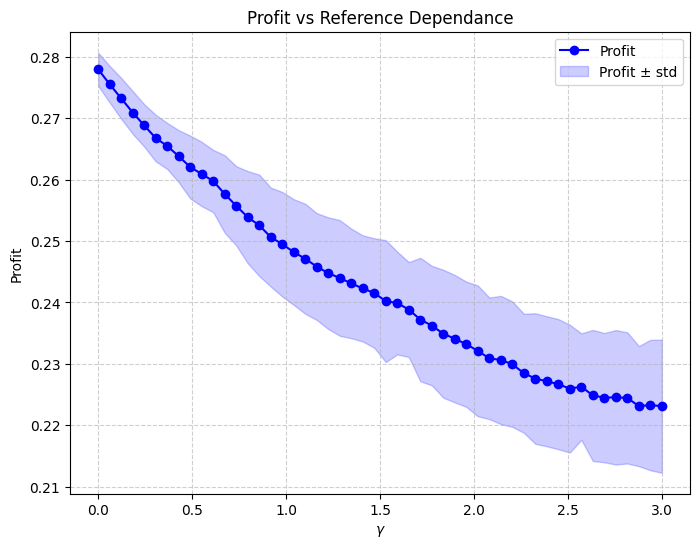

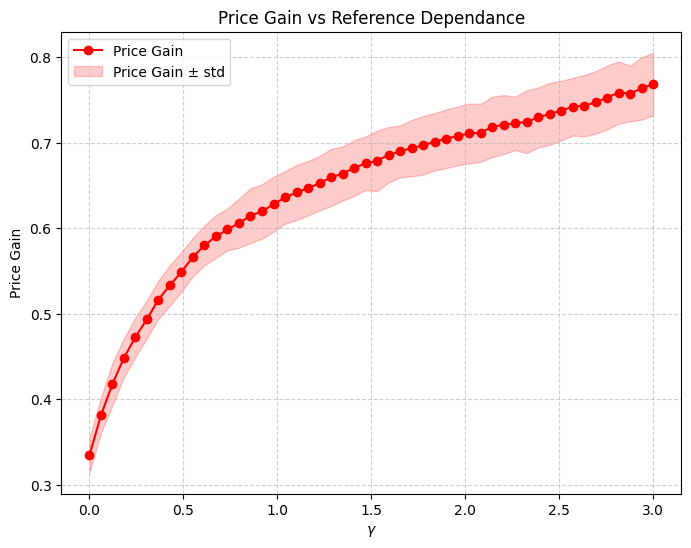

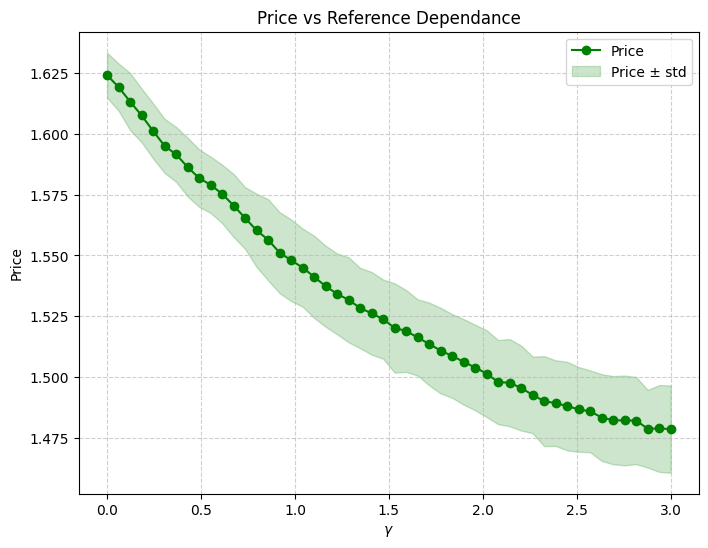

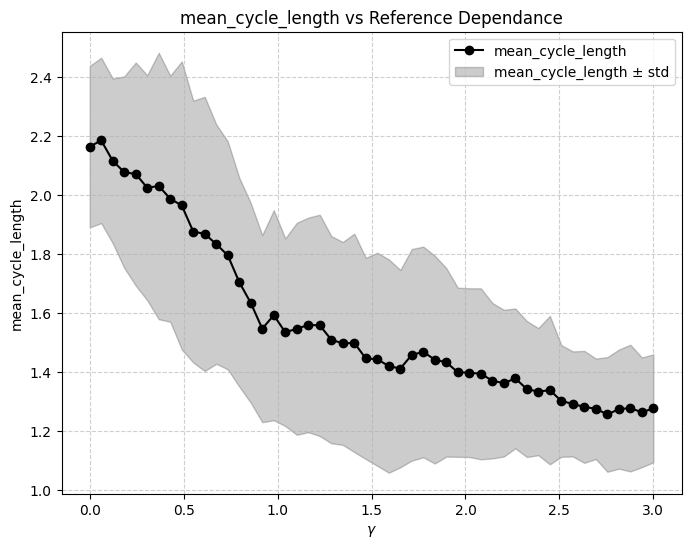

In [3]:
folder_location = "../Results_sockeye/experiments"
experiment_name =  "reference_impact_misspecification/gamma_lambda" + "_" + "reference"
fig_profit = create_gamma_dependence_gl(folder_location,  experiment_name=experiment_name, metric_name="Profit")
fig_price_gain = create_gamma_dependence_gl(folder_location, experiment_name=experiment_name, metric_name="Price Gain")
#fig_profit_gain = create_gamma_dependence_gl(folder_location, experiment_name=experiment_name, metric_name="Profit Gain")
fig_price = create_gamma_dependence_gl(folder_location, experiment_name=experiment_name, metric_name="Price")
fig_cycle = create_gamma_dependence_gl(folder_location, experiment_name=experiment_name, metric_name="mean_cycle_length")
#fig_price_min = create_gamma_dependence_gl(folder_location, experiment_name=experiment_name, metric_name="Price", price_plot = 'min')
#fig_price_max = create_gamma_dependence_gl(folder_location, experiment_name=experiment_name, metric_name="Price", price_plot = 'max')
# # Create "Figures" directory
figures_dir = os.path.join(folder_location, experiment_name, "Generated_Figures")
os.makedirs(figures_dir, exist_ok=True)

# Save figures
fig_profit.savefig(os.path.join(figures_dir, "profit_heatmap.png"))
fig_price_gain.savefig(os.path.join(figures_dir, "price_gain_heatmap.png"))
fig_price.savefig(os.path.join(figures_dir, "price_heatmap.png"))
fig_cycle.savefig(os.path.join(figures_dir, "cyclelength_heatmap.png"))
# fig_price_min.savefig(os.path.join(figures_dir, "price_min_heatmap.png"))
# fig_price_max.savefig(os.path.join(figures_dir, "price_max_heatmap.png"))

***
Generating common referece True vs False comparison figures

### 4 figures side by side

In [142]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
import os

def create_4group_comparative_heatmaps_gl(results_dir, experiment_dirs, metric_name="Price", figsize=(20, 10)):
    """
    Creates a 2-row heatmap layout for all four groups:
    First row: Reference & Misspecification for both CR=True and CR=False
    Second row: Differences (Miss-Ref for both CR values, and CR diffs for each demand type)

    Parameters:
    -----------
    results_dir : str
        Directory containing experiment results.
    experiment_dirs : dict
        Keys should be tuples: ('reference' or 'misspecification', True or False)
    metric_name : str
        Metric to visualize.
    figsize : tuple
        Size of the entire figure.
    """
    
    # Extract all 4 groups
    data = {}
    for demand_type in ['reference', 'misspecification']:
        for cr in [True, False]:
            key = (demand_type, cr)
            gammas, lambdas, metrics = extract_metric_data_gl(experiment_dirs[key], metric_name)
            gammas, lambdas, metrics = np.array(gammas), np.array(lambdas), np.array(metrics)
            data[key] = (gammas, lambdas, metrics)

    # Calculate global vmin/vmax
    all_metrics = np.concatenate([data[key][2] for key in data])
    vmin = np.nanmin(all_metrics)
    vmax = np.nanmax(all_metrics)

    # Setup plot
    fig, axes = plt.subplots(2, 4, figsize=figsize)
    cmap_main = 'Reds' if "Gain" in metric_name else (
                'Blues' if "Profit" in metric_name else (
                'Purples' if "Cycle Length" in metric_name else (
                'YlOrRd' if "Surplus" in metric_name else 'Greens')))
    
    heatmaps = []

    def plot_single(ax, gamma_vals, lambda_vals, metric_vals, title, cmap, norm):
        unique_gammas = np.sort(np.unique(gamma_vals))
        unique_lambdas = np.sort(np.unique(lambda_vals))
        grid = np.full((len(unique_gammas), len(unique_lambdas)), np.nan)
        for g, l, val in zip(gamma_vals, lambda_vals, metric_vals):
            i = np.where(unique_gammas == g)[0][0]
            j = np.where(unique_lambdas == l)[0][0]
            grid[i, j] = val
        # Fill NaNs
        valid = metric_vals[~np.isnan(metric_vals)]
        grid = np.nan_to_num(grid, nan=(np.nanmin(valid) if valid.size > 0 else 0))
        im = ax.imshow(grid, aspect='auto', origin='lower',
                       extent=[min(unique_lambdas), max(unique_lambdas), min(unique_gammas), max(unique_gammas)],
                       cmap=cmap, norm=norm)
        ax.set_title(title)
        ax.set_xlabel(r"$\lambda$")
        ax.set_ylabel(r"$\gamma$")
        ax.contour(grid, levels=6, colors="black", linewidths=0.5,
                   extent=[min(unique_lambdas), max(unique_lambdas), min(unique_gammas), max(unique_gammas)])
        return im

    # First row: Raw plots
    titles = [
        "Reference (CR=True)",
        "Misspecification (CR=True)",
        "Reference (CR=False)",
        "Misspecification (CR=False)"
    ]
    keys = [('reference', True), ('misspecification', True),
            ('reference', False), ('misspecification', False)]

    for i, (ax, key, title) in enumerate(zip(axes[0], keys, titles)):
        g, l, m = data[key]
        im = plot_single(ax, g, l, m, title, cmap_main, mcolors.Normalize(vmin=vmin, vmax=vmax))
        heatmaps.append(im)

    # Second row: Differences
    diffs = [
        ('misspecification', True, 'reference', True, "Miss - Ref (CR=True)"),
        ('misspecification', False, 'reference', False, "Miss - Ref (CR=False)"),
        ('reference', True, 'reference', False, "Ref (CR=True - CR=False)"),
        ('misspecification', True, 'misspecification', False, "Miss (CR=True - CR=False)")
    ]
    for i, (d1, c1, d2, c2, title) in enumerate(diffs):
        g, l, m1 = data[(d1, c1)]
        _, _, m2 = data[(d2, c2)]
        diff = m1 - m2
        vmin_d, vmax_d = min(np.nanmin(diff), 0), max(np.nanmax(diff), 0)
        im = plot_single(axes[1][i], g, l, diff, title, "coolwarm",
                         mcolors.TwoSlopeNorm(vcenter=0, vmin=vmin_d - 0.01, vmax=vmax_d + 0.01))
        heatmaps.append(im)

    # Colorbars
    cbar_ax_main = fig.add_axes([0.92, 0.6, 0.015, 0.25])
    cbar = fig.colorbar(heatmaps[0], cax=cbar_ax_main)
    cbar.set_label(metric_name)

    cbar_ax_diff = fig.add_axes([0.92, 0.15, 0.015, 0.25])
    cbar_diff = fig.colorbar(heatmaps[4], cax=cbar_ax_diff)
    cbar_diff.set_label(f"{metric_name} Differences")

    plt.subplots_adjust(hspace=0.4, wspace=0.3)
    return plt.gcf()


../Results_sockeye/experiments/final_results/gamma_lambda_reference_True
../Results_sockeye/experiments/final_results/gamma_lambda_reference_False
../Results_sockeye/experiments/final_results/gamma_lambda_misspecification_True
../Results_sockeye/experiments/final_results/gamma_lambda_misspecification_False
../Results_sockeye/experiments/final_results/gamma_lambda_reference_True
../Results_sockeye/experiments/final_results/gamma_lambda_reference_False
../Results_sockeye/experiments/final_results/gamma_lambda_misspecification_True
../Results_sockeye/experiments/final_results/gamma_lambda_misspecification_False
../Results_sockeye/experiments/final_results/gamma_lambda_reference_True
../Results_sockeye/experiments/final_results/gamma_lambda_reference_False
../Results_sockeye/experiments/final_results/gamma_lambda_misspecification_True
../Results_sockeye/experiments/final_results/gamma_lambda_misspecification_False
../Results_sockeye/experiments/final_results/gamma_lambda_reference_True
../

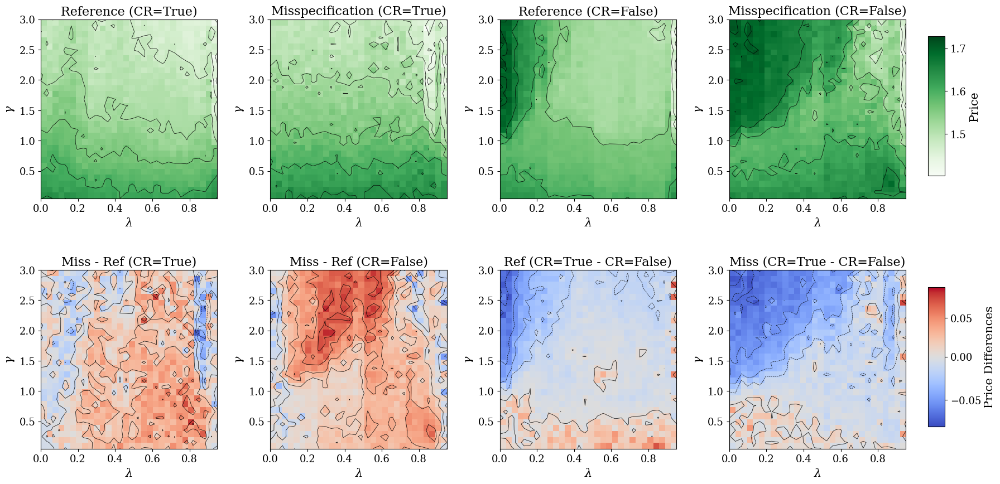

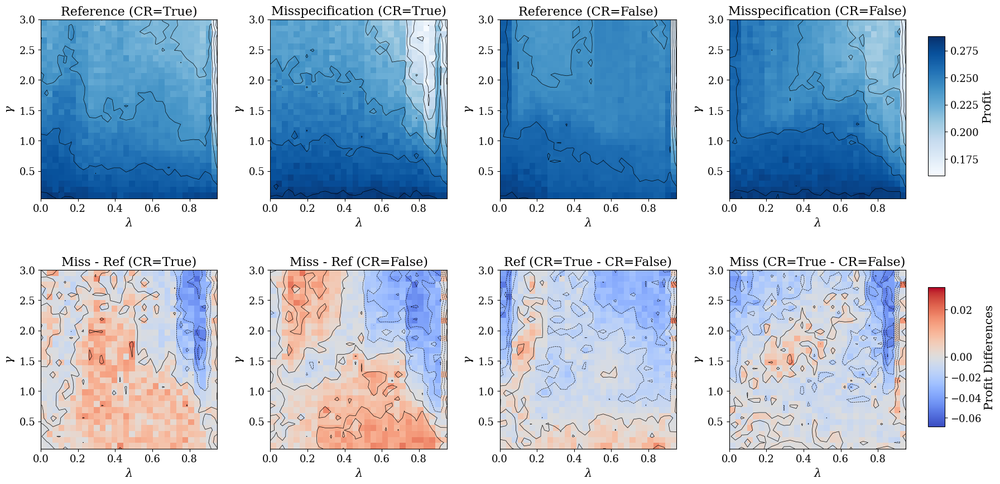

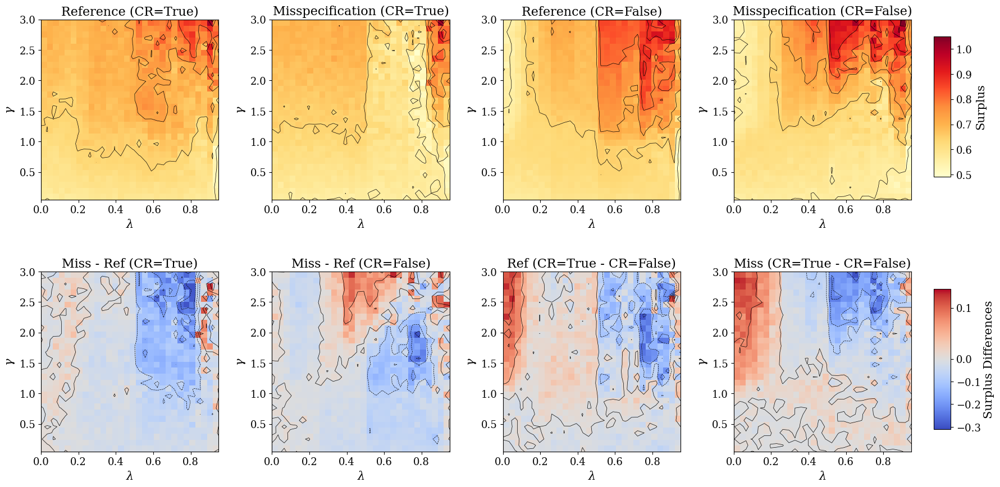

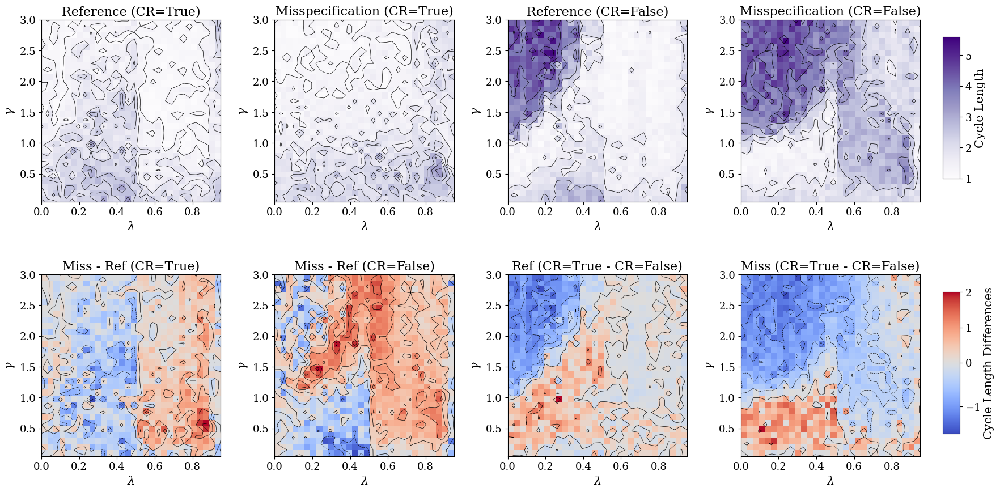

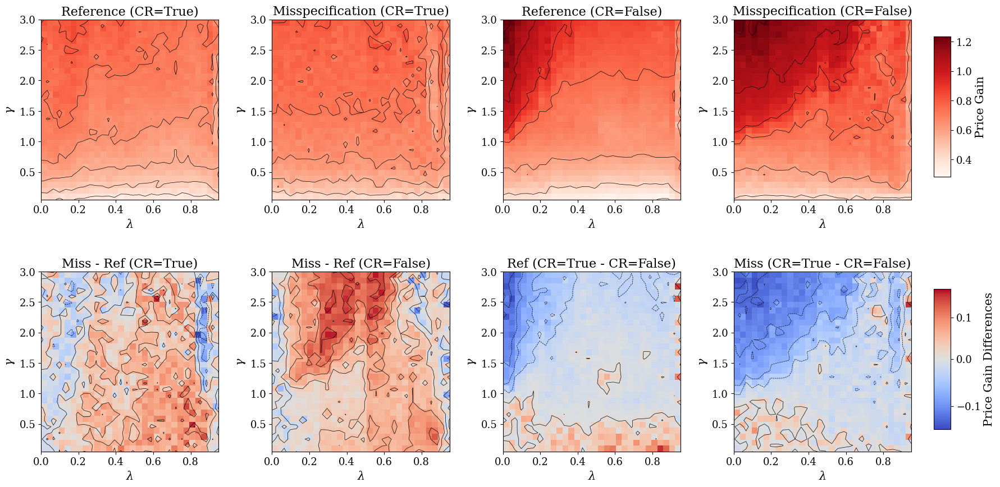

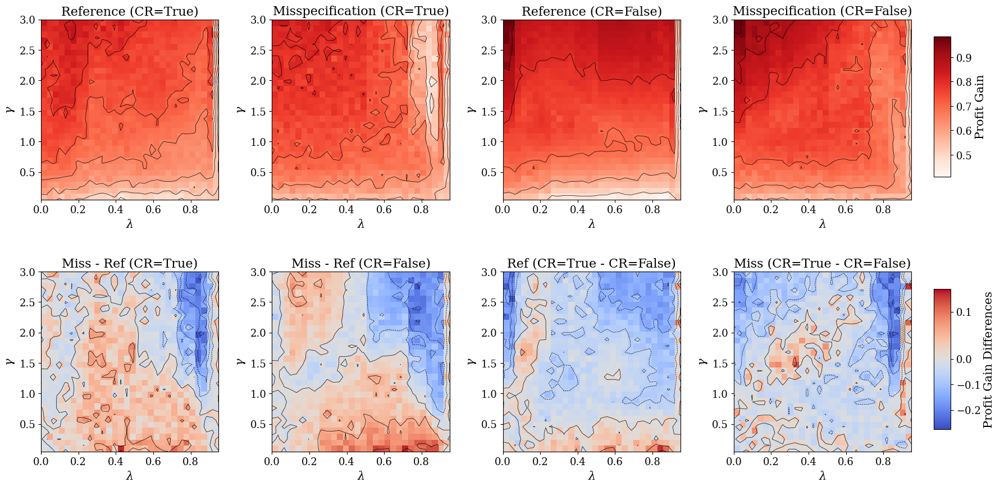

In [144]:
import os

# 1) define experiment folders
folder_location = "../Results_sockeye/experiments"
#experiment_base = "reference_two_gamma_lambda_sockeye/gamma_lambda_c"
experiment_base = "final_results/gamma_lambda"

exp_dirs = {}
for demand_type in ['reference', 'misspecification']:
    for common_ref in [True, False]:
        exp_name = f"{experiment_base}_{demand_type}_{common_ref}"
        exp_dirs[(demand_type, common_ref)] = os.path.join(folder_location, exp_name)

# 2) create output directory for comparative figures
base_fig_dir = os.path.join(folder_location, experiment_base, "Comparative_Figures")
os.makedirs(base_fig_dir, exist_ok=True)

# 3) metrics to plot
metrics = ["Price", "Profit", "Surplus", "Cycle Length", "Price Gain", "Profit Gain"]

# 4) generate & save one 4-group figure per metric
for metric in metrics:
    fig = create_4group_comparative_heatmaps_gl(
        results_dir=folder_location,
        experiment_dirs=exp_dirs,
        metric_name=metric,
        figsize=(20, 10)
    )
    # sanitize filename
    fname = metric.lower().replace(" ", "_") + "_4group_compare.png"
    fig.savefig(os.path.join(base_fig_dir, fname))


***
Generating gamma only figures for all 4 groups

In [22]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from glob import glob

# ———————————————
# helper as before
def load_gamma_metric(experiment_dir, metric_name):
    pattern = "gamma_*_lambda_*"
    run_dirs = glob(os.path.join(experiment_dir, pattern))

    gammas, values = [], []
    for run in run_dirs:
        base = os.path.basename(run)
        try:
            γ = float(base.split('gamma_')[1].split('_lambda_')[0])
        except:
            continue

        stats_file = os.path.join(run, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            continue

        df = pd.read_csv(stats_file)
        if metric_name == "Cycle Length":
            val = float(df["mean_cycle_length"].iloc[0])
        elif metric_name == "Surplus":
            val = float(df["mean_consumer_surplus"].iloc[0])
        else:
            key = metric_name.lower().replace(" ", "_")
            cols = [c for c in df.columns if c.startswith(f"mean_{key}_p")]
            val = df[cols].mean(axis=1).iloc[0] if cols else np.nan

        gammas.append(γ)
        values.append(val)

    if not gammas:
        raise ValueError(f"No data in {experiment_dir} for '{metric_name}'")

    df2 = pd.DataFrame({"gamma": gammas, "value": values}).dropna()
    grouped = df2.groupby("gamma")["value"].agg(["mean", "std"]).reset_index()
    return grouped["gamma"].values, grouped["mean"].values, grouped["std"].values

# ———————————————
# paths
folder_location = "../Results_sockeye/experiments"
experiment_base = "reference_two_gamma_lambda_sockeye/gamma_lambda_c"

exp_dirs = {
    ('reference', True)       : os.path.join(folder_location, f"{experiment_base}_reference_True"),
    ('misspecification', True): os.path.join(folder_location, f"{experiment_base}_misspecification_True"),
    ('reference', False)      : os.path.join(folder_location, f"{experiment_base}_reference_False"),
    ('misspecification', False): os.path.join(folder_location, f"{experiment_base}_misspecification_False"),
}

out_dir = os.path.join(folder_location, experiment_base, "Gamma_Figures")
os.makedirs(out_dir, exist_ok=True)

metrics = ["Price", "Profit", "Price Gain", "Profit Gain"]

# ———————————————
# plotting with improved readability
palette = plt.get_cmap("tab10")
group_defs = [
    ('reference',        True,  'Ref (CR=True)'),
    ('misspecification', True,  'Miss (CR=True)'),
    ('reference',        False, 'Ref (CR=False)'),
    ('misspecification', False, 'Miss (CR=False)'),
]
colors = [palette(i) for i in [0,1,2,3]]
markers = ['o', 's', '^', 'D']

for metric_name in metrics:
    fig, ax = plt.subplots(figsize=(10, 6))

    for (demand, cr, label), c, m in zip(group_defs, colors, markers):
        path = exp_dirs[(demand, cr)]
        γ, μ, σ = load_gamma_metric(path, metric_name)

        ax.plot(γ, μ,
                label=label,
                color=c,
                marker=m,
                linewidth=2)
        ax.fill_between(γ, μ - σ, μ + σ,
                        color=c,
                        alpha=0.15)

    ax.set_xlabel(r"$\gamma$", fontsize=12)
    ax.set_ylabel(metric_name, fontsize=12)
    ax.set_title(f"{metric_name} vs γ for all 4 groups", fontsize=14)
    ax.grid(True, linestyle="--", alpha=0.5)

    # put legend outside
    ax.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)

    plt.tight_layout(rect=[0,0,0.85,1])  # leave space on right for legend

    fname = metric_name.lower().replace(" ", "_") + "_gamma_all4.png"
    out_path = os.path.join(out_dir, fname)
    fig.savefig(out_path, dpi=300)
    plt.close(fig)

    print(f"Saved improved plot → {out_path}")


Saved improved plot → ../Results_sockeye/experiments/reference_two_gamma_lambda_sockeye/gamma_lambda_c/Gamma_Figures/price_gamma_all4.png
Saved improved plot → ../Results_sockeye/experiments/reference_two_gamma_lambda_sockeye/gamma_lambda_c/Gamma_Figures/profit_gamma_all4.png
Saved improved plot → ../Results_sockeye/experiments/reference_two_gamma_lambda_sockeye/gamma_lambda_c/Gamma_Figures/price_gain_gamma_all4.png
Saved improved plot → ../Results_sockeye/experiments/reference_two_gamma_lambda_sockeye/gamma_lambda_c/Gamma_Figures/profit_gain_gamma_all4.png


In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from glob import glob

# ———————————————
# helper as before
def load_gamma_metric(experiment_dir, metric_name):
    pattern = "gamma_*_lambda_*"
    run_dirs = glob(os.path.join(experiment_dir, pattern))

    gammas, values = [], []
    for run in run_dirs:
        base = os.path.basename(run)
        try:
            γ = float(base.split('gamma_')[1].split('_lambda_')[0])
        except:
            continue

        stats_file = os.path.join(run, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            continue

        df = pd.read_csv(stats_file)
        if metric_name == "Cycle Length":
            val = float(df["mean_cycle_length"].iloc[0])
        elif metric_name == "Surplus":
            val = float(df["mean_consumer_surplus"].iloc[0])
        else:
            key = metric_name.lower().replace(" ", "_")
            cols = [c for c in df.columns if c.startswith(f"mean_{key}_p")]
            val = df[cols].mean(axis=1).iloc[0] if cols else np.nan

        gammas.append(γ)
        values.append(val)

    if not gammas:
        raise ValueError(f"No data in {experiment_dir} for '{metric_name}'")

    df2 = pd.DataFrame({"gamma": gammas, "value": values}).dropna()
    grouped = df2.groupby("gamma")["value"].agg(["mean", "std"]).reset_index()
    return grouped["gamma"].values, grouped["mean"].values, grouped["std"].values

# ———————————————
# paths
folder_location = "../Results_sockeye/experiments"
experiment_base = "reference_two_gamma_lambda_sockeye/gamma_lambda_c"

exp_dirs = {
    ('reference', True)       : os.path.join(folder_location, f"{experiment_base}_reference_True"),
    ('misspecification', True): os.path.join(folder_location, f"{experiment_base}_misspecification_True"),
    ('reference', False)      : os.path.join(folder_location, f"{experiment_base}_reference_False"),
    ('misspecification', False): os.path.join(folder_location, f"{experiment_base}_misspecification_False"),
}

out_dir = os.path.join(folder_location, experiment_base, "Gamma_Figures")
os.makedirs(out_dir, exist_ok=True)

metrics = ["Price", "Profit", "Price Gain", "Profit Gain"]

# ———————————————
# plotting with reference vs miss colors and solid/dashed for CR
ref_color = 'tab:blue'
mis_color = 'tab:orange'

for metric_name in metrics:
    fig, ax = plt.subplots(figsize=(10, 6))

    for (demand, cr), label in [((d, c), f"{d.capitalize()} (CR={c})") 
                                for d, c in [('reference', True), 
                                             ('reference', False),
                                             ('misspecification', True),
                                             ('misspecification', False)]]:
        path = exp_dirs[(demand, cr)]
        γ, μ, σ = load_gamma_metric(path, metric_name)

        # set color by demand type
        color = ref_color if demand == 'reference' else mis_color
        linestyle = '-' if cr else '--'

        ax.plot(γ, μ,
                label=label,
                color=color,
                linestyle=linestyle,
                marker='o',
                linewidth=2)
        ax.fill_between(γ, μ - σ, μ + σ,
                        color=color,
                        alpha=0.15)

    ax.set_xlabel(r"$\gamma$", fontsize=12)
    ax.set_ylabel(metric_name, fontsize=12)
    ax.set_title(f"{metric_name} vs γ for all 4 groups", fontsize=14)
    ax.grid(True, linestyle="--", alpha=0.5)

    # place legend outside
    ax.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)

    plt.tight_layout(rect=[0,0,0.85,1])

    fname = metric_name.lower().replace(" ", "_") + "_gamma_all4.png"
    out_path = os.path.join(out_dir, fname)
    fig.savefig(out_path, dpi=300)
    plt.close(fig)
    print(f"Saved updated plot → {out_path}")


Saved updated plot → ../Results_sockeye/experiments/reference_two_gamma_lambda_sockeye/gamma_lambda_c/Gamma_Figures/price_gamma_all4.png
Saved updated plot → ../Results_sockeye/experiments/reference_two_gamma_lambda_sockeye/gamma_lambda_c/Gamma_Figures/profit_gamma_all4.png
Saved updated plot → ../Results_sockeye/experiments/reference_two_gamma_lambda_sockeye/gamma_lambda_c/Gamma_Figures/price_gain_gamma_all4.png
Saved updated plot → ../Results_sockeye/experiments/reference_two_gamma_lambda_sockeye/gamma_lambda_c/Gamma_Figures/profit_gain_gamma_all4.png


gamma figure with q reference pricing

In [8]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from glob import glob

# ———————————————
# helper as before
def load_gamma_metric(experiment_dir, metric_name):
    pattern = "gamma_*_lambda_*"
    run_dirs = glob(os.path.join(experiment_dir, pattern))

    gammas, values = [], []
    for run in run_dirs:
        base = os.path.basename(run)
        try:
            γ = float(base.split('gamma_')[1].split('_lambda_')[0])
        except:
            continue

        stats_file = os.path.join(run, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            continue
        df = pd.read_csv(stats_file)
        if metric_name == "Cycle Length":
            val = float(df["mean_cycle_length"].iloc[0])
        elif metric_name == "Surplus":
            val = float(df["mean_consumer_surplus"].iloc[0])
        else:
            key = metric_name.lower().replace(" ", "_")
            cols = [c for c in df.columns if c.startswith(f"mean_{key}_p")]
            val = df[cols].mean(axis=1).iloc[0] if cols else np.nan

        gammas.append(γ)
        values.append(val)

    if not gammas:
        raise ValueError(f"No data in {experiment_dir} for '{metric_name}'")

    df2 = pd.DataFrame({"gamma": gammas, "value": values}).dropna()
    grouped = df2.groupby("gamma")["value"].agg(["mean", "std"]).reset_index()
    return grouped["gamma"].values, grouped["mean"].values, grouped["std"].values



# ———————————————
# NEW: loader for gamma‑only runs
def load_gamma_only_metric(experiment_dir, metric_name):
    pattern = "gamma_*"
    run_dirs = glob(os.path.join(experiment_dir, pattern))

    gammas, means, stds = [], [], []
    for run in run_dirs:
        base = os.path.basename(run)
        try:
            γ = float(base.split("gamma_")[1])
        except:
            continue

        stats_file = os.path.join(run, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            continue

        df = pd.read_csv(stats_file)
        # pick your metric exactly as in load_gamma_metric,
        # but also grab std from 'std_<metric>_p*' columns:
        key = metric_name.lower().replace(" ", "_")
        mean_cols = [c for c in df.columns if c.startswith(f"mean_{key}_p")]
        std_cols  = [c for c in df.columns if c.startswith(f"std_{key}_p")]

        if not mean_cols or not std_cols:
            continue

        mval = df[mean_cols].mean(axis=1).iloc[0]
        sval = df[std_cols].mean(axis=1).iloc[0]

        gammas.append(γ)
        means.append(mval)
        stds.append(sval)

    if not gammas:
        raise ValueError(f"No γ-only data in {experiment_dir} for '{metric_name}'")

    # sort by γ
    idx = np.argsort(gammas)
    return (np.array(gammas)[idx],
            np.array(means)[idx],
            np.array(stds)[idx])

# ———————————————
# paths
folder   = "../Results_sockeye/experiments"
base     = "reference_two_gamma_lambda_sockeye/gamma_lambda_c"
base2 = "reference_two_gamma_lambda_sockeye/gamma"

exp_dirs = {
    ('reference',        True) : os.path.join(folder, f"{base}_reference_True"),
    ('reference',        False): os.path.join(folder, f"{base}_reference_False"),
    ('misspecification', True) : os.path.join(folder, f"{base}_misspecification_True"),
    ('misspecification', False): os.path.join(folder, f"{base}_misspecification_False"),
    #  add the q‑learning folders:
    ('qlr_reference',    True) : os.path.join(folder, f"{base2}_only_qlr_reference_True"),
    ('qlr_reference',    False): os.path.join(folder, f"{base2}_only_qlr_reference_False"),
}

out_dir = os.path.join(folder, base, "Gamma_Figures")
os.makedirs(out_dir, exist_ok=True)

metrics = ["Price", "Profit", "Price Gain", "Profit Gain"]

# ———————————————
# plotting
ref_color = 'tab:blue'
mis_color = 'tab:orange'
qlr_color= 'tab:purple'

for metric_name in metrics:
    fig, ax = plt.subplots(figsize=(10,6))

    # first the four grid-search curves
    for demand, cr in [('reference', True),
                       ('reference', False),
                       ('misspecification', True),
                       ('misspecification', False)]:
        γ, μ, σ = load_gamma_metric(exp_dirs[(demand, cr)], metric_name)
        color     = ref_color if demand=='reference' else mis_color
        linestyle = '-'       if cr       else '--'
        label     = f"{demand.capitalize()} (CR={cr})"

        ax.plot(γ, μ, color=color, linestyle=linestyle,
                marker='o', linewidth=2, label=label)
        ax.fill_between(γ, μ-σ, μ+σ, color=color, alpha=0.15)

    # now overlay the two q‑learning curves
    for cr in [True, False]:
        γ, μ, σ = load_gamma_only_metric(exp_dirs[('qlr_reference', cr)], metric_name)
        linestyle = '-' if cr else '--'
        label     = f"Q-learning Ref (CR={cr})"

        ax.plot(γ, μ, color=qlr_color, linestyle=linestyle,
                marker='D', linewidth=2, label=label)
        ax.fill_between(γ, μ-σ, μ+σ, color=qlr_color, alpha=0.15)

    # finalize
    ax.set_xlabel(r"$\gamma$", fontsize=12)
    ax.set_ylabel(metric_name, fontsize=12)
    ax.set_title(f"{metric_name} vs γ ", fontsize=14)
    ax.grid(True, linestyle="--", alpha=0.5)

    ax.legend(bbox_to_anchor=(1.02,1), loc="upper left")
    plt.tight_layout(rect=[0,0,0.85,1])

    fname = metric_name.lower().replace(" ", "_") + "_gamma_all6.png"
    fig.savefig(os.path.join(out_dir, fname), dpi=300)
    plt.close(fig)
    print(f"Saved → {fname}")

Saved → price_gamma_all6.png
Saved → profit_gamma_all6.png
Saved → price_gain_gamma_all6.png
Saved → profit_gain_gamma_all6.png


KeyError: ('qlr_reference', True)

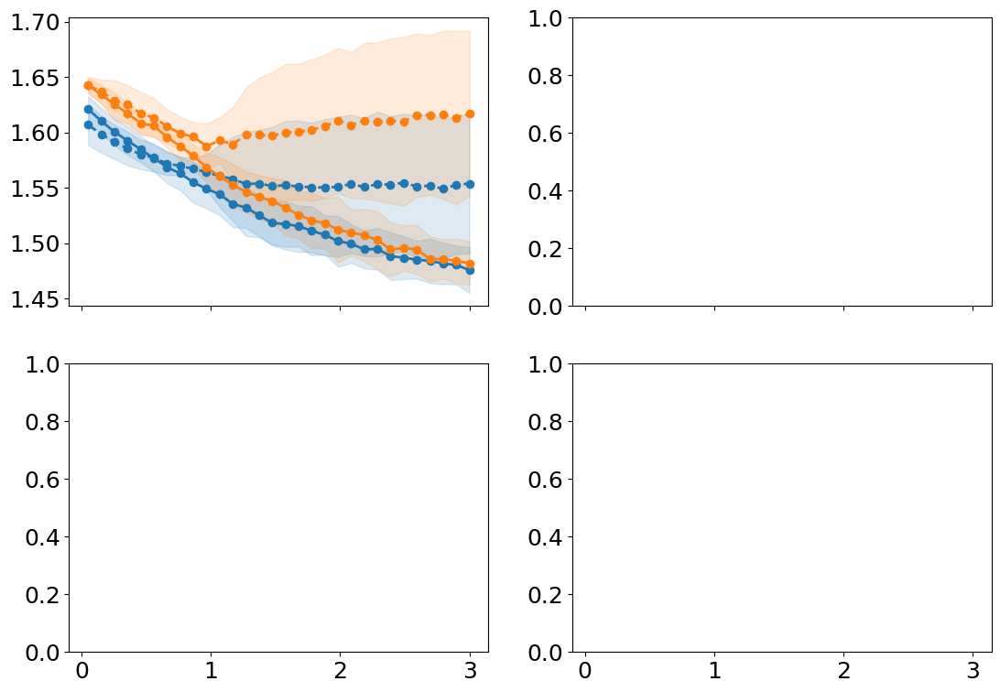

In [7]:
# ------------------------------------------------------------------
# 2×2 “quad” figure with ONE legend
# ------------------------------------------------------------------
fig_q, axes = plt.subplots(2, 2, figsize=(13, 9), sharex=True)
metric_axes = dict(zip(metrics, axes.flatten()))   # map metric → subplot

# we’ll collect the handles once (first metric) for the global legend
handles_for_legend, labels_for_legend = None, None

for metric_name in metrics:
    ax = metric_axes[metric_name]

    # ---------- grid‑search curves ----------
    for demand, cr in [('reference', True),
                       ('reference', False),
                       ('misspecification', True),
                       ('misspecification', False)]:
        γ, μ, σ = load_gamma_metric(exp_dirs[(demand, cr)], metric_name)
        color     = ref_color if demand == 'reference' else mis_color
        linestyle = '-' if cr else '--'
        label     = f"{demand.capitalize()} (CR={cr})"

        ln, = ax.plot(γ, μ, color=color, linestyle=linestyle,
                      marker='o', linewidth=2, label=label)
        ax.fill_between(γ, μ-σ, μ+σ, color=color, alpha=0.15)

    # ---------- Q‑learning curves ----------
    for cr in [True, False]:
        γ, μ, σ = load_gamma_only_metric(exp_dirs[('qlr_reference', cr)], metric_name)
        linestyle = '-' if cr else '--'
        label     = f"Q‑learning Ref (CR={cr})"

        ln, = ax.plot(γ, μ, color=qlr_color, linestyle=linestyle,
                      marker='D', linewidth=2, label=label)
        ax.fill_between(γ, μ-σ, μ+σ, color=qlr_color, alpha=0.15)

    # axis cosmetics
    ax.set_title(metric_name)
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_ylabel(metric_name)                  # show y‑label on every panel                        # bottom row only
    ax.set_xlabel(r"$\gamma$")
    ax.set_ylabel(metric_name)

    # grab legend handles/labels once
    if handles_for_legend is None:
        handles_for_legend, labels_for_legend = ax.get_legend_handles_labels()

# ---------------- shared legend & layout ----------------
fig_q.legend(handles_for_legend,
             labels_for_legend,
             loc='lower center',        # anchor it to the top edge
             bbox_to_anchor=(0.5, 0.95),# (x‑centre, just above 1.0)
             ncol=3,                    # 3 columns  → 2 rows of labels
             frameon=False)

# leave 10 % of the height for that legend bar
fig_q.tight_layout(rect=[0, 0, 1, 0.95])

quad_fname = "gamma_all6_quad.png"
fig_q.savefig(os.path.join(out_dir, quad_fname), dpi=300,
              bbox_inches='tight')



second method

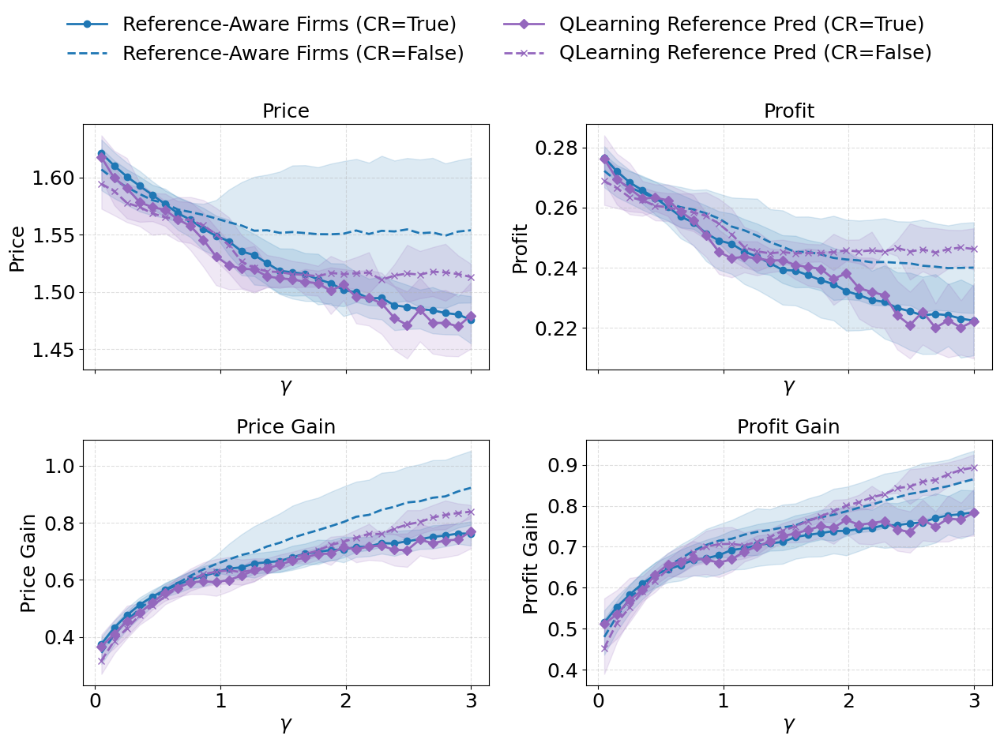

In [11]:

# paths
folder   = "../Results_sockeye/experiments"
base     = "final_results/gamma_lambda"
base2     = "final_results/gamma"

exp_dirs = {
    ('reference',        True) : os.path.join(folder, f"{base}_reference_True"),
    ('reference',        False): os.path.join(folder, f"{base}_reference_False"),
    ('misspecification', True) : os.path.join(folder, f"{base}_misspecification_True"),
    ('misspecification', False): os.path.join(folder, f"{base}_misspecification_False"),
    #  add the q‑learning folders:
    ('qlr_reference',    True) : os.path.join(folder, f"{base2}_only_qlr_reference_True"),
    ('qlr_reference',    False): os.path.join(folder, f"{base2}_only_qlr_reference_False"),
}

# ------------------------------------------------------------------
# 2×2 “quad” figure with ONE legend
# ------------------------------------------------------------------
plt.rcParams.update({
    'font.size': 18,         # General font size
    'axes.titlesize': 18,    # Subplot title
    'axes.labelsize': 18,    # Axis labels
    'xtick.labelsize': 18,   # X-axis tick labels
    'ytick.labelsize': 18,   # Y-axis tick labels
    'legend.fontsize': 18,   # Legend text
})
fig_q, axes = plt.subplots(2, 2, figsize=(13, 9), sharex=True)
metric_axes = dict(zip(metrics, axes.flatten()))   # map metric → subplot

# we’ll collect the handles once (first metric) for the global legend
handles_for_legend, labels_for_legend = None, None

for metric_name in metrics:
    ax = metric_axes[metric_name]

    # ---------- grid‑search curves ----------
    for demand, cr in [('reference', True),   
                       ('reference', False),   
                       #('misspecification', True)  
                       ]:
        γ, μ, σ = load_gamma_metric(exp_dirs[(demand, cr)], metric_name)
        color     = ref_color if demand == 'reference' else mis_color
        linestyle = '-' if cr else '--'
        marker    = 'o' if cr else ' '  # Different marker for CR=False
        label     = f"{demand.capitalize()} (CR={cr})"

        ln, = ax.plot(γ, μ, color=color, linestyle=linestyle,
                    marker=marker, linewidth=2, label=label)
        ax.fill_between(γ, μ-σ, μ+σ, color=color, alpha=0.15)

    # ---------- Q‑learning curves ----------
    for cr in [True,
               False]:
        γ, μ, σ = load_gamma_only_metric(exp_dirs[('qlr_reference', cr)], metric_name)
        linestyle = '-' if cr else '--'
        marker    = 'D' if cr else 'x'  # Different marker for CR=False
        label     = f"Q‑learning Ref (CR={cr})"

        ln, = ax.plot(γ, μ, color=qlr_color, linestyle=linestyle,
                    marker=marker, linewidth=2, label=label)
        ax.fill_between(γ, μ-σ, μ+σ, color=qlr_color, alpha=0.15)
        
    # axis cosmetics
    ax.set_title(metric_name)
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_ylabel(metric_name)                  # show y‑label on every panel                        # bottom row only
    ax.set_xlabel(r"$\gamma$")
    ax.set_ylabel(metric_name)

    # grab legend handles/labels once
    if handles_for_legend is None:
        handles_for_legend, labels_for_legend = ax.get_legend_handles_labels()
    
    labels_for_legend = [
        "Reference-Aware Firms (CR=True)",
        "Reference-Aware Firms (CR=False)",
        #"Reference-Naive Firms",
        # "Misspecification (CR=True)",
        # "Misspecification (CR=False)",
        "QLearning Reference Pred (CR=True)",
        "QLearning Reference Pred (CR=False)",
    ]

# ---------------- shared legend & layout ----------------
fig_q.legend(handles_for_legend,
             labels_for_legend,
             loc='lower center',        # anchor it to the top edge
             bbox_to_anchor=(0.5, 0.95),# (x‑centre, just above 1.0)
             ncol=2,                    # 3 columns  → 2 rows of labels
             frameon=False)

# leave 10 % of the height for that legend bar
fig_q.tight_layout(rect=[0, 0, 1, 0.95])

quad_fname = "gamma_all6_quad.png"
fig_q.savefig(os.path.join(out_dir, quad_fname), dpi=300,
              bbox_inches='tight')



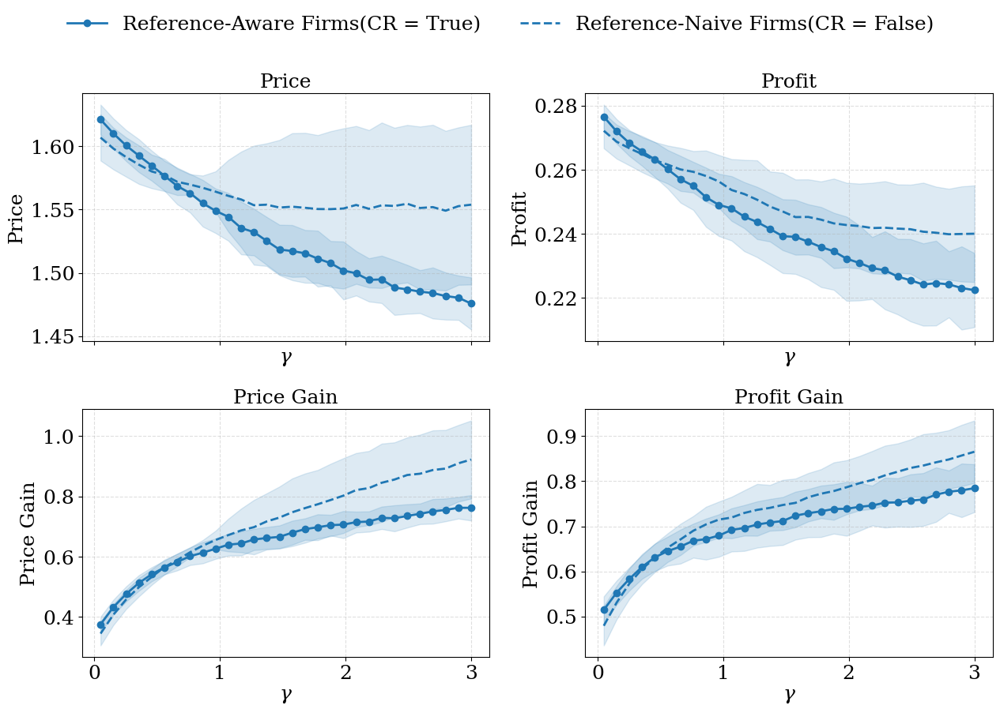

In [35]:

# paths
folder   = "../Results_sockeye/experiments"
base     = "final_results/gamma_lambda"
base2     = "final_results/gamma"

exp_dirs = {
    ('reference',        True) : os.path.join(folder, f"{base}_reference_True"),
    ('reference',        False): os.path.join(folder, f"{base}_reference_False"),
    #('misspecification', True) : os.path.join(folder, f"{base}_misspecification_True"),
    #('misspecification', False): os.path.join(folder, f"{base}_misspecification_False"),
    #  add the q‑learning folders:
    # ('qlr_reference',    True) : os.path.join(folder, f"{base2}_only_qlr_reference_True"),
    # ('qlr_reference',    False): os.path.join(folder, f"{base2}_only_qlr_reference_False"),
}

# ------------------------------------------------------------------
# 2×2 “quad” figure with ONE legend
# ------------------------------------------------------------------
plt.rcParams.update({
    'font.size': 18,         # General font size
    'axes.titlesize': 18,    # Subplot title
    'axes.labelsize': 18,    # Axis labels
    'xtick.labelsize': 18,   # X-axis tick labels
    'ytick.labelsize': 18,   # Y-axis tick labels
    'legend.fontsize': 18,   # Legend text
})
fig_q, axes = plt.subplots(2, 2, figsize=(13, 9), sharex=True)
metric_axes = dict(zip(metrics, axes.flatten()))   # map metric → subplot

# we’ll collect the handles once (first metric) for the global legend
handles_for_legend, labels_for_legend = None, None

for metric_name in metrics:
    ax = metric_axes[metric_name]

    # ---------- grid‑search curves ----------
    for demand, cr in [('reference', True),     
                       ('reference', False)  
                       ]:
        γ, μ, σ = load_gamma_metric(exp_dirs[(demand, cr)], metric_name)
        color     = ref_color if demand == 'reference' else mis_color
        linestyle = '-' if cr else '--'
        marker    = 'o' if cr else ' '  # Different marker for CR=False
        label     = f"{demand.capitalize()} (CR={cr})"

        ln, = ax.plot(γ, μ, color=color, linestyle=linestyle,
                    marker=marker, linewidth=2, label=label)
        ax.fill_between(γ, μ-σ, μ+σ, color=color, alpha=0.15)

    # ---------- Q‑learning curves ----------
    # for cr in [True]:
    #     γ, μ, σ = load_gamma_only_metric(exp_dirs[('qlr_reference', cr)], metric_name)
    #     linestyle = '-' if cr else '--'
    #     marker    = 'D' if cr else 'x'  # Different marker for CR=False
    #     label     = f"Q‑learning Ref (CR={cr})"

    #     ln, = ax.plot(γ, μ, color=qlr_color, linestyle=linestyle,
    #                 marker=marker, linewidth=2, label=label)
    #     ax.fill_between(γ, μ-σ, μ+σ, color=qlr_color, alpha=0.15)
        
    # axis cosmetics
    ax.set_title(metric_name)
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_ylabel(metric_name)                  # show y‑label on every panel                        # bottom row only
    ax.set_xlabel(r"$\gamma$")
    ax.set_ylabel(metric_name)

    # grab legend handles/labels once
    if handles_for_legend is None:
        handles_for_legend, labels_for_legend = ax.get_legend_handles_labels()
    
    labels_for_legend = [
        "Reference-Aware Firms(CR = True)",
        "Reference-Naive Firms(CR = False)",
        # "Reference-Naive Firms(CR=True)",
        # "Reference-Naive Firms (CR=False)",
        # "QLearning Reference Pred (CR=True)",
        # "QLearning Reference Pred (CR=False)",
    ]

# ---------------- shared legend & layout ----------------
fig_q.legend(handles_for_legend,
             labels_for_legend,
             loc='lower center',        # anchor it to the top edge
             bbox_to_anchor=(0.5, 0.95),# (x‑centre, just above 1.0)
             ncol=2,                    # 3 columns  → 2 rows of labels
             frameon=False)

# leave 10 % of the height for that legend bar
fig_q.tight_layout(rect=[0, 0, 1, 0.95])

quad_fname = "gamma_all6_quad.png"
fig_q.savefig(os.path.join(out_dir, quad_fname), dpi=300,
              bbox_inches='tight')



KeyError: ('qlr_reference', True)

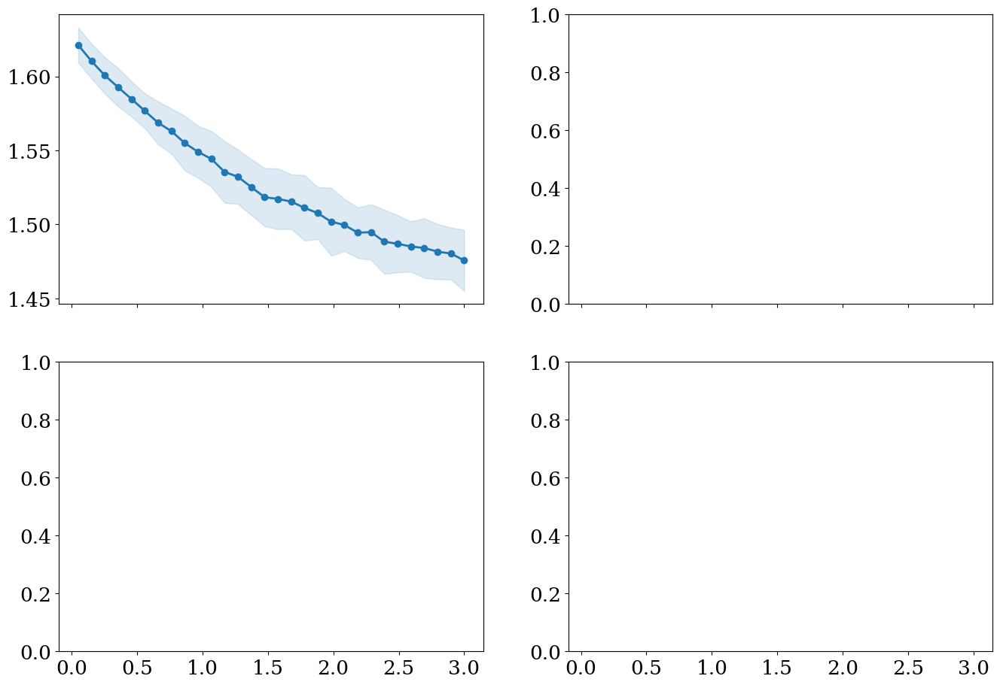

In [32]:

# paths
folder   = "../Results_sockeye/experiments"
base     = "final_results/gamma_lambda"
base2     = "final_results/gamma"

exp_dirs = {
    ('reference',        True) : os.path.join(folder, f"{base}_reference_True"),
    ('reference',        False): os.path.join(folder, f"{base}_reference_False"),
    #('misspecification', True) : os.path.join(folder, f"{base}_misspecification_True"),
    #('misspecification', False): os.path.join(folder, f"{base}_misspecification_False"),
    #  add the q‑learning folders:
    #('qlr_reference',    True) : os.path.join(folder, f"{base2}_only_qlr_reference_True"),
    #('qlr_reference',    False): os.path.join(folder, f"{base2}_only_qlr_reference_False"),
}

# ------------------------------------------------------------------
# 2×2 “quad” figure with ONE legend
# ------------------------------------------------------------------
plt.rcParams.update({
    'font.size': 18,         # General font size
    'axes.titlesize': 24,    # Subplot title
    'axes.labelsize': 24,    # Axis labels
    'xtick.labelsize': 19,   # X-axis tick labels
    'ytick.labelsize': 19,   # Y-axis tick labels
    'legend.fontsize': 20,   # Legend text
})
fig_q, axes = plt.subplots(2, 2, figsize=(16, 11), sharex=True)
metric_axes = dict(zip(metrics, axes.flatten()))   # map metric → subplot

# we’ll collect the handles once (first metric) for the global legend
handles_for_legend, labels_for_legend = None, None

for metric_name in metrics:
    ax = metric_axes[metric_name]

    # ---------- grid‑search curves ----------
    for demand, cr in [('reference', True)]:
        γ, μ, σ = load_gamma_metric(exp_dirs[(demand, cr)], metric_name)
        color     = ref_color if demand == 'reference' else mis_color
        linestyle = '-' if cr else '--'
        marker    = 'o' if cr else ''  # Different marker for CR=False
        label     = f"{demand.capitalize()} (CR={cr})"

        ln, = ax.plot(γ, μ, color=color, linestyle=linestyle,
                    marker=marker, linewidth=2, label=label)
        ax.fill_between(γ, μ-σ, μ+σ, color=color, alpha=0.15)

    # ---------- Q‑learning curves ----------
    for cr in [True]:
        γ, μ, σ = load_gamma_only_metric(exp_dirs[('qlr_reference', cr)], metric_name)
        linestyle = '-' if cr else '--'
        marker    = 'D' if cr else 'x'  # Different marker for CR=False
        label     = f"Q‑learning Ref (CR={cr})"

        ln, = ax.plot(γ, μ, color=qlr_color, linestyle=linestyle,
                    marker=marker, linewidth=2, label=label)
        ax.fill_between(γ, μ-σ, μ+σ, color=qlr_color, alpha=0.15)
        
    # axis cosmetics
    ax.set_title(metric_name)
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_ylabel(metric_name)                  # show y‑label on every panel                        # bottom row only
    ax.set_xlabel(r"$\gamma$")
    ax.set_ylabel(metric_name)

    # grab legend handles/labels once
    if handles_for_legend is None:
        handles_for_legend, labels_for_legend = ax.get_legend_handles_labels()
    
    labels_for_legend = [
        "Exp Smoothing Ref",
        "Algorithmic Pred Ref",
    ]

# ---------------- shared legend & layout ----------------
fig_q.legend(handles_for_legend,
             labels_for_legend,
             loc='lower center',        # anchor it to the top edge
             bbox_to_anchor=(0.5, 0.95),# (x‑centre, just above 1.0)
             ncol=2,                    # 3 columns  → 2 rows of labels
             frameon=False)

# leave 10 % of the height for that legend bar
fig_q.tight_layout(rect=[0, 0, 1, 0.95])

quad_fname = "gamma_all6_quad.png"
fig_q.savefig(os.path.join(out_dir, quad_fname), dpi=300,
              bbox_inches='tight')



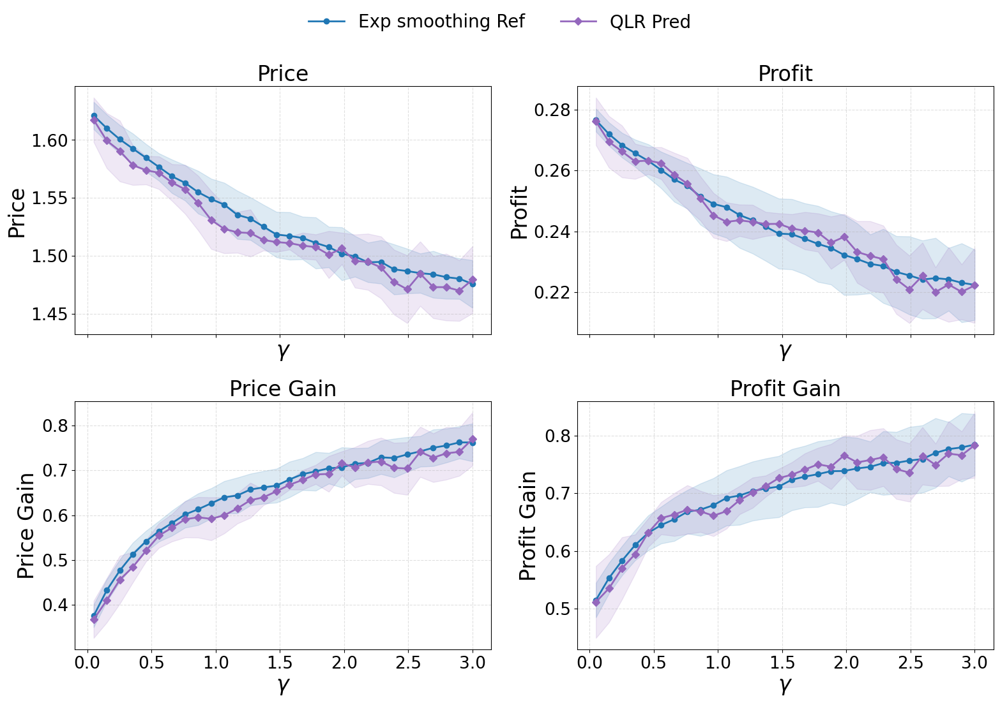

In [6]:

# paths
folder   = "../Results_sockeye/experiments"
base     = "final_results/gamma_lambda"
base2     = "final_results/gamma"

exp_dirs = {
    ('reference',        True) : os.path.join(folder, f"{base}_reference_True"),
    ('reference',        False): os.path.join(folder, f"{base}_reference_False"),
    ('misspecification', True) : os.path.join(folder, f"{base}_misspecification_True"),
    ('misspecification', False): os.path.join(folder, f"{base}_misspecification_False"),
    #  add the q‑learning folders:
    ('qlr_reference',    True) : os.path.join(folder, f"{base2}_only_qlr_reference_True"),
    ('qlr_reference',    False): os.path.join(folder, f"{base2}_only_qlr_reference_False"),
}

# ------------------------------------------------------------------
# 2×2 “quad” figure with ONE legend
# ------------------------------------------------------------------
plt.rcParams.update({
    'font.size': 18,         # General font size
    'axes.titlesize': 24,    # Subplot title
    'axes.labelsize': 24,    # Axis labels
    'xtick.labelsize': 19,   # X-axis tick labels
    'ytick.labelsize': 19,   # Y-axis tick labels
    'legend.fontsize': 20,   # Legend text
})
fig_q, axes = plt.subplots(2, 2, figsize=(16, 11), sharex=True)
metric_axes = dict(zip(metrics, axes.flatten()))   # map metric → subplot

# we’ll collect the handles once (first metric) for the global legend
handles_for_legend, labels_for_legend = None, None

for metric_name in metrics:
    ax = metric_axes[metric_name]

    # ---------- grid‑search curves ----------
    for demand, cr in [('reference', True)]:
        γ, μ, σ = load_gamma_metric(exp_dirs[(demand, cr)], metric_name)
        color     = ref_color if demand == 'reference' else mis_color
        linestyle = '-' if cr else '--'
        marker    = 'o' if cr else ''  # Different marker for CR=False
        label     = f"{demand.capitalize()} (CR={cr})"

        ln, = ax.plot(γ, μ, color=color, linestyle=linestyle,
                    marker=marker, linewidth=2, label=label)
        ax.fill_between(γ, μ-σ, μ+σ, color=color, alpha=0.15)

    # ---------- Q‑learning curves ----------
    for cr in [True]:
        γ, μ, σ = load_gamma_only_metric(exp_dirs[('qlr_reference', cr)], metric_name)
        linestyle = '-' if cr else '--'
        marker    = 'D' if cr else 'x'  # Different marker for CR=False
        label     = f"Q‑learning Ref (CR={cr})"

        ln, = ax.plot(γ, μ, color=qlr_color, linestyle=linestyle,
                    marker=marker, linewidth=2, label=label)
        ax.fill_between(γ, μ-σ, μ+σ, color=qlr_color, alpha=0.15)
        
    # axis cosmetics
    ax.set_title(metric_name)
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_ylabel(metric_name)                  # show y‑label on every panel                        # bottom row only
    ax.set_xlabel(r"$\gamma$")
    ax.set_ylabel(metric_name)

    # grab legend handles/labels once
    if handles_for_legend is None:
        handles_for_legend, labels_for_legend = ax.get_legend_handles_labels()
    
    labels_for_legend = [
        "Exp smoothing Ref",
        "QLR Pred",
    ]

# ---------------- shared legend & layout ----------------
fig_q.legend(handles_for_legend,
             labels_for_legend,
             loc='lower center',        # anchor it to the top edge
             bbox_to_anchor=(0.5, 0.95),# (x‑centre, just above 1.0)
             ncol=2,                    # 3 columns  → 2 rows of labels
             frameon=False)

# leave 10 % of the height for that legend bar
fig_q.tight_layout(rect=[0, 0, 1, 0.95])

quad_fname = "gamma_all6_quad.png"
fig_q.savefig(os.path.join(out_dir, quad_fname), dpi=300,
              bbox_inches='tight')



In [ ]:

# paths
folder   = "../Results_sockeye/experiments"
base     = "final_results/gamma_lambda"
base2     = "final_results/gamma"

exp_dirs = {
    ('reference',        True) : os.path.join(folder, f"{base}_reference_True"),
    ('reference',        False): os.path.join(folder, f"{base}_reference_False"),
    ('misspecification', True) : os.path.join(folder, f"{base}_misspecification_True"),
    ('misspecification', False): os.path.join(folder, f"{base}_misspecification_False"),
    #  add the q‑learning folders:
    ('qlr_reference',    True) : os.path.join(folder, f"{base2}_only_qlr_reference_True"),
    ('qlr_reference',    False): os.path.join(folder, f"{base2}_only_qlr_reference_False"),
}

# ------------------------------------------------------------------
# 2×2 “quad” figure with ONE legend
# ------------------------------------------------------------------
plt.rcParams.update({
    'font.size': 14,         # General font size
    'axes.titlesize': 16,    # Subplot title
    'axes.labelsize': 14,    # Axis labels
    'xtick.labelsize': 12,   # X-axis tick labels
    'ytick.labelsize': 12,   # Y-axis tick labels
    'legend.fontsize': 13,   # Legend text
})
fig_q, axes = plt.subplots(2, 2, figsize=(13, 9), sharex=True)
metric_axes = dict(zip(metrics, axes.flatten()))   # map metric → subplot

# we’ll collect the handles once (first metric) for the global legend
handles_for_legend, labels_for_legend = None, None

for metric_name in metrics:
    ax = metric_axes[metric_name]

    # ---------- grid‑search curves ----------
    for demand, cr in [('reference', True)]:
        γ, μ, σ = load_gamma_metric(exp_dirs[(demand, cr)], metric_name)
        color     = ref_color if demand == 'reference' else mis_color
        linestyle = '-' if cr else '--'
        marker    = 'o' if cr else 's'  # Different marker for CR=False
        label     = f"{demand.capitalize()} (CR={cr})"

        ln, = ax.plot(γ, μ, color=color, linestyle=linestyle,
                    marker=marker, linewidth=2, label=label)
        ax.fill_between(γ, μ-σ, μ+σ, color=color, alpha=0.15)

    # ---------- Q‑learning curves ----------
    for cr in [True]:
        γ, μ, σ = load_gamma_only_metric(exp_dirs[('qlr_reference', cr)], metric_name)
        linestyle = '-' if cr else '--'
        marker    = 'D' if cr else 'x'  # Different marker for CR=False
        label     = f"Q‑learning Ref (CR={cr})"

        ln, = ax.plot(γ, μ, color=qlr_color, linestyle=linestyle,
                    marker=marker, linewidth=2, label=label)
        ax.fill_between(γ, μ-σ, μ+σ, color=qlr_color, alpha=0.15)
        
    # axis cosmetics
    ax.set_title(metric_name)
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_ylabel(metric_name)                  # show y‑label on every panel                        # bottom row only
    ax.set_xlabel(r"$\gamma$")
    ax.set_ylabel(metric_name)

    # grab legend handles/labels once
    if handles_for_legend is None:
        handles_for_legend, labels_for_legend = ax.get_legend_handles_labels()
    
    labels_for_legend = [
        "Correctly Specified (CR=True)",
        "QLearning Reference Pred (CR=True)",
    ]

# ---------------- shared legend & layout ----------------
fig_q.legend(handles_for_legend,
             labels_for_legend,
             loc='lower center',        # anchor it to the top edge
             bbox_to_anchor=(0.5, 0.95),# (x‑centre, just above 1.0)
             ncol=2,                    # 3 columns  → 2 rows of labels
             frameon=False)

# leave 10 % of the height for that legend bar
fig_q.tight_layout(rect=[0, 0, 1, 0.95])

quad_fname = "gamma_all6_quad.png"
fig_q.savefig(os.path.join(out_dir, quad_fname), dpi=300,
              bbox_inches='tight')



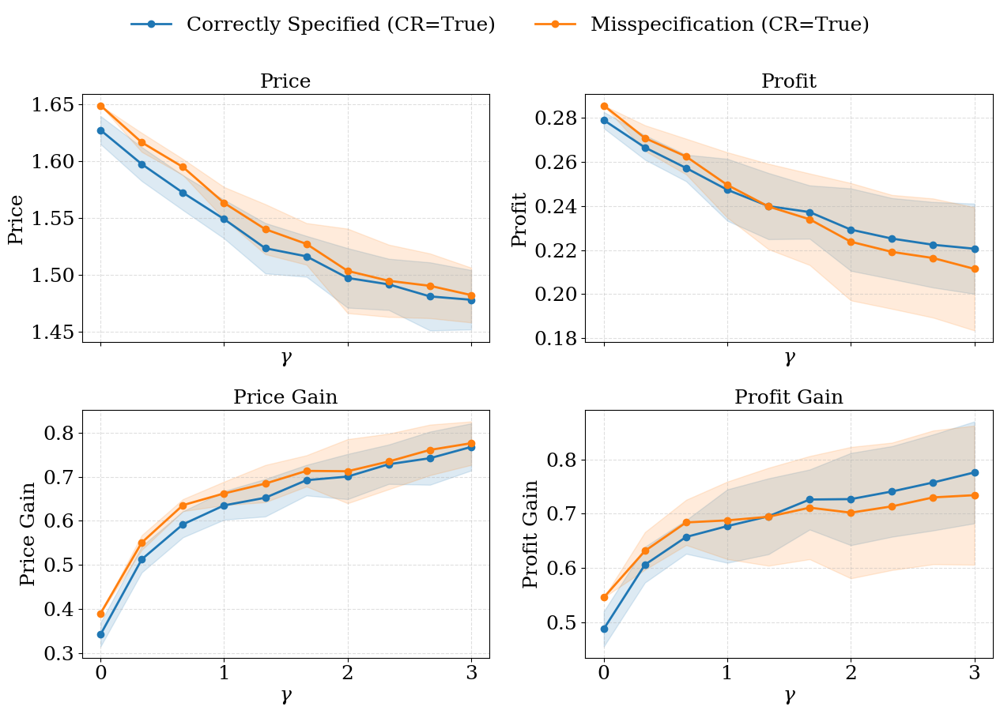

In [58]:
# ------------------------------------------------------------------
# 2×2 “quad” figure with ONE legend
# ------------------------------------------------------------------
plt.rcParams.update({
    'font.size': 18,         # General font size
    'axes.titlesize': 18,    # Subplot title
    'axes.labelsize': 18,    # Axis labels
    'xtick.labelsize': 18,   # X-axis tick labels
    'ytick.labelsize': 18,   # Y-axis tick labels
    'legend.fontsize': 18,   # Legend text
})

fig_q, axes = plt.subplots(2, 2, figsize=(13, 9), sharex=True)
metric_axes = dict(zip(metrics, axes.flatten()))   # map metric → subplot

# we’ll collect the handles once (first metric) for the global legend
handles_for_legend, labels_for_legend = None, None

for metric_name in metrics:
    ax = metric_axes[metric_name]

    # ---------- grid‑search curves ----------
    for demand, cr in [('reference', True),
                       ('misspecification', True)]:
        γ, μ, σ = load_gamma_metric(exp_dirs[(demand, cr)], metric_name)
        color     = ref_color if demand == 'reference' else mis_color
        linestyle = '-' if cr else '--'
        label     = f"{demand.capitalize()} (CR={cr})"

        ln, = ax.plot(γ, μ, color=color, linestyle=linestyle,
                      marker='o', linewidth=2, label=label)
        ax.fill_between(γ, μ-σ, μ+σ, color=color, alpha=0.15)

    # # ---------- Q‑learning curves ----------
    # for cr in [True, False]:
    #     γ, μ, σ = load_gamma_only_metric(exp_dirs[('qlr_reference', cr)], metric_name)
    #     linestyle = '-' if cr else '--'
    #     label     = f"Q‑learning Ref (CR={cr})"

    #     ln, = ax.plot(γ, μ, color=qlr_color, linestyle=linestyle,
    #                   marker='D', linewidth=2, label=label)
    #     ax.fill_between(γ, μ-σ, μ+σ, color=qlr_color, alpha=0.15)

    # axis cosmetics
    ax.set_title(metric_name)
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_ylabel(metric_name)                  # show y‑label on every panel                        # bottom row only
    ax.set_xlabel(r"$\gamma$")
    ax.set_ylabel(metric_name)

    # grab legend handles/labels once
    if handles_for_legend is None:
        handles_for_legend, labels_for_legend = ax.get_legend_handles_labels()
    labels_for_legend = [
        "Correctly Specified (CR=True)", 
        "Misspecification (CR=True)", 
    ]
# ---------------- shared legend & layout ----------------
fig_q.legend(handles_for_legend,
             labels_for_legend,
             loc='lower center',        # anchor it to the top edge
             bbox_to_anchor=(0.5, 0.95),# (x‑centre, just above 1.0)
             ncol=3,                    # 3 columns  → 2 rows of labels
             frameon=False)

# leave 10 % of the height for that legend bar
fig_q.tight_layout(rect=[0, 0, 1, 0.95])

quad_fname = "gamma_all6_quad.png"
fig_q.savefig(os.path.join(out_dir, quad_fname), dpi=300,
              bbox_inches='tight')



[0.         0.33333333 0.66666667 1.         1.33333333 1.66666667
 2.         2.33333333 2.66666667 3.        ] [1.627405 1.597545 1.57241  1.54921  1.523625 1.51649  1.497505 1.491835
 1.48127  1.47832 ]
[0.         0.33333333 0.66666667 1.         1.33333333 1.66666667
 2.         2.33333333 2.66666667 3.        ] [1.64905  1.616625 1.59499  1.563405 1.54036  1.527405 1.503695 1.49499
 1.49058  1.48246 ]
[0.         0.33333333 0.66666667 1.         1.33333333 1.66666667
 2.         2.33333333 2.66666667 3.        ] [0.278852  0.266454  0.257157  0.247287  0.239881  0.237191  0.229239
 0.2251725 0.2223755 0.2205865]
[0.         0.33333333 0.66666667 1.         1.33333333 1.66666667
 2.         2.33333333 2.66666667 3.        ] [0.285475  0.2707115 0.2623465 0.249475  0.2397035 0.233924  0.22375
 0.219145  0.2163535 0.211454 ]
[0.         0.33333333 0.66666667 1.         1.33333333 1.66666667
 2.         2.33333333 2.66666667 3.        ] [0.341713  0.5123615 0.5917945 0.6348995 0.6522

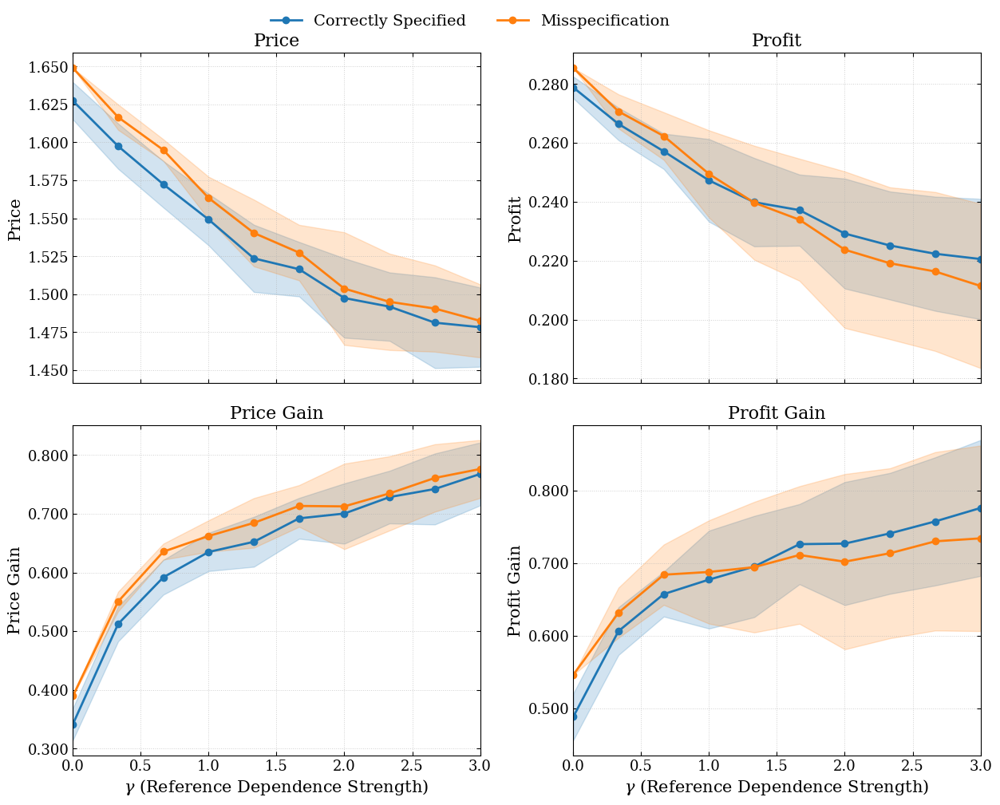

In [24]:
import os
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import pandas as pd
import numpy as np # Assuming load_gamma_metric might return numpy arrays or pandas Series


# ------------------------------------------------------------------
# 2×2 “quad” figure: Misspecification vs. Reference
# ------------------------------------------------------------------

# MODIFICATION: Enhanced plt.rcParams (consistent with previous figures)
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 16,
    'axes.labelsize': 15,
    'xtick.labelsize': 13,
    'ytick.labelsize': 13,
    'legend.fontsize': 14, # Slightly larger legend font
    'figure.titlesize': 18,
    'font.family': 'serif',
    'mathtext.fontset': 'dejavuserif',
})

# MODIFICATION: Configuration for human-readable metric names for titles
# (Assuming 'metrics' list contains the keys used here)
metrics_display_config = {
    "Price": "Price", # Displayed title for the "Price" metric
    "Profit": "Profit",
    "Price Gain": "Price Gain",
    "Profit Gain": "Profit Gain"
}
# Ensure 'metrics' is a list of keys present in metrics_display_config, e.g.,
# metrics = ["Price", "Profit", "Price Gain", "Profit Gain"]


# MODIFICATION: Increased figsize for better spacing and legend
fig_q, axes = plt.subplots(2, 2, figsize=(15, 10), sharex=True)
axes_flat = axes.flatten() # Use axes_flat for direct indexing

# We’ll collect handles and labels from the first subplot for the shared legend
# This ensures the legend order matches the plotting order if consistent
plot_handles_for_legend = []
plot_labels_for_legend = []
legend_elements_collected = False # Flag to collect legend items only once

# Iterate using enumerate for index, to apply x-label to bottom row
for idx, metric_csv_col_name in enumerate(metrics):
    ax = axes_flat[idx]
    # Use the display name from config, or fallback to the original metric name
    human_readable_title = metrics_display_config.get(metric_csv_col_name, metric_csv_col_name)

    first_gamma_series_for_xlim = None # To set x-limits based on actual data

    # ---------- Plotting Reference and Misspecification curves ----------
    # Define the order and properties for plotting
    plot_configs = [
        {'key': ('reference', True), 'color': ref_color, 'label_base': "Correctly Specified"},
        {'key': ('misspecification', True), 'color': mis_color, 'label_base': "Misspecification"}
    ]

    for config in plot_configs:
        demand_type, cr_flag = config['key']
        
        if config['key'] not in exp_dirs:
            print(f"Warning: Key {config['key']} not found in exp_dirs. Skipping plot for {config['label_base']}.")
            continue
            
        # Load data: gamma_values, mean_values, std_dev_values
        γ, μ, σ = load_gamma_metric(exp_dirs[config['key']], metric_csv_col_name)
        print(γ, μ)
        
        if γ is None or (hasattr(γ, 'empty') and γ.empty): # Check for empty or None data
            print(f"Warning: No data loaded for {config['label_base']} (CR={cr_flag}), metric {metric_csv_col_name}. Skipping plot.")
            continue
        
        if first_gamma_series_for_xlim is None: # Store the first valid gamma series
            first_gamma_series_for_xlim = γ

        # MODIFICATION: Consistent label format, CR=True is implied by the legend title
        label_text = config['label_base'] # Simplified label, as CR=True is constant here

        line, = ax.plot(γ, μ, color=config['color'], linestyle='-', # Solid line for both
                        marker='o', linewidth=2, markersize=6, label=label_text)
        ax.fill_between(γ, μ-σ, μ+σ, color=config['color'], alpha=0.2) # Slightly more visible error band

        # Collect legend items only from the first subplot and if not already collected
        if not legend_elements_collected:
            plot_handles_for_legend.append(line)
            plot_labels_for_legend.append(label_text)

    if not legend_elements_collected and plot_handles_for_legend:
        legend_elements_collected = True # Mark as collected after processing all lines for the first subplot

    # # ---------- Q‑learning curves (user's original commented out code - can be integrated similarly if needed) ----------
    # # ...

    # MODIFICATION: Enhanced axis cosmetics
    ax.set_title(human_readable_title)
    ax.grid(True, linestyle=':', linewidth=0.7, alpha=0.6) # Lighter, dotted grid
    ax.set_ylabel(human_readable_title) # Using descriptive title for y-label
    ax.tick_params(direction='in', top=True, right=True) # Inward ticks for a cleaner look


    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.3f'))

    # X-axis label for bottom row only
    if idx >= 2 : # Plots with index 2 and 3 are on the bottom row of a 2x2 grid
        ax.set_xlabel(r"$\gamma$ (Reference Dependence Strength)")
    # else: # Optional: remove x-tick labels from top plots when sharex=True
    #     ax.tick_params(labelbottom=False)

    # Set xlim based on actual data if available, otherwise default
    if first_gamma_series_for_xlim is not None and first_gamma_series_for_xlim.size > 0:
         ax.set_xlim(left=first_gamma_series_for_xlim.min(), right=first_gamma_series_for_xlim.max())
    else:
        ax.set_xlim(0, 3) # Default x-axis limits if no data


# # Try reducing the 'y' value for suptitle slightly if it's too high
# fig_q.suptitle("Impact of Model Misspecification on Market Outcomes (CR=True)", y=0.95, fontsize=plt.rcParams['figure.titlesize']) # REDUCED y from 1.02

# ---------------- Shared Legend (Top of the figure) & Layout ----------------
fig_q.legend(plot_handles_for_legend,
             plot_labels_for_legend,
             loc='upper center',
             bbox_to_anchor=(0.4, 1.02),  # Centered just above the plots
             ncol=len(plot_handles_for_legend),
             frameon=False)

# MODIFICATION: Adjusted tight_layout for suptitle and legend
fig_q.tight_layout(rect=[0, 0, 0.85, 1])

# MODIFICATION: More descriptive filename
quad_fname = "gamma_misspecification_vs_reference_quad.png"
fig_q.savefig(os.path.join(out_dir, quad_fname), dpi=300,
              bbox_inches='tight')

print(f"Figure saved to {os.path.join(out_dir, quad_fname)}")
# plt.show() # Uncomment to display the plot

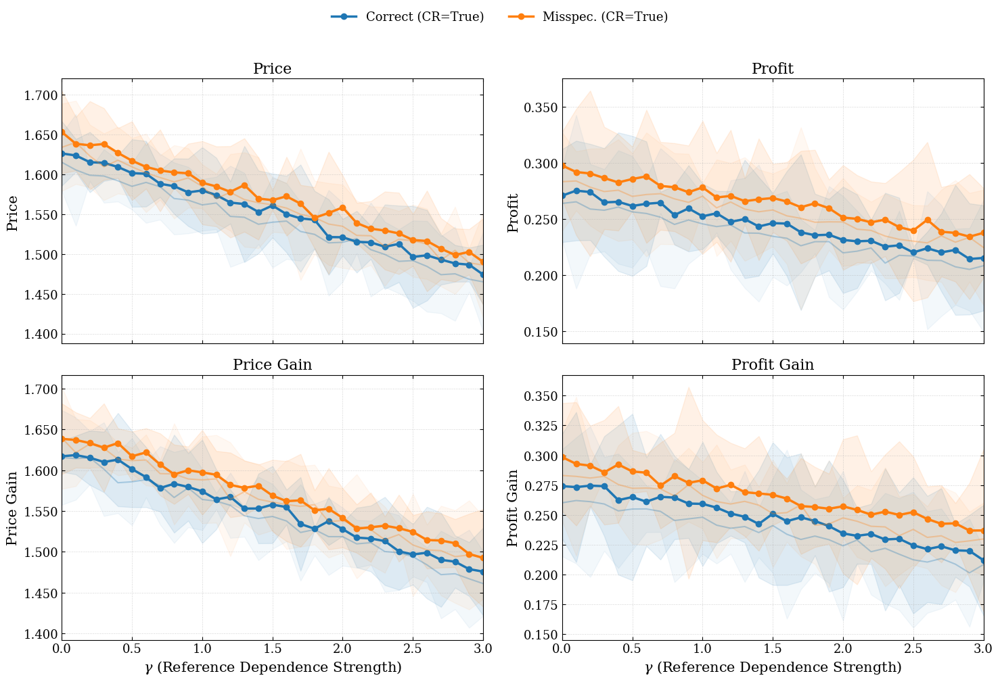

In [177]:
import os
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import pandas as pd
import numpy as np

plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 16,
    'axes.labelsize': 15,
    'xtick.labelsize': 13,
    'ytick.labelsize': 13,
    'legend.fontsize': 13,
    'figure.titlesize': 18,
    'font.family': 'serif',
    'mathtext.fontset': 'dejavuserif',
})

metrics_display_config = {
    "Price": "Price",
    "Profit": "Profit",
    "Price Gain": "Price Gain",
    "Profit Gain": "Profit Gain"
}

fig_q, axes = plt.subplots(2, 2, figsize=(15, 10), sharex=True)
axes_flat = axes.flatten()

plot_handles_for_legend = []
plot_labels_for_legend = []
legend_elements_collected = False

for idx, metric_csv_col_name in enumerate(metrics):
    ax = axes_flat[idx]
    human_readable_title = metrics_display_config.get(metric_csv_col_name, metric_csv_col_name)
    first_gamma_series_for_xlim = None

    plot_configs = [
        {'key': ('reference', True),  'color': 'tab:blue',   'label_base': "Correct (CR=True)",  'alpha': 1.0, 'lw': 2.5},
        {'key': ('misspecification', True), 'color': 'tab:orange', 'label_base': "Misspec. (CR=True)", 'alpha': 1.0, 'lw': 2.5},
        {'key': ('reference', False), 'color': 'tab:blue',   'label_base': "Correct (CR=False)", 'alpha': 0.3, 'lw': 1.5},
        {'key': ('misspecification', False), 'color': 'tab:orange', 'label_base': "Misspec. (CR=False)", 'alpha': 0.3, 'lw': 1.5},
    ]

    for config in plot_configs:
        demand_type, cr_flag = config['key']
        if config['key'] not in exp_dirs:
            continue

        γ, μ, σ = load_gamma_metric(exp_dirs[config['key']], metric_csv_col_name)
        if γ is None or (hasattr(γ, 'empty') and γ.empty):
            continue

        if first_gamma_series_for_xlim is None:
            first_gamma_series_for_xlim = γ

        line, = ax.plot(γ, μ,
                        color=config['color'],
                        linestyle='-',
                        alpha=config['alpha'],
                        linewidth=config['lw'],
                        marker='o' if cr_flag else None,
                        label=config['label_base'])
        ax.fill_between(γ, μ-σ, μ+σ, color=config['color'], alpha=0.1 if cr_flag else 0.05)

        if not legend_elements_collected and cr_flag:
            plot_handles_for_legend.append(line)
            plot_labels_for_legend.append(config['label_base'])

    if not legend_elements_collected:
        legend_elements_collected = True

    ax.set_title(human_readable_title)
    ax.grid(True, linestyle=':', linewidth=0.7, alpha=0.6)
    ax.set_ylabel(human_readable_title)
    ax.tick_params(direction='in', top=True, right=True)
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.3f'))
    if idx >= 2:
        ax.set_xlabel(r"$\gamma$ (Reference Dependence Strength)")
    if first_gamma_series_for_xlim is not None and first_gamma_series_for_xlim.size > 0:
        ax.set_xlim(left=first_gamma_series_for_xlim.min(), right=first_gamma_series_for_xlim.max())
    else:
        ax.set_xlim(0, 3)

# Shared legend
fig_q.legend(plot_handles_for_legend,
             plot_labels_for_legend,
             loc='upper center',
             bbox_to_anchor=(0.5, 1.02),
             ncol=2,
             frameon=False)

fig_q.tight_layout(rect=[0, 0, 1, 0.95])
quad_fname = "gamma_crtrue_vs_crfalse_highlighted.png"
fig_q.savefig(os.path.join(out_dir, quad_fname), dpi=300, bbox_inches='tight')


***
Lossaversion figure

In [2]:
import matplotlib.pyplot as plt
import os
import numpy as np
import pandas as pd
from glob import glob

def plot_lossaversion_quad(results_dir, metrics, experiment_name="*", figsize=(13, 9)):
    plt.rcParams.update({
    'font.size': 14,         # General font size
    'axes.titlesize': 16,    # Subplot title
    'axes.labelsize': 14,    # Axis labels
    'xtick.labelsize': 12,   # X-axis tick labels
    'ytick.labelsize': 12,   # Y-axis tick labels
    'legend.fontsize': 13,   # Legend text
    })

    fig_q, axes = plt.subplots(2, 2, figsize=figsize, sharex=True)
    metric_axes = dict(zip(metrics, axes.flatten()))
    handles_for_legend, labels_for_legend = None, None

    exp_dir = os.path.join(os.path.abspath(results_dir), experiment_name)
    run_dirs = glob(os.path.join(exp_dir, "lossaversion_*"))

    if not run_dirs:
        raise ValueError(f"No run directories found in {exp_dir}")

    for metric_name in metrics:
        ax = metric_axes[metric_name]
        lossaversion_values, metric_means, metric_stds = [], [], []

        for run_dir in run_dirs:
            try:
                dir_name = os.path.basename(run_dir)
                loss_val = float(dir_name.split("lossaversion_")[1])
                df = pd.read_csv(os.path.join(run_dir, "cycle_statistics.csv"))

                mean_col = [c for c in df.columns if c.startswith(f"mean_{metric_name.lower().replace(' ', '_')}_p")]
                std_col = [c for c in df.columns if c.startswith(f"std_{metric_name.lower().replace(' ', '_')}_p")]

                if mean_col and std_col:
                    metric_means.append(df[mean_col].mean(axis=1).iloc[0])
                    metric_stds.append(df[std_col].mean(axis=1).iloc[0])
                    lossaversion_values.append(loss_val)

            except Exception as e:
                print(f"Skipping {run_dir}: {e}")
                continue

        if not lossaversion_values:
            print(f"No data found for {metric_name}")
            continue

        # Sort
        sort_idx = np.argsort(lossaversion_values)
        x = np.array(lossaversion_values)[sort_idx]
        y = np.array(metric_means)[sort_idx]
        std = np.array(metric_stds)[sort_idx]

        #color = 'black'  # or customize per metric
        ax.plot(x, y, marker='o', linestyle='-', color='black', label=metric_name)
        ax.fill_between(x, y - std, y + std, color='black', alpha=0.2)

        ax.set_title(metric_name)
        ax.set_ylabel(metric_name)
        ax.set_xlabel("Loss Aversion($\phi$)")
        ax.grid(True, linestyle='--', alpha=0.4)

        if handles_for_legend is None:
            handles_for_legend, labels_for_legend = ax.get_legend_handles_labels()

    # fig_q.legend(handles_for_legend, labels_for_legend,
    #              loc='lower center', bbox_to_anchor=(0.5, 0.95),
    #              ncol=2, frameon=False)

    fig_q.tight_layout(rect=[0, 0, 1, 0.95])
    return fig_q


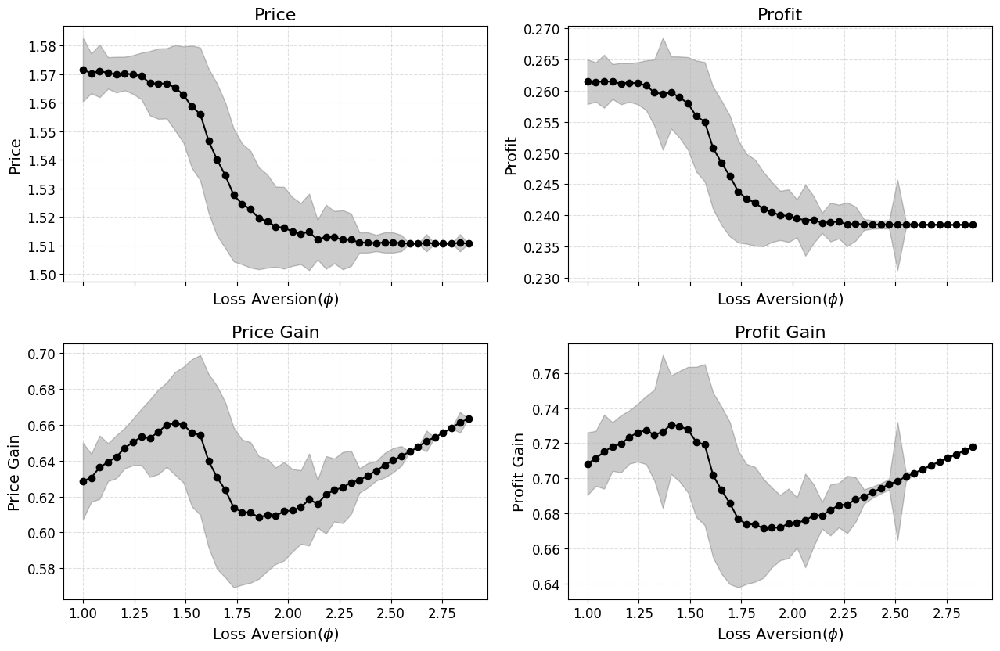

In [3]:
metrics = ["Price", "Profit", "Price Gain", "Profit Gain"]
fig = plot_lossaversion_quad("../Results_sockeye/experiments", metrics, experiment_name="final_gamma_only/lossaversion")
fig.savefig("lossaversion_quad.png", dpi=300, bbox_inches='tight')

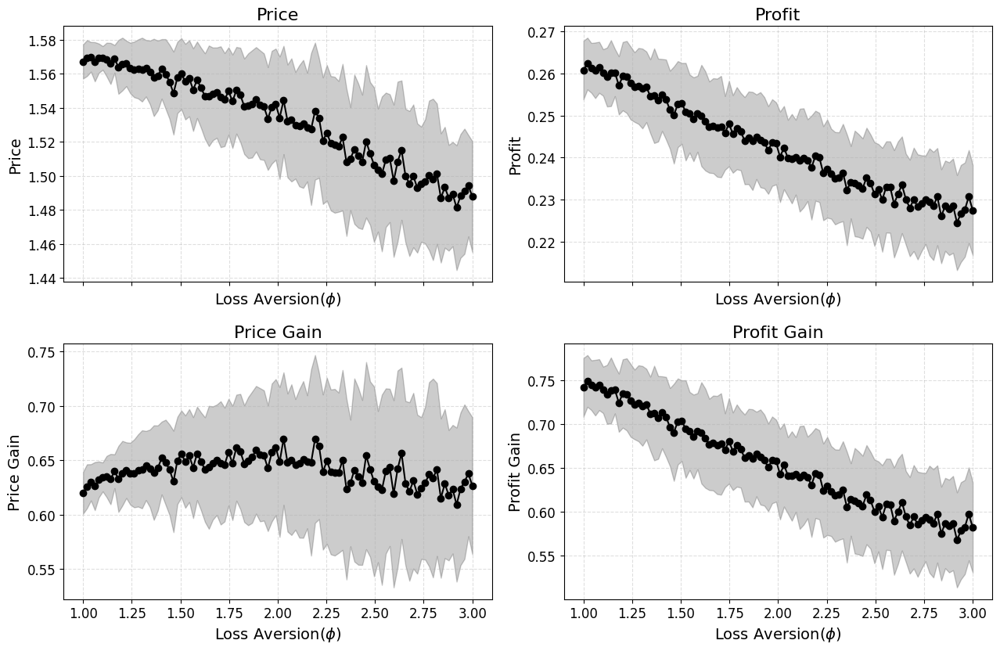

In [3]:
metrics = ["Price", "Profit", "Price Gain", "Profit Gain"]
fig = plot_lossaversion_quad("../Results_sockeye/experiments", metrics, experiment_name="reference_impact_loss_aversion/loss_aversion_parameter")
fig.savefig("lossaversion_quad.png", dpi=300, bbox_inches='tight')

In [1]:
import matplotlib.pyplot as plt
import os
import numpy as np
import pandas as pd
from glob import glob
from itertools import cycle

def plot_lossaversion_quad_multi(repos, metrics, run_glob="lossaversion_*", figsize=(13, 9)):
    """
    Plot the same set of `metrics` across multiple repositories/experiments
    on a single 2x2 grid of subplots. Each repo/experiment gets its own line.

    Parameters
    ----------
    repos : list of dict
        Each dict must have:
          - "results_dir": path to the experiments root
          - "experiment_name": subdir under results_dir to search
          - "label": legend label for this repo/experiment
        Optional:
          - "color", "linestyle", "marker"
    metrics : list of str
        Metric names to plot (length up to 4 to fit nicely in a 2x2).
    run_glob : str
        Glob for run directories inside the experiment (default: "lossaversion_*").
    figsize : tuple
        Figure size.
    """
    plt.rcParams.update({
        'font.size': 14,
        'axes.titlesize': 16,
        'axes.labelsize': 14,
        'xtick.labelsize': 12,
        'ytick.labelsize': 12,
        'legend.fontsize': 13,
    })

    # Set up the 2x2 grid
    fig, axes = plt.subplots(2, 2, figsize=figsize, sharex=True)
    axes = axes.flatten()
    if len(metrics) > len(axes):
        raise ValueError(f"Provide at most {len(axes)} metrics for a 2x2 plot.")

    metric_axes = {m: axes[i] for i, m in enumerate(metrics)}

    # Simple style cyclers in case user doesn't provide explicit styles
    color_cycler = cycle(plt.rcParams['axes.prop_cycle'].by_key().get('color', ['C0','C1','C2','C3','C4']))
    linestyle_cycler = cycle(['-', '--', '-.', ':'])
    marker_cycler = cycle(['o', 's', '^', 'D', 'P', 'X'])

    # For each repo/experiment, extract points and plot onto each metric's axis
    for repo in repos:
        results_dir = repo['results_dir']
        experiment_name = repo['experiment_name']
        label = repo.get('label', experiment_name)

        color = repo.get('color', next(color_cycler))
        linestyle = repo.get('linestyle', next(linestyle_cycler))
        #marker = repo.get('marker', next(marker_cycler))
        marker = ' '

        exp_dir = os.path.join(os.path.abspath(results_dir), experiment_name)
        run_dirs = glob(os.path.join(exp_dir, run_glob))

        if not run_dirs:
            print(f"[WARN] No run directories found in {exp_dir} with glob '{run_glob}'")
            continue

        # Gather data for all metrics for this repo/experiment
        per_metric_data = {m: {'x': [], 'y': [], 'std': []} for m in metrics}

        for run_dir in run_dirs:
            try:
                dir_name = os.path.basename(run_dir)
                # Expecting something like ".../lossaversion_0.5"
                loss_val = float(dir_name.split("lossaversion_")[1])
                df = pd.read_csv(os.path.join(run_dir, "cycle_statistics.csv"))

                for metric_name in metrics:
                    mean_col = [c for c in df.columns if c.startswith(f"mean_{metric_name.lower().replace(' ', '_')}_p")]
                    std_col  = [c for c in df.columns if c.startswith(f"std_{metric_name.lower().replace(' ', '_')}_p")]

                    if mean_col:
                        # Keep your original behavior: average across the phase columns, then take the first row.
                        # (If you actually want the last row, change .iloc[0] -> .iloc[-1].)
                        y_val = df[mean_col].mean(axis=1).iloc[0]
                        per_metric_data[metric_name]['y'].append(float(y_val))
                        if std_col:
                            std_val = df[std_col].mean(axis=1).iloc[0]
                            per_metric_data[metric_name]['std'].append(float(std_val))
                        else:
                            per_metric_data[metric_name]['std'].append(0.0)
                        per_metric_data[metric_name]['x'].append(loss_val)

            except Exception as e:
                print(f"[WARN] Skipping {run_dir}: {e}")
                continue

        # Plot this repo's line for each metric
        for metric_name in metrics:
            ax = metric_axes[metric_name]
            data = per_metric_data[metric_name]

            if not data['x']:
                print(f"[INFO] No data found for {metric_name} in {label}")
                continue

            # Sort by loss aversion for a tidy line
            sort_idx = np.argsort(data['x'])
            x = np.array(data['x'])[sort_idx]
            y = np.array(data['y'])[sort_idx]
            std = np.array(data['std'])[sort_idx]

            ax.plot(x, y, marker=marker, linestyle=linestyle, label=label, color=color)
            if np.any(std > 0):
                ax.fill_between(x, y - 0.5*std, y + 0.5*std, alpha=0.2, color=color)

            ax.set_title(metric_name)
            ax.set_ylabel(metric_name)
            ax.set_xlabel(r"Loss Aversion ($\phi$)")
            ax.grid(True, linestyle='--', alpha=0.4)

    # Add a shared legend (only for axes that actually have lines)
    handles, labels = [], []
    for ax in metric_axes.values():
        h, l = ax.get_legend_handles_labels()
        handles.extend(h)
        labels.extend(l)
    if handles:
        # de-duplicate while preserving order
        seen = set()
        uniq = [(h, l) for h, l in zip(handles, labels) if not (l in seen or seen.add(l))]
        handles, labels = zip(*uniq)
        #fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, 0.98), ncol=min(len(uniq), 4), frameon=False)

    fig.tight_layout(rect=[0, 0, 1, 0.96])
    return fig


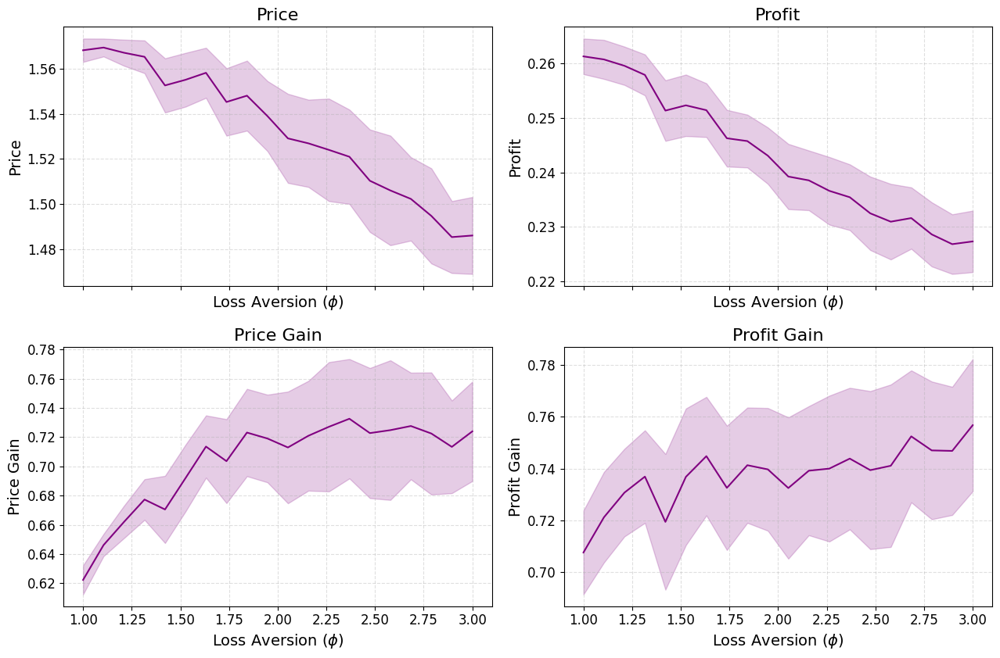

In [20]:
metrics = ["Price", "Profit", "Price Gain", "Profit Gain"]

repos = [
    {
        "results_dir": "../Results/experiments",
        "experiment_name": "loss_extreme/lossaversion_reverse",
       # "label": "final_gamma_only",
        "color": "purple",   # <-- explicitly set purple
    },
    # {
    #     "results_dir": "../Results_sockeye/experiments",
    #     "experiment_name": "reference_impact_loss_aversion/loss_aversion_parameter",
    #     "label": "reference_impact",
    #     "color": "blue",     # <-- explicitly set blue
    # },
]

fig = plot_lossaversion_quad_multi(repos, metrics)
#fig.savefig("lossaversion_quad_overlay.png", dpi=300, bbox_inches='tight')


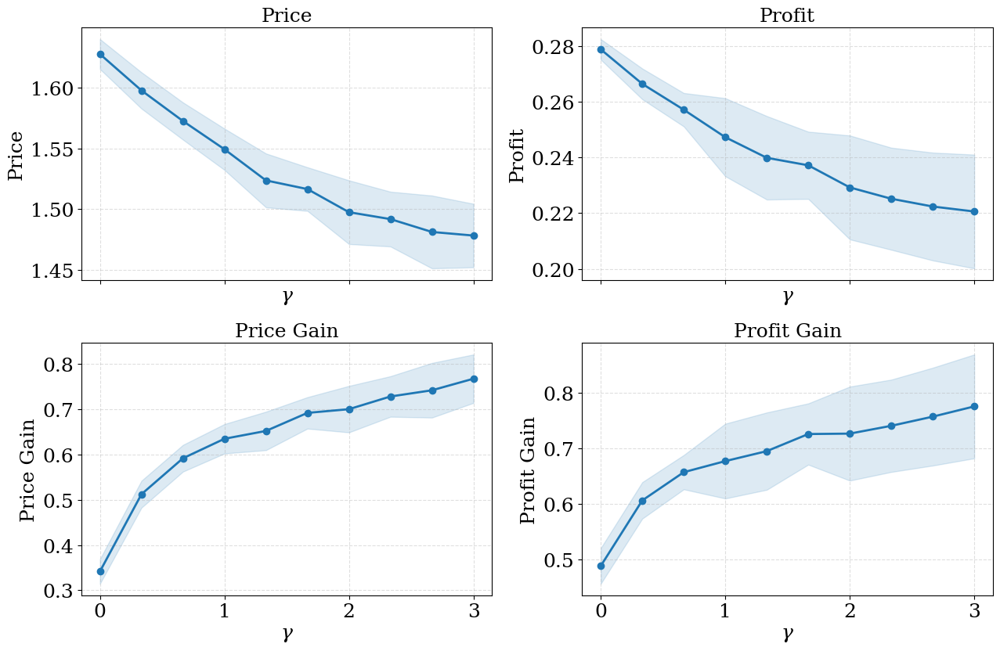

In [57]:
# ------------------------------------------------------------------
# 2×2 “quad” figure with ONE legend
# ------------------------------------------------------------------
plt.rcParams.update({
    'font.size': 14,         # General font size
    'axes.titlesize': 18,    # Subplot title
    'axes.labelsize': 18,    # Axis labels
    'xtick.labelsize': 18,   # X-axis tick labels
    'ytick.labelsize': 18,   # Y-axis tick labels
    'legend.fontsize': 18,   # Legend text
})
fig_q, axes = plt.subplots(2, 2, figsize=(13, 9), sharex=True)
metric_axes = dict(zip(metrics, axes.flatten()))   # map metric → subplot

# we’ll collect the handles once (first metric) for the global legend
handles_for_legend, labels_for_legend = None, None

for metric_name in metrics:
    ax = metric_axes[metric_name]

    # ---------- grid‑search curves ----------
    for demand, cr in [('reference', True)]:
                    #    ('reference', False),
                    #    ('misspecification', True),
                    #    ('misspecification', False)]:
        γ, μ, σ = load_gamma_metric(exp_dirs[(demand, cr)], metric_name)
        color     = ref_color if demand == 'reference' else mis_color
        linestyle = '-' if cr else '--'
        label     = f"{demand.capitalize()} (CR={cr})"

        ln, = ax.plot(γ, μ, color=color, linestyle=linestyle,
                      marker='o', linewidth=2, label=label)
        ax.fill_between(γ, μ-σ, μ+σ, color=color, alpha=0.15)

    # # ---------- Q‑learning curves ----------
    # for cr in [True, False]:
    #     γ, μ, σ = load_gamma_only_metric(exp_dirs[('qlr_reference', cr)], metric_name)
    #     linestyle = '-' if cr else '--'
    #     label     = f"Q‑learning Ref (CR={cr})"

    #     ln, = ax.plot(γ, μ, color=qlr_color, linestyle=linestyle,
    #                   marker='D', linewidth=2, label=label)
    #     ax.fill_between(γ, μ-σ, μ+σ, color=qlr_color, alpha=0.15)

    # axis cosmetics
    ax.set_title(metric_name)
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_ylabel(metric_name)                  # show y‑label on every panel                        # bottom row only
    ax.set_xlabel(r"$\gamma$")
    ax.set_ylabel(metric_name)

    # grab legend handles/labels once
    if handles_for_legend is None:
        handles_for_legend, labels_for_legend = ax.get_legend_handles_labels()

# ---------------- shared legend & layout ----------------
# fig_q.legend(handles_for_legend,
#              labels_for_legend,
#              loc='lower center',        # anchor it to the top edge
#              bbox_to_anchor=(0.95, 0.85),# (x‑centre, just above 1.0)
#              ncol=3,                    # 3 columns  → 2 rows of labels
#              frameon=False)

# leave 10 % of the height for that legend bar
fig_q.tight_layout(rect=[0, 0, 1, 0.95])

quad_fname = "gamma_all6_quad.png"
fig_q.savefig(os.path.join(out_dir, quad_fname), dpi=300,
              bbox_inches='tight')

***
alpha figures side by side

In [51]:
import os

# 1) base paths
folder   = "../Results_sockeye/experiments"
experiment_base = "alpha_beta_cr/alpha_beta"

# 2) prepare your five directory paths
exp_dirs = {
    'no_reference':                os.path.join(folder, f"{experiment_base}_noreference_True"),
    ('reference',      True):      os.path.join(folder, f"{experiment_base}_reference_True"),
    ('reference',      False):     os.path.join(folder, f"{experiment_base}_reference_False"),
    ('misspecification', True):    os.path.join(folder, f"{experiment_base}_misspecification_True"),
    ('misspecification', False):   os.path.join(folder, f"{experiment_base}_misspecification_False"),
}

# 3) output directory
out_folder = os.path.join(folder, experiment_base, "Comparative_Figures")
os.makedirs(out_folder, exist_ok=True)

# 4) metrics to plot
metrics = ["Price", "Profit", "Surplus", "Cycle Length", "Price Gain", "Profit Gain"]

# 5) loop & save
for metric in metrics:
    fig = create_5group_comparative_heatmaps(
        results_dir=folder,
        experiment_dirs=exp_dirs,
        metric_name=metric,
        figsize=(24, 10)
    )

    # safe filename
    fname = metric.lower().replace(" ", "_") + "_alpha_beta_compare.png"
    save_path = os.path.join(out_folder, fname)

    fig.savefig(save_path, dpi=300)
    print(f"Saved {metric} comparison → {save_path}")
    plt.close(fig)  # free memory


Saved Price comparison → ../Results_sockeye/experiments/alpha_beta_cr/alpha_beta/Comparative_Figures/price_alpha_beta_compare.png
Saved Profit comparison → ../Results_sockeye/experiments/alpha_beta_cr/alpha_beta/Comparative_Figures/profit_alpha_beta_compare.png
Saved Surplus comparison → ../Results_sockeye/experiments/alpha_beta_cr/alpha_beta/Comparative_Figures/surplus_alpha_beta_compare.png
Saved Cycle Length comparison → ../Results_sockeye/experiments/alpha_beta_cr/alpha_beta/Comparative_Figures/cycle_length_alpha_beta_compare.png
Saved Price Gain comparison → ../Results_sockeye/experiments/alpha_beta_cr/alpha_beta/Comparative_Figures/price_gain_alpha_beta_compare.png
Saved Profit Gain comparison → ../Results_sockeye/experiments/alpha_beta_cr/alpha_beta/Comparative_Figures/profit_gain_alpha_beta_compare.png


***
Code for profit gain in logit

Calculating SMOOTH equilibria for 10 gamma values...
[0.47292666 0.47292666] [0.47137681 0.47137681]
[0.92498092 0.92498092] [0.36486208 0.36486208]
[0.42918337 0.42918337] [0.47574856 0.47574856]
[0.89900319 0.89900319] [0.3748614 0.3748614]
[0.39253811 0.39253811] [0.47891568 0.47891568]
[0.87608946 0.87608946] [0.38326223 0.38326223]
[0.36147175 0.36147175] [0.48128727 0.48128727]
[0.85561604 0.85561604] [0.39042982 0.39042982]
[0.33484542 0.33484542] [0.48311396 0.48311396]
[0.83713022 0.83713022] [0.39662485 0.39662485]
[0.31179727 0.31179727] [0.48455519 0.48455519]
[0.82029337 0.82029337] [0.40203853 0.40203853]
[0.29166758 0.29166758] [0.4857159 0.4857159]
[0.80484571 0.80484571] [0.40681444 0.40681444]
[0.27394518 0.27394518] [0.48666737 0.48666737]
[0.79058376 0.79058376] [0.41106255 0.41106255]
[0.25822915 0.25822915] [0.48745934 0.48745934]
[0.77734524 0.77734524] [0.41486862 0.41486862]
[0.24420138 0.24420138] [0.48812738 0.48812738]
[0.7649987 0.7649987] [0.41830051 0.418

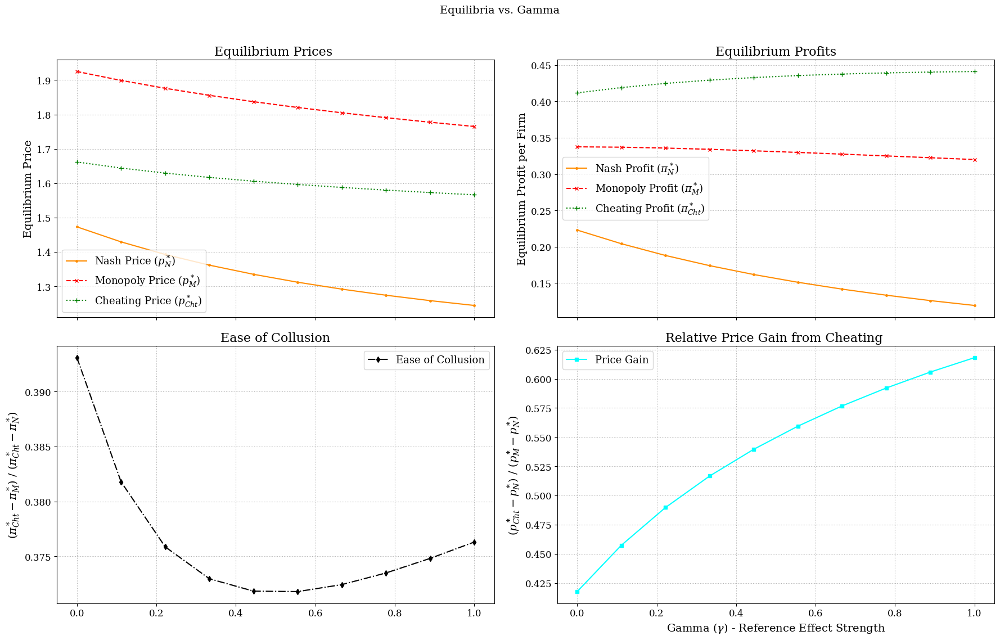

Plot display finished.


In [30]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve
from itertools import product

# --- Model Class Definition with SMOOTH FOCs ---
# (Keep the model class definition exactly as in the previous version)
class model(object):
    """
    Model of algorithms and competition
    (Calculates Nash, Monopoly, and Cheating equilibria using SMOOTH FOCs)
    """

    def __init__(self, **kwargs):
        """Initialize game and compute equilibria"""
        # Default properties
        self.n = kwargs.get('n', 2)
        self.gamma = kwargs.get('gamma', 1)
        self.lossaversion = kwargs.get('lossaversion', 1.0)
        self.c = kwargs.get('c', 1)
        self.a = kwargs.get('a', 2)
        self.a0 = kwargs.get('a0', 0)
        self.mu = kwargs.get('mu', 0.25)
        self.common_reference = kwargs.get('common_reference', True)
        self.demand_type = kwargs.get('demand_type', 'reference')
        self.foc_smoothness = kwargs.get('foc_smoothness', 40) # Steepness factor

        if self.gamma > 0 and self.demand_type == 'noreference':
             self.demand_type = 'reference'

        valid_demand_types = {'reference', 'noreference','misspecification'}
        if self.demand_type not in valid_demand_types:
            raise ValueError(f"Invalid demand_type: {self.demand_type}. Allowed values: {valid_demand_types}")

        self.reference_loss_aversion = self.lossaversion > 1

        # --- Compute Nash, Monopoly, and Cheating equilibria ---
        p0_nash = np.ones(self.n) * self.c * 1.5 # Initial guess Nash
        p0_coop = np.ones(self.n) * self.c * 2.5 # Initial guess Coop

        # Initialize result arrays with NaNs
        self.p_nash = np.full(self.n, np.nan)
        self.NashProfits = np.full(self.n, np.nan)
        self.p_coop = np.full(self.n, np.nan)
        self.CoopProfits = np.full(self.n, np.nan)
        self.p_cheat = np.nan
        self.CheatProfit = np.nan

        try:
            p_nash_sol = fsolve(self.foc, p0_nash, xtol=1.49012e-08)
            p_coop_sol = fsolve(self.foc_monopoly, p0_coop, xtol=1.49012e-08)

            valid_nash = not np.isnan(p_nash_sol).any() and all(p_nash_sol > -1e-6)
            valid_coop = not np.isnan(p_coop_sol).any() and all(p_coop_sol > -1e-6)

            if valid_nash:
                self.p_nash = p_nash_sol
                r_nash = self.reference_price(self.p_nash)
                nash_demand = self.demand(self.p_nash, r=r_nash)
                self.NashProfits = (self.p_nash - self.c) * nash_demand
                print((self.p_nash - self.c), nash_demand)

            if valid_coop:
                self.p_coop = p_coop_sol
                r_coop = self.reference_price(self.p_coop)
                coop_demand = self.demand(self.p_coop, r=r_coop)
                self.CoopProfits = (self.p_coop - self.c) * coop_demand
                print((self.p_coop - self.c), coop_demand)

                if valid_nash: # Need Nash profit for the gain calculation later
                    p_M = self.p_coop[0]
                    # Use a guess below Nash, as cheating price is typically low
                    p0_cheat = self.p_nash[0] * 0.95 if self.p_nash[0] > 0 else p_M * 0.9 

                    try:
                        p_cheat_sol = fsolve(self.foc_cheat, p0_cheat, args=(p_M,), xtol=1.49012e-08)
                        # print('cheat', p_cheat_sol)
                        # print('nash,coop', self.p_nash[0], p_M)

                        # Check if result is a single value array
                        if isinstance(p_cheat_sol, (np.ndarray, list)) and len(p_cheat_sol) > 0:
                           p_cheat_val = p_cheat_sol[0]
                        else:
                           p_cheat_val = p_cheat_sol # Assume scalar if not array

                        if not np.isnan(p_cheat_val) and p_cheat_val > -1e-6:
                            self.p_cheat = p_cheat_val # Store the scalar value
                            p_vector_cheat = np.full(self.n, p_M)
                            p_vector_cheat[0] = self.p_cheat
                            r_cheat = p_M
                            cheat_demand_vector = self.demand(p_vector_cheat, r=r_cheat)
                            self.CheatProfit = (self.p_cheat - self.c) * cheat_demand_vector[0]
                        # else: print(f"Debug: Invalid/NaN Cheating price (smooth) gamma={self.gamma}, sol={p_cheat_sol}")
                    except Exception as e_cheat:
                        print(f"Error solving smooth cheating price gamma={self.gamma}: {e_cheat}")
                # else: print(f"Debug: Nash invalid, cannot calculate cheat gain (smooth) gamma={self.gamma}")
            # else: print(f"Debug: Invalid/NaN Coop price (smooth) gamma={self.gamma}")

        except Exception as e_fsolve:
            print(f"Error during smooth fsolve for gamma={self.gamma}: {e_fsolve}")


    # --- Demand and Reference Price ---
    def reference_price(self, p):
        if self.common_reference:
            p_array = np.atleast_1d(p); return np.mean(p_array)
        else: return p

    def demand(self, p, r=None):
        p = np.asarray(p)
        if self.demand_type == 'noreference':
            e = np.exp((self.a - p) / self.mu)
            sum_e = np.sum(e) if e.ndim > 0 else e
            d = e / (sum_e + np.exp(self.a0 / self.mu))
        elif self.demand_type in ["reference", "misspecification"]:
            if r is None: r = self.reference_price(p)
            r = np.asarray(r)
            if self.common_reference and r.ndim == 0: r = np.full_like(p, r)
            p_eff = p + self.gamma * (p - r)
            if self.reference_loss_aversion:
                # Demand calculation still uses hard step logic
                price_above_r = p >= r; price_below_r = p < r
                p_eff = (p + self.gamma * (p - r) * price_below_r +
                         self.lossaversion * self.gamma * (p - r) * price_above_r)
            e = np.exp((self.a - p_eff) / self.mu)
            sum_e = np.sum(e) if e.ndim > 0 else e
            d = e / (sum_e + np.exp(self.a0 / self.mu))
        return d

    # --- SMOOTH FOC Functions ---
    def foc(self, p):
        """Compute first order condition using SMOOTH indicators"""
        p = np.asarray(p); r_eq = self.reference_price(p); d = self.demand(p, r=r_eq)
        one_minus_d = (1 - d) if d.ndim == 0 or d.shape[0] == 1 else (1 - d)
        if self.demand_type == 'noreference':
             zero = 1 - (p - self.c) * one_minus_d / self.mu
        elif self.demand_type in ["reference", "misspecification"]:
            p_i = p[0]; r_i = r_eq[0] if isinstance(r_eq, np.ndarray) else r_eq # Check at symmetric point
            if self.reference_loss_aversion:
                price_above_r = 1 / (1 + np.exp(-self.foc_smoothness * (p_i - r_i)))
                price_below_r = 1 / (1 + np.exp(self.foc_smoothness * (p_i - r_i)))
                derivative_factor = (1 + self.gamma * price_below_r + self.lossaversion * self.gamma * price_above_r)
            else: derivative_factor = (1 + self.gamma)
            zero = 1 - derivative_factor * (p - self.c) * one_minus_d / self.mu
        return np.squeeze(zero)

    def foc_monopoly(self, p):
        """Compute first-order condition for collusion using SMOOTH indicators"""
        p = np.asarray(p); r_eq = self.reference_price(p); d = self.demand(p, r=r_eq)
        p_vec = p.reshape(-1, 1) if p.ndim == 1 else p; d_vec = d.reshape(-1, 1) if d.ndim == 1 else d
        profit_margin = p_vec - self.c; total_contribution = np.sum(profit_margin * d_vec)
        own_contribution = profit_margin * d_vec; one_minus_d = 1.0 - d_vec
        if self.demand_type == 'noreference':
            zero = 1 - (profit_margin * one_minus_d / self.mu) + ((total_contribution - own_contribution) / self.mu)
        elif self.demand_type in ["reference", "misspecification"]:
            p_i = p[0]; r_i = r_eq[0] if isinstance(r_eq, np.ndarray) else r_eq
            if self.reference_loss_aversion:
                price_above_r = 1 / (1 + np.exp(-self.foc_smoothness * (p_i - r_i)))
                price_below_r = 1 / (1 + np.exp(self.foc_smoothness * (p_i - r_i)))
                derivative_factor = (1 + self.gamma * price_below_r + self.lossaversion * self.gamma * price_above_r)
            else: derivative_factor = (1 + self.gamma)
            zero = 1 - derivative_factor * (profit_margin * one_minus_d / self.mu) \
                     + derivative_factor * ((total_contribution - own_contribution) / self.mu)
        return np.squeeze(zero)

    # --- new, cleaner FOC for a one-shot deviator ------------------------
    def foc_cheat(self, p_i_cheat, p_M):
        """
        FOC: firm 1 deviates (p_i_cheat), firm 2 sticks to cartel price p_M (= r)
        Solves  1 - (p_i - c) * (1+γ) * (1-s_i)/μ = 0   (below-reference case)
        """
        p_i = float(np.asarray(p_i_cheat).ravel()[0])   # scalar
        p_j = r = float(p_M)

        # price vector and demand
        p_vec = np.array([p_i, p_j])
        s_vec = self.demand(p_vec, r=r)
        s_i  = s_vec[0]
        one_minus_si = 1.0 - s_i

        derivative_factor = (1 + self.gamma)       # below-reference ⇒ γ_b = γ
        # (If you keep loss‑aversion, add a branch: if p_i > r use 1+φγ.)

        zero = 1.0 - (p_i - self.c) * derivative_factor * one_minus_si / self.mu
        return zero   # scalar; fsolve expects a 0 of this function


# --- Calculation Loop ---
gamma_values = np.linspace(0, 1, 10)
nash_prices_smooth = []
nash_profits_smooth = []
monopoly_prices_smooth = []
monopoly_profits_smooth = []
cheat_prices_smooth = []
cheat_profits_smooth = []
profit_gains_smooth = []
price_gains_smooth = [] # New list for price gain metric
deltas_smooth = []

model_params = {
    'n': 2, 'c': 1, 'a': 2.0, 'mu': 0.25, 'a0': 0.0,
    'lossaversion': 1, 'foc_smoothness': 40,
    'common_reference': True, 'demand_type': 'reference'
}

print(f"Calculating SMOOTH equilibria for {len(gamma_values)} gamma values...")
for gamma in gamma_values:
    current_params = model_params.copy(); current_params['gamma'] = gamma
    p_N, p_M, p_Cht = np.nan, np.nan, np.nan # Initialize prices
    pi_N, pi_M, pi_Cht = np.nan, np.nan, np.nan # Initialize profits
    try:
        m = model(**current_params)

        # Extract results and store intermediate values
        p_N = m.p_nash[0] if not np.isnan(m.p_nash).any() else np.nan
        nash_prices_smooth.append(p_N)
        pi_N = m.NashProfits[0] if not np.isnan(m.NashProfits).any() else np.nan
        nash_profits_smooth.append(pi_N)

        p_M = m.p_coop[0] if not np.isnan(m.p_coop).any() else np.nan
        monopoly_prices_smooth.append(p_M)
        pi_M = m.CoopProfits[0] if not np.isnan(m.CoopProfits).any() else np.nan
        monopoly_profits_smooth.append(pi_M)

        p_Cht = m.p_cheat if not np.isnan(m.p_cheat) else np.nan # Already scalar
        cheat_prices_smooth.append(p_Cht)
        pi_Cht = m.CheatProfit if not np.isnan(m.CheatProfit) else np.nan
        cheat_profits_smooth.append(pi_Cht)

        # Calculate Profit Gain
        profit_gain = np.nan
        if not np.isnan(pi_Cht) and not np.isnan(pi_M) and not np.isnan(pi_N):
            denominator = pi_M - pi_N
            if abs(denominator) > 1e-9:
                 numerator = pi_Cht - pi_N
                 if numerator >= -1e-9:
                    profit_gain = numerator / denominator
        profit_gains_smooth.append(profit_gain)

        # Calculate Price Gain
        price_gain = np.nan
        if not np.isnan(p_Cht) and not np.isnan(p_M) and not np.isnan(p_N):
             denominator = p_M - p_N # Use p_N here
             if abs(denominator) > 1e-9:
                  numerator = p_Cht - p_N # Use p_M here
                  # Allow numerator to be positive or negative, as p_Cht can be > or < p_M theoretically
                  price_gain = numerator / denominator
             # else: print(f"Debug: Denominator zero/small for price gain calc gamma={gamma}")
        price_gains_smooth.append(price_gain)

        # Calculate Price Gain
        delta = np.nan
        if not np.isnan(p_Cht) and not np.isnan(p_M) and not np.isnan(p_N):
             denominator = pi_Cht - pi_N # Use p_N here
             if abs(denominator) > 1e-9:
                  numerator = pi_Cht - pi_M # Use p_M here
                  # Allow numerator to be positive or negative, as p_Cht can be > or < p_M theoretically
                  delta = numerator / denominator
             # else: print(f"Debug: Denominator zero/small for price gain calc gamma={gamma}")
        deltas_smooth.append(delta)


    except Exception as e:
         print(f"Error processing smooth gamma = {gamma}: {e}")
         nash_prices_smooth.append(np.nan); nash_profits_smooth.append(np.nan)
         monopoly_prices_smooth.append(np.nan); monopoly_profits_smooth.append(np.nan)
         cheat_prices_smooth.append(np.nan); cheat_profits_smooth.append(np.nan)
         profit_gains_smooth.append(np.nan)
         price_gains_smooth.append(np.nan) # Append NaN on error

print("Calculation complete.")
print(gamma_values, nash_profits_smooth, monopoly_profits_smooth)

# Convert lists to numpy arrays
nash_prices_smooth = np.array(nash_prices_smooth); nash_profits_smooth = np.array(nash_profits_smooth)
monopoly_prices_smooth = np.array(monopoly_prices_smooth); monopoly_profits_smooth = np.array(monopoly_profits_smooth)
cheat_prices_smooth = np.array(cheat_prices_smooth); cheat_profits_smooth = np.array(cheat_profits_smooth)
profit_gains_smooth = np.array(profit_gains_smooth)
price_gains_smooth = np.array(price_gains_smooth) # Convert price gains
deltas_smooth = np.array(deltas_smooth) # Convert price gains


# --- Plotting ---
print("Generating plots...")
plt.rcParams.update({
    'font.size': 14,         # General font size
    'axes.titlesize': 16,    # Subplot title
    'axes.labelsize': 14,    # Axis labels
    'xtick.labelsize': 12,   # X-axis tick labels
    'ytick.labelsize': 12,   # Y-axis tick labels
    'legend.fontsize': 13,   # Legend text
})
# Create 4 rows of subplots
fig, ax = plt.subplots(2, 2, figsize=(18, 12), sharex=True) # Adjusted rows and height
fig.suptitle('Equilibria vs. Gamma', fontsize=14)

# Plot 1: Prices vs Gamma
ax[0,0].plot(gamma_values, nash_prices_smooth, marker='.', linestyle='-', markersize=5,color='darkorange', label='Nash Price ($p_N^*$)')
ax[0,0].plot(gamma_values, monopoly_prices_smooth, marker='x', linestyle='--', markersize=5, color='red', label='Monopoly Price ($p_M^*$)')
ax[0,0].plot(gamma_values, cheat_prices_smooth, marker='+', linestyle=':', markersize=6, color='green', label='Cheating Price ($p_{Cht}^*$)')
ax[0,0].set_ylabel('Equilibrium Price')
ax[0,0].set_title('Equilibrium Prices ')
ax[0,0].legend()
ax[0,0].grid(True, linestyle=':')
if np.isnan(nash_prices_smooth).any() or np.isnan(monopoly_prices_smooth).any() or np.isnan(cheat_prices_smooth).any():
    ax[0].text(0.95, 0.05, 'NaNs present', transform=ax[0].transAxes, ha='right', va='bottom', color='red', style='italic')

# Plot 2: Profits vs Gamma
ax[0,1].plot(gamma_values, nash_profits_smooth, marker='.', linestyle='-', color='darkorange', markersize=5, label='Nash Profit ($\pi_N^*$)')
ax[0,1].plot(gamma_values, monopoly_profits_smooth, marker='x', linestyle='--', color='red', markersize=5, label='Monopoly Profit ($\pi_M^*$)')
ax[0,1].plot(gamma_values, cheat_profits_smooth, marker='+', linestyle=':', color='green', markersize=6, label='Cheating Profit ($\pi_{Cht}^*$)')
ax[0,1].set_ylabel('Equilibrium Profit per Firm')
ax[0,1].set_title('Equilibrium Profits')
ax[0,1].legend()
ax[0,1].grid(True, linestyle=':')
if np.isnan(nash_profits_smooth).any() or np.isnan(monopoly_profits_smooth).any() or np.isnan(cheat_profits_smooth).any():
    ax[1].text(0.95, 0.05, 'NaNs present', transform=ax[1].transAxes, ha='right', va='bottom', color='red', style='italic')

# # Plot 3: Profit Gain
# ax[1,0].plot(gamma_values, profit_gains_smooth, marker='d', linestyle='-.', color='purple', markersize=5, label='Profit Gain')
# # ax[2].axhline(1, color='grey', linestyle='--', linewidth=0.8, label='Gain = 1')
# # ax[2].axhline(0, color='grey', linestyle=':', linewidth=0.8, label='Gain = 0')
# ax[1,0].set_ylabel('($\pi_{Cht}^* - \pi_N^*$) / ($\pi_M^* - \pi_N^*$)') # More explicit label
# ax[1,0].set_title('Relative Profit Gain from Cheating (Smooth FOC)')
# ax[1,0].legend()
# ax[1,0].grid(True, linestyle=':')
# if np.isnan(profit_gains_smooth).any():
#     ax[1,0].text(0.95, 0.05, 'NaNs present', transform=ax[2].transAxes, ha='right', va='bottom', color='red', style='italic')

# Plot 4: Price Gain (NEW PLOT)
ax[1,1].plot(gamma_values, price_gains_smooth, marker='s', linestyle='-', color='cyan', markersize=4, label='Price Gain')
# ax[3].axhline(1, color='grey', linestyle='--', linewidth=0.8, label='Gain = 1') # Ref line at 1
# ax[3].axhline(0, color='grey', linestyle=':', linewidth=0.8, label='Gain = 0') # Ref line at 0
ax[1,1].set_xlabel('Gamma ($\gamma$) - Reference Effect Strength')
ax[1,1].set_ylabel('($p_{Cht}^* - p_N^*$) / ($p_M^* - p_N^*$)') # More explicit label
ax[1,1].set_title('Relative Price Gain from Cheating ')
ax[1,1].legend()
ax[1,1].grid(True, linestyle=':')
if np.isnan(price_gains_smooth).any():
    ax[1,1].text(0.95, 0.05, 'NaNs present', transform=ax[3].transAxes, ha='right', va='bottom', color='red', style='italic')

# Plot 3: Profit Gain
ax[1,0].plot(gamma_values, deltas_smooth, marker='d', linestyle='-.', color='black', markersize=5, label='Ease of Collusion')
# ax[2].axhline(1, color='grey', linestyle='--', linewidth=0.8, label='Gain = 1')
# ax[2].axhline(0, color='grey', linestyle=':', linewidth=0.8, label='Gain = 0')
ax[1,0].set_ylabel('($\pi_{Cht}^* - \pi_M^*$) / ($\pi_{Cht}^* - \pi_N^*$)') # More explicit label
ax[1,0].set_title('Ease of Collusion')
ax[1,0].legend()
ax[1,0].grid(True, linestyle=':')
if np.isnan(profit_gains_smooth).any():
    ax[2,0].text(0.95, 0.05, 'NaNs present', transform=ax[2].transAxes, ha='right', va='bottom', color='red', style='italic')


plt.tight_layout(rect=[0, 0.03, 1, 0.97]) # Adjust top slightly for main title
plt.show()
print("Plot display finished.")

***
loss aversion

Calculating SMOOTH equilibria for 50 loss aversion values (gamma fixed at 1.0)...
Calculation complete.
[1.244201380575958, 1.2417873250255003, 1.2394200982516401, 1.2370983661184016, 1.2348208439973307, 1.2325862944918564, 1.2303935253844822, 1.2282413874263385, 1.2261287729856365, 1.2240546135138037, 1.2220178782836681, 1.2200175726579228, 1.218052736545342, 1.2161224429342155, 1.2142257964986072, 1.2123619322733534, 1.21053001439396, 1.208729234897783, 1.2069588125831112, 1.205217991922985, 1.203506042030747, 1.2018222556745362, 1.200165948338087, 1.1985364573253505, 1.1969331409066106, 1.1953553775039054, 1.1938025649136907, 1.192274119564789, 1.1907694758098188, 1.189288085248355, 1.1878294160802112, 1.186392952487309, 1.1849781940426836, 1.183584655145266, 1.1822118644791597, 1.1808593644961851, 1.1795267109205558, 1.1782134722745972, 1.176919229424483, 1.1756435751450196, 1.1743861137025657, 1.173146460455221, 1.1719242414694533, 1.170719093152401, 1.1695306618991146, 1.16835860

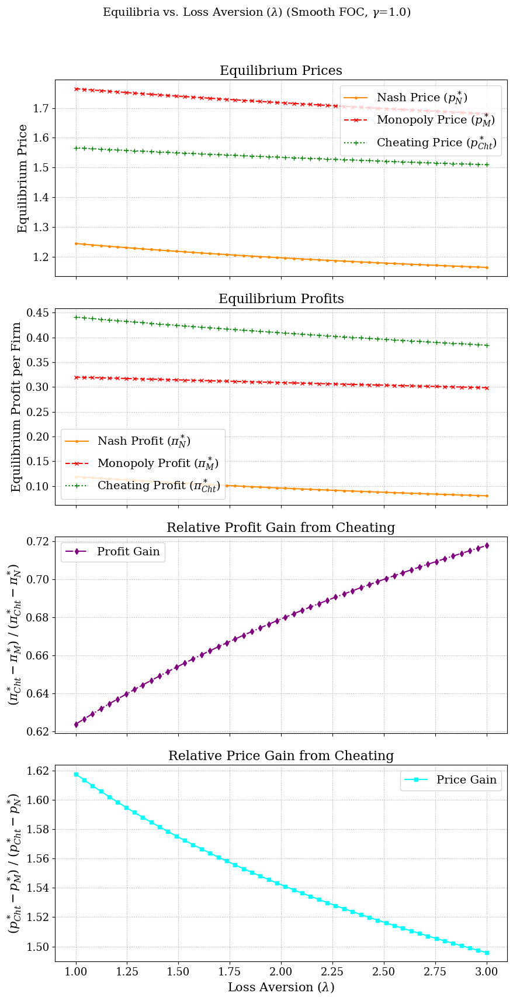

Plot display finished.


In [25]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve
from itertools import product

# --- Model Class Definition with SMOOTH FOCs ---
# (Keep the model class definition exactly as in the previous version)
class model(object):
    """
    Model of algorithms and competition
    (Calculates Nash, Monopoly, and Cheating equilibria using SMOOTH FOCs)
    """

    def __init__(self, **kwargs):
        """Initialize game and compute equilibria"""
        # Default properties
        self.n = kwargs.get('n', 2)
        self.gamma = kwargs.get('gamma', 1)
        self.lossaversion = kwargs.get('lossaversion', 1.0) # This will be varied
        self.c = kwargs.get('c', 1)
        self.a = kwargs.get('a', 2)
        self.a0 = kwargs.get('a0', 0)
        self.mu = kwargs.get('mu', 0.25)
        self.common_reference = kwargs.get('common_reference', True)
        self.demand_type = kwargs.get('demand_type', 'reference')
        self.foc_smoothness = kwargs.get('foc_smoothness', 40) # Steepness factor

        # Ensure demand type is reference if gamma > 0 or lossaversion > 1
        if self.gamma > 0 or self.lossaversion > 1:
             self.demand_type = 'reference'

        valid_demand_types = {'reference', 'noreference','misspecification'}
        if self.demand_type not in valid_demand_types:
            raise ValueError(f"Invalid demand_type: {self.demand_type}. Allowed values: {valid_demand_types}")

        # reference_loss_aversion flag updated based on current lossaversion
        self.reference_loss_aversion = self.lossaversion > 1.0

        # --- Compute Nash, Monopoly, and Cheating equilibria ---
        p0_nash = np.ones(self.n) * self.c * 1.5 # Initial guess Nash
        p0_coop = np.ones(self.n) * self.c * 2.5 # Initial guess Coop

        # Initialize result arrays with NaNs
        self.p_nash = np.full(self.n, np.nan)
        self.NashProfits = np.full(self.n, np.nan)
        self.p_coop = np.full(self.n, np.nan)
        self.CoopProfits = np.full(self.n, np.nan)
        self.p_cheat = np.nan
        self.CheatProfit = np.nan

        # Use try-except for robustness during solving
        try:
            p_nash_sol = fsolve(self.foc, p0_nash, xtol=1.49012e-08)
            p_coop_sol = fsolve(self.foc_monopoly, p0_coop, xtol=1.49012e-08)

            valid_nash = not np.isnan(p_nash_sol).any() and all(p_nash_sol > -1e-6)
            valid_coop = not np.isnan(p_coop_sol).any() and all(p_coop_sol > -1e-6)

            if valid_nash:
                self.p_nash = p_nash_sol
                r_nash = self.reference_price(self.p_nash)
                nash_demand = self.demand(self.p_nash, r=r_nash)
                self.NashProfits = (self.p_nash - self.c) * nash_demand

            if valid_coop:
                self.p_coop = p_coop_sol
                r_coop = self.reference_price(self.p_coop)
                coop_demand = self.demand(self.p_coop, r=r_coop)
                self.CoopProfits = (self.p_coop - self.c) * coop_demand

                if valid_nash: # Need Nash price/profit for cheating/gain calcs
                    p_M = self.p_coop[0]
                    p0_cheat = self.p_nash[0] * 0.95 if self.p_nash[0] > 0 else p_M * 0.9

                    try:
                        p_cheat_sol = fsolve(self.foc_cheat, p0_cheat, args=(p_M,), xtol=1.49012e-08)

                        if isinstance(p_cheat_sol, (np.ndarray, list)) and len(p_cheat_sol) > 0:
                           p_cheat_val = p_cheat_sol[0]
                        else: p_cheat_val = p_cheat_sol

                        if not np.isnan(p_cheat_val) and p_cheat_val > -1e-6:
                            self.p_cheat = p_cheat_val
                            p_vector_cheat = np.full(self.n, p_M); p_vector_cheat[0] = self.p_cheat
                            r_cheat = p_M
                            cheat_demand_vector = self.demand(p_vector_cheat, r=r_cheat)
                            self.CheatProfit = (self.p_cheat - self.c) * cheat_demand_vector[0]
                        # else: print(f"Debug: Invalid/NaN Cheating price la={self.lossaversion}, sol={p_cheat_sol}")
                    except Exception as e_cheat:
                        print(f"Error solving cheating price la={self.lossaversion}: {e_cheat}")
                # else: print(f"Debug: Nash invalid, cannot calculate cheat gain la={self.lossaversion}")
            # else: print(f"Debug: Invalid/NaN Coop price la={self.lossaversion}")

        except Exception as e_fsolve:
            print(f"Error during fsolve for la={self.lossaversion}: {e_fsolve}")


    # --- Demand and Reference Price ---
    def reference_price(self, p):
        if self.common_reference:
            p_array = np.atleast_1d(p); return np.mean(p_array)
        else: return p

    def demand(self, p, r=None):
        p = np.asarray(p)
        if self.demand_type == 'noreference':
            e = np.exp((self.a - p) / self.mu)
            sum_e = np.sum(e) if e.ndim > 0 else e
            d = e / (sum_e + np.exp(self.a0 / self.mu))
        elif self.demand_type in ["reference", "misspecification"]:
            if r is None: r = self.reference_price(p)
            r = np.asarray(r)
            if self.common_reference and r.ndim == 0: r = np.full_like(p, r)
            p_eff = p + self.gamma * (p - r) # Base effect with gamma
            # Apply loss aversion only if relevant and price >= ref
            if self.reference_loss_aversion:
                price_above_r = p >= r
                # Apply EXTRA aversion lambda only where p>=r (lambda-1 because gamma already applied once)
                # Ensure price_above_r broadcast correctly if p is scalar vs vector
                p_eff += (self.lossaversion - 1) * self.gamma * (p - r) * price_above_r
            e = np.exp((self.a - p_eff) / self.mu)
            sum_e = np.sum(e) if e.ndim > 0 else e
            d = e / (sum_e + np.exp(self.a0 / self.mu))
        return d

    # --- SMOOTH FOC Functions ---
    # Note: These now implicitly use self.lossaversion set during init
    def foc(self, p):
        """Compute first order condition using SMOOTH indicators"""
        p = np.asarray(p); r_eq = self.reference_price(p); d = self.demand(p, r=r_eq)
        one_minus_d = (1 - d) if d.ndim == 0 or d.shape[0] == 1 else (1 - d)
        if self.demand_type == 'noreference':
             zero = 1 - (p - self.c) * one_minus_d / self.mu
        elif self.demand_type in ["reference", "misspecification"]:
            p_i = p[0]; r_i = r_eq[0] if isinstance(r_eq, np.ndarray) else r_eq
            if self.reference_loss_aversion:
                price_above_r = 1 / (1 + np.exp(-self.foc_smoothness * (p_i - r_i)))
                price_below_r = 1 / (1 + np.exp(self.foc_smoothness * (p_i - r_i)))
                # Derivative factor includes gamma and lossaversion components
                derivative_factor = (1 + self.gamma * price_below_r + self.lossaversion * self.gamma * price_above_r)
            else: # lossaversion=1 case
                 derivative_factor = (1 + self.gamma)
            zero = 1 - derivative_factor * (p - self.c) * one_minus_d / self.mu
        return np.squeeze(zero)

    def foc_monopoly(self, p):
        """Compute first-order condition for collusion using SMOOTH indicators"""
        p = np.asarray(p); r_eq = self.reference_price(p); d = self.demand(p, r=r_eq)
        p_vec = p.reshape(-1, 1) if p.ndim == 1 else p; d_vec = d.reshape(-1, 1) if d.ndim == 1 else d
        profit_margin = p_vec - self.c; total_contribution = np.sum(profit_margin * d_vec)
        own_contribution = profit_margin * d_vec; one_minus_d = 1.0 - d_vec
        if self.demand_type == 'noreference':
            zero = 1 - (profit_margin * one_minus_d / self.mu) + ((total_contribution - own_contribution) / self.mu)
        elif self.demand_type in ["reference", "misspecification"]:
            p_i = p[0]; r_i = r_eq[0] if isinstance(r_eq, np.ndarray) else r_eq
            if self.reference_loss_aversion:
                price_above_r = 1 / (1 + np.exp(-self.foc_smoothness * (p_i - r_i)))
                price_below_r = 1 / (1 + np.exp(self.foc_smoothness * (p_i - r_i)))
                derivative_factor = (1 + self.gamma * price_below_r + self.lossaversion * self.gamma * price_above_r)
            else: derivative_factor = (1 + self.gamma)
            zero = 1 - derivative_factor * (profit_margin * one_minus_d / self.mu) \
                     + derivative_factor * ((total_contribution - own_contribution) / self.mu)
        return np.squeeze(zero)

    def foc_cheat(self, p_i_cheat, p_M):
        """FOC for one firm cheating using SMOOTH indicators"""
        p_i_cheat_val = p_i_cheat[0] if isinstance(p_i_cheat, (np.ndarray, list)) else p_i_cheat
        p_vector = np.full(self.n, p_M); p_vector[0] = p_i_cheat_val
        r = p_M; d = self.demand(p_vector, r=r); s_i = d[0]; one_minus_s_i = 1.0 - s_i
        if self.demand_type == 'noreference': derivative_factor = 1.0
        elif self.demand_type in ["reference", "misspecification"]:
            # Use smooth indicators comparing cheating price to fixed reference p_M
            if self.reference_loss_aversion: # Check self.lossaversion which was set at init
                 price_above_r = 1 / (1 + np.exp(-self.foc_smoothness * (p_i_cheat_val - r)))
                 price_below_r = 1 / (1 + np.exp(self.foc_smoothness * (p_i_cheat_val - r)))
                 derivative_factor = (1 + self.gamma * price_below_r + self.lossaversion * self.gamma * price_above_r)
            else: derivative_factor = (1 + self.gamma)
        zero = 1 - (p_i_cheat_val - self.c) * derivative_factor * one_minus_s_i / self.mu
        return zero


# --- Calculation Loop ---
# Iterate over loss aversion values
loss_aversion_values = np.linspace(1, 3, 50) # Range 1 to 3

# Result lists (can keep _smooth suffix or remove, indicates method used)
nash_prices_smooth = []
nash_profits_smooth = []
monopoly_prices_smooth = []
monopoly_profits_smooth = []
cheat_prices_smooth = []
cheat_profits_smooth = []
profit_gains_smooth = []
price_gains_smooth = []

# Base model parameters with FIXED gamma
model_params = {
    'n': 2, 'c': 1.0, 'a': 2.0, 'mu': 0.25, 'a0': 0.0,
    'gamma': 1.0, # Fixed gamma
    'foc_smoothness': 40,
    'common_reference': True,
    # 'lossaversion' will be set in the loop
}

print(f"Calculating SMOOTH equilibria for {len(loss_aversion_values)} loss aversion values (gamma fixed at {model_params['gamma']})...")
# Loop over loss aversion
for loss_av in loss_aversion_values:
    current_params = model_params.copy()
    current_params['lossaversion'] = loss_av # Set current loss aversion

    p_N, p_M, p_Cht = np.nan, np.nan, np.nan # Initialize prices
    pi_N, pi_M, pi_Cht = np.nan, np.nan, np.nan # Initialize profits
    try:
        # Instantiate model with current loss aversion
        m = model(**current_params)

        # Extract results
        p_N = m.p_nash[0] if not np.isnan(m.p_nash).any() else np.nan
        nash_prices_smooth.append(p_N)
        pi_N = m.NashProfits[0] if not np.isnan(m.NashProfits).any() else np.nan
        nash_profits_smooth.append(pi_N)

        p_M = m.p_coop[0] if not np.isnan(m.p_coop).any() else np.nan
        monopoly_prices_smooth.append(p_M)
        pi_M = m.CoopProfits[0] if not np.isnan(m.CoopProfits).any() else np.nan
        monopoly_profits_smooth.append(pi_M)

        p_Cht = m.p_cheat # Already scalar
        cheat_prices_smooth.append(p_Cht)
        pi_Cht = m.CheatProfit
        cheat_profits_smooth.append(pi_Cht)

        # Calculate Profit Gain
        profit_gain = np.nan
        if not np.isnan(pi_Cht) and not np.isnan(pi_M) and not np.isnan(pi_N):
            denominator = pi_Cht - pi_N
            if abs(denominator) > 1e-9:
                 numerator = pi_M - pi_N
                 if numerator >= -1e-9: profit_gain = numerator / denominator
        profit_gains_smooth.append(profit_gain)

        # Calculate Price Gain
        price_gain = np.nan
        if not np.isnan(p_Cht) and not np.isnan(p_M) and not np.isnan(p_N):
             denominator = p_Cht - p_N
             if abs(denominator) > 1e-9:
                  numerator = p_M - p_N
                  price_gain = numerator / denominator
        price_gains_smooth.append(price_gain)

    except Exception as e:
         # Use loss_av in error message
         print(f"Error processing smooth loss aversion = {loss_av}: {e}")
         nash_prices_smooth.append(np.nan); nash_profits_smooth.append(np.nan)
         monopoly_prices_smooth.append(np.nan); monopoly_profits_smooth.append(np.nan)
         cheat_prices_smooth.append(np.nan); cheat_profits_smooth.append(np.nan)
         profit_gains_smooth.append(np.nan)
         price_gains_smooth.append(np.nan)

print("Calculation complete.")
print(nash_prices_smooth,monopoly_prices_smooth)

# Convert lists to numpy arrays
nash_prices_smooth = np.array(nash_prices_smooth); nash_profits_smooth = np.array(nash_profits_smooth)
monopoly_prices_smooth = np.array(monopoly_prices_smooth); monopoly_profits_smooth = np.array(monopoly_profits_smooth)
cheat_prices_smooth = np.array(cheat_prices_smooth); cheat_profits_smooth = np.array(cheat_profits_smooth)
profit_gains_smooth = np.array(profit_gains_smooth)
price_gains_smooth = np.array(price_gains_smooth)

# --- Plotting ---
print("Generating plots...")
fig, ax = plt.subplots(4, 1, figsize=(9, 18), sharex=True)
# Update Figure Title
fig.suptitle(f'Equilibria vs. Loss Aversion ($\lambda$) (Smooth FOC, $\gamma$={model_params["gamma"]})', fontsize=14)

# Plot 1: Prices vs Loss Aversion
# Use loss_aversion_values as x-axis
ax[0].plot(loss_aversion_values, nash_prices_smooth, marker='.', linestyle='-', markersize=5, color='darkorange', label='Nash Price ($p_N^*$)')
ax[0].plot(loss_aversion_values, monopoly_prices_smooth, marker='x', linestyle='--', markersize=5, color='red', label='Monopoly Price ($p_M^*$)')
ax[0].plot(loss_aversion_values, cheat_prices_smooth, marker='+', linestyle=':', markersize=6, color='green', label='Cheating Price ($p_{Cht}^*$)')
ax[0].set_ylabel('Equilibrium Price')
ax[0].set_title('Equilibrium Prices') # Removed (Smooth FOC) for brevity
ax[0].legend()
ax[0].grid(True, linestyle=':')
if np.isnan(nash_prices_smooth).any() or np.isnan(monopoly_prices_smooth).any() or np.isnan(cheat_prices_smooth).any():
    ax[0].text(0.95, 0.05, 'NaNs present', transform=ax[0].transAxes, ha='right', va='bottom', color='red', style='italic')

# Plot 2: Profits vs Loss Aversion
ax[1].plot(loss_aversion_values, nash_profits_smooth, marker='.', linestyle='-', color='darkorange', markersize=5, label='Nash Profit ($\pi_N^*$)')
ax[1].plot(loss_aversion_values, monopoly_profits_smooth, marker='x', linestyle='--', color='red', markersize=5, label='Monopoly Profit ($\pi_M^*$)')
ax[1].plot(loss_aversion_values, cheat_profits_smooth, marker='+', linestyle=':', color='green', markersize=6, label='Cheating Profit ($\pi_{Cht}^*$)')
ax[1].set_ylabel('Equilibrium Profit per Firm')
ax[1].set_title('Equilibrium Profits')
ax[1].legend()
ax[1].grid(True, linestyle=':')
if np.isnan(nash_profits_smooth).any() or np.isnan(monopoly_profits_smooth).any() or np.isnan(cheat_profits_smooth).any():
    ax[1].text(0.95, 0.05, 'NaNs present', transform=ax[1].transAxes, ha='right', va='bottom', color='red', style='italic')

# Plot 3: Profit Gain vs Loss Aversion
ax[2].plot(loss_aversion_values, profit_gains_smooth, marker='d', linestyle='-.', color='purple', markersize=5, label='Profit Gain')
# ax[2].axhline(1, color='grey', linestyle='--', linewidth=0.8) # Label only once if needed
# ax[2].axhline(0, color='grey', linestyle=':', linewidth=0.8)
ax[2].set_ylabel('($\pi_{Cht}^* - \pi_M^*$) / ($\pi_{Cht}^* - \pi_N^*$)')
ax[2].set_title('Relative Profit Gain from Cheating')
ax[2].legend()
ax[2].grid(True, linestyle=':')
if np.isnan(profit_gains_smooth).any():
    ax[2].text(0.95, 0.05, 'NaNs present', transform=ax[2].transAxes, ha='right', va='bottom', color='red', style='italic')

# Plot 4: Price Gain vs Loss Aversion
ax[3].plot(loss_aversion_values, price_gains_smooth, marker='s', linestyle='-', color='cyan', markersize=4, label='Price Gain')
# ax[3].axhline(1, color='grey', linestyle='--', linewidth=0.8)
# ax[3].axhline(0, color='grey', linestyle=':', linewidth=0.8)
# Update X-axis label
ax[3].set_xlabel('Loss Aversion ($\lambda$)')
ax[3].set_ylabel('($p_{Cht}^* - p_M^*$) / ($p_{Cht}^* - p_N^*$)')
ax[3].set_title('Relative Price Gain from Cheating')
ax[3].legend()
ax[3].grid(True, linestyle=':')
if np.isnan(price_gains_smooth).any():
    ax[3].text(0.95, 0.05, 'NaNs present', transform=ax[3].transAxes, ha='right', va='bottom', color='red', style='italic')


plt.tight_layout(rect=[0, 0.03, 1, 0.96]) # Adjust layout
plt.show()
print("Plot display finished.")

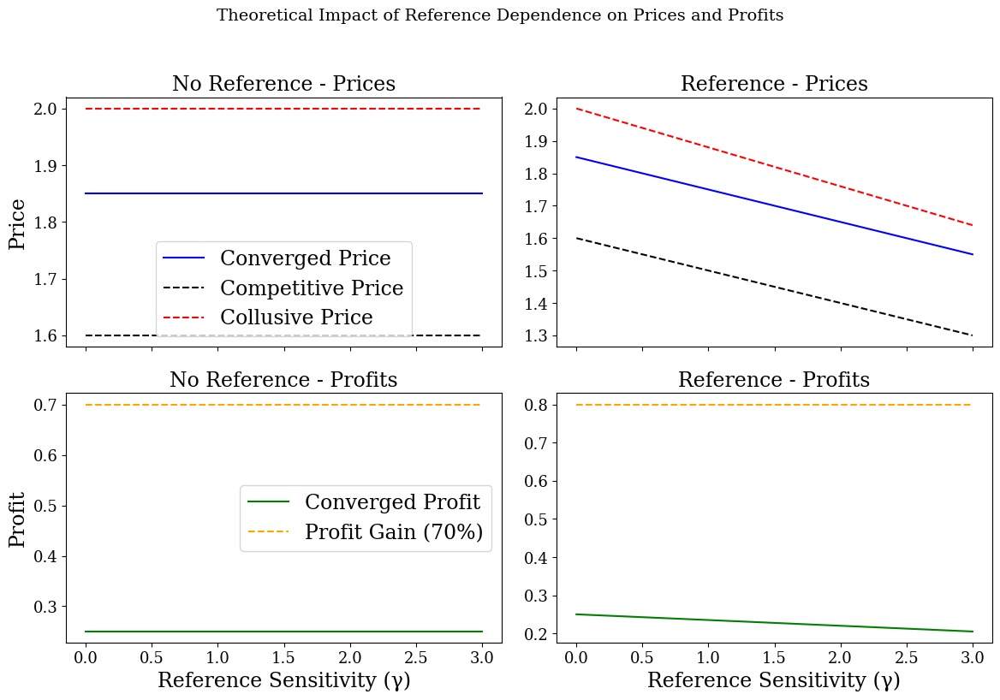

In [20]:
import matplotlib.pyplot as plt
import numpy as np

# Simulate data
gamma_values = np.linspace(0, 3, 30)

# No Reference: static lines
competitive_price_no_ref = np.full_like(gamma_values, 1.6)
collusive_price_no_ref = np.full_like(gamma_values, 2.0)
converged_price_no_ref = np.full_like(gamma_values, 1.85)
profit_no_ref = np.full_like(gamma_values, 0.25)

# Reference: lines decrease with gamma
competitive_price_ref = 1.6 - 0.1 * gamma_values
collusive_price_ref = 2.0 - 0.12 * gamma_values
converged_price_ref = 1.85 - 0.1 * gamma_values
profit_ref = 0.25 - 0.015 * gamma_values

# Collusion Gain (as % of distance between competitive and collusive)
price_gain_no_ref = (converged_price_no_ref - competitive_price_no_ref) / (collusive_price_no_ref - competitive_price_no_ref)
price_gain_ref = (converged_price_ref - competitive_price_ref) / (collusive_price_ref - competitive_price_ref)

profit_gain_no_ref = np.full_like(gamma_values, 0.70)  # 70%
profit_gain_ref = np.full_like(gamma_values, 0.80)  # 80%

# Create figure
fig, axs = plt.subplots(2, 2, figsize=(12, 8), sharex=True)

# --- Prices ---
axs[0, 0].plot(gamma_values, converged_price_no_ref, label='Converged Price', color='blue')
axs[0, 0].plot(gamma_values, competitive_price_no_ref, '--', label='Competitive Price', color='black')
axs[0, 0].plot(gamma_values, collusive_price_no_ref, '--', label='Collusive Price', color='red')
axs[0, 0].set_title('No Reference - Prices')
axs[0, 0].set_ylabel('Price')
axs[0, 0].legend()

axs[0, 1].plot(gamma_values, converged_price_ref, label='Converged Price', color='blue')
axs[0, 1].plot(gamma_values, competitive_price_ref, '--', label='Competitive Price', color='black')
axs[0, 1].plot(gamma_values, collusive_price_ref, '--', label='Collusive Price', color='red')
axs[0, 1].set_title('Reference - Prices')

# --- Profits ---
axs[1, 0].plot(gamma_values, profit_no_ref, label='Converged Profit', color='green')
axs[1, 0].plot(gamma_values, profit_gain_no_ref, '--', label='Profit Gain (70%)', color='orange')
axs[1, 0].set_title('No Reference - Profits')
axs[1, 0].set_xlabel('Reference Sensitivity (γ)')
axs[1, 0].set_ylabel('Profit')
axs[1, 0].legend()

axs[1, 1].plot(gamma_values, profit_ref, label='Converged Profit', color='green')
axs[1, 1].plot(gamma_values, profit_gain_ref, '--', label='Profit Gain (80%)', color='orange')
axs[1, 1].set_title('Reference - Profits')
axs[1, 1].set_xlabel('Reference Sensitivity (γ)')

plt.tight_layout()
plt.suptitle("Theoretical Impact of Reference Dependence on Prices and Profits", fontsize=14, y=1.03)
plt.subplots_adjust(top=0.9)

plt.show()


***
Gamma lambda figures for paper

Looking for data in: /Users/neda/Desktop/UBC/PHD/research_term_4/Results_sockeye/experiments


FileNotFoundError: [Errno 2] No such file or directory: '/Users/neda/Desktop/UBC/PHD/research_term_4/Figures_Heatmaps/quad_heatmap_gamma_lambda_final_results/gamma_lambda_reference_True.png'

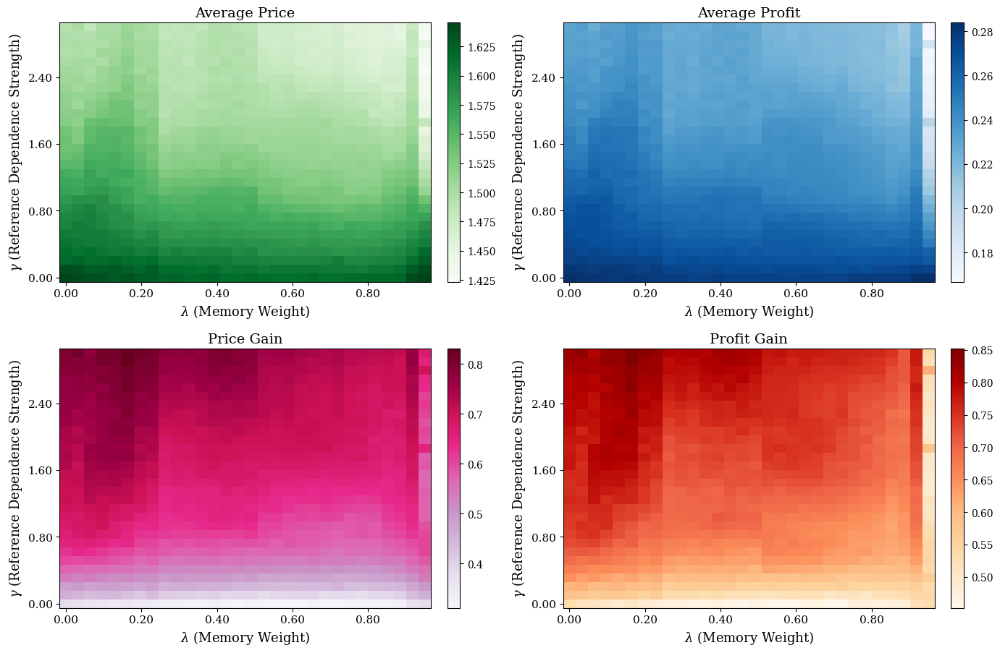

In [32]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from glob import glob # For finding directories

# --- Placeholder/Assumed Helper Functions ---
def extract_min_max_price_metric(run_dir):
    """
    Placeholder: Assumes this function exists and extracts avg min/max prices
    from the run_dir, perhaps from a specific file or calculation.
    Returns: (avg_min_price, avg_max_price)
    """
    # Example: Read from a hypothetical file or return dummy data
    # For now, returning NaNs so it doesn't interfere if not fully implemented
    # but allows the main logic to proceed.
    # In a real scenario, this would parse actual data.
    # try:
    #     # df_prices = pd.read_csv(os.path.join(run_dir, "price_summary.csv"))
    #     # return df_prices['avg_min_price'].iloc[0], df_prices['avg_max_price'].iloc[0]
    #     pass
    # except FileNotFoundError:
    #     print(f"Warning: Price summary file not found in {run_dir}")
    return np.nan, np.nan

def replace_nans_and_zeros(data_grid, original_data_values=None, replacement_method='nan'):
    """
    Placeholder: Replaces NaNs and/or zeros in the data_grid.
    'nan' method replaces zeros with NaN.
    'interpolate' could be an option for NaNs (more complex).
    """
    grid_copy = np.copy(data_grid)
    if replacement_method == 'nan':
        # If you want to treat actual zeros from data as missing for visualization
        # This is often not desired unless zeros truly mean "no data"
        # grid_copy[grid_copy == 0] = np.nan # Be careful with this
        pass # Usually, np.nan is already handled by imshow
    # If original_data_values is provided and you want to fill based on its distribution,
    # that's more advanced. For now, we'll assume NaNs are handled by imshow.
    return grid_copy

# --- Enhanced Plotting Parameters (similar to your quad figure) ---
plt.rcParams.update({
    'font.size': 12, # Adjusted for potentially smaller subplots
    'axes.titlesize': 14,
    'axes.labelsize': 13,
    'xtick.labelsize': 11,
    'ytick.labelsize': 11,
    'legend.fontsize': 11, # Not directly used for heatmaps but good to have
    'figure.titlesize': 16,
    'font.family': 'serif',
    'mathtext.fontset': 'dejavuserif',
})

# --- 1. Refactored Data Loading Function ---
def load_gamma_lambda_heatmap_data(results_dir, experiment_name_pattern="*", target_metrics=None):
    """
    Loads and processes data for specified metrics across gamma and lambda experiments.

    Parameters:
    -----------
    results_dir : str
        Directory containing experiment results.
    experiment_name_pattern : str
        Pattern to match specific top-level experiment directories (e.g., "experiment_set_A*").
    target_metrics : list of str
        List of metric names to extract (e.g., ["Price", "Profit", "Profit Gain"]).
        If None, attempts to extract "Price", "Profit", "Price Gain", "Profit Gain", "mean_cycle_length".

    Returns:
    --------
    pd.DataFrame
        A DataFrame with columns: 'gamma', 'lambda', 'metric_name', 'value', 
                                  'avg_min_price' (optional), 'avg_max_price' (optional).
        Returns an empty DataFrame if no data is found.
    """
    if target_metrics is None:
        target_metrics = ["Price", "Profit", "Price Gain", "Profit Gain", "mean_cycle_length"]

    results_dir = os.path.abspath(results_dir)
    base_exp_dirs = glob(os.path.join(results_dir, experiment_name_pattern))

    if not base_exp_dirs:
        print(f"Warning: No experiment directories found matching pattern '{experiment_name_pattern}' in {results_dir}")
        return pd.DataFrame()

    all_data = []
    
    for base_exp_dir in base_exp_dirs: # Loop through matched top-level experiment dirs
        if not os.path.isdir(base_exp_dir):
            continue

        run_dir_pattern = os.path.join(base_exp_dir, "gamma_*_lambda_*")
        run_dirs = glob(run_dir_pattern)

        if not run_dirs:
            print(f"No run directories found matching pattern '{run_dir_pattern}' in {base_exp_dir}")
            continue

        for run_dir in run_dirs:
            dir_name = os.path.basename(run_dir)
            try:
                gamma_str = dir_name.split('gamma_')[1].split('_lambda_')[0]
                lambda_str = dir_name.split('lambda_')[1].split('_')[0] # Assuming format "lambda_X" or "lambda_X_timestamp"
                
                gamma = float(gamma_str)
                lambda_val = float(lambda_str)

                stats_file = os.path.join(run_dir, "cycle_statistics.csv")
                avg_min_price, avg_max_price = extract_min_max_price_metric(run_dir) # Get min/max prices

                if os.path.exists(stats_file):
                    df_stats = pd.read_csv(stats_file)
                    for metric_name in target_metrics:
                        metric_value = np.nan
                        if metric_name == 'mean_cycle_length':
                            metric_columns = [col for col in df_stats.columns if col.startswith('mean_cycle_length')]
                        elif metric_name == "Price (Min)": # Special handling for min/max price if needed
                            metric_value = avg_min_price
                        elif metric_name == "Price (Max)":
                            metric_value = avg_max_price
                        else:
                            # Standard metric name conversion
                            col_prefix = f'mean_{metric_name.lower().replace(" ", "_")}_p'
                            metric_columns = [col for col in df_stats.columns if col.startswith(col_prefix)]
                        
                        if metric_name not in ["Price (Min)", "Price (Max)"] and metric_columns: # Process standard metrics
                            # Compute the average across all player columns for the first row (assuming one summary row)
                            if not df_stats.empty:
                                metric_value = df_stats[metric_columns].mean(axis=1).iloc[0]
                        
                        if not np.isnan(metric_value): # Only append if a value was found/calculated
                             all_data.append({
                                'gamma': gamma,
                                'lambda': lambda_val,
                                'metric_name': metric_name,
                                'value': metric_value,
                                'avg_min_price': avg_min_price, # Store for potential use
                                'avg_max_price': avg_max_price  # Store for potential use
                            })
                else:
                    print(f"Warning: cycle_statistics.csv not found in {run_dir}")

            except (IndexError, ValueError) as e:
                print(f"Skipping directory {dir_name} in {base_exp_dir} due to parsing error: {e}")
                continue
    
    if not all_data:
        print("No valid data collected.")
        return pd.DataFrame()
        
    return pd.DataFrame(all_data)


# --- 2. Refactored Single Heatmap Plotting Function ---
def plot_single_heatmap_on_ax(ax, gamma_values, lambda_values, data_values, metric_name_display, cmap='viridis', fig_for_cbar=None):
    """
    Plots a single heatmap on a given matplotlib Axes object.

    Parameters:
    -----------
    ax : matplotlib.axes.Axes
        The Axes object to plot on.
    gamma_values : np.ndarray
        Sorted unique gamma values (for y-axis).
    lambda_values : np.ndarray
        Sorted unique lambda values (for x-axis).
    data_values : np.ndarray
        2D grid of metric values (rows=gamma, cols=lambda).
    metric_name_display : str
        Title for the heatmap and colorbar label.
    cmap : str
        Colormap name.
    fig_for_cbar : matplotlib.figure.Figure, optional
        The figure to attach the colorbar to. If None, uses ax.figure.
    """
    if data_values.size == 0:
        ax.text(0.5, 0.5, "No data", ha='center', va='center', transform=ax.transAxes)
        ax.set_title(metric_name_display)
        ax.set_xlabel(r'$\lambda$ (Memory Weight)')
        ax.set_ylabel(r'$\gamma$ (Reference Dependence)')
        return

    data_grid_processed = replace_nans_and_zeros(data_values) # Use your processing function

    im = ax.imshow(
        data_grid_processed,
        aspect='auto',
        origin='lower',
        extent=[min(lambda_values) - (lambda_values[1]-lambda_values[0])/2 if len(lambda_values)>1 else min(lambda_values)-0.5, # Adjust extent for centering
                max(lambda_values) + (lambda_values[1]-lambda_values[0])/2 if len(lambda_values)>1 else max(lambda_values)+0.5,
                min(gamma_values) - (gamma_values[1]-gamma_values[0])/2 if len(gamma_values)>1 else min(gamma_values)-0.5,
                max(gamma_values) + (gamma_values[1]-gamma_values[0])/2 if len(gamma_values)>1 else max(gamma_values)+0.5],
        cmap=cmap,
    )
    
    # Add color bar
    if fig_for_cbar is None:
        fig_for_cbar = ax.figure
    cbar = fig_for_cbar.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=10)


    ax.set_xlabel(r'$\lambda$ (Memory Weight)')
    ax.set_ylabel(r'$\gamma$ (Reference Dependence Strength)')
    ax.set_title(metric_name_display)

    # Set ticks to be the actual unique gamma and lambda values
    if len(lambda_values) > 1 and len(lambda_values) <=15: # Avoid overcrowding
        ax.set_xticks(lambda_values)
        ax.set_xticklabels([f"{val:.2f}" for val in lambda_values], rotation=45, ha="right")
    else:
        ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=5, prune='both')) # Auto ticks if too many
        ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))


    if len(gamma_values) > 1 and len(gamma_values) <=15:
        ax.set_yticks(gamma_values)
        ax.set_yticklabels([f"{val:.2f}" for val in gamma_values])
    else:
        ax.yaxis.set_major_locator(mticker.MaxNLocator(nbins=5, prune='both'))
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))


# --- 3. Function to Create the 2x2 Quad Heatmap Figure ---
def create_gamma_lambda_quad_heatmap(results_dir, experiment_name_pattern="*", figsize=(14, 10)):
    """
    Creates a 2x2 figure with heatmaps for Price, Profit, Price Gain, and Profit Gain.

    Parameters:
    -----------
    results_dir : str
        Directory containing experiment results.
    experiment_name_pattern : str
        Pattern to match specific experiment directories.
    figsize : tuple
        Size of the overall figure.
    """
    target_metrics_for_quad = ["Price", "Profit", "Price Gain", "Profit Gain"]
    
    # Define human-readable titles and colormaps for the quad
    metric_display_config = {
        "Price": {"title": "Average Price", "cmap": 'Greens'},
        "Profit": {"title": "Average Profit", "cmap": 'Blues'},
        "Price Gain": {"title": "Price Gain", "cmap": 'PuRd'}, # OrRd is good for gains
        "Profit Gain": {"title": "Profit Gain", "cmap": 'OrRd'} # PuRd also good
    }

    # Load data for all target metrics
    df_all_metrics = load_gamma_lambda_heatmap_data(results_dir, experiment_name_pattern, target_metrics_for_quad)

    if df_all_metrics.empty:
        print("No data loaded for quad heatmap. Cannot create figure.")
        # Create a blank figure with a message
        fig, ax = plt.subplots(figsize=figsize)
        ax.text(0.5, 0.5, "No data found for heatmap generation.", 
                horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
        ax.set_axis_off()
        return fig

    fig, axes = plt.subplots(2, 2, figsize=figsize, sharex=False, sharey=False) # No sharing axes for heatmaps
    axes_flat = axes.flatten()

    unique_gammas_all = np.sort(df_all_metrics['gamma'].unique())
    unique_lambdas_all = np.sort(df_all_metrics['lambda'].unique())

    if len(unique_gammas_all) == 0 or len(unique_lambdas_all) == 0:
        print("Not enough unique gamma or lambda values to create heatmaps.")
        for ax in axes_flat:
            ax.text(0.5, 0.5, "Insufficient Data Dimensions", ha='center', va='center', transform=ax.transAxes)
            ax.set_axis_off()
        return fig


    for i, metric_key in enumerate(target_metrics_for_quad):
        ax = axes_flat[i]
        display_info = metric_display_config[metric_key]
        
        df_metric = df_all_metrics[df_all_metrics['metric_name'] == metric_key]

        if df_metric.empty:
            print(f"No data found for metric: {metric_key}")
            ax.text(0.5, 0.5, f"No data for\n{display_info['title']}", ha='center', va='center', transform=ax.transAxes, fontsize=10)
            ax.set_title(display_info['title'])
            ax.set_xlabel(r'$\lambda$')
            ax.set_ylabel(r'$\gamma$')
            continue

        # Pivot the data for the current metric
        try:
            # Using pivot_table to handle potential duplicate (gamma, lambda) pairs by averaging
            pivot_df = df_metric.pivot_table(index='gamma', columns='lambda', values='value', aggfunc='mean')
            # Ensure the pivot table has all unique gammas and lambdas, fill missing with NaN
            pivot_df = pivot_df.reindex(index=unique_gammas_all, columns=unique_lambdas_all)
            data_grid = pivot_df.values
        except Exception as e:
            print(f"Error pivoting data for {metric_key}: {e}")
            ax.text(0.5, 0.5, f"Error processing\n{display_info['title']}", ha='center', va='center', transform=ax.transAxes, fontsize=10)
            continue
            
        plot_single_heatmap_on_ax(ax, unique_gammas_all, unique_lambdas_all, data_grid, 
                                  display_info['title'], cmap=display_info['cmap'], fig_for_cbar=fig)

    #fig.suptitle(f'Heatmaps for {experiment_name_pattern.replace("*","All Experiments") if experiment_name_pattern=="*" else experiment_name_pattern } \n(γ vs. λ)', fontsize=plt.rcParams['figure.titlesize'])
    fig.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust rect for suptitle

    return fig

# --- Example Usage (similar to your original calls) ---
if __name__ == "__main__":
    # Create the output directory if it doesn't exist
    output_figure_dir = "../Figures_Heatmaps" # Example output directory
    os.makedirs(output_figure_dir, exist_ok=True)

    # experiment_base_pattern = "recreating_results/gamma_lambda_high" 

    # Assuming your results are in "../Results_sockeye/experiments"
    # And inside that, you have experiment set directories like "final_results_gamma_lambda_reference_True"
    # The `experiment_name_pattern` should match these *set* directories.
    # For example, if your structure is:
    # ../Results_sockeye/experiments/MyExperimentSet1/gamma_0.1_lambda_0.2/...
    # ../Results_sockeye/experiments/MyExperimentSet2/gamma_0.1_lambda_0.2/...
    # Then experiment_name_pattern could be "MyExperimentSet1" or "MyExperimentSet*"
    
    # If your `experiment_name` in the original call was referring to a specific sub-folder
    # like "final_results_gamma_lambda_reference_True", then that's what you pass here.
    # Let's assume it's a specific set for this example:
    experiment_set_name = "final_results/gamma_lambda_reference_True" # ADJUST THIS
    
    print(f"Looking for data in: {os.path.abspath('../Results/experiments')}")
    
    quad_fig = create_gamma_lambda_quad_heatmap(
        "../Results/experiments", # Base directory containing experiment sets
        experiment_name_pattern="noloss/gamma_lambda_high_reference_True" # Pattern for the specific set of experiments
    )
    
    if quad_fig:
        quad_fig.savefig(os.path.join(output_figure_dir, f"quad_heatmap_gamma_lambda_{experiment_set_name}.png"), dpi=300)
        print(f"Quad heatmap saved to {os.path.join(output_figure_dir, f'quad_heatmap_gamma_lambda_{experiment_set_name}.png')}")
        plt.show()

    # You can still create single heatmaps if needed:
    # df_single = load_gamma_lambda_heatmap_data("../Results_sockeye/experiments", experiment_set_name, ["Profit Gain"])
    # if not df_single.empty:
    #     fig_single, ax_single = plt.subplots(figsize=(8,6))
    #     pivot_single = df_single.pivot_table(index='gamma', columns='lambda', values='value', aggfunc='mean')
    #     pivot_single = pivot_single.reindex(index=np.sort(df_single['gamma'].unique()), columns=np.sort(df_single['lambda'].unique()))
    #     plot_single_heatmap_on_ax(ax_single, 
    #                               np.sort(df_single['gamma'].unique()), 
    #                               np.sort(df_single['lambda'].unique()), 
    #                               pivot_single.values, 
    #                               "Profit Gain", cmap='OrRd', fig_for_cbar=fig_single)
    #     fig_single.suptitle(f"Single Heatmap for Profit Gain ({experiment_set_name})")
    #     fig_single.tight_layout(rect=[0,0.03,1,0.93])
    #     fig_single.savefig(os.path.join(output_figure_dir, f"single_heatmap_profit_gain_{experiment_set_name}.png"), dpi=300)
    #     plt.show()

Generating 4x3 comparative heatmap for final_results/gamma_lambda (CR=True)...
Loading data for all metrics and scenarios...
Data loading complete.
Figure saved to ../Results_sockeye/experiments/final_results/gamma_lambda/Comparative_Figures_4x3_v2/gamma_lambda_4x3_ref_vs_miss_cr_true_comparison.png


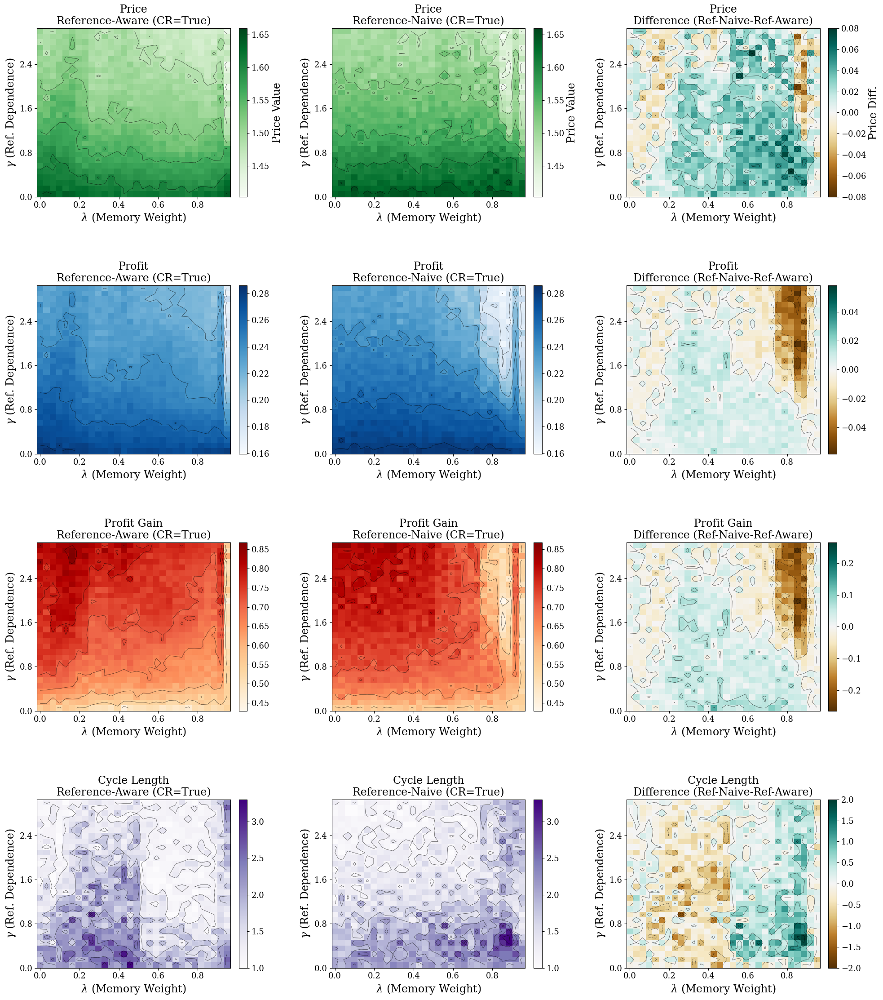

In [9]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as mticker
import numpy as np
import pandas as pd
import os
from glob import glob

# --- Placeholder/Assumed Helper Functions (If used by your actual data extraction) ---
def extract_min_max_price_metric(run_dir):
    # This is a placeholder. If your 'extract_metric_data_gl' or plotting relies on it,
    # you need your actual implementation.
    # print(f"Placeholder: extract_min_max_price_metric called for {run_dir}")
    return np.nan, np.nan

def replace_nans_and_zeros(data_grid, original_data_values=None, replacement_method='nan'):
    # This is a placeholder. The plot_heatmap_on_ax currently handles NaNs for imshow.
    # If you need specific zero replacement, implement it here.
    # print(f"Placeholder: replace_nans_and_zeros called.")
    return np.copy(data_grid)

# --- Enhanced Plotting Parameters ---
plt.rcParams.update({
    'font.size': 17,
    'axes.titlesize': 17,
    'axes.labelsize': 17,
    'xtick.labelsize': 13,
    'ytick.labelsize': 13,
    'figure.titlesize': 16,
    'font.family': 'serif',
    'mathtext.fontset': 'dejavuserif',
})

# --- Robust Data Extraction Function ---
def extract_metric_data_gl(experiment_dir_path, metric_name_display):
    gammas_list, lambdas_list, metrics_list = [], [], []
    
    if not os.path.isdir(experiment_dir_path):
        print(f"Warning: Experiment directory not found or not a directory: {experiment_dir_path}")
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)

    run_dirs = glob(os.path.join(experiment_dir_path, "gamma_*_lambda_*"))
    if not run_dirs:
        # print(f"Info: No run directories (gamma_*_lambda_*) found in {experiment_dir_path} for metric {metric_name_display}")
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)

    for run_dir in run_dirs:
        try:
            dir_name = os.path.basename(run_dir)
            parts_gamma = dir_name.split('gamma_')
            if len(parts_gamma) < 2: continue
            parts_lambda = parts_gamma[1].split('_lambda_')
            if len(parts_lambda) < 2: continue
            
            gamma_str = parts_lambda[0]
            lambda_str_full = parts_lambda[1]
            lambda_str = lambda_str_full.split('_')[0] 
            
            g_val = float(gamma_str)
            l_val = float(lambda_str)

            stats_file = os.path.join(run_dir, "cycle_statistics.csv")
            if os.path.exists(stats_file):
                df_stats = pd.read_csv(stats_file, on_bad_lines='skip') # Skip bad lines if any
                if not df_stats.empty:
                    metric_val_found = np.nan
                    
                    internal_metric_name = metric_name_display.lower().replace(" ", "_")
                    if metric_name_display == 'Cycle Length': # Specific handling for Cycle Length
                        col_prefix = 'mean_cycle_length' 
                    else: # General case for metrics like Price, Profit, Price Gain, Profit Gain
                        col_prefix = f'mean_{internal_metric_name}_p' # Assumes player suffix _pX

                    metric_columns = [col for col in df_stats.columns if col.startswith(col_prefix)]
                    
                    if metric_columns:
                        try:
                            # Ensure data is numeric before mean, convert errors to NaN
                            numeric_data = df_stats[metric_columns].apply(pd.to_numeric, errors='coerce')
                            if not numeric_data.empty and not numeric_data.isnull().all().all():
                                metric_val_found = numeric_data.mean(axis=1).iloc[0]
                        except (IndexError, TypeError, AttributeError) as e_inner:
                            # print(f"Inner error processing columns {metric_columns} in {stats_file}: {e_inner}")
                            metric_val_found = np.nan 
                    
                    if pd.notna(metric_val_found) and isinstance(metric_val_found, (int, float, np.number)):
                        gammas_list.append(g_val)
                        lambdas_list.append(l_val)
                        metrics_list.append(float(metric_val_found)) # Ensure float
            # else:
            #     print(f"Info: Stats file not found: {stats_file} (metric: {metric_name_display})")
        except Exception as e:
            # print(f"Warning: Skipping {run_dir} for metric {metric_name_display} due to error: {e}")
            continue
            
    if not metrics_list:
        # print(f"Info: No valid data points extracted for {metric_name_display} from {experiment_dir_path}")
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)
        
    return np.array(gammas_list, dtype=float), np.array(lambdas_list, dtype=float), np.array(metrics_list, dtype=float)


# --- Helper to Plot Single Heatmap on an Axes ---
def plot_heatmap_on_ax(ax, gamma_coords, lambda_coords, data_grid, title, cmap, norm, 
                       show_contours=True, fig_for_cbar=None, cbar_label=""):
    if data_grid is None or data_grid.size == 0 or gamma_coords.size == 0 or lambda_coords.size == 0:
        ax.text(0.5, 0.5, "No Data", ha='center', va='center', transform=ax.transAxes, fontsize=10)
        ax.set_title(title, fontsize=plt.rcParams['axes.titlesize'])
        ax.set_xlabel(r"$\lambda$ (Memory Weight)", fontsize=plt.rcParams['axes.labelsize'])
        ax.set_ylabel(r"$\gamma$ (Ref. Dependence)", fontsize=plt.rcParams['axes.labelsize'])
        return None

    # Calculate extent for imshow to center pixels on ticks
    lambda_step = (lambda_coords[1] - lambda_coords[0]) / 2.0 if len(lambda_coords) > 1 else 0.5
    gamma_step = (gamma_coords[1] - gamma_coords[0]) / 2.0 if len(gamma_coords) > 1 else 0.5
    extent = [lambda_coords.min() - lambda_step, lambda_coords.max() + lambda_step,
              gamma_coords.min() - gamma_step, gamma_coords.max() + gamma_step]

    im = ax.imshow(data_grid, aspect='auto', origin='lower', extent=extent, cmap=cmap, norm=norm)
    
    ax.set_title(title, fontsize=plt.rcParams['axes.titlesize'])
    ax.set_xlabel(r"$\lambda$ (Memory Weight)", fontsize=plt.rcParams['axes.labelsize'])
    ax.set_ylabel(r"$\gamma$ (Ref. Dependence)", fontsize=plt.rcParams['axes.labelsize'])

    if len(lambda_coords) > 1 and len(lambda_coords) <=10 :
        ax.set_xticks(lambda_coords)
        ax.set_xticklabels([f"{val:.1f}" for val in lambda_coords], rotation=45, ha="right")
    else:
        ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=5, integer=False, prune='both'))
        ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))

    if len(gamma_coords) > 1 and len(gamma_coords) <=10:
        ax.set_yticks(gamma_coords)
        ax.set_yticklabels([f"{val:.1f}" for val in gamma_coords])
    else:
        ax.yaxis.set_major_locator(mticker.MaxNLocator(nbins=5, integer=False, prune='both'))
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))

    if show_contours and np.any(np.isfinite(data_grid)):
        grid_for_contour = np.nan_to_num(data_grid, nan=np.nanmedian(data_grid[np.isfinite(data_grid)])) if np.any(np.isfinite(data_grid)) else data_grid
        if np.any(np.isfinite(grid_for_contour)) and grid_for_contour.shape[0] > 1 and grid_for_contour.shape[1] > 1: # Contour needs >1 data point in each dim
             X, Y = np.meshgrid(lambda_coords, gamma_coords) # Meshgrid for contour
             ax.contour(X, Y, grid_for_contour, levels=6, colors="black", linewidths=0.5, alpha=0.7)

    if fig_for_cbar and cbar_label:
        # Position colorbar to the right of the current axes
        # This creates a new axes for the colorbar.
        # Adjust fraction and pad for size and spacing.
        # For a multi-plot figure, it's often better to manage colorbars globally
        # or per row/column using GridSpec or fig.add_axes.
        # This will add a colorbar to EACH plot that calls it with fig_for_cbar and cbar_label.
        cbar = fig_for_cbar.colorbar(im, ax=ax, label=cbar_label, fraction=0.046, pad=0.04) # pad=0.04 default
        cbar.ax.tick_params(labelsize=10)
    return im

# --- Main Function for 4x3 Comparative Heatmaps ---
def create_metric_comparison_heatmaps(experiment_dirs_map, metrics_to_plot_list, figsize=(18, 20)):
    n_rows = len(metrics_to_plot_list)
    n_cols = 3
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, squeeze=False) # squeeze=False ensures axes is always 2D

    metric_cmaps = {
        "Price": 'Greens', "Profit": 'Blues', "Profit Gain": 'OrRd', "Cycle Length": 'Purples'
    }
    diff_cmap = 'BrBG'
    loaded_data_cache = {} # Cache loaded data

    print("Loading data for all metrics and scenarios...")
    for metric_name_disp in metrics_to_plot_list:
        if metric_name_disp not in loaded_data_cache:
            loaded_data_cache[metric_name_disp] = {}
        g_r, l_r, m_r = extract_metric_data_gl(experiment_dirs_map[('reference', True)], metric_name_disp)
        g_m, l_m, m_m = extract_metric_data_gl(experiment_dirs_map[('misspecification', True)], metric_name_disp)
        loaded_data_cache[metric_name_disp]['ref'] = (g_r, l_r, m_r)
        loaded_data_cache[metric_name_disp]['mis'] = (g_m, l_m, m_m)
    print("Data loading complete.")

    for i, metric_name_disp in enumerate(metrics_to_plot_list):
        data_for_metric = loaded_data_cache[metric_name_disp]
        g_ref, l_ref, m_ref = data_for_metric['ref']
        g_mis, l_mis, m_mis = data_for_metric['mis']

        # Combine all unique gammas and lambdas for consistent grid dimensions
        g_all_coords_list = [g for g in [g_ref, g_mis] if g is not None and g.size > 0]
        l_all_coords_list = [l for l in [l_ref, l_mis] if l is not None and l.size > 0]

        if not g_all_coords_list or not l_all_coords_list:
            print(f"Skipping metric '{metric_name_disp}' due to missing coordinate data.")
            for j_col in range(n_cols): axes[i, j_col].text(0.5,0.5, "No Coords", ha='center',va='center')
            continue
            
        unique_g_coords = np.sort(np.unique(np.concatenate(g_all_coords_list).astype(float)))
        unique_l_coords = np.sort(np.unique(np.concatenate(l_all_coords_list).astype(float)))

        if unique_g_coords.size == 0 or unique_l_coords.size == 0 :
            print(f"Skipping metric '{metric_name_disp}' due to empty unique coordinates.")
            for j_col in range(n_cols): axes[i, j_col].text(0.5,0.5, "Empty Coords", ha='center',va='center')
            continue

        # Create common grids
        grid_ref_common = np.full((len(unique_g_coords), len(unique_l_coords)), np.nan)
        grid_mis_common = np.full((len(unique_g_coords), len(unique_l_coords)), np.nan)

        if m_ref is not None and m_ref.size > 0:
            for g, l, val in zip(g_ref, l_ref, m_ref):
                idx_g, idx_l = np.argmin(np.abs(unique_g_coords - g)), np.argmin(np.abs(unique_l_coords - l))
                grid_ref_common[idx_g, idx_l] = val
        if m_mis is not None and m_mis.size > 0:
            for g, l, val in zip(g_mis, l_mis, m_mis):
                idx_g, idx_l = np.argmin(np.abs(unique_g_coords - g)), np.argmin(np.abs(unique_l_coords - l))
                grid_mis_common[idx_g, idx_l] = val
        
        # Determine vmin/vmax for the first two columns (absolute values)
        valid_metrics_abs = []
        if np.any(np.isfinite(grid_ref_common)): valid_metrics_abs.extend(grid_ref_common[np.isfinite(grid_ref_common)])
        if np.any(np.isfinite(grid_mis_common)): valid_metrics_abs.extend(grid_mis_common[np.isfinite(grid_mis_common)])
        
        if not valid_metrics_abs:
            print(f"No valid finite data for absolute plots of metric: {metric_name_disp}")
            vmin_abs, vmax_abs = 0, 1 # Default if no data
        else:
            vmin_abs, vmax_abs = np.min(valid_metrics_abs), np.max(valid_metrics_abs)
            if vmin_abs == vmax_abs: vmin_abs -=0.01; vmax_abs +=0.01 # Avoid flat colormap

        norm_abs = mcolors.Normalize(vmin=vmin_abs, vmax=vmax_abs)
        cmap_abs_val = metric_cmaps.get(metric_name_disp, 'viridis')

        # Col 1: Reference (CR=True)
        im_ref = plot_heatmap_on_ax(axes[i, 0], unique_g_coords, unique_l_coords, grid_ref_common,
                                   f"{metric_name_disp}\nReference-Aware (CR=True)", cmap_abs_val, norm_abs)
        
        # Col 2: Misspecification (CR=True)
        im_mis = plot_heatmap_on_ax(axes[i, 1], unique_g_coords, unique_l_coords, grid_mis_common,
                                   f"{metric_name_disp}\nReference-Naive (CR=True)", cmap_abs_val, norm_abs)

        # Col 3: Difference (Miss - Ref)
        grid_diff = grid_mis_common - grid_ref_common
        valid_diffs = grid_diff[np.isfinite(grid_diff)]
        
        if valid_diffs.size > 0:
            vcenter_d = 0
            abs_max_d = np.max(np.abs(valid_diffs - vcenter_d)) if valid_diffs.size >0 else 0.1
            vmin_d, vmax_d = vcenter_d - abs_max_d, vcenter_d + abs_max_d
            if vmin_d == vmax_d: vmin_d -=0.01; vmax_d +=0.01
            norm_d = mcolors.TwoSlopeNorm(vcenter=vcenter_d, vmin=vmin_d, vmax=vmax_d)
            im_diff = plot_heatmap_on_ax(axes[i, 2], unique_g_coords, unique_l_coords, grid_diff,
                                       f"{metric_name_disp}\nDifference (Ref-Naive-Ref-Aware)", diff_cmap, norm_d)
        else:
            axes[i,2].text(0.5,0.5,"No Diff Data",ha='center',va='center')
            axes[i,2].set_title(f"{metric_name_disp}\nDifference (Ref-Naive-Ref-Aware)")
            im_diff = None
            
        # Add shared colorbars per row to the right
        if i == 0: # Add labels only to the first row's colorbars
             if im_ref: fig.colorbar(im_ref, ax=axes[i,0], label=f"{metric_name_disp} Value", fraction=0.046, pad=0.04)
             if im_mis: fig.colorbar(im_mis, ax=axes[i,1], label=f"{metric_name_disp} Value", fraction=0.046, pad=0.04) # Redundant if same scale
             if im_diff: fig.colorbar(im_diff, ax=axes[i,2], label=f"{metric_name_disp} Diff.", fraction=0.046, pad=0.04)
        else:
             if im_ref: fig.colorbar(im_ref, ax=axes[i,0], fraction=0.046, pad=0.04)
             if im_mis: fig.colorbar(im_mis, ax=axes[i,1], fraction=0.046, pad=0.04)
             if im_diff: fig.colorbar(im_diff, ax=axes[i,2], fraction=0.046, pad=0.04)


    # fig.suptitle("Market Outcome Comparison: Reference vs. Misspecification (Common Reference = True)",
    #              fontsize=plt.rcParams['figure.titlesize'], y=0.995) # y slightly adjusted
    
    fig.tight_layout(rect=[0, 0.02, 1, 0.96], h_pad=3.5, w_pad=1.5) # rect adjusted, h_pad increased

    return fig

# --- Main Execution Logic ---
if __name__ == "__main__":
    folder_location = "../Results_sockeye/experiments" 
    experiment_base_pattern = "final_results/gamma_lambda" 

    exp_dirs_for_plot = {
        ('reference', True): os.path.join(folder_location, f"{experiment_base_pattern}_reference_True"),
        ('misspecification', True): os.path.join(folder_location, f"{experiment_base_pattern}_misspecification_True")
    }
    
    all_paths_exist = True
    for key, path in exp_dirs_for_plot.items():
        if not os.path.isdir(path):
            print(f"FATAL: Experiment directory not found: {path}")
            all_paths_exist = False
    if not all_paths_exist:
        print("Please check your 'folder_location' and 'experiment_base_pattern'. Exiting.")
        exit()

    metrics_for_rows = ["Price", "Profit", "Profit Gain", "Cycle Length"]

    output_fig_dir = os.path.join(folder_location, experiment_base_pattern, "Comparative_Figures_4x3_v2") # New folder
    os.makedirs(output_fig_dir, exist_ok=True)

    print(f"Generating 4x3 comparative heatmap for {experiment_base_pattern} (CR=True)...")
    comparative_fig = create_metric_comparison_heatmaps(
        experiment_dirs_map=exp_dirs_for_plot,
        metrics_to_plot_list=metrics_for_rows,
        figsize=(20, 24) # Adjusted figsize for 4 rows, and more width for colorbars
    )

    fname = "gamma_lambda_4x3_ref_vs_miss_cr_true_comparison.png"
    comparative_fig.savefig(os.path.join(output_fig_dir, fname), dpi=300)
    print(f"Figure saved to {os.path.join(output_fig_dir, fname)}")
    plt.show()

Generating 4x3 CR=True vs CR=False heatmap for noloss/gamma_lambda...
Loading data for Reference (CR=True) and Reference (CR=False)...
Data loading complete.
Figure saved to ../Results/experiments/noloss/gamma_lambda/Comparative_Figures_CR_True_vs_False/gamma_lambda_4x3_reference_cr_true_vs_false.png


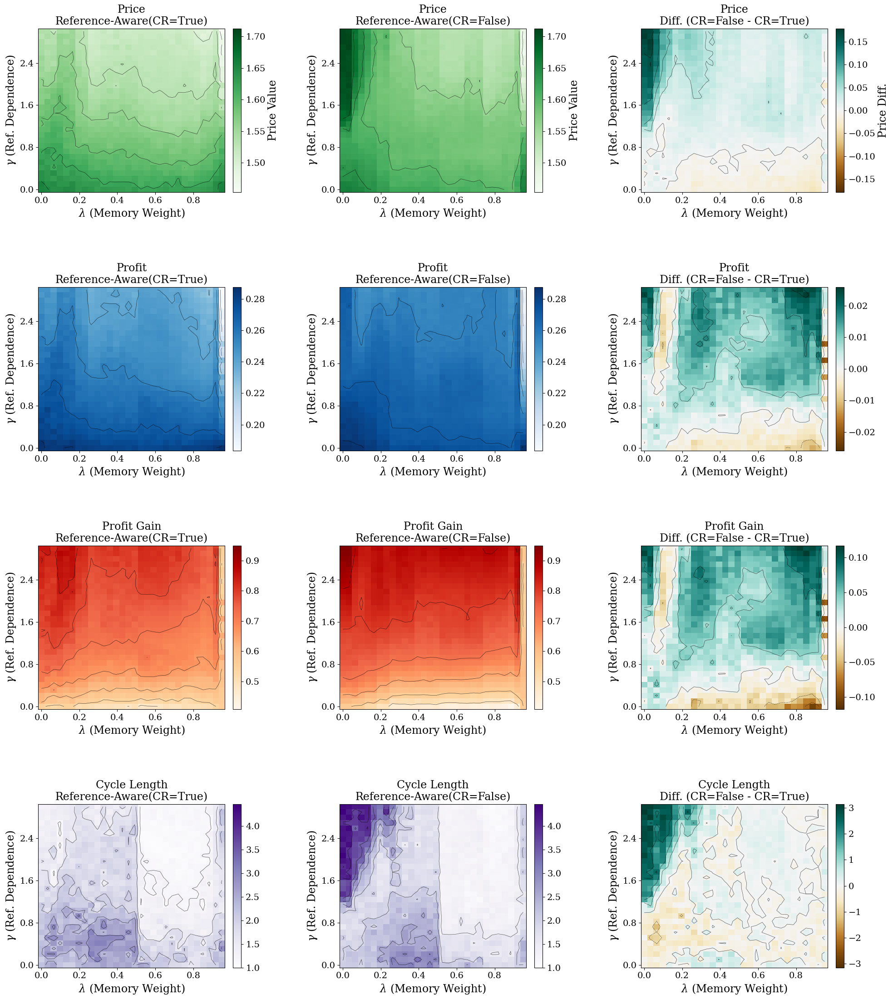

In [37]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as mticker
import numpy as np
import pandas as pd
import os
from glob import glob

# --- Assume extract_metric_data_gl is defined as before ---
# (Make sure it correctly extracts data based on the experiment_dir_path and metric_name_display)
def extract_metric_data_gl(experiment_dir_path, metric_name_display):
    gammas_list, lambdas_list, metrics_list = [], [], []
    if not os.path.isdir(experiment_dir_path):
        # print(f"Warning: Dir not found: {experiment_dir_path}")
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)
    run_dirs = glob(os.path.join(experiment_dir_path, "gamma_*_lambda_*"))
    if not run_dirs:
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)
    for run_dir in run_dirs:
        try:
            dir_name = os.path.basename(run_dir)
            parts_gamma = dir_name.split('gamma_')
            if len(parts_gamma) < 2: continue
            parts_lambda = parts_gamma[1].split('_lambda_')
            if len(parts_lambda) < 2: continue
            gamma_str = parts_lambda[0]
            lambda_str_full = parts_lambda[1]
            lambda_str = lambda_str_full.split('_')[0]
            g_val, l_val = float(gamma_str), float(lambda_str)
            stats_file = os.path.join(run_dir, "cycle_statistics.csv")
            if os.path.exists(stats_file):
                df_stats = pd.read_csv(stats_file, on_bad_lines='skip')
                if not df_stats.empty:
                    metric_val_found = np.nan
                    internal_metric_name = metric_name_display.lower().replace(" ", "_")
                    col_prefix = 'mean_cycle_length' if metric_name_display == 'Cycle Length' else f'mean_{internal_metric_name}_p'
                    metric_columns = [col for col in df_stats.columns if col.startswith(col_prefix)]
                    if metric_columns:
                        numeric_data = df_stats[metric_columns].apply(pd.to_numeric, errors='coerce')
                        if not numeric_data.empty and not numeric_data.isnull().all().all():
                            metric_val_found = numeric_data.mean(axis=1).iloc[0]
                    if pd.notna(metric_val_found) and isinstance(metric_val_found, (int, float, np.number)):
                        gammas_list.append(g_val)
                        lambdas_list.append(l_val)
                        metrics_list.append(float(metric_val_found))
        except Exception: continue
    return np.array(gammas_list, dtype=float), np.array(lambdas_list, dtype=float), np.array(metrics_list, dtype=float)


# --- plot_heatmap_on_ax function (assumed defined as before) ---
def plot_heatmap_on_ax(ax, gamma_coords, lambda_coords, data_grid, title, cmap, norm, 
                       show_contours=True, fig_for_cbar=None, cbar_label=""):
    # (Using the robust version from the previous answer)
    if data_grid is None or data_grid.size == 0 or gamma_coords.size == 0 or lambda_coords.size == 0:
        ax.text(0.5, 0.5, "No Data", ha='center', va='center', transform=ax.transAxes, fontsize=10)
        ax.set_title(title, fontsize=plt.rcParams['axes.titlesize'])
        ax.set_xlabel(r"$\lambda$ (Memory Weight)", fontsize=plt.rcParams['axes.labelsize'])
        ax.set_ylabel(r"$\gamma$ (Ref. Dependence)", fontsize=plt.rcParams['axes.labelsize'])
        return None
    lambda_step = (lambda_coords[1] - lambda_coords[0]) / 2.0 if len(lambda_coords) > 1 else 0.5
    gamma_step = (gamma_coords[1] - gamma_coords[0]) / 2.0 if len(gamma_coords) > 1 else 0.5
    extent = [lambda_coords.min() - lambda_step, lambda_coords.max() + lambda_step,
              gamma_coords.min() - gamma_step, gamma_coords.max() + gamma_step]
    im = ax.imshow(data_grid, aspect='auto', origin='lower', extent=extent, cmap=cmap, norm=norm)
    ax.set_title(title, fontsize=plt.rcParams['axes.titlesize'])
    ax.set_xlabel(r"$\lambda$ (Memory Weight)", fontsize=plt.rcParams['axes.labelsize'])
    ax.set_ylabel(r"$\gamma$ (Ref. Dependence)", fontsize=plt.rcParams['axes.labelsize'])
    if len(lambda_coords) > 1 and len(lambda_coords) <=10 :
        ax.set_xticks(lambda_coords); ax.set_xticklabels([f"{val:.1f}" for val in lambda_coords], rotation=45, ha="right")
    else:
        ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=5, integer=False, prune='both')); ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))
    if len(gamma_coords) > 1 and len(gamma_coords) <=10:
        ax.set_yticks(gamma_coords); ax.set_yticklabels([f"{val:.1f}" for val in gamma_coords])
    else:
        ax.yaxis.set_major_locator(mticker.MaxNLocator(nbins=5, integer=False, prune='both')); ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))
    if show_contours and np.any(np.isfinite(data_grid)):
        grid_for_contour = np.nan_to_num(data_grid, nan=np.nanmedian(data_grid[np.isfinite(data_grid)])) if np.any(np.isfinite(data_grid)) else data_grid
        if np.any(np.isfinite(grid_for_contour)) and grid_for_contour.shape[0] > 1 and grid_for_contour.shape[1] > 1:
             X, Y = np.meshgrid(lambda_coords, gamma_coords); ax.contour(X, Y, grid_for_contour, levels=6, colors="black", linewidths=0.5, alpha=0.7)
    if fig_for_cbar and cbar_label:
        cbar = fig_for_cbar.colorbar(im, ax=ax, label=cbar_label, fraction=0.046, pad=0.04); cbar.ax.tick_params(labelsize=10)
    return im

# --- Enhanced Plotting Parameters (kept from previous) ---
plt.rcParams.update({
    'font.size': 17, 'axes.titlesize': 17, 'axes.labelsize': 17,
    'xtick.labelsize': 14, 'ytick.labelsize': 14, 'figure.titlesize': 16,
    'font.family': 'serif', 'mathtext.fontset': 'dejavuserif',
})


# --- MODIFIED Main Function for 4x3 CR=True vs CR=False Heatmaps ---
def create_cr_comparison_heatmaps(experiment_dirs_map, metrics_to_plot_list, figsize=(18, 20)):
    """
    Creates a 4x3 figure comparing Reference (CR=True) vs. Reference (CR=False).
    Rows: Metrics (Price, Profit, Profit Gain, Cycle Length)
    Cols: Reference (CR=True), Reference (CR=False), Difference (CR=False - CR=True)
    """
    n_rows = len(metrics_to_plot_list)
    n_cols = 3
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, squeeze=False)

    metric_cmaps = {
        "Price": 'Greens', "Profit": 'Blues', 
        "Profit Gain": 'OrRd', "Cycle Length": 'Purples'
    }
    diff_cmap = 'BrBG' # Diverging for differences
    loaded_data_cache = {}

    print("Loading data for Reference (CR=True) and Reference (CR=False)...")
    for metric_name_disp in metrics_to_plot_list:
        if metric_name_disp not in loaded_data_cache:
            loaded_data_cache[metric_name_disp] = {}
        
        # Load Reference (CR=True)
        g_cr_true, l_cr_true, m_cr_true = extract_metric_data_gl(
            experiment_dirs_map[('reference', True)], metric_name_disp
        )
        # Load Reference (CR=False)
        g_cr_false, l_cr_false, m_cr_false = extract_metric_data_gl(
            experiment_dirs_map[('reference', False)], metric_name_disp
        )
        
        loaded_data_cache[metric_name_disp]['cr_true'] = (g_cr_true, l_cr_true, m_cr_true)
        loaded_data_cache[metric_name_disp]['cr_false'] = (g_cr_false, l_cr_false, m_cr_false)
    print("Data loading complete.")

    for i, metric_name_disp in enumerate(metrics_to_plot_list):
        data_for_metric = loaded_data_cache[metric_name_disp]
        g_cr_true, l_cr_true, m_cr_true = data_for_metric['cr_true']
        g_cr_false, l_cr_false, m_cr_false = data_for_metric['cr_false']

        # Combine all unique gammas and lambdas for consistent grid dimensions
        g_all_coords_list = [g for g in [g_cr_true, g_cr_false] if g is not None and g.size > 0]
        l_all_coords_list = [l for l in [l_cr_true, l_cr_false] if l is not None and l.size > 0]

        if not g_all_coords_list or not l_all_coords_list:
            print(f"Skipping metric '{metric_name_disp}' due to missing coordinate data.")
            for j_col in range(n_cols): axes[i, j_col].text(0.5,0.5, "No Coords", ha='center',va='center')
            continue
            
        unique_g_coords = np.sort(np.unique(np.concatenate(g_all_coords_list).astype(float)))
        unique_l_coords = np.sort(np.unique(np.concatenate(l_all_coords_list).astype(float)))

        if unique_g_coords.size == 0 or unique_l_coords.size == 0 :
            print(f"Skipping metric '{metric_name_disp}' due to empty unique coordinates.")
            for j_col in range(n_cols): axes[i, j_col].text(0.5,0.5, "Empty Coords", ha='center',va='center')
            continue

        # Create common grids
        grid_cr_true_common = np.full((len(unique_g_coords), len(unique_l_coords)), np.nan)
        grid_cr_false_common = np.full((len(unique_g_coords), len(unique_l_coords)), np.nan)

        if m_cr_true is not None and m_cr_true.size > 0:
            for g, l, val in zip(g_cr_true, l_cr_true, m_cr_true):
                idx_g, idx_l = np.argmin(np.abs(unique_g_coords - g)), np.argmin(np.abs(unique_l_coords - l))
                grid_cr_true_common[idx_g, idx_l] = val
        if m_cr_false is not None and m_cr_false.size > 0:
            for g, l, val in zip(g_cr_false, l_cr_false, m_cr_false):
                idx_g, idx_l = np.argmin(np.abs(unique_g_coords - g)), np.argmin(np.abs(unique_l_coords - l))
                grid_cr_false_common[idx_g, idx_l] = val
        
        # Determine vmin/vmax for the first two columns
        valid_metrics_abs = []
        if np.any(np.isfinite(grid_cr_true_common)): valid_metrics_abs.extend(grid_cr_true_common[np.isfinite(grid_cr_true_common)])
        if np.any(np.isfinite(grid_cr_false_common)): valid_metrics_abs.extend(grid_cr_false_common[np.isfinite(grid_cr_false_common)])
        
        if not valid_metrics_abs:
            vmin_abs, vmax_abs = 0, 1 
        else:
            vmin_abs, vmax_abs = np.min(valid_metrics_abs), np.max(valid_metrics_abs)
            if vmin_abs == vmax_abs: vmin_abs -=0.01; vmax_abs +=0.01

        norm_abs = mcolors.Normalize(vmin=vmin_abs, vmax=vmax_abs)
        cmap_abs_val = metric_cmaps.get(metric_name_disp, 'viridis')

        # Col 1: Reference (CR=True)
        im1 = plot_heatmap_on_ax(axes[i, 0], unique_g_coords, unique_l_coords, grid_cr_true_common,
                                   f"{metric_name_disp}\nReference-Aware(CR=True)", cmap_abs_val, norm_abs)
        
        # Col 2: Reference (CR=False)
        im2 = plot_heatmap_on_ax(axes[i, 1], unique_g_coords, unique_l_coords, grid_cr_false_common,
                                   f"{metric_name_disp}\nReference-Aware(CR=False)", cmap_abs_val, norm_abs)

        # Col 3: Difference (CR=False - CR=True)
        grid_diff = grid_cr_false_common - grid_cr_true_common # Note the order of subtraction
        valid_diffs = grid_diff[np.isfinite(grid_diff)]
        
        im3 = None
        if valid_diffs.size > 0:
            vcenter_d = 0
            abs_max_d = np.max(np.abs(valid_diffs - vcenter_d)) if valid_diffs.size >0 else 0.1
            vmin_d, vmax_d = vcenter_d - abs_max_d, vcenter_d + abs_max_d
            if vmin_d == vmax_d: vmin_d -=0.01; vmax_d +=0.01
            norm_d = mcolors.TwoSlopeNorm(vcenter=vcenter_d, vmin=vmin_d, vmax=vmax_d)
            im3 = plot_heatmap_on_ax(axes[i, 2], unique_g_coords, unique_l_coords, grid_diff,
                                       f"{metric_name_disp}\nDiff. (CR=False - CR=True)", diff_cmap, norm_d)
        else:
            axes[i,2].text(0.5,0.5,"No Diff Data",ha='center',va='center')
            axes[i,2].set_title(f"{metric_name_disp}\nDifference")

        # Add colorbars - simplified to add to each plot for now
        # For shared colorbars per row, more complex GridSpec would be needed
        if im1: fig.colorbar(im1, ax=axes[i,0], label=f"{metric_name_disp} Value" if i==0 else "", fraction=0.046, pad=0.04)
        if im2: fig.colorbar(im2, ax=axes[i,1], label=f"{metric_name_disp} Value" if i==0 else "", fraction=0.046, pad=0.04)
        if im3: fig.colorbar(im3, ax=axes[i,2], label=f"{metric_name_disp} Diff." if i==0 else "", fraction=0.046, pad=0.04)


    # fig.suptitle("Comparison: Common Reference (CR=True) vs. Firm-Specific Reference (CR=False)\n(All 'Reference' Model for Firms)",
    #              fontsize=plt.rcParams['figure.titlesize'], y=0.995)
    
    fig.tight_layout(rect=[0, 0.02, 1, 0.95], h_pad=4.0, w_pad=2.5) # Increased h_pad for row separation

    return fig

# --- Main Execution Logic ---
if __name__ == "__main__":
    folder_location = "../Results/experiments" 
    experiment_base_pattern = "noloss/gamma_lambda" 

    # MODIFIED: experiment_dirs_map now only needs 'reference' True and False
    exp_dirs_for_cr_comparison = {
        ('reference', True): os.path.join(folder_location, f"{experiment_base_pattern}_reference_True"),
        ('reference', False): os.path.join(folder_location, f"{experiment_base_pattern}_reference_False"),
        # We also need misspecification paths if we were to plot them, but not for this specific figure.
        # However, the original `create_metric_comparison_heatmaps` expected misspecification paths for its logic.
        # The new `create_cr_comparison_heatmaps` will only use the keys it needs.
    }
    
    # Crucially, ensure these paths for CR=False exist and contain data
    all_paths_exist = True
    for key_needed in [('reference', True), ('reference', False)]:
        path = exp_dirs_for_cr_comparison.get(key_needed)
        if not path or not os.path.isdir(path):
            print(f"FATAL: Experiment directory for {key_needed} not found or invalid: {path}")
            all_paths_exist = False
    if not all_paths_exist:
        print("Please check your 'folder_location' and 'experiment_base_pattern'. Exiting.")
        exit()

    metrics_for_rows = ["Price", "Profit", "Profit Gain", "Cycle Length"]

    output_fig_dir = os.path.join(folder_location, experiment_base_pattern, "Comparative_Figures_CR_True_vs_False")
    os.makedirs(output_fig_dir, exist_ok=True)

    print(f"Generating 4x3 CR=True vs CR=False heatmap for {experiment_base_pattern}...")
    comparative_cr_fig = create_cr_comparison_heatmaps( # Call the new function
        experiment_dirs_map=exp_dirs_for_cr_comparison, # Pass the specific map
        metrics_to_plot_list=metrics_for_rows,
        figsize=(20, 24) 
    )

    fname = "gamma_lambda_4x3_reference_cr_true_vs_false.png"
    comparative_cr_fig.savefig(os.path.join(output_fig_dir, fname), dpi=300)
    print(f"Figure saved to {os.path.join(output_fig_dir, fname)}")
    plt.show()

***

Generating Alpha-Beta comparative heatmaps (excluding smallest beta)...
Loading data for Alpha-Beta heatmaps...
Alpha-Beta data loading complete.
Excluding smallest beta (3.60e-07) for metric 'Price'
Excluding smallest beta (3.60e-07) for metric 'Profit'
Excluding smallest beta (3.60e-07) for metric 'Profit Gain'
Excluding smallest beta (3.60e-07) for metric 'Cycle Length'
Alpha-Beta Figure saved to ../Results_sockeye/experiments/final_results/Comparative_Alpha_Beta_Heatmaps_NoSmallestBeta/alpha_beta_Nx3_noref_vs_ref_no_smallest_beta.png


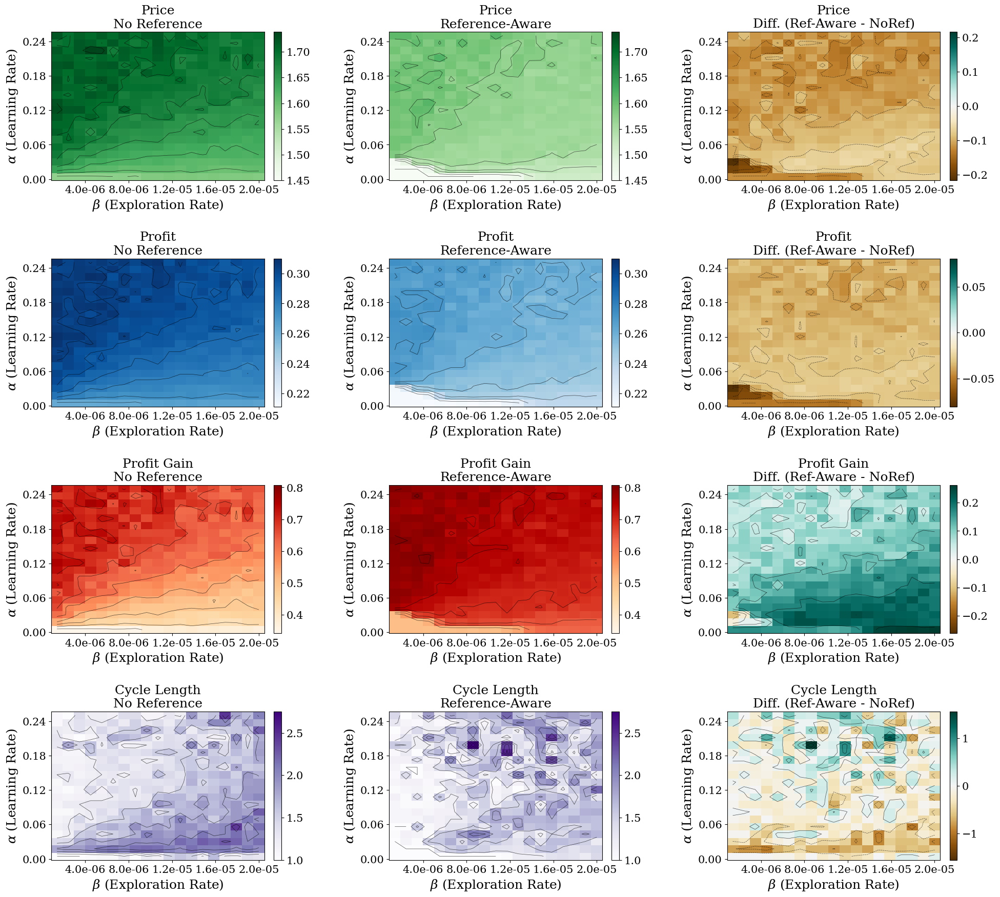

In [8]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as mticker
import numpy as np
import pandas as pd
import os
from glob import glob

# --- Your extract_metric_data function (as provided) ---
def extract_metric_data(experiment_dir_parent, metric_name):
    pattern_sub_dirs = "alpha_*_beta_*"
    run_dirs = glob(os.path.join(experiment_dir_parent, pattern_sub_dirs))
    alpha_values_all, beta_values_all, metric_values_all = [], [], []
    if not run_dirs:
        # print(f"Warning: No run sub-dirs in {experiment_dir_parent}")
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)
    for run_dir_path in run_dirs:
        dir_name = os.path.basename(run_dir_path)
        try:
            alpha_str = dir_name.split('alpha_')[1].split('_beta_')[0]
            beta_str_full = dir_name.split('beta_')[1]; beta_str = beta_str_full.split('_')[0]
            alpha_val, beta_val = float(alpha_str), float(beta_str)
        except (IndexError, ValueError): continue
        metric_val = np.nan; stats_file = os.path.join(run_dir_path, "cycle_statistics.csv")
        if not os.path.exists(stats_file): continue
        try:
            df_stats = pd.read_csv(stats_file, on_bad_lines='skip')
            if not df_stats.empty:
                if metric_name == "Cycle Length": metric_val = float(df_stats["mean_cycle_length"].iloc[0]) if "mean_cycle_length" in df_stats.columns else np.nan
                elif metric_name == "Surplus": metric_val = float(df_stats["mean_consumer_surplus"].iloc[0]) if "mean_consumer_surplus" in df_stats.columns else np.nan
                elif metric_name in ["Cycle Probability", "Conditional Cycle Length", "Average Cycle Length (Sessions)"]:
                    session_summary_file = os.path.join(run_dir_path, "session_summaries.csv")
                    if not os.path.exists(session_summary_file): continue
                    df_sessions = pd.read_csv(session_summary_file, on_bad_lines='skip')
                    if df_sessions.empty or 'cycle_length' not in df_sessions.columns: continue
                    df_sessions['cycle_length'] = pd.to_numeric(df_sessions['cycle_length'], errors='coerce').dropna()
                    if df_sessions.empty: continue
                    if metric_name == "Cycle Probability": metric_val = (df_sessions['cycle_length'] > 1).sum() / len(df_sessions) if len(df_sessions) > 0 else 0.0
                    elif metric_name == "Conditional Cycle Length": cycles_df = df_sessions[df_sessions['cycle_length'] > 1]; metric_val = cycles_df['cycle_length'].mean() if not cycles_df.empty else np.nan
                    elif metric_name == "Average Cycle Length (Sessions)": metric_val = df_sessions['cycle_length'].mean()
                else:
                    key = metric_name.lower().replace(" ", "_"); cols = [c for c in df_stats.columns if c.startswith(f"mean_{key}_p")]
                    if cols: numeric_data = df_stats[cols].apply(pd.to_numeric, errors='coerce'); metric_val = numeric_data.mean(axis=1).iloc[0] if not numeric_data.empty and not numeric_data.isnull().all().all() else np.nan
        except Exception: metric_val = np.nan
        if pd.notna(metric_val) and isinstance(metric_val, (int, float, np.number)):
            alpha_values_all.append(alpha_val); beta_values_all.append(beta_val); metric_values_all.append(float(metric_val))
    if not alpha_values_all: return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)
    return np.array(alpha_values_all, dtype=float), np.array(beta_values_all, dtype=float), np.array(metric_values_all, dtype=float)

# --- plot_ab_heatmap_on_ax function (as provided by you, slightly condensed for brevity here) ---
def plot_ab_heatmap_on_ax(ax, alpha_coords, beta_coords, data_grid, title, cmap, norm, show_contours=True, fig_for_cbar=None, cbar_label=""):
    if data_grid is None or data_grid.size == 0 or alpha_coords.size == 0 or beta_coords.size == 0:
        ax.text(0.5, 0.5, "No Data", ha='center', va='center', fontsize=10); ax.set_title(title, fontsize=plt.rcParams['axes.titlesize'])
        ax.set_xlabel(r"$\beta$ (Exploration Rate)", fontsize=plt.rcParams['axes.labelsize']); ax.set_ylabel(r"$\alpha$ (Learning Rate)", fontsize=plt.rcParams['axes.labelsize']); return None
    beta_step = (beta_coords[1] - beta_coords[0]) / 2.0 if len(beta_coords) > 1 else (beta_coords[0]*0.1 or 1e-7); alpha_step = (alpha_coords[1] - alpha_coords[0]) / 2.0 if len(alpha_coords) > 1 else (alpha_coords[0]*0.1 or 0.01)
    extent = [beta_coords.min()-beta_step, beta_coords.max()+beta_step, alpha_coords.min()-alpha_step, alpha_coords.max()+alpha_step]
    im = ax.imshow(data_grid, aspect='auto', origin='lower', extent=extent, cmap=cmap, norm=norm)
    ax.set_title(title, fontsize=plt.rcParams['axes.titlesize']); ax.set_xlabel(r"$\beta$ (Exploration Rate)", fontsize=plt.rcParams['axes.labelsize']); ax.set_ylabel(r"$\alpha$ (Learning Rate)", fontsize=plt.rcParams['axes.labelsize'])
    ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=5, prune='both')); ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.1e')) # Adjusted for potentially small betas
    if len(beta_coords) <=10 and len(beta_coords) > 0 : ax.set_xticks(beta_coords)
    ax.yaxis.set_major_locator(mticker.MaxNLocator(nbins=5, prune='both')); ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))
    if len(alpha_coords) <=10 and len(alpha_coords) > 0: ax.set_yticks(alpha_coords)
    if show_contours and np.any(np.isfinite(data_grid)):
        grid_for_contour = np.nan_to_num(data_grid, nan=np.nanmedian(data_grid[np.isfinite(data_grid)])) if np.any(np.isfinite(data_grid)) else data_grid
        if np.any(np.isfinite(grid_for_contour)) and grid_for_contour.shape[0]>1 and grid_for_contour.shape[1]>1: X_beta, Y_alpha = np.meshgrid(beta_coords, alpha_coords); ax.contour(X_beta, Y_alpha, grid_for_contour, levels=6, colors="black", linewidths=0.5, alpha=0.7)
    if fig_for_cbar and cbar_label: cbar = fig_for_cbar.colorbar(im, ax=ax, label=cbar_label, fraction=0.046, pad=0.04); cbar.ax.tick_params(labelsize=10)
    return im

# --- Enhanced Plotting Parameters ---
plt.rcParams.update({
    'font.size': 18, 'axes.titlesize': 18, 'axes.labelsize': 18,
    'xtick.labelsize': 15, 'ytick.labelsize': 15, 'figure.titlesize': 16, # Smaller ticks
    'font.family': 'serif', 'mathtext.fontset': 'dejavuserif',
})

# --- MODIFIED Main Function for Alpha-Beta Comparative Heatmaps ---
def create_alpha_beta_comparison_heatmaps(experiment_dirs_map, metrics_to_plot_list, figsize=(18, 20),
                                          exclude_smallest_beta=True): # New parameter
    n_rows = len(metrics_to_plot_list)
    n_cols = 3
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, squeeze=False)

    metric_cmaps = {
        "Price": 'Greens', "Profit": 'Blues', "Profit Gain": 'OrRd', "Cycle Length": 'Purples',
        "Cycle Probability": 'GnBu', "Conditional Cycle Length": 'YlOrBr', 
        "Average Cycle Length (Sessions)": 'PuBuGn', "Surplus": "viridis"
    }
    diff_cmap = 'BrBG'
    loaded_data_cache = {}

    print("Loading data for Alpha-Beta heatmaps...")
    for metric_name_disp in metrics_to_plot_list:
        if metric_name_disp not in loaded_data_cache: loaded_data_cache[metric_name_disp] = {}
        a_nr, b_nr, m_nr = extract_metric_data(experiment_dirs_map['noref'], metric_name_disp)
        a_r, b_r, m_r = extract_metric_data(experiment_dirs_map['ref'], metric_name_disp)
        loaded_data_cache[metric_name_disp]['noref'] = (a_nr, b_nr, m_nr)
        loaded_data_cache[metric_name_disp]['ref'] = (a_r, b_r, m_r)
    print("Alpha-Beta data loading complete.")

    for i, metric_name_disp in enumerate(metrics_to_plot_list):
        data_for_metric = loaded_data_cache.get(metric_name_disp)
        if not data_for_metric: print(f"No cached data for {metric_name_disp}"); continue

        a_nr, b_nr, m_nr = data_for_metric['noref']
        a_r, b_r, m_r = data_for_metric['ref']

        alpha_all_raw = [a for a in [a_nr, a_r] if a is not None and a.size > 0]
        beta_all_raw = [b for b in [b_nr, b_r] if b is not None and b.size > 0]

        if not alpha_all_raw or not beta_all_raw:
            print(f"Skipping metric '{metric_name_disp}' (alpha-beta) due to missing raw coordinate data.")
            for j_col in range(n_cols): axes[i, j_col].text(0.5,0.5, "No Coords", ha='center',va='center'); axes[i,j_col].set_axis_off()
            continue
            
        unique_alpha_coords_full = np.sort(np.unique(np.concatenate(alpha_all_raw).astype(float)))
        unique_beta_coords_full = np.sort(np.unique(np.concatenate(beta_all_raw).astype(float)))

        # --- MODIFICATION: Exclude smallest beta ---
        unique_beta_coords_to_plot = unique_beta_coords_full
        smallest_beta_value = None
        if exclude_smallest_beta and len(unique_beta_coords_full) > 1:
            smallest_beta_value = unique_beta_coords_full[0]
            unique_beta_coords_to_plot = unique_beta_coords_full[1:] # All betas except the first (smallest)
            print(f"Excluding smallest beta ({smallest_beta_value:.2e}) for metric '{metric_name_disp}'")
            if unique_beta_coords_to_plot.size == 0: # If only one beta was present, and it was excluded
                 print(f"Warning: After excluding smallest beta, no beta values remain for '{metric_name_disp}'. Plotting with original beta range.")
                 unique_beta_coords_to_plot = unique_beta_coords_full # Revert if empty
                 smallest_beta_value = None # Do not filter data later
        # --- End of MODIFICATION ---

        if unique_alpha_coords_full.size == 0 or unique_beta_coords_to_plot.size == 0 :
            print(f"Skipping metric '{metric_name_disp}' (alpha-beta) due to empty unique coordinates after filtering.")
            for j_col in range(n_cols): axes[i, j_col].text(0.5,0.5, "Empty Coords", ha='center',va='center'); axes[i,j_col].set_axis_off()
            continue
        
        # Use unique_alpha_coords_full and unique_beta_coords_to_plot for gridding
        grid_noref_common = np.full((len(unique_alpha_coords_full), len(unique_beta_coords_to_plot)), np.nan)
        grid_ref_common = np.full((len(unique_alpha_coords_full), len(unique_beta_coords_to_plot)), np.nan)

        # Populate grids, skipping the smallest_beta_value if exclude_smallest_beta is True
        if m_nr is not None and m_nr.size > 0:
            for alpha, beta, val in zip(a_nr, b_nr, m_nr):
                if exclude_smallest_beta and smallest_beta_value is not None and np.isclose(beta, smallest_beta_value):
                    continue # Skip data for the smallest beta
                try: # Find index in the potentially filtered beta coordinates
                    idx_a = np.where(unique_alpha_coords_full == alpha)[0][0]
                    idx_b = np.where(unique_beta_coords_to_plot == beta)[0][0]
                    grid_noref_common[idx_a, idx_b] = val
                except IndexError: # Happens if beta was filtered out
                    pass 
        
        if m_r is not None and m_r.size > 0:
            for alpha, beta, val in zip(a_r, b_r, m_r):
                if exclude_smallest_beta and smallest_beta_value is not None and np.isclose(beta, smallest_beta_value):
                    continue
                try:
                    idx_a = np.where(unique_alpha_coords_full == alpha)[0][0]
                    idx_b = np.where(unique_beta_coords_to_plot == beta)[0][0]
                    grid_ref_common[idx_a, idx_b] = val
                except IndexError:
                    pass

        # --- Rest of the plotting logic (vmin/vmax, normalization, plotting calls) ---
        valid_metrics_abs = []
        if np.any(np.isfinite(grid_noref_common)): valid_metrics_abs.extend(grid_noref_common[np.isfinite(grid_noref_common)])
        if np.any(np.isfinite(grid_ref_common)): valid_metrics_abs.extend(grid_ref_common[np.isfinite(grid_ref_common)])
        
        if not valid_metrics_abs: vmin_abs, vmax_abs = 0,1
        else: vmin_abs, vmax_abs = np.min(valid_metrics_abs), np.max(valid_metrics_abs);
        if vmin_abs == vmax_abs: vmin_abs -=0.01; vmax_abs +=0.01
        norm_abs = mcolors.Normalize(vmin=vmin_abs, vmax=vmax_abs)
        cmap_abs_val = metric_cmaps.get(metric_name_disp, 'viridis')

        im1 = plot_ab_heatmap_on_ax(axes[i, 0], unique_alpha_coords_full, unique_beta_coords_to_plot, grid_noref_common,
                                   f"{metric_name_disp}\nNo Reference", cmap_abs_val, norm_abs) # Simplified title
        im2 = plot_ab_heatmap_on_ax(axes[i, 1], unique_alpha_coords_full, unique_beta_coords_to_plot, grid_ref_common,
                                   f"{metric_name_disp}\nReference-Aware", cmap_abs_val, norm_abs) # Simplified title
        
        grid_diff = grid_ref_common - grid_noref_common
        valid_diffs = grid_diff[np.isfinite(grid_diff)]
        im3 = None
        if valid_diffs.size > 0:
            vcenter_d = 0; abs_max_d = np.max(np.abs(valid_diffs - vcenter_d)) if valid_diffs.size >0 else 0.1
            vmin_d, vmax_d = vcenter_d - abs_max_d, vcenter_d + abs_max_d;
            if vmin_d == vmax_d: vmin_d -=0.01; vmax_d +=0.01
            norm_d = mcolors.TwoSlopeNorm(vcenter=vcenter_d, vmin=vmin_d, vmax=vmax_d)
            im3 = plot_ab_heatmap_on_ax(axes[i, 2], unique_alpha_coords_full, unique_beta_coords_to_plot, grid_diff,
                                       f"{metric_name_disp}\nDiff. (Ref-Aware - NoRef)", diff_cmap, norm_d)
        else: axes[i,2].text(0.5,0.5,"No Diff Data",ha='center',va='center'); axes[i,2].set_title(f"{metric_name_disp}\nDifference")

        # cbar_label_val = f"{metric_name_disp}" if i == 0 else "" # Shorter cbar label
        # cbar_label_diff = f"Diff." if i == 0 else ""
        if im1: fig.colorbar(im1, ax=axes[i,0], fraction=0.046, pad=0.04)
        if im2: fig.colorbar(im2, ax=axes[i,1], fraction=0.046, pad=0.04)
        if im3: fig.colorbar(im3, ax=axes[i,2], fraction=0.046, pad=0.04)

    # fig.suptitle("Alpha-Beta Analysis: No Reference vs. Reference", # Simplified suptitle
    #              fontsize=plt.rcParams['figure.titlesize'], y=0.995)
    fig.tight_layout(rect=[0, 0.02, 1, 0.95], h_pad=1.5, w_pad=2.5) # Increased w_pad more
    return fig

# --- Main Execution Logic ---
if __name__ == "__main__":
    base_results_dir = "../Results_sockeye/experiments"
    output_fig_dir_ab = os.path.join(base_results_dir, "final_results", "Comparative_Alpha_Beta_Heatmaps_NoSmallestBeta") # New output folder
    os.makedirs(output_fig_dir_ab, exist_ok=True)
    
    alpha_beta_exp_dirs = {
        'noref': os.path.join(base_results_dir, "final_results/alpha_beta_noreference_True"),
        'ref': os.path.join(base_results_dir, "final_results/alpha_beta_reference_True")
    }
    # ... (path existence check from previous code) ...
    all_paths_exist = True
    for key, path in alpha_beta_exp_dirs.items():
        if not os.path.isdir(path): print(f"FATAL: Dir for '{key}' not found: {path}"); all_paths_exist = False
    if not all_paths_exist: print("Exiting."); exit()

    ab_metrics_to_plot = [
        "Price", "Profit",  "Profit Gain", "Cycle Length",
       # "Price Gain","Cycle Probability", "Conditional Cycle Length", "Average Cycle Length (Sessions)"
    ]

    print(f"Generating Alpha-Beta comparative heatmaps (excluding smallest beta)...")
    num_actual_rows = len(ab_metrics_to_plot)
    fig_height = num_actual_rows * 4.8 # Adjusted height per row
    fig_width = 20 # Adjusted width

    ab_comparative_fig = create_alpha_beta_comparison_heatmaps(
        experiment_dirs_map=alpha_beta_exp_dirs,
        metrics_to_plot_list=ab_metrics_to_plot,
        figsize=(fig_width, fig_height),
        exclude_smallest_beta=True # Pass the new parameter
    )

    ab_fname = "alpha_beta_Nx3_noref_vs_ref_no_smallest_beta.png"
    ab_comparative_fig.savefig(os.path.join(output_fig_dir_ab, ab_fname), dpi=300)
    print(f"Alpha-Beta Figure saved to {os.path.join(output_fig_dir_ab, ab_fname)}")
    plt.show()

***

/var/folders/xc/z0h2gmnn7gs78ryc5jz6h_mw0000gn/T/ipykernel_86130/3561579054.py:166: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  grouped_scenario['std'].fillna(0, inplace=True)
/var/folders/xc/z0h2gmnn7gs78ryc5jz6h_mw0000gn/T/ipykernel_86130/3561579054.py:166: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values a

Cycle metrics figure saved to ./Figures_Cycle_Metrics/gamma_cycle_metrics_3x1.png


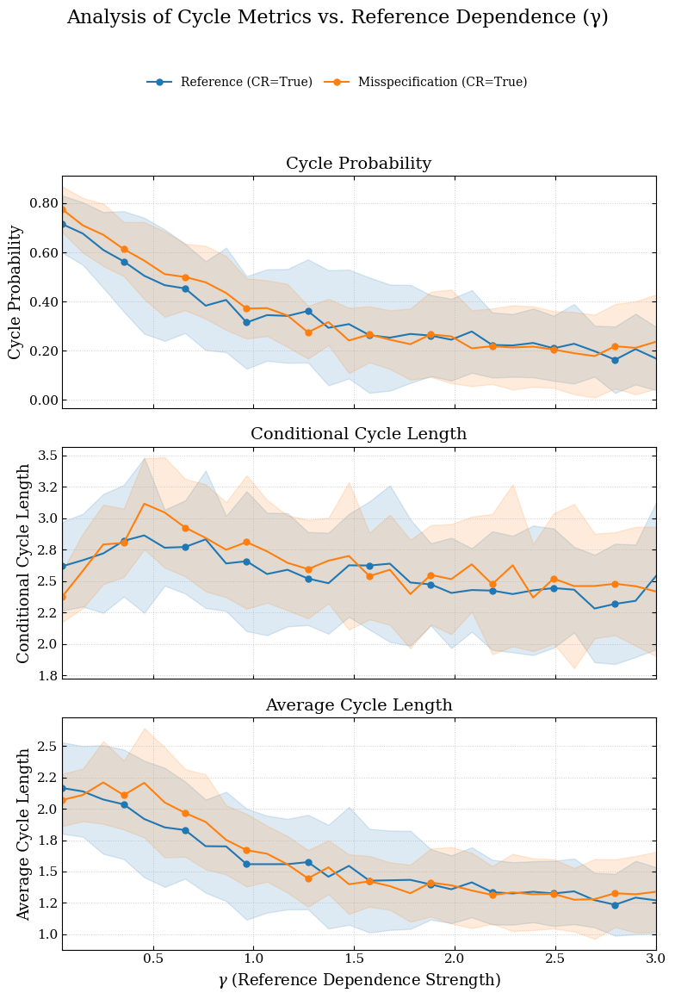

In [77]:
import os
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.colors as mcolors # For color adjustments if needed
import pandas as pd
import numpy as np
from glob import glob
import types # For isinstance check if using lambda for agg

# --- Configuration: Define paths and experiment directory names ---
out_dir = "./Figures_Cycle_Metrics" # Define your output directory
os.makedirs(out_dir, exist_ok=True)

folder_location = "../Results_sockeye/experiments" # Base results folder
base_exp_name = "final_results/gamma_lambda"       # Common part of experiment set names for reference/misspec
# base_qlr_exp_name = "final_results/gamma_lambda_qlr" # Example for QLR if you add it

exp_dirs = {
    ('reference', True): os.path.join(folder_location, f"{base_exp_name}_reference_True"),
    ('reference', False): os.path.join(folder_location, f"{base_exp_name}_reference_False"),
    ('misspecification', True): os.path.join(folder_location, f"{base_exp_name}_misspecification_True"),
    ('misspecification', False): os.path.join(folder_location, f"{base_exp_name}_misspecification_False"),
    # ('qlr_reference', True): os.path.join(folder_location, f"{base_qlr_exp_name}_only_qlr_reference_True"), # Example
}

# --- Color and Marker Definitions ---
# Function to adjust color brightness (optional, if you want shades)
def adjust_color_brightness(color_name, factor):
    try:
        c = mcolors.to_rgb(color_name)
        c_hsv = mcolors.rgb_to_hsv(c)
        c_hsv[2] = np.clip(c_hsv[2] * factor, 0, 1)
        return mcolors.hsv_to_rgb(c_hsv)
    except ValueError: return color_name

# Define colors and markers for different scenarios
# You can expand this to include QLR cases if needed
scenario_styles = {
    ('reference', True): {'color': 'tab:blue', 'marker': 'o', 'label': "Reference (CR=True)"},
    #('reference', False): {'color': adjust_color_brightness('tab:blue', 1.3), 'marker': 's', 'label': "Reference (CR=False)"},
    ('misspecification', True): {'color': 'tab:orange', 'marker': 'o', 'label': "Misspecification (CR=True)"},
    #('misspecification', False): {'color': adjust_color_brightness('tab:orange', 1.3), 'marker': 's', 'label': "Misspecification (CR=False)"},
    ('qlr_reference', True): {'color': 'tab:green', 'marker': 'D', 'label': "QLR Ref. (CR=True)"},
}


# --- Robust Data Extraction Function for Cycle Metrics (and others) ---
def load_gamma_metric_cycle(run_dir_path, metric_name_display):
    """
    Loads a specific metric for a given gamma-lambda run directory.
    Handles cycle metrics from session_summaries.csv and others from cycle_statistics.csv.
    Returns (gamma_value, metric_value) for the run.
    """
    base_run_dir_name = os.path.basename(run_dir_path)
    current_gamma = np.nan
    try:
        current_gamma = float(base_run_dir_name.split('gamma_')[1].split('_lambda_')[0])
    except (IndexError, ValueError):
        # print(f"Could not parse gamma from directory: {run_dir_path}")
        return None, np.nan

    val = np.nan
    if metric_name_display in ["Cycle Probability", "Conditional Cycle Length", "Average Cycle Length"]:
        session_summary_file = os.path.join(run_dir_path, "session_summaries.csv")
        if not os.path.exists(session_summary_file): return current_gamma, np.nan
        try:
            df_sessions = pd.read_csv(session_summary_file)
            if df_sessions.empty or 'cycle_length' not in df_sessions.columns: return current_gamma, np.nan
            df_sessions['cycle_length'] = pd.to_numeric(df_sessions['cycle_length'], errors='coerce').dropna()
            if df_sessions.empty: return current_gamma, np.nan

            if metric_name_display == "Cycle Probability":
                val = (df_sessions['cycle_length'] > 1).sum() / len(df_sessions) if len(df_sessions) > 0 else 0
            elif metric_name_display == "Conditional Cycle Length":
                cycles_df = df_sessions[df_sessions['cycle_length'] > 1]
                val = cycles_df['cycle_length'].mean() if not cycles_df.empty else np.nan
            elif metric_name_display == "Average Cycle Length":
                val = df_sessions['cycle_length'].mean()
        except Exception as e: print(f"Err session_sum {run_dir_path} for {metric_name_display}: {e}"); return current_gamma, np.nan
    else: # For other metrics from cycle_statistics.csv
        stats_file = os.path.join(run_dir_path, "cycle_statistics.csv")
        if not os.path.exists(stats_file): return current_gamma, np.nan
        try:
            df_stats = pd.read_csv(stats_file)
            if not df_stats.empty:
                internal_metric_name = metric_name_display.lower().replace(" ", "_")
                col_prefix = 'mean_cycle_length' if metric_name_display == 'Old Avg Cycle Length' else f'mean_{internal_metric_name}_p' # Distinguish if needed
                
                cols = [c for c in df_stats.columns if c.startswith(col_prefix)]
                if cols:
                    numeric_data = df_stats[cols].apply(pd.to_numeric, errors='coerce')
                    if not numeric_data.empty and not numeric_data.isnull().all().all():
                        val = numeric_data.mean(axis=1).iloc[0]
        except Exception as e: print(f"Err cycle_stats {run_dir_path} for {metric_name_display}: {e}"); return current_gamma, np.nan
    return current_gamma, val


# --- Plotting Setup ---
plt.rcParams.update({
    'font.size': 12, 'axes.titlesize': 14, 'axes.labelsize': 13,
    'xtick.labelsize': 11, 'ytick.labelsize': 11, 'legend.fontsize': 10,
    'figure.titlesize': 16, 'font.family': 'serif', 'mathtext.fontset': 'dejavuserif',
})

# Metrics to plot in the 3x1 figure
metrics_for_cycle_figure = ["Cycle Probability", "Conditional Cycle Length", "Average Cycle Length"]
# You can add more scenarios to this list if you have data for them and update scenario_styles
scenarios_to_plot_in_figure = [
    ('reference', True),
    ('reference', False),
    ('misspecification', True),
    ('misspecification', False),
    # ('qlr_reference', True), # Example if you want to add QLR
]


fig_cycle, axes_cycle = plt.subplots(3, 1, figsize=(8, 12), sharex=True) # 3 rows, 1 column
# If only one plot, axes_cycle is not an array, so make it one:
if not isinstance(axes_cycle, np.ndarray):
    axes_cycle = np.array([axes_cycle])
axes_cycle_flat = axes_cycle.flatten()

plot_handles_for_legend_cycle = []
plot_labels_for_legend_cycle = []
legend_elements_collected_cycle = False

for idx, metric_to_display in enumerate(metrics_for_cycle_figure):
    if idx >= len(axes_cycle_flat): break
    ax = axes_cycle_flat[idx]
    ax.set_title(metric_to_display)
    first_gamma_series_for_xlim_cycle = None

    for scenario_key in scenarios_to_plot_in_figure:
        if scenario_key not in scenario_styles or scenario_key not in exp_dirs:
            # print(f"Skipping scenario {scenario_key}: not in styles or exp_dirs.")
            continue
        
        style_config = scenario_styles[scenario_key]
        scenario_parent_dir = exp_dirs[scenario_key]

        if not scenario_parent_dir or not os.path.isdir(scenario_parent_dir):
            print(f"Path for key {scenario_key} is invalid: {scenario_parent_dir}")
            continue
            
        pattern_sub_dirs = "gamma_*_lambda_*"
        run_sub_dirs = glob(os.path.join(scenario_parent_dir, pattern_sub_dirs))
        if not run_sub_dirs: continue

        gamma_values_for_scenario, metric_values_for_scenario = [], []
        for run_dir_path in run_sub_dirs:
            g_val, m_val = load_gamma_metric_cycle(run_dir_path, metric_to_display)
            if g_val is not None and pd.notna(m_val):
                gamma_values_for_scenario.append(g_val)
                metric_values_for_scenario.append(m_val)
        
        if not gamma_values_for_scenario: continue

        df_scenario_data = pd.DataFrame({'gamma': gamma_values_for_scenario, 'value': metric_values_for_scenario})
        
        # Aggregation
        unique_gammas_in_data = df_scenario_data['gamma'].nunique()
        std_dev_data = df_scenario_data.groupby('gamma')['value'].std()
        mean_data = df_scenario_data.groupby('gamma')['value'].mean()
        
        grouped_scenario = pd.DataFrame({'mean': mean_data, 'std': std_dev_data}).reset_index()
        grouped_scenario['std'].fillna(0, inplace=True)

        γ_agg, μ_agg, σ_agg = grouped_scenario['gamma'].values, grouped_scenario['mean'].values, grouped_scenario['std'].values
        
        # Sort by gamma for correct plotting
        sort_indices = np.argsort(γ_agg)
        γ_agg, μ_agg, σ_agg = γ_agg[sort_indices], μ_agg[sort_indices], σ_agg[sort_indices]

        if first_gamma_series_for_xlim_cycle is None and γ_agg.size > 0:
            first_gamma_series_for_xlim_cycle = γ_agg

        ln, = ax.plot(γ_agg, μ_agg, color=style_config['color'], linestyle='-',
                      marker=style_config['marker'], markersize=5, linewidth=1.5, 
                      label=style_config['label'], markevery=3) # Adjusted markevery and markersize
        ax.fill_between(γ_agg, μ_agg - σ_agg, μ_agg + σ_agg, color=style_config['color'], alpha=0.15)

        if not legend_elements_collected_cycle:
            plot_handles_for_legend_cycle.append(ln)
            plot_labels_for_legend_cycle.append(style_config['label'])
            
    if not legend_elements_collected_cycle and plot_handles_for_legend_cycle:
        legend_elements_collected_cycle = True

    ax.grid(True, linestyle=':', linewidth=0.7, alpha=0.6)
    ax.set_ylabel(metric_to_display)
    ax.tick_params(direction='in', top=True, right=True)

    if "Probability" in metric_to_display:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))
        ax.set_ylim(bottom=max(-0.05, ax.get_ylim()[0]), top=min(1.05, ax.get_ylim()[1])) # Prob usually 0-1
    elif "Cycle Length" in metric_to_display:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))
        ax.set_ylim(bottom=max(0, ax.get_ylim()[0])) # Cycle length >= 0 (or 1)

    if idx == len(metrics_for_cycle_figure) - 1: # Only last plot gets x-axis label
         ax.set_xlabel(r"$\gamma$ (Reference Dependence Strength)")

    if first_gamma_series_for_xlim_cycle is not None and first_gamma_series_for_xlim_cycle.size > 0:
         ax.set_xlim(left=first_gamma_series_for_xlim_cycle.min(), right=first_gamma_series_for_xlim_cycle.max())
    else:
        ax.set_xlim(0, 3)

# --- Suptitle, Shared Legend & Layout for Cycle Figure ---
fig_cycle.suptitle("Analysis of Cycle Metrics vs. Reference Dependence (γ)",
                   y=0.995, fontsize=plt.rcParams['figure.titlesize'])

if plot_handles_for_legend_cycle:
    num_legend_items = len(plot_handles_for_legend_cycle)
    # For 3x1, legend can be wider if needed
    ncol_legend = num_legend_items if num_legend_items <= 4 else 2 # Try to fit in one row, else 2 rows
    
    fig_cycle.legend(plot_handles_for_legend_cycle,
                     plot_labels_for_legend_cycle,
                     loc='upper center',
                     bbox_to_anchor=(0.5, 0.94), # Adjust y to fit below suptitle
                     ncol=ncol_legend,
                     frameon=False, handlelength=2.0, labelspacing=0.4, columnspacing=1.0)

    fig_cycle.tight_layout(rect=[0, 0.03, 1, 0.90]) # Adjust top for suptitle and legend
else:
    fig_cycle.tight_layout(rect=[0, 0.03, 1, 0.93])

cycle_fig_fname = "gamma_cycle_metrics_3x1.png"
fig_cycle.savefig(os.path.join(out_dir, cycle_fig_fname), dpi=300, bbox_inches='tight')
print(f"Cycle metrics figure saved to {os.path.join(out_dir, cycle_fig_fname)}")
plt.show()

In [12]:
# ... (keep imports and helper functions like adjust_color_brightness, plot_heatmap_on_ax from previous answers if needed, though plot_heatmap_on_ax is not used for line plots)
import os
import pandas as pd
import numpy as np
from glob import glob
import types # For isinstance check
import matplotlib.ticker as mticker

# --- Modified load_gamma_only_metric ---
def load_gamma_only_metric(gamma_run_dir, metric_name_display):
    """
    Loads a specific metric for a given QLR gamma-specific run directory.
    Handles cycle metrics from session_summaries.csv and others from cycle_statistics.csv.
    Returns (gamma_value, mean_metric_value, std_metric_value) for the run.
    For new cycle metrics from session_summaries.csv, std_metric_value will be 0 or NaN.
    """
    base_gamma_dir_name = os.path.basename(gamma_run_dir)
    current_gamma = np.nan
    try:
        # Assumes directory name is like "gamma_0.1"
        current_gamma = float(base_gamma_dir_name.split("gamma_")[1])
    except (IndexError, ValueError):
        print(f"Could not parse gamma from QLR directory: {gamma_run_dir}")
        return None, np.nan, np.nan

    mean_val = np.nan
    std_val = np.nan # Default std for new metrics or if not found

    if metric_name_display in ["Cycle Probability", "Conditional Cycle Length", "Average Cycle Length"]:
        session_summary_file = os.path.join(gamma_run_dir, "session_summaries.csv")
        if not os.path.exists(session_summary_file):
            # print(f"QLR: session_summaries.csv not found in {gamma_run_dir} for {metric_name_display}")
            return current_gamma, np.nan, np.nan
        
        try:
            df_sessions = pd.read_csv(session_summary_file)
            if df_sessions.empty or 'cycle_length' not in df_sessions.columns:
                return current_gamma, np.nan, np.nan
            df_sessions['cycle_length'] = pd.to_numeric(df_sessions['cycle_length'], errors='coerce').dropna()
            if df_sessions.empty: return current_gamma, np.nan, np.nan

            if metric_name_display == "Cycle Probability":
                mean_val = (df_sessions['cycle_length'] > 1).sum() / len(df_sessions) if len(df_sessions) > 0 else 0
                std_val = 0 # Probability is a single value from this file
            elif metric_name_display == "Conditional Cycle Length":
                cycles_df = df_sessions[df_sessions['cycle_length'] > 1]
                mean_val = cycles_df['cycle_length'].mean() if not cycles_df.empty else np.nan
                std_val = cycles_df['cycle_length'].std() if not cycles_df.empty and len(cycles_df) > 1 else 0 # Std of cycle lengths if multiple cycles > 1
            elif metric_name_display == "Average Cycle Length": # Avg of all cycle_length in session_summaries
                mean_val = df_sessions['cycle_length'].mean()
                std_val = df_sessions['cycle_length'].std() if len(df_sessions) > 1 else 0 # Std of cycle lengths
            if std_val is np.nan: std_val = 0 # Ensure std is not NaN if calculation yields it
                
        except Exception as e:
            print(f"QLR Err session_sum {gamma_run_dir} for {metric_name_display}: {e}")
            return current_gamma, np.nan, np.nan
    
    # For other metrics from cycle_statistics.csv (Price, Profit, Gains, or original mean_cycle_length)
    else:
        stats_file = os.path.join(gamma_run_dir, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            # print(f"QLR: cycle_statistics.csv not found in {gamma_run_dir} for {metric_name_display}")
            return current_gamma, np.nan, np.nan
        try:
            df_stats = pd.read_csv(stats_file)
            if not df_stats.empty:
                internal_metric_name = metric_name_display.lower().replace(" ", "_")
                
                # Check for pre-aggregated mean_cycle_length if that's the metric name used
                if metric_name_display == "Old Avg Cycle Length" or internal_metric_name == "mean_cycle_length":
                    if "mean_cycle_length" in df_stats.columns:
                        mean_val = float(df_stats["mean_cycle_length"].iloc[0])
                        std_val = float(df_stats["std_cycle_length"].iloc[0]) if "std_cycle_length" in df_stats.columns else 0
                else: # For Price, Profit, Price Gain, Profit Gain
                    mean_col_prefix = f'mean_{internal_metric_name}_p'
                    std_col_prefix = f'std_{internal_metric_name}_p'
                    
                    mean_cols = [c for c in df_stats.columns if c.startswith(mean_col_prefix)]
                    std_cols  = [c for c in df_stats.columns if c.startswith(std_col_prefix)]

                    if mean_cols: # Std_cols might not exist for all metrics
                        numeric_mean_data = df_stats[mean_cols].apply(pd.to_numeric, errors='coerce')
                        if not numeric_mean_data.empty and not numeric_mean_data.isnull().all().all():
                            mean_val = numeric_mean_data.mean(axis=1).iloc[0]
                        
                        if std_cols:
                            numeric_std_data = df_stats[std_cols].apply(pd.to_numeric, errors='coerce')
                            if not numeric_std_data.empty and not numeric_std_data.isnull().all().all():
                                std_val = numeric_std_data.mean(axis=1).iloc[0] # Average of stds if multiple player stds
                            else: std_val = 0 # if std_cols exist but data is bad
                        else: std_val = 0 # If no std_cols found, assume std is 0 for plotting
                    else: 
                        # print(f"QLR: No mean_cols found for {metric_name_display} in {stats_file}")
                        pass # mean_val remains np.nan
            else:
                # print(f"QLR: cycle_statistics.csv is empty in {gamma_run_dir}")
                pass
        except Exception as e:
            print(f"QLR Err cycle_stats {gamma_run_dir} for {metric_name_display}: {e}")
            return current_gamma, np.nan, np.nan

    return current_gamma, mean_val, std_val if pd.notna(std_val) else 0
# --- load_gamma_metric_cycle (from your previous response, for non-QLR data) ---
def load_gamma_metric_cycle(run_dir_path, metric_name_display):
    # (This is the function you provided that processes gamma_X_lambda_Y directories
    # and expects aggregation to happen outside, based on the gamma value it returns)
    base_run_dir_name = os.path.basename(run_dir_path)
    current_gamma = np.nan
    try:
        current_gamma = float(base_run_dir_name.split('gamma_')[1].split('_lambda_')[0])
    except (IndexError, ValueError): return None, np.nan
    val = np.nan
    if metric_name_display in ["Cycle Probability", "Conditional Cycle Length", "Average Cycle Length"]:
        session_summary_file = os.path.join(run_dir_path, "session_summaries.csv")
        if not os.path.exists(session_summary_file): return current_gamma, np.nan
        try:
            df_sessions = pd.read_csv(session_summary_file)
            if df_sessions.empty or 'cycle_length' not in df_sessions.columns: return current_gamma, np.nan
            df_sessions['cycle_length'] = pd.to_numeric(df_sessions['cycle_length'], errors='coerce').dropna()
            if df_sessions.empty: return current_gamma, np.nan
            if metric_name_display == "Cycle Probability": val = (df_sessions['cycle_length'] > 1).sum() / len(df_sessions) if len(df_sessions) > 0 else 0
            elif metric_name_display == "Conditional Cycle Length":
                cycles_df = df_sessions[df_sessions['cycle_length'] > 1]; val = cycles_df['cycle_length'].mean() if not cycles_df.empty else np.nan
            elif metric_name_display == "Average Cycle Length": val = df_sessions['cycle_length'].mean()
        except Exception: return current_gamma, np.nan
    else: # For other metrics from cycle_statistics.csv
        stats_file = os.path.join(run_dir_path, "cycle_statistics.csv")
        if not os.path.exists(stats_file): return current_gamma, np.nan
        try:
            df_stats = pd.read_csv(stats_file); #... (rest of your original logic for other metrics)
            # This part needs to be complete if you plot other metrics with this function
            if not df_stats.empty:
                internal_metric_name = metric_name_display.lower().replace(" ", "_")
                col_prefix = 'mean_cycle_length' if metric_name_display == 'Old Avg Cycle Length' else f'mean_{internal_metric_name}_p'
                cols = [c for c in df_stats.columns if c.startswith(col_prefix)]
                if cols:
                    numeric_data = df_stats[cols].apply(pd.to_numeric, errors='coerce')
                    if not numeric_data.empty and not numeric_data.isnull().all().all(): val = numeric_data.mean(axis=1).iloc[0]
        except Exception: return current_gamma, np.nan
    return current_gamma, val


# --- Configuration ---
out_dir = "./Figures_Cycle_Metrics_with_QLR"
os.makedirs(out_dir, exist_ok=True)

folder_location = "../Results_sockeye/experiments"
base_exp_name = "recreating_results/gamma_lambda_high"
# IMPORTANT: Define the base name for your QLR experiment directories
base_qlr_exp_name = "recreating_results/gamma" # EXAMPLE - CHANGE THIS

exp_dirs = {
    ('reference', True): os.path.join(folder_location, f"{base_exp_name}_reference_True"),
    ('reference', False): os.path.join(folder_location, f"{base_exp_name}_reference_False"),
    ('misspecification', True): os.path.join(folder_location, f"{base_exp_name}_misspecification_True"),
    ('misspecification', False): os.path.join(folder_location, f"{base_exp_name}_misspecification_False"),
    # QLR paths - these parent directories should contain "gamma_X" subfolders
    ('qlr_reference', True): os.path.join(folder_location, f"{base_qlr_exp_name}_only_reference_True"),
    ('qlr_reference', False): os.path.join(folder_location, f"{base_qlr_exp_name}_only_reference_False"), # If you have CR=False for QLR
}

# --- Scenario Styles ---
def adjust_color_brightness(color_name, factor):
    try: c = mcolors.to_rgb(color_name); c_hsv = mcolors.rgb_to_hsv(c); c_hsv[2] = np.clip(c_hsv[2] * factor, 0, 1); return mcolors.hsv_to_rgb(c_hsv)
    except ValueError: return color_name

scenario_styles = {
    ('reference', True): {'color': 'tab:blue', 'marker': 'o', 'label': "Exp Smoothing(Reference-Aware, CR=True)"},
    ('reference', False): {'color': adjust_color_brightness('tab:blue', 1.3), 'marker': 's', 'label': "Exp Smoothing(Reference-Aware, CR=False)"},
    ('misspecification', True): {'color': 'tab:orange', 'marker': 'o', 'label': "Exp Smoothing(Reference-Naive, CR=True)"},
    ('misspecification', False): {'color': adjust_color_brightness('tab:orange', 1.3), 'marker': 's', 'label': "Exp Smoothing(Reference-Naive,CR=False)"},
    ('qlr_reference', True): {'color': 'tab:green', 'marker': 'D', 'label': "QLR Pred (Reference-Aware,CR=True)"},
    ('qlr_reference', False): {'color': adjust_color_brightness('tab:green', 1.3), 'marker': 'P', 'label': "QLR Pred(Reference-Aware,CR=False)"},
}

# --- Plotting Setup ---
plt.rcParams.update({
    'font.size': 20, 'axes.titlesize': 20, 'axes.labelsize': 20,
    'xtick.labelsize': 20, 'ytick.labelsize': 20, 'legend.fontsize': 20, # Smaller legend
    'figure.titlesize': 18, 'font.family': 'serif', 'mathtext.fontset': 'dejavuserif',
})

metrics_for_cycle_figure = ["Cycle Probability", "Conditional Cycle Length", "Average Cycle Length"]
# Define which scenarios to plot on these axes
scenarios_to_plot_on_cycle_fig = [
    ('reference', True),
    #('reference', False),
    #('misspecification', True),
    #('misspecification', False),
    ('qlr_reference', True),      # Add QLR scenario
    # ('qlr_reference', False),   # Add if you have this data and want to plot it
]

fig_cycle, axes_cycle = plt.subplots(1, 3, figsize=(22, 9), sharex=True) # Slightly wider for legend
if not isinstance(axes_cycle, np.ndarray): axes_cycle = np.array([axes_cycle])
axes_cycle_flat = axes_cycle.flatten()

plot_handles_for_legend_cycle = []
plot_labels_for_legend_cycle = []
legend_elements_collected_cycle = False

for idx, metric_to_display in enumerate(metrics_for_cycle_figure):
    if idx >= len(axes_cycle_flat): break
    ax = axes_cycle_flat[idx]
    ax.set_title(metric_to_display)
    first_gamma_series_for_xlim_cycle = None

    for scenario_key in scenarios_to_plot_on_cycle_fig:
        if scenario_key not in scenario_styles or scenario_key not in exp_dirs:
            print(f"Skipping scenario {scenario_key}: not in styles or exp_dirs.")
            continue
        
        style_config = scenario_styles[scenario_key]
        scenario_parent_dir = exp_dirs[scenario_key]

        if not scenario_parent_dir or not os.path.isdir(scenario_parent_dir):
            print(f"Path for key {scenario_key} is invalid: {scenario_parent_dir}")
            continue
        
        # --- Data Loading and Aggregation Logic ---
        gammas_agg, means_agg, stds_agg = [], [], []

        if scenario_key[0].startswith('qlr'): # Use load_gamma_only_metric
            # QLR data is per gamma, so glob for gamma_* subdirs
            gamma_specific_dirs = glob(os.path.join(scenario_parent_dir, "gamma_*"))
            if not gamma_specific_dirs:
                print(f"No gamma-specific subdirectories found in QLR path: {scenario_parent_dir}")
                continue
            
            temp_gammas, temp_means, temp_stds = [], [], []
            for gamma_dir in gamma_specific_dirs:
                g, m, s = load_gamma_only_metric(gamma_dir, metric_to_display)
                if g is not None and pd.notna(m):
                    temp_gammas.append(g)
                    temp_means.append(m)
                    temp_stds.append(s if pd.notna(s) else 0) # Use 0 for std if NaN
            
            if not temp_gammas: continue
            # Sort by gamma for QLR data as it's collected per gamma dir
            sort_indices_qlr = np.argsort(temp_gammas)
            gammas_agg = np.array(temp_gammas)[sort_indices_qlr]
            means_agg = np.array(temp_means)[sort_indices_qlr]
            stds_agg = np.array(temp_stds)[sort_indices_qlr]

        else: # Use load_gamma_metric_cycle and aggregate over lambdas
            pattern_sub_dirs = "gamma_*_lambda_*"
            run_sub_dirs = glob(os.path.join(scenario_parent_dir, pattern_sub_dirs))
            if not run_sub_dirs: continue

            gamma_values_for_scenario, metric_values_for_scenario = [], []
            for run_dir_path in run_sub_dirs:
                g_val, m_val = load_gamma_metric_cycle(run_dir_path, metric_to_display)
                if g_val is not None and pd.notna(m_val):
                    gamma_values_for_scenario.append(g_val)
                    metric_values_for_scenario.append(m_val)
            
            if not gamma_values_for_scenario: continue
            df_scenario_data = pd.DataFrame({'gamma': gamma_values_for_scenario, 'value': metric_values_for_scenario})
            
            std_dev_data = df_scenario_data.groupby('gamma')['value'].std()
            mean_data = df_scenario_data.groupby('gamma')['value'].mean()
            grouped_scenario = pd.DataFrame({'mean': mean_data, 'std': std_dev_data}).reset_index()
            grouped_scenario['std'].fillna(0, inplace=True)

            gammas_agg, means_agg, stds_agg = grouped_scenario['gamma'].values, grouped_scenario['mean'].values, grouped_scenario['std'].values
            # Sort by gamma (already done by groupby, but good practice)
            sort_indices = np.argsort(gammas_agg)
            gammas_agg, means_agg, stds_agg = gammas_agg[sort_indices], means_agg[sort_indices], stds_agg[sort_indices]
        
        # --- Plotting ---
        if first_gamma_series_for_xlim_cycle is None and gammas_agg.size > 0:
            first_gamma_series_for_xlim_cycle = gammas_agg

        ln, = ax.plot(gammas_agg, means_agg, color=style_config['color'], linestyle='-',
                      marker=style_config['marker'], markersize=5, linewidth=1.5, 
                      label=style_config['label'], markevery=3)
        ax.fill_between(gammas_agg, means_agg - 0.5*stds_agg, means_agg + 0.8*stds_agg, 
                        color=style_config['color'], alpha=0.15 if scenario_key[1] else 0.12) # CR=False slightly more transparent fill

        if not legend_elements_collected_cycle:
            plot_handles_for_legend_cycle.append(ln)
            plot_labels_for_legend_cycle.append(style_config['label'])
            
    if not legend_elements_collected_cycle and plot_handles_for_legend_cycle:
        legend_elements_collected_cycle = True

    # Axis Cosmetics
    ax.grid(True, linestyle=':', linewidth=0.7, alpha=0.6)
    ax.set_ylabel(metric_to_display)
    ax.tick_params(direction='in', top=True, right=True)
    if "Probability" in metric_to_display:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f')); ax.set_ylim(bottom=max(-0.05, ax.get_ylim()[0]), top=min(1.05, ax.get_ylim()[1]))
    elif "Cycle Length" in metric_to_display:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f')); ax.set_ylim(bottom=max(0, ax.get_ylim()[0]))
    ax.set_xlabel(r"$\gamma$ (Reference Dependence Strength)")
    if first_gamma_series_for_xlim_cycle is not None and first_gamma_series_for_xlim_cycle.size > 0:
         ax.set_xlim(left=first_gamma_series_for_xlim_cycle.min(), right=first_gamma_series_for_xlim_cycle.max())
    else: ax.set_xlim(0, 3)

# --- Suptitle, Shared Legend & Layout for Cycle Figure ---
#fig_cycle.suptitle("Analysis of Cycle Metrics vs. Reference Dependence (γ)", y=0.99, fontsize=plt.rcParams['figure.titlesize'])
if plot_handles_for_legend_cycle:
    num_items = len(plot_handles_for_legend_cycle)
    ncol_lg = 2 if num_items > 3 else num_items # Try 2 columns if more than 3 items
    bbox_y = 0.92 if num_items <=3 else 0.90 # Adjust legend y based on rows
    fig_cycle.legend(plot_handles_for_legend_cycle, plot_labels_for_legend_cycle,
                     loc='upper center', bbox_to_anchor=(0.5, bbox_y),
                     ncol=ncol_lg, frameon=False, handlelength=2.0, labelspacing=0.4, columnspacing=1.0)
    rect_top_val = 0.85 if num_items > 3 else 0.88 # More space for taller legend
    fig_cycle.tight_layout(rect=[0, 0.03, 1, rect_top_val], h_pad=3.0, w_pad=2.0)
else:
    fig_cycle.tight_layout(rect=[0, 0.03, 1, 0.93], h_pad=3.0, w_pad=2.0)

cycle_fig_fname = "gamma_cycle_metrics_3x1_with_qlr.png"
fig_cycle.savefig(os.path.join(out_dir, cycle_fig_fname), dpi=300, bbox_inches='tight')
print(f"Cycle metrics figure saved to {os.path.join(out_dir, cycle_fig_fname)}")
plt.show()

NameError: name 'mcolors' is not defined

In [1]:
# ... (keep imports and helper functions like adjust_color_brightness, plot_heatmap_on_ax from previous answers if needed, though plot_heatmap_on_ax is not used for line plots)
import os
import pandas as pd
import numpy as np
from glob import glob
import types # For isinstance check
import matplotlib.ticker as mticker

# --- Modified load_gamma_only_metric ---
def load_gamma_only_metric(gamma_run_dir, metric_name_display):
    """
    Loads a specific metric for a given QLR gamma-specific run directory.
    Handles cycle metrics from session_summaries.csv and others from cycle_statistics.csv.
    Returns (gamma_value, mean_metric_value, std_metric_value) for the run.
    For new cycle metrics from session_summaries.csv, std_metric_value will be 0 or NaN.
    """
    base_gamma_dir_name = os.path.basename(gamma_run_dir)
    current_gamma = np.nan
    try:
        # Assumes directory name is like "gamma_0.1"
        current_gamma = float(base_gamma_dir_name.split("gamma_")[1])
    except (IndexError, ValueError):
        print(f"Could not parse gamma from QLR directory: {gamma_run_dir}")
        return None, np.nan, np.nan

    mean_val = np.nan
    std_val = np.nan # Default std for new metrics or if not found

    if metric_name_display in ["Cycle Probability", "Conditional Cycle Length", "Average Cycle Length"]:
        session_summary_file = os.path.join(gamma_run_dir, "session_summaries.csv")
        if not os.path.exists(session_summary_file):
            # print(f"QLR: session_summaries.csv not found in {gamma_run_dir} for {metric_name_display}")
            return current_gamma, np.nan, np.nan
        
        try:
            df_sessions = pd.read_csv(session_summary_file)
            if df_sessions.empty or 'cycle_length' not in df_sessions.columns:
                return current_gamma, np.nan, np.nan
            df_sessions['cycle_length'] = pd.to_numeric(df_sessions['cycle_length'], errors='coerce').dropna()
            if df_sessions.empty: return current_gamma, np.nan, np.nan

            if metric_name_display == "Cycle Probability":
                mean_val = (df_sessions['cycle_length'] > 1).sum() / len(df_sessions) if len(df_sessions) > 0 else 0
                std_val = 0 # Probability is a single value from this file
            elif metric_name_display == "Conditional Cycle Length":
                cycles_df = df_sessions[df_sessions['cycle_length'] > 1]
                mean_val = cycles_df['cycle_length'].mean() if not cycles_df.empty else np.nan
                std_val = cycles_df['cycle_length'].std() if not cycles_df.empty and len(cycles_df) > 1 else 0 # Std of cycle lengths if multiple cycles > 1
            elif metric_name_display == "Average Cycle Length": # Avg of all cycle_length in session_summaries
                mean_val = df_sessions['cycle_length'].mean()
                std_val = df_sessions['cycle_length'].std() if len(df_sessions) > 1 else 0 # Std of cycle lengths
            if std_val is np.nan: std_val = 0 # Ensure std is not NaN if calculation yields it
                
        except Exception as e:
            print(f"QLR Err session_sum {gamma_run_dir} for {metric_name_display}: {e}")
            return current_gamma, np.nan, np.nan
    
    # For other metrics from cycle_statistics.csv (Price, Profit, Gains, or original mean_cycle_length)
    else:
        stats_file = os.path.join(gamma_run_dir, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            # print(f"QLR: cycle_statistics.csv not found in {gamma_run_dir} for {metric_name_display}")
            return current_gamma, np.nan, np.nan
        try:
            df_stats = pd.read_csv(stats_file)
            if not df_stats.empty:
                internal_metric_name = metric_name_display.lower().replace(" ", "_")
                
                # Check for pre-aggregated mean_cycle_length if that's the metric name used
                if metric_name_display == "Old Avg Cycle Length" or internal_metric_name == "mean_cycle_length":
                    if "mean_cycle_length" in df_stats.columns:
                        mean_val = float(df_stats["mean_cycle_length"].iloc[0])
                        std_val = float(df_stats["std_cycle_length"].iloc[0]) if "std_cycle_length" in df_stats.columns else 0
                else: # For Price, Profit, Price Gain, Profit Gain
                    mean_col_prefix = f'mean_{internal_metric_name}_p'
                    std_col_prefix = f'std_{internal_metric_name}_p'
                    
                    mean_cols = [c for c in df_stats.columns if c.startswith(mean_col_prefix)]
                    std_cols  = [c for c in df_stats.columns if c.startswith(std_col_prefix)]

                    if mean_cols: # Std_cols might not exist for all metrics
                        numeric_mean_data = df_stats[mean_cols].apply(pd.to_numeric, errors='coerce')
                        if not numeric_mean_data.empty and not numeric_mean_data.isnull().all().all():
                            mean_val = numeric_mean_data.mean(axis=1).iloc[0]
                        
                        if std_cols:
                            numeric_std_data = df_stats[std_cols].apply(pd.to_numeric, errors='coerce')
                            if not numeric_std_data.empty and not numeric_std_data.isnull().all().all():
                                std_val = numeric_std_data.mean(axis=1).iloc[0] # Average of stds if multiple player stds
                            else: std_val = 0 # if std_cols exist but data is bad
                        else: std_val = 0 # If no std_cols found, assume std is 0 for plotting
                    else: 
                        # print(f"QLR: No mean_cols found for {metric_name_display} in {stats_file}")
                        pass # mean_val remains np.nan
            else:
                # print(f"QLR: cycle_statistics.csv is empty in {gamma_run_dir}")
                pass
        except Exception as e:
            print(f"QLR Err cycle_stats {gamma_run_dir} for {metric_name_display}: {e}")
            return current_gamma, np.nan, np.nan

    return current_gamma, mean_val, std_val if pd.notna(std_val) else 0
# --- load_gamma_metric_cycle (from your previous response, for non-QLR data) ---
def load_gamma_metric_cycle(run_dir_path, metric_name_display):
    # (This is the function you provided that processes gamma_X_lambda_Y directories
    # and expects aggregation to happen outside, based on the gamma value it returns)
    base_run_dir_name = os.path.basename(run_dir_path)
    current_gamma = np.nan
    try:
        current_gamma = float(base_run_dir_name.split('gamma_')[1].split('_lambda_')[0])
    except (IndexError, ValueError): return None, np.nan
    val = np.nan
    if metric_name_display in ["Cycle Probability", "Conditional Cycle Length", "Average Cycle Length"]:
        session_summary_file = os.path.join(run_dir_path, "session_summaries.csv")
        if not os.path.exists(session_summary_file): return current_gamma, np.nan
        try:
            df_sessions = pd.read_csv(session_summary_file)
            if df_sessions.empty or 'cycle_length' not in df_sessions.columns: return current_gamma, np.nan
            df_sessions['cycle_length'] = pd.to_numeric(df_sessions['cycle_length'], errors='coerce').dropna()
            if df_sessions.empty: return current_gamma, np.nan
            if metric_name_display == "Cycle Probability": val = (df_sessions['cycle_length'] > 1).sum() / len(df_sessions) if len(df_sessions) > 0 else 0
            elif metric_name_display == "Conditional Cycle Length":
                cycles_df = df_sessions[df_sessions['cycle_length'] > 1]; val = cycles_df['cycle_length'].mean() if not cycles_df.empty else np.nan
            elif metric_name_display == "Average Cycle Length": val = df_sessions['cycle_length'].mean()
        except Exception: return current_gamma, np.nan
    else: # For other metrics from cycle_statistics.csv
        stats_file = os.path.join(run_dir_path, "cycle_statistics.csv")
        if not os.path.exists(stats_file): return current_gamma, np.nan
        try:
            df_stats = pd.read_csv(stats_file); #... (rest of your original logic for other metrics)
            # This part needs to be complete if you plot other metrics with this function
            if not df_stats.empty:
                internal_metric_name = metric_name_display.lower().replace(" ", "_")
                col_prefix = 'mean_cycle_length' if metric_name_display == 'Old Avg Cycle Length' else f'mean_{internal_metric_name}_p'
                cols = [c for c in df_stats.columns if c.startswith(col_prefix)]
                if cols:
                    numeric_data = df_stats[cols].apply(pd.to_numeric, errors='coerce')
                    if not numeric_data.empty and not numeric_data.isnull().all().all(): val = numeric_data.mean(axis=1).iloc[0]
        except Exception: return current_gamma, np.nan
    return current_gamma, val


# --- Configuration ---
out_dir = "./Figures_Cycle_Metrics_with_QLR"
os.makedirs(out_dir, exist_ok=True)

folder_location = "../Results_sockeye/experiments"
base_exp_name = "recreating_results/gamma_lambda_high"
# IMPORTANT: Define the base name for your QLR experiment directories
base_qlr_exp_name = "final_gamma_only/gamma" # EXAMPLE - CHANGE THIS

exp_dirs = {
    ('reference', True): os.path.join(folder_location, f"{base_exp_name}_reference_True"),
    ('reference', False): os.path.join(folder_location, f"{base_exp_name}_reference_False"),
    ('misspecification', True): os.path.join(folder_location, f"{base_exp_name}_misspecification_True"),
    ('misspecification', False): os.path.join(folder_location, f"{base_exp_name}_misspecification_False"),
    # QLR paths - these parent directories should contain "gamma_X" subfolders
    ('qlr_reference', True): os.path.join(folder_location, f"{base_qlr_exp_name}_only_reference_True"),
    ('qlr_reference', False): os.path.join(folder_location, f"{base_qlr_exp_name}_only_reference_False"), # If you have CR=False for QLR
}

# --- Scenario Styles ---
def adjust_color_brightness(color_name, factor):
    try: c = mcolors.to_rgb(color_name); c_hsv = mcolors.rgb_to_hsv(c); c_hsv[2] = np.clip(c_hsv[2] * factor, 0, 1); return mcolors.hsv_to_rgb(c_hsv)
    except ValueError: return color_name

scenario_styles = {
    ('reference', True): {'color': 'tab:blue', 'marker': 'o', 'label': "Exp Smoothing(Reference-Aware, CR=True)"},
    ('reference', False): {'color': adjust_color_brightness('tab:blue', 1.3), 'marker': 's', 'label': "Exp Smoothing(Reference-Aware, CR=False)"},
    ('misspecification', True): {'color': 'tab:orange', 'marker': 'o', 'label': "Exp Smoothing(Reference-Naive, CR=True)"},
    ('misspecification', False): {'color': adjust_color_brightness('tab:orange', 1.3), 'marker': 's', 'label': "Exp Smoothing(Reference-Naive,CR=False)"},
    ('qlr_reference', True): {'color': 'tab:green', 'marker': 'D', 'label': "QLR Pred (Reference-Aware,CR=True)"},
    ('qlr_reference', False): {'color': adjust_color_brightness('tab:green', 1.3), 'marker': 'P', 'label': "QLR Pred(Reference-Aware,CR=False)"},
}

# --- Plotting Setup ---
plt.rcParams.update({
    'font.size': 20, 'axes.titlesize': 20, 'axes.labelsize': 20,
    'xtick.labelsize': 20, 'ytick.labelsize': 20, 'legend.fontsize': 20, # Smaller legend
    'figure.titlesize': 18, 'font.family': 'serif', 'mathtext.fontset': 'dejavuserif',
})

metrics_for_cycle_figure = ["Cycle Probability", "Conditional Cycle Length", "Average Cycle Length"]
# Define which scenarios to plot on these axes
scenarios_to_plot_on_cycle_fig = [
    ('reference', True),
    #('reference', False),
    #('misspecification', True),
    #('misspecification', False),
    ('qlr_reference', True),      # Add QLR scenario
    # ('qlr_reference', False),   # Add if you have this data and want to plot it
]

fig_cycle, axes_cycle = plt.subplots(1, 3, figsize=(22, 9), sharex=True) # Slightly wider for legend
if not isinstance(axes_cycle, np.ndarray): axes_cycle = np.array([axes_cycle])
axes_cycle_flat = axes_cycle.flatten()

plot_handles_for_legend_cycle = []
plot_labels_for_legend_cycle = []
legend_elements_collected_cycle = False

for idx, metric_to_display in enumerate(metrics_for_cycle_figure):
    if idx >= len(axes_cycle_flat): break
    ax = axes_cycle_flat[idx]
    ax.set_title(metric_to_display)
    first_gamma_series_for_xlim_cycle = None

    for scenario_key in scenarios_to_plot_on_cycle_fig:
        if scenario_key not in scenario_styles or scenario_key not in exp_dirs:
            print(f"Skipping scenario {scenario_key}: not in styles or exp_dirs.")
            continue
        
        style_config = scenario_styles[scenario_key]
        scenario_parent_dir = exp_dirs[scenario_key]

        if not scenario_parent_dir or not os.path.isdir(scenario_parent_dir):
            print(f"Path for key {scenario_key} is invalid: {scenario_parent_dir}")
            continue
        
        # --- Data Loading and Aggregation Logic ---
        gammas_agg, means_agg, stds_agg = [], [], []

        if scenario_key[0].startswith('qlr'): # Use load_gamma_only_metric
            # QLR data is per gamma, so glob for gamma_* subdirs
            gamma_specific_dirs = glob(os.path.join(scenario_parent_dir, "gamma_*"))
            if not gamma_specific_dirs:
                print(f"No gamma-specific subdirectories found in QLR path: {scenario_parent_dir}")
                continue
            
            temp_gammas, temp_means, temp_stds = [], [], []
            for gamma_dir in gamma_specific_dirs:
                g, m, s = load_gamma_only_metric(gamma_dir, metric_to_display)
                if g is not None and pd.notna(m):
                    temp_gammas.append(g)
                    temp_means.append(m)
                    temp_stds.append(s if pd.notna(s) else 0) # Use 0 for std if NaN
            
            if not temp_gammas: continue
            # Sort by gamma for QLR data as it's collected per gamma dir
            sort_indices_qlr = np.argsort(temp_gammas)
            gammas_agg = np.array(temp_gammas)[sort_indices_qlr]
            means_agg = np.array(temp_means)[sort_indices_qlr]
            stds_agg = np.array(temp_stds)[sort_indices_qlr]

        else: # Use load_gamma_metric_cycle and aggregate over lambdas
            pattern_sub_dirs = "gamma_*_lambda_*"
            run_sub_dirs = glob(os.path.join(scenario_parent_dir, pattern_sub_dirs))
            if not run_sub_dirs: continue

            gamma_values_for_scenario, metric_values_for_scenario = [], []
            for run_dir_path in run_sub_dirs:
                g_val, m_val = load_gamma_metric_cycle(run_dir_path, metric_to_display)
                if g_val is not None and pd.notna(m_val):
                    gamma_values_for_scenario.append(g_val)
                    metric_values_for_scenario.append(m_val)
            
            if not gamma_values_for_scenario: continue
            df_scenario_data = pd.DataFrame({'gamma': gamma_values_for_scenario, 'value': metric_values_for_scenario})
            
            std_dev_data = df_scenario_data.groupby('gamma')['value'].std()
            mean_data = df_scenario_data.groupby('gamma')['value'].mean()
            grouped_scenario = pd.DataFrame({'mean': mean_data, 'std': std_dev_data}).reset_index()
            grouped_scenario['std'].fillna(0, inplace=True)

            gammas_agg, means_agg, stds_agg = grouped_scenario['gamma'].values, grouped_scenario['mean'].values, grouped_scenario['std'].values
            # Sort by gamma (already done by groupby, but good practice)
            sort_indices = np.argsort(gammas_agg)
            gammas_agg, means_agg, stds_agg = gammas_agg[sort_indices], means_agg[sort_indices], stds_agg[sort_indices]
        
        # --- Plotting ---
        if first_gamma_series_for_xlim_cycle is None and gammas_agg.size > 0:
            first_gamma_series_for_xlim_cycle = gammas_agg

        ln, = ax.plot(gammas_agg, means_agg, color=style_config['color'], linestyle='-',
                      marker=style_config['marker'], markersize=5, linewidth=1.5, 
                      label=style_config['label'], markevery=3)
        ax.fill_between(gammas_agg, means_agg - 0.5*stds_agg, means_agg + 0.8*stds_agg, 
                        color=style_config['color'], alpha=0.15 if scenario_key[1] else 0.12) # CR=False slightly more transparent fill

        if not legend_elements_collected_cycle:
            plot_handles_for_legend_cycle.append(ln)
            plot_labels_for_legend_cycle.append(style_config['label'])
            
    if not legend_elements_collected_cycle and plot_handles_for_legend_cycle:
        legend_elements_collected_cycle = True

    # Axis Cosmetics
    ax.grid(True, linestyle=':', linewidth=0.7, alpha=0.6)
    ax.set_ylabel(metric_to_display)
    ax.tick_params(direction='in', top=True, right=True)
    if "Probability" in metric_to_display:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f')); ax.set_ylim(bottom=max(-0.05, ax.get_ylim()[0]), top=min(1.05, ax.get_ylim()[1]))
    elif "Cycle Length" in metric_to_display:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f')); ax.set_ylim(bottom=max(0, ax.get_ylim()[0]))
    ax.set_xlabel(r"$\gamma$ (Reference Dependence Strength)")
    if first_gamma_series_for_xlim_cycle is not None and first_gamma_series_for_xlim_cycle.size > 0:
         ax.set_xlim(left=first_gamma_series_for_xlim_cycle.min(), right=first_gamma_series_for_xlim_cycle.max())
    else: ax.set_xlim(0, 3)

# --- Suptitle, Shared Legend & Layout for Cycle Figure ---
#fig_cycle.suptitle("Analysis of Cycle Metrics vs. Reference Dependence (γ)", y=0.99, fontsize=plt.rcParams['figure.titlesize'])
if plot_handles_for_legend_cycle:
    num_items = len(plot_handles_for_legend_cycle)
    ncol_lg = 2 if num_items > 3 else num_items # Try 2 columns if more than 3 items
    bbox_y = 0.92 if num_items <=3 else 0.90 # Adjust legend y based on rows
    fig_cycle.legend(plot_handles_for_legend_cycle, plot_labels_for_legend_cycle,
                     loc='upper center', bbox_to_anchor=(0.5, bbox_y),
                     ncol=ncol_lg, frameon=False, handlelength=2.0, labelspacing=0.4, columnspacing=1.0)
    rect_top_val = 0.85 if num_items > 3 else 0.88 # More space for taller legend
    fig_cycle.tight_layout(rect=[0, 0.03, 1, rect_top_val], h_pad=3.0, w_pad=2.0)
else:
    fig_cycle.tight_layout(rect=[0, 0.03, 1, 0.93], h_pad=3.0, w_pad=2.0)

cycle_fig_fname = "gamma_cycle_metrics_3x1_with_qlr.png"
fig_cycle.savefig(os.path.join(out_dir, cycle_fig_fname), dpi=300, bbox_inches='tight')
print(f"Cycle metrics figure saved to {os.path.join(out_dir, cycle_fig_fname)}")
plt.show()

NameError: name 'mcolors' is not defined

***

## How parameters change with lambda


In [27]:
from glob import glob # Make sure glob is imported

def load_lambda_metric(experiment_dir_parent, metric_name):
    """
    Loads data for a specific metric, parsing lambda values from subdirectory names,
    and aggregates the metric across different gamma values for each lambda.

    Parameters:
    -----------
    experiment_dir_parent : str
        The parent directory for a specific scenario (e.g., .../final_results/gamma_lambda_reference_True),
        which contains the gamma_X_lambda_Y subdirectories.
    metric_name : str
        The name of the metric to extract (e.g., "Price", "Profit", "Cycle Length").

    Returns:
    --------
    tuple: (lambda_array, mean_array, std_array)
           Sorted arrays of unique lambda values, and their corresponding mean and std
           of the metric, aggregated across all gamma values for that lambda.
    """
    pattern_sub_dirs = "gamma_*_lambda_*" # Pattern for the individual run directories
    run_dirs = glob(os.path.join(experiment_dir_parent, pattern_sub_dirs))

    lambda_values_all_runs = []
    metric_values_all_runs = []

    if not run_dirs:
        print(f"Warning: No run sub-directories found in {experiment_dir_parent} matching pattern '{pattern_sub_dirs}'")
        # Return empty arrays if no data to process
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)

    for run_dir_path in run_dirs:
        base_name = os.path.basename(run_dir_path)
        try:
            # Extract lambda value
            # Assumes format like "gamma_X_lambda_Y" or "gamma_X_lambda_Y_timestamp"
            lambda_str = base_name.split('_lambda_')[1].split('_')[0]
            lambda_val = float(lambda_str)
        except (IndexError, ValueError):
            # print(f"Could not parse lambda from directory: {base_name}")
            continue # Skip this directory if lambda cannot be parsed

        # Now, load the metric value from this specific run_dir_path
        # This part is similar to your original load_gamma_metric's file reading logic
        metric_val = np.nan
        stats_file = os.path.join(run_dir_path, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            # print(f"cycle_statistics.csv not found in {run_dir_path}")
            continue
        
        try:
            df_stats = pd.read_csv(stats_file)
            if not df_stats.empty:
                if metric_name == "Cycle Length": # Assuming this is how you fetch it
                    if "mean_cycle_length" in df_stats.columns:
                        metric_val = float(df_stats["mean_cycle_length"].iloc[0])
                elif metric_name == "Surplus": # Assuming this is how you fetch it
                     if "mean_consumer_surplus" in df_stats.columns:
                        metric_val = float(df_stats["mean_consumer_surplus"].iloc[0])
                else: # For Price, Profit, Price Gain, Profit Gain
                    key = metric_name.lower().replace(" ", "_")
                    cols = [c for c in df_stats.columns if c.startswith(f"mean_{key}_p")]
                    if cols:
                        numeric_data = df_stats[cols].apply(pd.to_numeric, errors='coerce')
                        if not numeric_data.empty and not numeric_data.isnull().all().all():
                            metric_val = numeric_data.mean(axis=1).iloc[0]
        except Exception as e:
            # print(f"Error reading stats file {stats_file} for metric {metric_name}: {e}")
            metric_val = np.nan # Ensure metric_val is NaN on error

        if pd.notna(metric_val):
            lambda_values_all_runs.append(lambda_val)
            metric_values_all_runs.append(metric_val)

    if not lambda_values_all_runs:
        # print(f"No data points collected from {experiment_dir_parent} for '{metric_name}'")
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)

    # Create a DataFrame to group by lambda and aggregate
    df_collected_data = pd.DataFrame({
        "lambda": lambda_values_all_runs,
        "value": metric_values_all_runs
    })

    # Aggregate: group by lambda, then calculate mean and std of metric values (from different gammas)
    # Handle cases where a lambda might have only one gamma run (std would be NaN or 0)
    agg_funcs = ['mean', 'std']
    # Check if any group will have only one entry, to handle std calculation
    if df_collected_data.groupby('lambda')['value'].count().min() == 1 and \
       df_collected_data.groupby('lambda')['value'].count().max() == 1 : # if all groups have only 1 entry
        agg_funcs = ['mean', lambda x: 0.0] # Use 0 for std if only one value per group

    grouped_data = df_collected_data.groupby("lambda")["value"].agg(agg_funcs).reset_index()
    
    # Rename the std column if a lambda was used
    if isinstance(agg_funcs[1], types.FunctionType) or callable(agg_funcs[1]):
        # Find the column name for the lambda function result.
        # It's usually the last column if 'mean' is the first.
        if len(grouped_data.columns) > 2 and 'std' not in grouped_data.columns: # Check if 'std' isn't already the name
            actual_std_col_name = grouped_data.columns[2]
            grouped_data.rename(columns={actual_std_col_name: 'std'}, inplace=True)
    
    grouped_data['std'].fillna(0, inplace=True) # Fill NaN std with 0

    # Sort by lambda for plotting
    grouped_data.sort_values(by="lambda", inplace=True)

    return grouped_data["lambda"].values, grouped_data["mean"].values, grouped_data["std"].values

/var/folders/xc/z0h2gmnn7gs78ryc5jz6h_mw0000gn/T/ipykernel_22448/99591297.py:96: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  grouped_data['std'].fillna(0, inplace=True)
/var/folders/xc/z0h2gmnn7gs78ryc5jz6h_mw0000gn/T/ipykernel_22448/99591297.py:96: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always beha

Lambda effects figure saved to ./Figures_Lambda_Plots_with_New_Cycle/lambda_effects_all_metrics.png


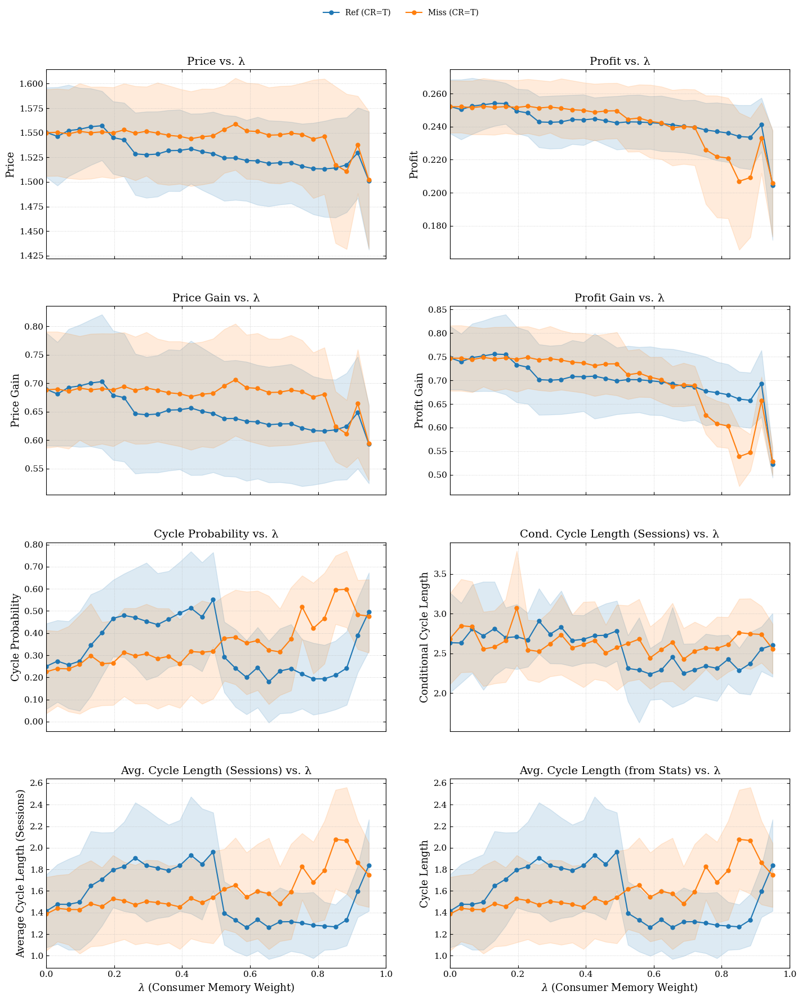

In [26]:
import os
import pandas as pd
import numpy as np
from glob import glob
import types # For isinstance check

# --- Modified load_lambda_metric ---
def load_lambda_metric(experiment_dir_parent, metric_name_display):
    """
    Loads data for a specific metric, parsing lambda values from subdirectory names,
    and aggregates the metric across different gamma values for each lambda.
    Handles new cycle metrics from session_summaries.csv.
    """
    pattern_sub_dirs = "gamma_*_lambda_*"
    run_dirs = glob(os.path.join(experiment_dir_parent, pattern_sub_dirs))

    lambda_values_all, metric_values_all = [], []

    if not run_dirs:
        # print(f"Warning: No run sub-dirs in {experiment_dir_parent}")
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)

    for run_dir_path in run_dirs:
        base_name = os.path.basename(run_dir_path)
        current_lambda = np.nan
        try:
            lambda_str = base_name.split('_lambda_')[1].split('_')[0]
            current_lambda = float(lambda_str)
        except (IndexError, ValueError):
            # print(f"Could not parse lambda from {base_name}")
            continue

        metric_val = np.nan
        if metric_name_display in ["Cycle Probability", "Conditional Cycle Length", "Average Cycle Length (Sessions)"]:
            # "Average Cycle Length (Sessions)" to distinguish from "Cycle Length" from stats
            session_summary_file = os.path.join(run_dir_path, "session_summaries.csv")
            if not os.path.exists(session_summary_file): continue
            try:
                df_sessions = pd.read_csv(session_summary_file, on_bad_lines='skip')
                if df_sessions.empty or 'cycle_length' not in df_sessions.columns: continue
                df_sessions['cycle_length'] = pd.to_numeric(df_sessions['cycle_length'], errors='coerce').dropna()
                if df_sessions.empty: continue

                if metric_name_display == "Cycle Probability":
                    metric_val = (df_sessions['cycle_length'] > 1).sum() / len(df_sessions) if len(df_sessions) > 0 else 0.0
                elif metric_name_display == "Conditional Cycle Length":
                    cycles_df = df_sessions[df_sessions['cycle_length'] > 1]
                    metric_val = cycles_df['cycle_length'].mean() if not cycles_df.empty else np.nan
                elif metric_name_display == "Average Cycle Length (Sessions)":
                    metric_val = df_sessions['cycle_length'].mean()
            except Exception as e: print(f"Err session_sum {run_dir_path} for {metric_name_display} vs Lambda: {e}"); metric_val = np.nan
        
        elif metric_name_display == "Cycle Length": # From cycle_statistics.csv
            stats_file = os.path.join(run_dir_path, "cycle_statistics.csv")
            if not os.path.exists(stats_file): continue
            try:
                df_stats = pd.read_csv(stats_file, on_bad_lines='skip')
                if not df_stats.empty and "mean_cycle_length" in df_stats.columns:
                    metric_val = float(df_stats["mean_cycle_length"].iloc[0])
            except Exception as e: print(f"Err cycle_stats {run_dir_path} for Cycle Length vs Lambda: {e}"); metric_val = np.nan
        
        # Add other existing metric loading from cycle_statistics.csv here (Price, Profit, etc.)
        else: # For Price, Profit, Price Gain, Profit Gain
            stats_file = os.path.join(run_dir_path, "cycle_statistics.csv")
            if not os.path.exists(stats_file): continue
            try:
                df_stats = pd.read_csv(stats_file, on_bad_lines='skip')
                if not df_stats.empty:
                    key = metric_name_display.lower().replace(" ", "_")
                    cols = [c for c in df_stats.columns if c.startswith(f"mean_{key}_p")]
                    if cols:
                        numeric_data = df_stats[cols].apply(pd.to_numeric, errors='coerce')
                        if not numeric_data.empty and not numeric_data.isnull().all().all():
                            metric_val = numeric_data.mean(axis=1).iloc[0]
            except Exception as e: print(f"Err cycle_stats {run_dir_path} for {metric_name_display} vs Lambda: {e}"); metric_val = np.nan


        if pd.notna(metric_val) and isinstance(metric_val, (int, float, np.number)):
            lambda_values_all.append(current_lambda)
            metric_values_all.append(float(metric_val))

    if not lambda_values_all:
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)

    df_collected = pd.DataFrame({"lambda": lambda_values_all, "value": metric_values_all})
    
    # Robust std calculation
    grouped_temp = df_collected.groupby('lambda')['value']
    mean_agg = grouped_temp.mean()
    std_agg = grouped_temp.std()
    # For groups with a single observation, std() is NaN. We'll replace these with 0.
    # For groups with no observations (shouldn't happen if lambda_values_all is not empty and values are not all NaN),
    # mean/std might be NaN.
    
    grouped_data = pd.DataFrame({'mean': mean_agg, 'std': std_agg}).reset_index()
    grouped_data['std'].fillna(0, inplace=True)
    grouped_data.sort_values(by="lambda", inplace=True)

    return grouped_data["lambda"].values, grouped_data["mean"].values, grouped_data["std"].values

# --- Plotting Script (incorporating new metrics) ---
# (Keep plt.rcParams, scenario_styles, out_dir, exp_dirs, etc. from previous full code block)
# --- Assume `exp_dirs` and color definitions are set up as before ---
# Example:
out_dir = "./Figures_Lambda_Plots_with_New_Cycle" # New output folder
os.makedirs(out_dir, exist_ok=True)

folder_location = "../Results_sockeye/experiments"
base_exp_name = "final_results/gamma_lambda"
# IMPORTANT: Define QLR base name if you plot QLR data vs Lambda
# base_qlr_exp_name = "final_results/gamma_lambda_qlr" 

exp_dirs = {
    ('reference', True): os.path.join(folder_location, f"{base_exp_name}_reference_True"),
    ('reference', False): os.path.join(folder_location, f"{base_exp_name}_reference_False"),
    ('misspecification', True): os.path.join(folder_location, f"{base_exp_name}_misspecification_True"),
    ('misspecification', False): os.path.join(folder_location, f"{base_exp_name}_misspecification_False"),
    # ('qlr_reference', True): os.path.join(folder_location, f"{base_qlr_exp_name}_only_qlr_reference_True"),
}

# --- Scenario Styles (can reuse from gamma plot if scenario keys are the same) ---
def adjust_color_brightness(color_name, factor):
    try: c = mcolors.to_rgb(color_name); c_hsv = mcolors.rgb_to_hsv(c); c_hsv[2] = np.clip(c_hsv[2] * factor, 0, 1); return mcolors.hsv_to_rgb(c_hsv)
    except ValueError: return color_name

scenario_styles = {
    ('reference', True): {'color': 'tab:blue', 'marker': 'o', 'label': "Ref (CR=T)"},
    # ('reference', False): {'color': adjust_color_brightness('tab:blue', 1.3), 'marker': 's', 'label': "Ref (CR=F)"},
    ('misspecification', True): {'color': 'tab:orange', 'marker': 'o', 'label': "Miss (CR=T)"},
    # ('misspecification', False): {'color': adjust_color_brightness('tab:orange', 1.3), 'marker': 's', 'label': "Miss (CR=F)"},
    # ('qlr_reference', True): {'color': 'tab:green', 'marker': 'D', 'label': "QLR (CR=T)"},
}


# --- Plotting Setup ---
plt.rcParams.update({
    'font.size': 12, 'axes.titlesize': 14, 'axes.labelsize': 13,
    'xtick.labelsize': 11, 'ytick.labelsize': 11, 'legend.fontsize': 10,
    'figure.titlesize': 16, 'font.family': 'serif', 'mathtext.fontset': 'dejavuserif',
})

# UPDATED: metrics_to_plot including new cycle metrics
metrics_to_plot = [
    "Price", "Profit", "Price Gain", "Profit Gain", 
    "Cycle Probability", "Conditional Cycle Length", "Average Cycle Length (Sessions)",
    "Cycle Length" # This is the one from cycle_statistics.csv
]

metrics_display_config = {
    "Price": "Price vs. λ", "Profit": "Profit vs. λ",
    "Price Gain": "Price Gain vs. λ", "Profit Gain": "Profit Gain vs. λ",
    "Cycle Length": "Avg. Cycle Length (from Stats) vs. λ", # Distinguish from session summary one
    "Average Cycle Length (Sessions)": "Avg. Cycle Length (Sessions) vs. λ",
    "Cycle Probability": "Cycle Probability vs. λ",
    "Conditional Cycle Length": "Cond. Cycle Length (Sessions) vs. λ",
}

# Determine layout (e.g., 4x2 for 7-8 plots)
num_metrics = len(metrics_to_plot)
n_cols_fig = 2
n_rows_fig = (num_metrics + n_cols_fig - 1) // n_cols_fig
fig_lambda, axes_lambda = plt.subplots(n_rows_fig, n_cols_fig, figsize=(15, 5 * n_rows_fig), sharex=True)
axes_lambda_flat = axes_lambda.flatten()

plot_handles_for_legend_lambda = []
plot_labels_for_legend_lambda = []
legend_elements_collected_lambda = False

# Define which scenarios to plot for this figure
scenarios_to_plot_vs_lambda = [
    ('reference', True), ('reference', False),
    ('misspecification', True), ('misspecification', False),
    # Add QLR keys here if data is available and exp_dirs are set up
]

for idx, metric_name_display in enumerate(metrics_to_plot):
    if idx >= len(axes_lambda_flat): break
    ax = axes_lambda_flat[idx]
    
    human_readable_title = metrics_display_config.get(metric_name_display, metric_name_display + " vs. λ")
    ax.set_title(human_readable_title, fontsize=plt.rcParams['axes.titlesize'])
    first_lambda_series_for_xlim = None

    for scenario_key in scenarios_to_plot_vs_lambda:
        if scenario_key not in scenario_styles or scenario_key not in exp_dirs:
            # print(f"Skipping scenario {scenario_key} for lambda plot: not in styles or exp_dirs.")
            continue
        
        style_config = scenario_styles[scenario_key]
        scenario_parent_dir = exp_dirs[scenario_key]
        if not scenario_parent_dir or not os.path.isdir(scenario_parent_dir):
            print(f"Path for key {scenario_key} is invalid: {scenario_parent_dir}"); continue
            
        # Load data: lambda_values, mean_values (over gammas), std_dev_values (over gammas)
        λ_agg, μ_agg, σ_agg = load_lambda_metric(scenario_parent_dir, metric_name_display)
        
        if λ_agg is None or λ_agg.size == 0:
            # print(f"No lambda data loaded for {style_config['label']}, metric {metric_name_display}")
            continue
        
        if first_lambda_series_for_xlim is None and λ_agg.size > 0:
            first_lambda_series_for_xlim = λ_agg

        ln, = ax.plot(λ_agg, μ_agg, color=style_config['color'], linestyle='-',
                        marker=style_config['marker'], linewidth=1.5, markersize=5, 
                        label=style_config['label'], markevery=1) # markevery=1 for lambda usually okay
        ax.fill_between(λ_agg, μ_agg - σ_agg, μ_agg + σ_agg, 
                        color=style_config['color'], alpha=0.18 if not scenario_key[1] else 0.15) # CR=F slightly more transparent

        if not legend_elements_collected_lambda:
            plot_handles_for_legend_lambda.append(ln)
            plot_labels_for_legend_lambda.append(style_config['label'])

    if not legend_elements_collected_lambda and plot_handles_for_legend_lambda:
        legend_elements_collected_lambda = True

    ax.grid(True, linestyle=':', linewidth=0.7, alpha=0.6)
    ax.set_ylabel(metric_name_display, fontsize=plt.rcParams['axes.labelsize'])
    ax.tick_params(direction='in', top=True, right=True)

    if "Gain" in metric_name_display or "Probability" in metric_name_display:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))
        if "Probability" in metric_name_display: ax.set_ylim(bottom=max(-0.05, ax.get_ylim()[0]), top=min(1.05, ax.get_ylim()[1]))
    elif "Cycle Length" in metric_name_display:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))
        ax.set_ylim(bottom=max(0.5, ax.get_ylim()[0]))
    else: ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.3f'))

    if idx >= (n_rows_fig - 1) * n_cols_fig : # If in the last row of subplots
         ax.set_xlabel(r"$\lambda$ (Consumer Memory Weight)", fontsize=plt.rcParams['axes.labelsize'])

    if first_lambda_series_for_xlim is not None and first_lambda_series_for_xlim.size > 0:
         ax.set_xlim(left=max(0, first_lambda_series_for_xlim.min()-0.05), # Ensure xlim starts near 0
                     right=min(1, first_lambda_series_for_xlim.max()+0.05)) # Ensure xlim ends near 1
         if len(np.unique(first_lambda_series_for_xlim)) <= 12: # If not too many unique lambda values
             ax.set_xticks(np.unique(first_lambda_series_for_xlim))
    else: ax.set_xlim(-0.05, 1.05) # Default lambda range

# Handle unused axes
if num_metrics < len(axes_lambda_flat):
    for i_ax_lambda in range(num_metrics, len(axes_lambda_flat)):
        fig_lambda.delaxes(axes_lambda_flat[i_ax_lambda])

# --- Suptitle, Shared Legend & Layout ---
# fig_lambda.suptitle("Market Outcomes vs. Consumer Memory Weight (λ)\n(Averaged over γ values)",
#                    y=0.99, fontsize=plt.rcParams['figure.titlesize'])

if plot_handles_for_legend_lambda:
    num_lg_items = len(plot_handles_for_legend_lambda)
    ncol_lg = 2 if num_lg_items > 2 else num_lg_items # Max 2 columns for legend usually looks good
    if num_lg_items > 4: ncol_lg = 2 # If many items, force 2 columns
    
    fig_lambda.legend(plot_handles_for_legend_lambda, plot_labels_for_legend_lambda,
                     loc='upper center', bbox_to_anchor=(0.5, 0.93),
                     ncol=ncol_lg, frameon=False, handlelength=2.0, labelspacing=0.4)
    rect_top_val = 0.86 if num_lg_items > (ncol_lg) else 0.89 # More space if legend has >1 row
else: rect_top_val = 0.92

fig_lambda.tight_layout(rect=[0.02, 0.04, 0.98, rect_top_val], h_pad=3.5, w_pad=2.5)

lambda_fig_fname = "lambda_effects_all_metrics.png"
fig_lambda.savefig(os.path.join(out_dir, lambda_fig_fname), dpi=300, bbox_inches='tight')
print(f"Lambda effects figure saved to {os.path.join(out_dir, lambda_fig_fname)}")
plt.show()

/var/folders/xc/z0h2gmnn7gs78ryc5jz6h_mw0000gn/T/ipykernel_68817/544834044.py:52: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  grouped_data = pd.DataFrame({'mean': mean_agg, 'std': std_agg}).reset_index(); grouped_data['std'].fillna(0, inplace=True); grouped_data.sort_values(by="lambda", inplace=True)
/var/folders/xc/z0h2gmnn7gs78ryc5jz6h_mw0000gn/T/ipykernel_68817/544834044.py:52: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior wil

NameError: name 'qlr_scenario_for_average' is not defined

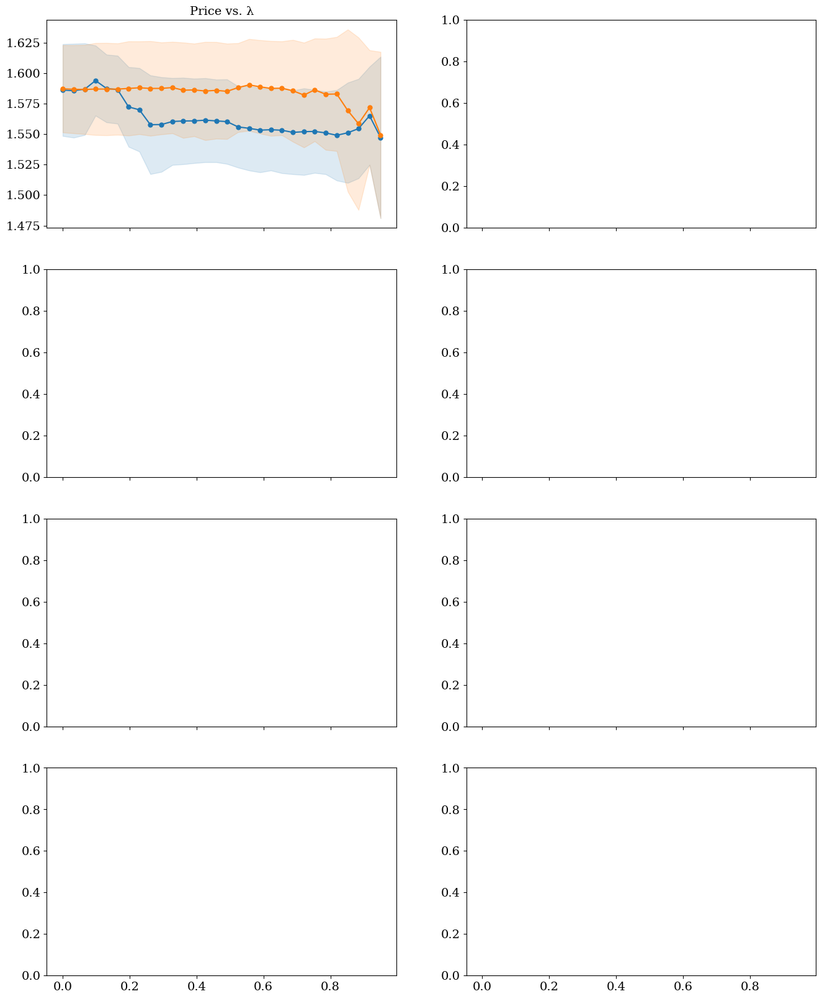

In [3]:
import os
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.colors as mcolors # For color adjustments if needed
import pandas as pd
import numpy as np
from glob import glob
import types # For isinstance check

# --- load_lambda_metric (from your previous code, for lambda-varying data) ---
def load_lambda_metric(experiment_dir_parent, metric_name_display):
    pattern_sub_dirs = "gamma_*_lambda_*"
    run_dirs = glob(os.path.join(experiment_dir_parent, pattern_sub_dirs))
    lambda_values_all, metric_values_all = [], []
    if not run_dirs: return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)
    for run_dir_path in run_dirs:
        base_name = os.path.basename(run_dir_path)
        current_lambda = np.nan
        try: lambda_str = base_name.split('_lambda_')[1].split('_')[0]; current_lambda = float(lambda_str)
        except (IndexError, ValueError): continue
        metric_val = np.nan
        if metric_name_display in ["Cycle Probability", "Conditional Cycle Length", "Average Cycle Length (Sessions)"]:
            session_summary_file = os.path.join(run_dir_path, "session_summaries.csv")
            if not os.path.exists(session_summary_file): continue
            try:
                df_sessions = pd.read_csv(session_summary_file, on_bad_lines='skip')
                if df_sessions.empty or 'cycle_length' not in df_sessions.columns: continue
                df_sessions['cycle_length'] = pd.to_numeric(df_sessions['cycle_length'], errors='coerce').dropna()
                if df_sessions.empty: continue
                if metric_name_display == "Cycle Probability": metric_val = (df_sessions['cycle_length'] > 1).sum() / len(df_sessions) if len(df_sessions) > 0 else 0.0
                elif metric_name_display == "Conditional Cycle Length": cycles_df = df_sessions[df_sessions['cycle_length'] > 1]; metric_val = cycles_df['cycle_length'].mean() if not cycles_df.empty else np.nan
                elif metric_name_display == "Average Cycle Length (Sessions)": metric_val = df_sessions['cycle_length'].mean()
            except Exception: metric_val = np.nan
        elif metric_name_display == "Cycle Length":
            stats_file = os.path.join(run_dir_path, "cycle_statistics.csv")
            if not os.path.exists(stats_file): continue
            try: df_stats = pd.read_csv(stats_file, on_bad_lines='skip'); metric_val = float(df_stats["mean_cycle_length"].iloc[0]) if not df_stats.empty and "mean_cycle_length" in df_stats.columns else np.nan
            except Exception: metric_val = np.nan
        else:
            stats_file = os.path.join(run_dir_path, "cycle_statistics.csv")
            if not os.path.exists(stats_file): continue
            try:
                df_stats = pd.read_csv(stats_file, on_bad_lines='skip')
                if not df_stats.empty:
                    key = metric_name_display.lower().replace(" ", "_"); cols = [c for c in df_stats.columns if c.startswith(f"mean_{key}_p")]
                    if cols: numeric_data = df_stats[cols].apply(pd.to_numeric, errors='coerce'); metric_val = numeric_data.mean(axis=1).iloc[0] if not numeric_data.empty and not numeric_data.isnull().all().all() else np.nan
            except Exception: metric_val = np.nan
        if pd.notna(metric_val) and isinstance(metric_val, (int, float, np.number)): lambda_values_all.append(current_lambda); metric_values_all.append(float(metric_val))
    if not lambda_values_all: return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)
    df_collected = pd.DataFrame({"lambda": lambda_values_all, "value": metric_values_all})
    grouped_temp = df_collected.groupby('lambda')['value']; mean_agg = grouped_temp.mean(); std_agg = grouped_temp.std()
    grouped_data = pd.DataFrame({'mean': mean_agg, 'std': std_agg}).reset_index(); grouped_data['std'].fillna(0, inplace=True); grouped_data.sort_values(by="lambda", inplace=True)
    return grouped_data["lambda"].values, grouped_data["mean"].values, grouped_data["std"].values

# --- load_gamma_only_metric (from your code, for QLR gamma-specific runs) ---
def load_gamma_only_metric(gamma_run_dir, metric_name_display):
    base_gamma_dir_name = os.path.basename(gamma_run_dir)
    current_gamma = np.nan
    try: current_gamma = float(base_gamma_dir_name.split("gamma_")[1])
    except (IndexError, ValueError): return None, np.nan, np.nan
    mean_val, std_val = np.nan, 0.0
    if metric_name_display in ["Cycle Probability", "Conditional Cycle Length", "Average Cycle Length (Sessions)"]:
        session_summary_file = os.path.join(gamma_run_dir, "session_summaries.csv")
        if not os.path.exists(session_summary_file): return current_gamma, np.nan, std_val
        try:
            df_sessions = pd.read_csv(session_summary_file, on_bad_lines='skip')
            if df_sessions.empty or 'cycle_length' not in df_sessions.columns: return current_gamma, np.nan, std_val
            df_sessions['cycle_length'] = pd.to_numeric(df_sessions['cycle_length'], errors='coerce').dropna()
            if df_sessions.empty: return current_gamma, np.nan, std_val
            if metric_name_display == "Cycle Probability": mean_val = (df_sessions['cycle_length'] > 1).sum() / len(df_sessions) if len(df_sessions) > 0 else 0.0
            elif metric_name_display == "Conditional Cycle Length": cycles_df = df_sessions[df_sessions['cycle_length'] > 1]; mean_val = cycles_df['cycle_length'].mean() if not cycles_df.empty else np.nan; std_val = cycles_df['cycle_length'].std() if not cycles_df.empty and len(cycles_df['cycle_length'].dropna()) > 1 else 0.0
            elif metric_name_display == "Average Cycle Length (Sessions)": mean_val = df_sessions['cycle_length'].mean(); std_val = df_sessions['cycle_length'].std() if len(df_sessions['cycle_length'].dropna()) > 1 else 0.0
            if pd.isna(std_val): std_val = 0.0
        except Exception as e: print(f"QLR Err ss {gamma_run_dir} for {metric_name_display}: {e}"); return current_gamma, np.nan, 0.0
    else:
        stats_file = os.path.join(gamma_run_dir, "cycle_statistics.csv")
        if not os.path.exists(stats_file): return current_gamma, np.nan, std_val
        try:
            df_stats = pd.read_csv(stats_file, on_bad_lines='skip')
            if not df_stats.empty:
                internal_metric_name = metric_name_display.lower().replace(" ", "_")
                mean_col_prefix = f'mean_{internal_metric_name}_p'; std_col_prefix = f'std_{internal_metric_name}_p'
                if metric_name_display == "Cycle Length": mean_col_prefix = 'mean_cycle_length'; std_col_prefix = 'std_cycle_length'
                mean_cols = [c for c in df_stats.columns if c.startswith(mean_col_prefix)]; std_cols  = [c for c in df_stats.columns if c.startswith(std_col_prefix)]
                if mean_cols:
                    numeric_mean_data = df_stats[mean_cols].apply(pd.to_numeric, errors='coerce')
                    if not numeric_mean_data.empty and not numeric_mean_data.isnull().all().all(): mean_val = numeric_mean_data.mean(axis=1).iloc[0]
                    if std_cols:
                        numeric_std_data = df_stats[std_cols].apply(pd.to_numeric, errors='coerce')
                        if not numeric_std_data.empty and not numeric_std_data.isnull().all().all(): std_val = numeric_std_data.mean(axis=1).iloc[0]
        except Exception as e: print(f"QLR Err cs {gamma_run_dir} for {metric_name_display}: {e}"); return current_gamma, np.nan, 0.0
    return current_gamma, mean_val, std_val if pd.notna(std_val) else 0.0

# --- NEW Function to load QLR average over gammas ---
def load_qlr_average_metric(qlr_experiment_parent_dir, metric_name_display):
    """
    Calculates the average value of a metric for a QLR scenario,
    averaged across all its gamma sub-directories.
    """
    gamma_specific_dirs = glob(os.path.join(qlr_experiment_parent_dir, "gamma_*"))
    if not gamma_specific_dirs:
        print(f"Warning: No gamma-specific subdirectories found in QLR path: {qlr_experiment_parent_dir}")
        return np.nan # Return NaN if no gamma runs found

    metric_values_for_qlr_scenario = []
    for gamma_dir in gamma_specific_dirs:
        # We only need the mean value from each gamma run for the overall average
        _, mean_val_for_gamma, _ = load_gamma_only_metric(gamma_dir, metric_name_display)
        if pd.notna(mean_val_for_gamma):
            metric_values_for_qlr_scenario.append(mean_val_for_gamma)
    
    if not metric_values_for_qlr_scenario:
        # print(f"No valid metric values found for QLR scenario {qlr_experiment_parent_dir} for metric {metric_name_display}")
        return np.nan
        
    return np.mean(metric_values_for_qlr_scenario)


# --- Configuration ---
out_dir = "./Figures_Lambda_Plots_with_QLR_Avg"
os.makedirs(out_dir, exist_ok=True)

folder_location = "../Results/experiments"
base_exp_name = "noloss/gamma_lambda"
base_qlr_exp_name = "final_gamma_only_no_loss_aversion/gamma" # Ensure this is correct for QLR parent

exp_dirs = {
    ('reference', True): os.path.join(folder_location, f"{base_exp_name}_reference_True"),
    ('reference', False): os.path.join(folder_location, f"{base_exp_name}_reference_False"),
    ('misspecification', True): os.path.join(folder_location, f"{base_exp_name}_misspecification_True"),
    ('misspecification', False): os.path.join(folder_location, f"{base_exp_name}_misspecification_False"),
    # QLR experiment parent directory
    ('qlr_reference', True): os.path.join(folder_location, f"{base_qlr_exp_name}_only_reference_True"),
}

# --- Scenario Styles ---
def adjust_color_brightness(color_name, factor): # Keep this helper
    try: c = mcolors.to_rgb(color_name); c_hsv = mcolors.rgb_to_hsv(c); c_hsv[2] = np.clip(c_hsv[2] * factor, 0, 1); return mcolors.hsv_to_rgb(c_hsv)
    except ValueError: return color_name

scenario_styles = { # Using shorter labels for legend
    ('reference', True): {'color': 'tab:blue', 'marker': 'o', 'label': "Reference Aware(Exp Smooth Ref)"},
    #('reference', False): {'color': adjust_color_brightness('tab:blue', 1.3), 'marker': 's', 'label': "Ref (CR=F)"},
    ('misspecification', True): {'color': 'tab:orange', 'marker': 'o', 'label': "Reference Naive(Exp Smooth Ref)"},
    #('misspecification', False): {'color': adjust_color_brightness('tab:orange', 1.3), 'marker': 's', 'label': "Miss (CR=F)"},
    #('qlr_reference', True): {'color': 'tab:green', 'marker': '', 'linestyle': '--', 'label': "Reference Aware(QLearning Ref)"}, # No marker for hline, dashed
}

# --- Plotting Setup ---
plt.rcParams.update({
    'font.size': 14, 'axes.titlesize': 14, 'axes.labelsize': 14,
    'xtick.labelsize': 14, 'ytick.labelsize': 14, 'legend.fontsize': 15,
    'figure.titlesize': 16, 'font.family': 'serif', 'mathtext.fontset': 'dejavuserif',
})

metrics_to_plot = [
    "Price", "Profit", "Price Gain", "Profit Gain", 
    "Cycle Probability", "Conditional Cycle Length", "Average Cycle Length (Sessions)",
    "Cycle Length" # From cycle_statistics.csv
]
metrics_display_config = { # Keep your display config
    "Price": "Price vs. λ", "Profit": "Profit vs. λ",
    "Price Gain": "Price Gain vs. λ", "Profit Gain": "Profit Gain vs. λ",
    "Cycle Length": "Avg. Cycle Length (Stats) vs. λ",
    "Average Cycle Length (Sessions)": "Avg. Cycle Length (Sessions) vs. λ",
    "Cycle Probability": "Cycle Probability vs. λ",
    "Conditional Cycle Length": "Cond. Cycle Length (Sess.) vs. λ"
}


num_metrics = len(metrics_to_plot)
n_cols_fig = 2; n_rows_fig = (num_metrics + n_cols_fig - 1) // n_cols_fig
fig_lambda, axes_lambda = plt.subplots(n_rows_fig, n_cols_fig, figsize=(16, 5 * n_rows_fig), sharex=True) # Wider for legend
axes_lambda_flat = axes_lambda.flatten()

plot_handles_for_legend_lambda, plot_labels_for_legend_lambda = [], []
legend_elements_collected_lambda = False

# Define which lambda-varying scenarios to plot
scenarios_to_plot_lines = [
    ('reference', True), ('reference', False),
    ('misspecification', True), ('misspecification', False),
]
# Define which QLR scenario to plot as horizontal line
#qlr_scenario_for_average = ('qlr_reference', True) # Change if needed

for idx, metric_name_display in enumerate(metrics_to_plot):
    if idx >= len(axes_lambda_flat): break
    ax = axes_lambda_flat[idx]
    human_readable_title = metrics_display_config.get(metric_name_display, metric_name_display + " vs. λ")
    ax.set_title(human_readable_title, fontsize=plt.rcParams['axes.titlesize'])
    first_lambda_series_for_xlim = None

    # Plot lambda-varying lines
    for scenario_key in scenarios_to_plot_lines:
        # ... (existing loop to plot lambda-varying lines using load_lambda_metric) ...
        if scenario_key not in scenario_styles or scenario_key not in exp_dirs: continue
        style_config = scenario_styles[scenario_key]; scenario_parent_dir = exp_dirs[scenario_key]
        if not scenario_parent_dir or not os.path.isdir(scenario_parent_dir): print(f"Path invalid: {scenario_parent_dir}"); continue
        λ_agg, μ_agg, σ_agg = load_lambda_metric(scenario_parent_dir, metric_name_display)
        if λ_agg.size == 0: continue
        if first_lambda_series_for_xlim is None: first_lambda_series_for_xlim = λ_agg
        ln, = ax.plot(λ_agg, μ_agg, color=style_config['color'], linestyle='-', marker=style_config['marker'], 
                        linewidth=1.5, markersize=5, label=style_config['label'], markevery=1)
        ax.fill_between(λ_agg, μ_agg - σ_agg, μ_agg + σ_agg, color=style_config['color'], 
                        alpha=0.18 if not scenario_key[1] else 0.15) # CR=F more transparent fill
        if not legend_elements_collected_lambda:
            plot_handles_for_legend_lambda.append(ln); plot_labels_for_legend_lambda.append(style_config['label'])

    # Plot QLR average line
    if qlr_scenario_for_average in exp_dirs and qlr_scenario_for_average in scenario_styles:
        qlr_parent_dir = exp_dirs[qlr_scenario_for_average]
        if qlr_parent_dir and os.path.isdir(qlr_parent_dir):
            qlr_avg_val = load_qlr_average_metric(qlr_parent_dir, metric_name_display)
            if pd.notna(qlr_avg_val):
                qlr_style = scenario_styles[qlr_scenario_for_average]
                # Use ax.get_xlim() to draw line across current x-axis range if data was plotted
                current_xlim = ax.get_xlim() if first_lambda_series_for_xlim is not None else (-0.05, 1.05)
                
                # Create a proxy artist for the legend if axhline itself doesn't return a suitable handle
                # Or, plot a dummy invisible point with the QLR style for the legend handle
                # Here, we'll just use axhline and try to grab its handle for the legend
                hline = ax.axhline(y=qlr_avg_val, color=qlr_style['color'], linestyle=qlr_style['linestyle'], 
                                   linewidth=2, label=qlr_style['label']) # Added label here
                if not legend_elements_collected_lambda: # Add QLR line to legend only once
                    plot_handles_for_legend_lambda.append(hline) # axhline returns a Line2D
                    plot_labels_for_legend_lambda.append(qlr_style['label'])
            else:
                print(f"Could not calculate QLR average for {metric_name_display}")
        else:
            print(f"QLR path invalid or not defined: {qlr_parent_dir}")


    if not legend_elements_collected_lambda and plot_handles_for_legend_lambda:
        legend_elements_collected_lambda = True

    # Axis cosmetics (same as before)
    ax.grid(True, linestyle=':', linewidth=0.7, alpha=0.6)
    ax.set_ylabel(metric_name_display, fontsize=plt.rcParams['axes.labelsize'])
    ax.tick_params(direction='in', top=True, right=True)
    if "Gain" in metric_name_display or "Probability" in metric_name_display:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))
        if "Probability" in metric_name_display: ax.set_ylim(bottom=max(-0.05, ax.get_ylim()[0]), top=min(1.05, ax.get_ylim()[1]))
    elif "Cycle Length" in metric_name_display:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f')); ax.set_ylim(bottom=max(0.5, ax.get_ylim()[0]))
    else: ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.3f'))
    if idx >= (n_rows_fig - 1) * n_cols_fig or idx >= num_metrics - (num_metrics % n_cols_fig or n_cols_fig) :
         ax.set_xlabel(r"$\lambda$ (Consumer Memory Weight)", fontsize=plt.rcParams['axes.labelsize'])
    if first_lambda_series_for_xlim is not None and first_lambda_series_for_xlim.size > 0:
         ax.set_xlim(left=max(-0.05, first_lambda_series_for_xlim.min()-0.05),
                     right=min(1.05, first_lambda_series_for_xlim.max()+0.05))
         if len(np.unique(first_lambda_series_for_xlim)) <= 12: ax.set_xticks(np.unique(first_lambda_series_for_xlim))
    else: ax.set_xlim(-0.05, 1.05)

# Handle unused axes
if num_metrics < len(axes_lambda_flat):
    for i_ax_lambda in range(num_metrics, len(axes_lambda_flat)):
        fig_lambda.delaxes(axes_lambda_flat[i_ax_lambda])

# --- Suptitle, Shared Legend & Layout ---
# fig_lambda.suptitle("Market Outcomes vs. λ (Averaged over γ) with QLR Avg. Benchmark",
#                    y=0.995, fontsize=plt.rcParams['figure.titlesize']) # Adjusted suptitle y
if plot_handles_for_legend_lambda:
    num_lg_items = len(plot_handles_for_legend_lambda)
    ncol_lg = 3 if num_lg_items > 2 else (2 if num_lg_items > 3 else num_lg_items)
    bbox_y_lg = 0.91 if num_lg_items > ncol_lg else 0.93 # Adjust y based on legend rows
    fig_lambda.legend(plot_handles_for_legend_lambda, plot_labels_for_legend_lambda,
                     loc='upper center', bbox_to_anchor=(0.5, bbox_y_lg),
                     ncol=ncol_lg, frameon=False, handlelength=2.0, labelspacing=0.4, columnspacing=0.8)
    rect_top_val = 0.83 if num_lg_items > ncol_lg else 0.87
else: rect_top_val = 0.90
fig_lambda.tight_layout(rect=[0.02, 0.04, 0.98, rect_top_val], h_pad=3.5, w_pad=2.5)

lambda_fig_fname = "lambda_effects_all_metrics_with_qlr_avg.png"
fig_lambda.savefig(os.path.join(out_dir, lambda_fig_fname), dpi=300, bbox_inches='tight')
print(f"Lambda effects figure saved to {os.path.join(out_dir, lambda_fig_fname)}")
plt.show()

Lambda effects figure saved to ./Figures_Lambda_Plots_with_QLR_Avg/lambda_effects_all_metrics_with_qlr_avg.png


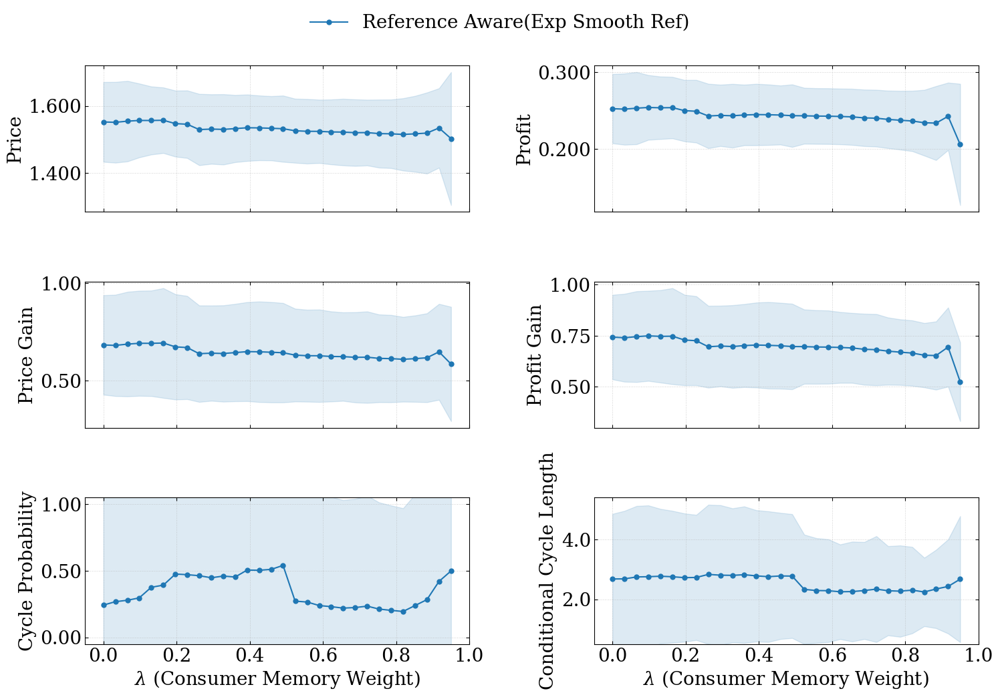

In [44]:
import os
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.colors as mcolors # For color adjustments if needed
import pandas as pd
import numpy as np
from glob import glob
import types # For isinstance check

from glob import glob
import os
import numpy as np
import pandas as pd

def _pick_run_metric_for_lambda(run_dir_path: str, metric_name_display: str):
    """
    For one run directory (a specific gamma/lambda combo), extract:
      - m: run mean
      - s: run std (sample std; Bernoulli for probabilities)
      - n: run sample size contributing to m,s
    Returns (m, s, n) or (np.nan, np.nan, None) if unavailable.
    """
    import os
    import numpy as np
    import pandas as pd

    # --- session_summaries.csv metrics ---
    if metric_name_display in ["Cycle Probability", "Conditional Cycle Length", "Average Cycle Length (Sessions)"]:
        session_summary_file = os.path.join(run_dir_path, "session_summaries.csv")
        if not os.path.exists(session_summary_file):
            return np.nan, np.nan, None

        try:
            df = pd.read_csv(session_summary_file, on_bad_lines='skip')
            if df.empty or 'cycle_length' not in df.columns:
                return np.nan, np.nan, None

            # Clean separately; do NOT assign dropna back to df
            x = pd.to_numeric(df['cycle_length'], errors='coerce')
            x = x[np.isfinite(x)]
            n_all = int(x.shape[0])
            if n_all == 0:
                return np.nan, np.nan, None

            if metric_name_display == "Cycle Probability":
                z = (x > 1).astype(float)
                n = int(z.shape[0])
                if n == 0:
                    return np.nan, np.nan, None
                p = float(z.mean())
                if n > 1:
                    # sample Bernoulli variance
                    s2 = p * (1 - p) * (n / (n - 1))
                    s = float(np.sqrt(max(s2, 0.0)))
                else:
                    s = np.nan  # with a single trial, std is not estimable; let pooling handle NaN
                return p, s, n

            elif metric_name_display == "Conditional Cycle Length":
                cyc = x[x > 1]
                n = int(cyc.shape[0])
                if n == 0:
                    return np.nan, np.nan, None
                m = float(cyc.mean())
                s = float(cyc.std(ddof=1)) if n > 1 else np.nan  # NaN if only one cycle
                return m, s, n

            elif metric_name_display == "Average Cycle Length (Sessions)":
                n = n_all
                m = float(x.mean())
                s = float(x.std(ddof=1)) if n > 1 else np.nan
                return m, s, n

        except Exception:
            return np.nan, np.nan, None

    # --- cycle_statistics.csv metrics ---
    stats_file = os.path.join(run_dir_path, "cycle_statistics.csv")
    if not os.path.exists(stats_file):
        return np.nan, np.nan, None

    try:
        df = pd.read_csv(stats_file, on_bad_lines='skip')
        if df.empty:
            return np.nan, np.nan, None

        if metric_name_display == "Cycle Length":
            m = float(df["mean_cycle_length"].iloc[0]) if "mean_cycle_length" in df.columns else np.nan
            s = float(df["std_cycle_length"].iloc[0]) if "std_cycle_length" in df.columns else np.nan
            n = int(df["n_cycle_length"].iloc[0]) if "n_cycle_length" in df.columns else None
            return (m if np.isfinite(m) else np.nan,
                    s if np.isfinite(s) else np.nan,
                    n)

        key = metric_name_display.lower().replace(" ", "_")
        mean_cols = [c for c in df.columns if c.startswith(f"mean_{key}_p")]
        std_cols  = [c for c in df.columns if c.startswith(f"std_{key}_p")]
        cnt_cols  = [c for c in df.columns if c.startswith(f"count_{key}_p") or c.startswith(f"n_{key}_p")]

        if not mean_cols:
            return np.nan, np.nan, None

        m = df[mean_cols].apply(pd.to_numeric, errors='coerce').mean(axis=1).iloc[0]
        s = df[std_cols].apply(pd.to_numeric, errors='coerce').mean(axis=1).iloc[0] if std_cols else np.nan
        if cnt_cols:
            n = int(df[cnt_cols].apply(pd.to_numeric, errors='coerce').sum(axis=1).iloc[0])
        else:
            n = None

        return (float(m) if np.isfinite(m) else np.nan,
                float(s) if np.isfinite(s) else np.nan,
                n)

    except Exception:
        return np.nan, np.nan, None


def load_lambda_metric(experiment_dir_parent, metric_name_display):
    """
    POOLED version:
      - For each λ, compute the UNWEIGHTED mean of run-means (keeps your curve unchanged).
      - Std is a pooled std across runs at that λ:
          uses unbiased pooled variance with counts if available,
          else falls back to within+between approximation.
    Returns: (lambdas, mean, std) as np.ndarrays sorted by λ.
    """
    pattern_sub_dirs = "gamma_*_lambda_*"
    run_dirs = glob(os.path.join(experiment_dir_parent, pattern_sub_dirs))

    if not run_dirs:
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)

    rows = []  # collect (lambda, m, s, n)
    for run_dir_path in run_dirs:
        base_name = os.path.basename(run_dir_path)
        try:
            lambda_str = base_name.split('_lambda_')[1].split('_')[0]
            lam = float(lambda_str)
        except (IndexError, ValueError):
            continue

        m, s, n = _pick_run_metric_for_lambda(run_dir_path, metric_name_display)
        if np.isfinite(m):
            rows.append({'lambda': lam,
                         'm': float(m),
                         's': float(s) if np.isfinite(s) else np.nan,
                         'n': int(n) if (n is not None and n > 0) else None})

    if not rows:
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)

    df_all = pd.DataFrame(rows)

    out = []
    for lam, gdf in df_all.groupby("lambda"):
        ms = gdf["m"].values
        ss = gdf["s"].values
        ns = gdf["n"].values  # may contain None

        # (A) mean: keep UNWEIGHTED average of run means (preserves your old mean curve)
        mbar = float(np.mean(ms))

        # weights for pooling variance: counts if available, else 1
        has_any_counts = np.any(pd.notna(ns))
        w = np.array([n if (n is not None and n > 0) else 1 for n in ns], dtype=float)

        if has_any_counts and np.all(np.isfinite(ss)):
            # unbiased pooled variance around UNWEIGHTED mbar
            num_within  = np.sum([(n-1)*(s**2) for n, s in zip(w, ss)])
            num_between = np.sum([n*((m - mbar)**2) for n, m in zip(w, ms)])
            denom = np.sum(w) - 1
            svar = (num_within + num_between) / denom if denom > 0 else 0.0
            sbar = float(np.sqrt(max(svar, 0.0)))
        else:
            # fallback: use only finite per-run stds in the within term
            finite = np.isfinite(ss)
            within  = float(np.mean(ss[finite]**2)) if np.any(finite) else 0.0
            between = float(np.var(ms, ddof=1)) if len(ms) > 1 else 0.0
            sbar = float(np.sqrt(max(within + between, 0.0)))

        out.append((lam, mbar, sbar))

    out.sort(key=lambda t: t[0])
    lambdas = np.array([t[0] for t in out], dtype=float)
    means   = np.array([t[1] for t in out], dtype=float)
    stds    = np.array([t[2] for t in out], dtype=float)
    return lambdas, means, stds


# --- load_gamma_only_metric (loads metric data for QLR gamma-specific runs) ---
def load_gamma_only_metric(gamma_run_dir, metric_name_display):
    """
    Loads a single metric value (mean and std) for a specific gamma run directory.
    Used for QLR average calculation.
    """
    base_gamma_dir_name = os.path.basename(gamma_run_dir)
    current_gamma = np.nan

    # Extract gamma value from directory name
    try:
        current_gamma = float(base_gamma_dir_name.split("gamma_")[1])
    except (IndexError, ValueError):
        return None, np.nan, np.nan # Skip if gamma cannot be extracted

    mean_val, std_val = np.nan, 0.0

    # Handle metrics derived from session_summaries.csv
    if metric_name_display in ["Cycle Probability", "Conditional Cycle Length", "Average Cycle Length (Sessions)"]:
        session_summary_file = os.path.join(gamma_run_dir, "session_summaries.csv")
        if not os.path.exists(session_summary_file):
            return current_gamma, np.nan, std_val

        try:
            df_sessions = pd.read_csv(session_summary_file, on_bad_lines='skip')
            if df_sessions.empty or 'cycle_length' not in df_sessions.columns:
                return current_gamma, np.nan, std_val

            df_sessions['cycle_length'] = pd.to_numeric(df_sessions['cycle_length'], errors='coerce').dropna()
            if df_sessions.empty:
                return current_gamma, np.nan, std_val

            if metric_name_display == "Cycle Probability":
                mean_val = (df_sessions['cycle_length'] > 1).sum() / len(df_sessions) if len(df_sessions) > 0 else 0.0
            elif metric_name_display == "Conditional Cycle Length":
                cycles_df = df_sessions[df_sessions['cycle_length'] > 1]
                mean_val = cycles_df['cycle_length'].mean() if not cycles_df.empty else np.nan
                std_val = cycles_df['cycle_length'].std() if not cycles_df.empty and len(cycles_df['cycle_length'].dropna()) > 1 else 0.0
            elif metric_name_display == "Average Cycle Length (Sessions)":
                mean_val = df_sessions['cycle_length'].mean()
                std_val = df_sessions['cycle_length'].std() if len(df_sessions['cycle_length'].dropna()) > 1 else 0.0

            if pd.isna(std_val):
                std_val = 0.0
        except Exception as e:
            print(f"QLR Err ss {gamma_run_dir} for {metric_name_display}: {e}")
            return current_gamma, np.nan, 0.0
    # Handle other metrics from cycle_statistics.csv
    else:
        stats_file = os.path.join(gamma_run_dir, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            return current_gamma, np.nan, std_val

        try:
            df_stats = pd.read_csv(stats_file, on_bad_lines='skip')
            if not df_stats.empty:
                internal_metric_name = metric_name_display.lower().replace(" ", "_")
                mean_col_prefix = f'mean_{internal_metric_name}_p'
                std_col_prefix = f'std_{internal_metric_name}_p'

                if metric_name_display == "Cycle Length":
                    mean_col_prefix = 'mean_cycle_length'
                    std_col_prefix = 'std_cycle_length'

                mean_cols = [c for c in df_stats.columns if c.startswith(mean_col_prefix)]
                std_cols  = [c for c in df_stats.columns if c.startswith(std_col_prefix)]

                if mean_cols:
                    numeric_mean_data = df_stats[mean_cols].apply(pd.to_numeric, errors='coerce')
                    if not numeric_mean_data.empty and not numeric_mean_data.isnull().all().all():
                        mean_val = numeric_mean_data.mean(axis=1).iloc[0]
                    if std_cols:
                        numeric_std_data = df_stats[std_cols].apply(pd.to_numeric, errors='coerce')
                        if not numeric_std_data.empty and not numeric_std_data.isnull().all().all():
                            std_val = numeric_std_data.mean(axis=1).iloc[0]
        except Exception as e:
            print(f"QLR Err cs {gamma_run_dir} for {metric_name_display}: {e}")
            return current_gamma, np.nan, 0.0

    return current_gamma, mean_val, std_val if pd.notna(std_val) else 0.0

# --- NEW Function to load QLR average over gammas ---
def load_qlr_average_metric(qlr_experiment_parent_dir, metric_name_display):
    """
    Calculates the average value of a metric for a QLR scenario,
    averaged across all its gamma sub-directories.
    """
    gamma_specific_dirs = glob(os.path.join(qlr_experiment_parent_dir, "gamma_*"))
    if not gamma_specific_dirs:
        print(f"Warning: No gamma-specific subdirectories found in QLR path: {qlr_experiment_parent_dir}")
        return np.nan # Return NaN if no gamma runs found

    metric_values_for_qlr_scenario = []
    for gamma_dir in gamma_specific_dirs:
        # We only need the mean value from each gamma run for the overall average
        _, mean_val_for_gamma, _ = load_gamma_only_metric(gamma_dir, metric_name_display)
        if pd.notna(mean_val_for_gamma):
            metric_values_for_qlr_scenario.append(mean_val_for_gamma)

    if not metric_values_for_qlr_scenario:
        # print(f"No valid metric values found for QLR scenario {qlr_experiment_parent_dir} for metric {metric_name_display}")
        return np.nan

    return np.mean(metric_values_for_qlr_scenario)


# --- Configuration ---
out_dir = "./Figures_Lambda_Plots_with_QLR_Avg"
os.makedirs(out_dir, exist_ok=True)

# Define the base directory for experiment results
folder_location = "../Results_sockeye/experiments"
base_exp_name = "recreating_results/gamma_lambda_high"
base_qlr_exp_name = "final_results/gamma" # Correct path for QLR parent directories

# Map scenario keys to their respective experiment directories
exp_dirs = {
    ('reference', True): os.path.join(folder_location, f"{base_exp_name}_reference_True"),
    ('reference', False): os.path.join(folder_location, f"{base_exp_name}_reference_False"),
    ('misspecification', True): os.path.join(folder_location, f"{base_exp_name}_misspecification_True"),
    ('misspecification', False): os.path.join(folder_location, f"{base_exp_name}_misspecification_False"),
    # QLR experiment parent directory
    ('qlr_reference', True): os.path.join(folder_location, f"{base_qlr_exp_name}_only_qlr_reference_True"),
}

# --- Scenario Styles ---
def adjust_color_brightness(color_name, factor):
    """Adjusts the brightness of a given color."""
    try:
        c = mcolors.to_rgb(color_name)
        c_hsv = mcolors.rgb_to_hsv(c)
        c_hsv[2] = np.clip(c_hsv[2] * factor, 0, 1) # Clip value to stay within [0, 1]
        return mcolors.hsv_to_rgb(c_hsv)
    except ValueError:
        return color_name # Return original color if conversion fails

# Define styles for each scenario for plotting and legend
scenario_styles = {
    ('reference', True): {'color': 'tab:blue', 'marker': 'o', 'label': "Reference Aware(Exp Smooth Ref)"},
    # ('reference', False): {'color': adjust_color_brightness('tab:blue', 1.3), 'marker': 's', 'label': "Ref (CR=F)"},
    #('misspecification', True): {'color': 'tab:orange', 'marker': 'o', 'label': "Reference-Naive(Exp Smooth Ref)"},
    # ('misspecification', False): {'color': adjust_color_brightness('tab:orange', 1.3), 'marker': 's', 'label': "Miss (CR=F)"},
    #('qlr_reference', True): {'color': 'tab:green', 'marker': '', 'linestyle': '--', 'label': "Reference Aware(QLR Pred)"}, # No marker for hline, dashed
}

# --- Plotting Setup ---
# Configure matplotlib aesthetics for consistent plot appearance
plt.rcParams.update({
    'font.size': 20,
    'axes.titlesize': 20,
    'axes.labelsize': 20,
    'xtick.labelsize': 20,
    'ytick.labelsize': 20,
    'legend.fontsize': 20,
    'figure.titlesize': 20,
    'font.family': 'serif',
    'mathtext.fontset': 'dejavuserif', # Ensures math text uses serif font
})

# List of metrics to be plotted
metrics_to_plot = [
    "Price", "Profit", "Price Gain", "Profit Gain",
    "Cycle Probability", "Conditional Cycle Length",
    #  "Average Cycle Length (Sessions)", "Cycle Length" # This metric is derived from cycle_statistics.csv
]

# Human-readable titles for each metric for plot titles
metrics_display_config = {
    "Price": r"Price vs. $\lambda$",
    "Profit": r"Profit vs. $\lambda$",
    "Price Gain": r"Price Gain vs. $\lambda$",
    "Profit Gain": r"Profit Gain vs. $\lambda$",
    #"Cycle Length": r"Avg. Cycle Length (Stats) vs. $\lambda$",
    #"Average Cycle Length (Sessions)": r"Avg. Cycle Length (Sessions) vs. $\lambda$",
    "Cycle Probability": r"Cycle Probability vs. $\lambda$",
    "Conditional Cycle Length": r"Cond. Cycle Length (Sess.) vs. $\lambda$"
}


num_metrics = len(metrics_to_plot)
n_cols_fig = 2
n_rows_fig = (num_metrics + n_cols_fig - 1) // n_cols_fig # Calculate rows needed

# Create subplots for each metric, sharing the x-axis
fig_lambda, axes_lambda = plt.subplots(n_rows_fig, n_cols_fig, figsize=(16, 4 * n_rows_fig), sharex=True)
axes_lambda_flat = axes_lambda.flatten() # Flatten for easier iteration

plot_handles_for_legend_lambda, plot_labels_for_legend_lambda = [], []
legend_elements_collected_lambda = False # Flag to collect legend handles only once

# Define which lambda-varying scenarios to plot as lines with confidence intervals
scenarios_to_plot_lines = [
    ('reference', True), # ('reference', False), - commented out as in original code
    ('misspecification', True), # ('misspecification', False), - commented out as in original code
]
# Define which QLR scenario to plot as a horizontal average line
qlr_scenario_for_average = ('qlr_reference', True)

# Iterate through each metric to create its subplot
for idx, metric_name_display in enumerate(metrics_to_plot):
    # Ensure we don't try to plot on non-existent axes if num_metrics is less than n_rows_fig * n_cols_fig
    if idx >= len(axes_lambda_flat):
        break

    ax = axes_lambda_flat[idx]
    # human_readable_title = metrics_display_config.get(metric_name_display, metric_name_display + r" vs. $\lambda$")
    # ax.set_title(human_readable_title, fontsize=plt.rcParams['axes.titlesize'])
    first_lambda_series_for_xlim = None # To store lambda values for x-axis limits

    # Plot lambda-varying lines for each defined scenario
    for scenario_key in scenarios_to_plot_lines:
        if scenario_key not in scenario_styles or scenario_key not in exp_dirs:
            continue # Skip if style or directory not defined

        style_config = scenario_styles[scenario_key]
        scenario_parent_dir = exp_dirs[scenario_key]

        if not scenario_parent_dir or not os.path.isdir(scenario_parent_dir):
            print(f"Path invalid: {scenario_parent_dir}")
            continue # Skip if directory does not exist

        # Load aggregated lambda data (lambda values, mean, std)
        λ_agg, μ_agg, σ_agg = load_lambda_metric(scenario_parent_dir, metric_name_display)

        if λ_agg.size == 0:
            continue # Skip if no data was loaded

        # Store first lambda series to define x-axis limits later
        if first_lambda_series_for_xlim is None:
            first_lambda_series_for_xlim = λ_agg

        # Plot the mean line
        ln, = ax.plot(λ_agg, μ_agg, color=style_config['color'], linestyle='-', marker=style_config['marker'],
                        linewidth=1.5, markersize=5, label=style_config['label'], markevery=1)

        # Plot the confidence interval (fill between mean - std and mean + std)
        # --- START OF CORRECTION FOR CONDITIONAL CYCLE LENGTH ---
        if metric_name_display == "Conditional Cycle Length":
            # For Conditional Cycle Length, ensure the lower bound of the fill is at least 2.0
            #lower_bound_fill = np.maximum(μ_agg - 1.96 * σ_agg, 2.0)
            ax.fill_between(λ_agg, μ_agg - 1.96 * σ_agg, μ_agg + 1.96 * σ_agg, color=style_config['color'],
                            alpha=0.18 if not scenario_key[1] else 0.15)
        else:
            # For all other metrics, plot the fill as calculated (mean +/- std)
            ax.fill_between(λ_agg, μ_agg - 1.96 * σ_agg, μ_agg + 1.96 * σ_agg, color=style_config['color'],
                            alpha=0.18 if not scenario_key[1] else 0.15)
        # --- END OF CORRECTION ---

        # Collect legend handles and labels only once from the first plotted scenario
        if not legend_elements_collected_lambda:
            plot_handles_for_legend_lambda.append(ln)
            plot_labels_for_legend_lambda.append(style_config['label'])

    # Plot QLR average line as a horizontal benchmark
    if qlr_scenario_for_average in exp_dirs and qlr_scenario_for_average in scenario_styles:
        qlr_parent_dir = exp_dirs[qlr_scenario_for_average]
        if qlr_parent_dir and os.path.isdir(qlr_parent_dir):
            qlr_avg_val = load_qlr_average_metric(qlr_parent_dir, metric_name_display)
            if pd.notna(qlr_avg_val):
                qlr_style = scenario_styles[qlr_scenario_for_average]
                # Draw horizontal line across the current x-axis range
                hline = ax.axhline(y=qlr_avg_val, color=qlr_style['color'], linestyle=qlr_style['linestyle'],
                                   linewidth=2, label=qlr_style['label']) # Added label for legend
                # Add QLR line to legend only once
                if not legend_elements_collected_lambda:
                    plot_handles_for_legend_lambda.append(hline)
                    plot_labels_for_legend_lambda.append(qlr_style['label'])
            else:
                print(f"Could not calculate QLR average for {metric_name_display}")
        else:
            print(f"QLR path invalid or not defined: {qlr_parent_dir}")


    # Set the flag after collecting legend elements for the first metric
    if not legend_elements_collected_lambda and plot_handles_for_legend_lambda:
        legend_elements_collected_lambda = True

    # --- Axis Cosmetics and Formatting ---
    ax.grid(True, linestyle=':', linewidth=0.7, alpha=0.6) # Add grid
    ax.set_ylabel(metric_name_display, fontsize=plt.rcParams['axes.labelsize'])
    ax.tick_params(direction='in', top=True, right=True) # Inward ticks on top and right

    # Specific y-axis formatting and limits based on metric type
    if "Gain" in metric_name_display or "Probability" in metric_name_display:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))
        if "Probability" in metric_name_display:
            ax.set_ylim(bottom=max(-0.05, ax.get_ylim()[0]), top=min(1.05, ax.get_ylim()[1]))
    elif "Cycle Length" in metric_name_display:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))
        # Ensure y-axis starts at 0.5 or higher for cycle lengths
        ax.set_ylim(bottom=max(0.5, ax.get_ylim()[0]))
    else:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.3f'))

    # Add x-axis label only to the bottom row plots
    if idx >= (n_rows_fig - 1) * n_cols_fig or idx >= num_metrics - (num_metrics % n_cols_fig or n_cols_fig) :
         ax.set_xlabel(r"$\lambda$ (Consumer Memory Weight)", fontsize=plt.rcParams['axes.labelsize'])

    # Set x-axis limits and ticks based on the actual lambda values
    if first_lambda_series_for_xlim is not None and first_lambda_series_for_xlim.size > 0:
         ax.set_xlim(left=max(-0.05, first_lambda_series_for_xlim.min()-0.05),
                     right=min(1.05, first_lambda_series_for_xlim.max()+0.05))
         # Set x-ticks for discrete lambda values if there are few unique points
         if len(np.unique(first_lambda_series_for_xlim)) <= 12:
             ax.set_xticks(np.unique(first_lambda_series_for_xlim))
    else:
        ax.set_xlim(-0.05, 1.05) # Default x-limits if no lambda data

# Handle unused axes (if num_metrics is not a multiple of n_cols_fig)
if num_metrics < len(axes_lambda_flat):
    for i_ax_lambda in range(num_metrics, len(axes_lambda_flat)):
        fig_lambda.delaxes(axes_lambda_flat[i_ax_lambda]) # Remove empty subplots

# --- Suptitle, Shared Legend & Layout ---
# fig_lambda.suptitle("Market Outcomes vs. λ (Averaged over γ) with QLR Avg. Benchmark",
#                    y=0.995, fontsize=plt.rcParams['figure.titlesize']) # Adjusted suptitle y

# Add a shared legend at the top of the figure
if plot_handles_for_legend_lambda:
    num_lg_items = len(plot_handles_for_legend_lambda)
    ncol_lg = 3 if num_lg_items > 2 else (2 if num_lg_items > 3 else num_lg_items) # Adjust legend columns dynamically
    bbox_y_lg = 0.91 if num_lg_items > ncol_lg else 0.93 # Adjust y position based on legend rows

    fig_lambda.legend(plot_handles_for_legend_lambda, plot_labels_for_legend_lambda,
                     loc='upper center', bbox_to_anchor=(0.5, bbox_y_lg),
                     ncol=ncol_lg, frameon=False, handlelength=2.0, labelspacing=0.4, columnspacing=0.8)
    rect_top_val = 0.83 if num_lg_items > ncol_lg else 0.87 # Adjust plot area top for legend
else:
    rect_top_val = 0.90 # Default if no legend

# Adjust layout to prevent labels/titles overlapping
fig_lambda.tight_layout(rect=[0.02, 0.04, 0.98, rect_top_val], h_pad=3.5, w_pad=2.5)

# Save the figure
lambda_fig_fname = "lambda_effects_all_metrics_with_qlr_avg.png"
fig_lambda.savefig(os.path.join(out_dir, lambda_fig_fname), dpi=300, bbox_inches='tight')
print(f"Lambda effects figure saved to {os.path.join(out_dir, lambda_fig_fname)}")
plt.show() # Display the plot


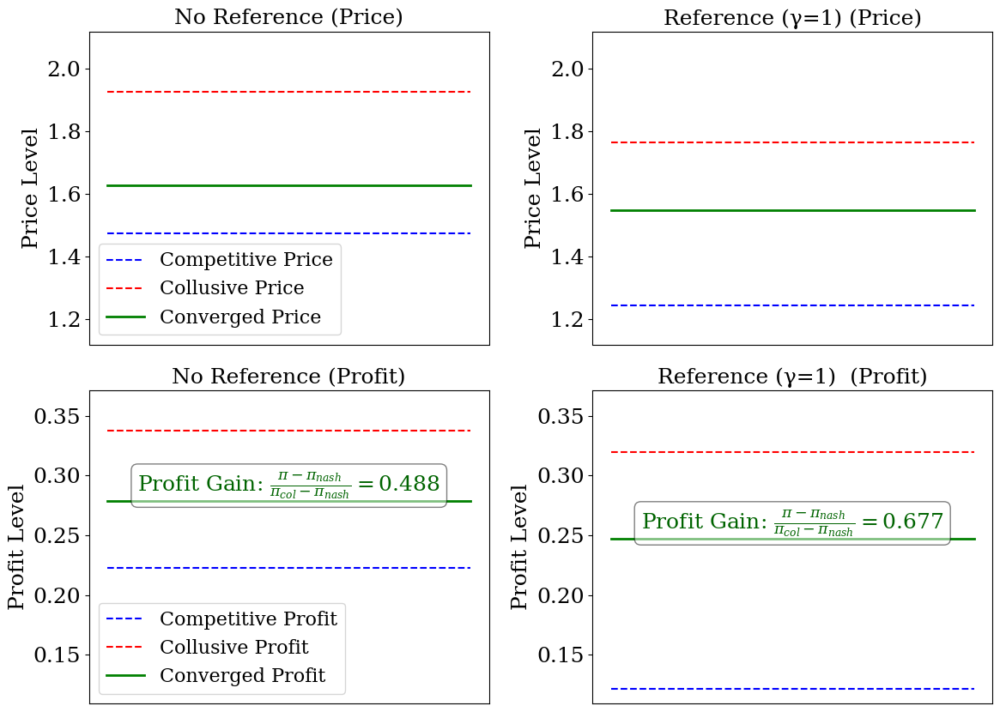

Profit Gain (No Reference, γ=0): 0.48815
Profit Gain (Reference, γ=1):   0.67719
Observation: Profit gain increases with reference dependence.


In [56]:
import matplotlib.pyplot as plt
import numpy as np

# Data points
gamma0_data = {
    "name": "No Reference",
    "competitive_price": 1.47292666,
    "collusive_price": 1.92498092,
    "competitive_profit": 0.22292,
    "collusive_profit": 0.3374904,
    "converged_price": 1.627405,
    "converged_profit": 0.278852,
    "profit_gain": 0.4881525
}

gamma1_data = {
    "name": "Reference (γ=1)",
    "competitive_price": 1.244201380,
    "collusive_price": 1.7649987,
    "competitive_profit": 0.12120138,
    "collusive_profit": 0.3199,
    "converged_price": 1.54921,
    "converged_profit": 0.247287,
    "profit_gain": 0.67719
}

# --- Create the plots ---
fig, axs = plt.subplots(2, 2, figsize=(12, 9))
# --- Plotting Setup ---
plt.rcParams.update({
    'font.size': 18, 'axes.titlesize': 18, 'axes.labelsize': 18,
    'xtick.labelsize': 18, 'ytick.labelsize': 18, 'legend.fontsize': 16,
    'figure.titlesize': 18, 'font.family': 'serif', 'mathtext.fontset': 'dejavuserif',
})
#fig.suptitle("Impact of Reference Dependence on Price and Profit Dynamics", fontsize=16)

# Arbitrary x-values for plotting horizontal lines
x_plot = np.array([0, 1])
x_text_pos = 0.5 # Mid-point for text annotation on the x-axis

# --- Row 1: Price ---

# Plot 1: Price (No Reference, γ=0)
ax = axs[0, 0]
ax.plot(x_plot, [gamma0_data["competitive_price"], gamma0_data["competitive_price"]],
        label="Competitive Price", linestyle="--", color="blue")
ax.plot(x_plot, [gamma0_data["collusive_price"], gamma0_data["collusive_price"]],
        label="Collusive Price", linestyle="--", color="red")
ax.plot(x_plot, [gamma0_data["converged_price"], gamma0_data["converged_price"]],
        label="Converged Price", linestyle="-", color="green", linewidth=2)
ax.set_title(gamma0_data["name"] + " (Price)")
ax.set_ylabel("Price Level")
ax.legend()
ax.set_xticks([])
price_ymin = min(gamma0_data["competitive_price"], gamma1_data["competitive_price"]) * 0.9
price_ymax = max(gamma0_data["collusive_price"], gamma1_data["collusive_price"]) * 1.1
ax.set_ylim(price_ymin, price_ymax)

# Plot 2: Price (Reference, γ=1)
ax = axs[0, 1]
ax.plot(x_plot, [gamma1_data["competitive_price"], gamma1_data["competitive_price"]],
        label="Competitive Price", linestyle="--", color="blue")
ax.plot(x_plot, [gamma1_data["collusive_price"], gamma1_data["collusive_price"]],
        label="Collusive Price", linestyle="--", color="red")
ax.plot(x_plot, [gamma1_data["converged_price"], gamma1_data["converged_price"]],
        label="Converged Price", linestyle="-", color="green", linewidth=2)
ax.set_title(gamma1_data["name"] + " (Price)")
ax.set_ylabel("Price Level")
ax.set_xticks([])
ax.set_ylim(price_ymin, price_ymax)

# --- Row 2: Profit (with Profit Gain annotation) ---

# Determine y-limits for the second row based on profits
profit_ymin = min(gamma0_data["competitive_profit"], gamma1_data["competitive_profit"]) * 0.9
profit_ymax = max(gamma0_data["collusive_profit"], gamma1_data["collusive_profit"]) * 1.1

# Plot 3: Profit (No Reference, γ=0)
ax = axs[1, 0]
ax.plot(x_plot, [gamma0_data["competitive_profit"], gamma0_data["competitive_profit"]],
        label="Competitive Profit", linestyle="--", color="blue")
ax.plot(x_plot, [gamma0_data["collusive_profit"], gamma0_data["collusive_profit"]],
        label="Collusive Profit", linestyle="--", color="red")
ax.plot(x_plot, [gamma0_data["converged_profit"], gamma0_data["converged_profit"]],
        label="Converged Profit", linestyle="-", color="green", linewidth=2)
latex_string = r'Profit Gain: $\frac{\pi - \pi_{nash}}{\pi_{col} - \pi_{nash}} = %.3f$' % gamma0_data["profit_gain"]
# Add Profit Gain text
ax.text(x_text_pos, gamma0_data["converged_profit"],
        latex_string,
        verticalalignment='bottom', horizontalalignment='center', color='darkgreen',
        fontsize=18, bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.5))
ax.set_title(gamma0_data["name"] + " (Profit)")
ax.set_ylabel("Profit Level")
ax.legend()
ax.set_xticks([])
ax.set_ylim(profit_ymin, profit_ymax)

# Plot 4: Profit (Reference, γ=1)
ax = axs[1, 1]
ax.plot(x_plot, [gamma1_data["competitive_profit"], gamma1_data["competitive_profit"]],
        label="Competitive Profit", linestyle="--", color="blue")
ax.plot(x_plot, [gamma1_data["collusive_profit"], gamma1_data["collusive_profit"]],
        label="Collusive Profit", linestyle="--", color="red")
ax.plot(x_plot, [gamma1_data["converged_profit"], gamma1_data["converged_profit"]],
        label="Converged Profit", linestyle="-", color="green", linewidth=2)

latex_string = r'Profit Gain: $\frac{\pi - \pi_{nash}}{\pi_{col} - \pi_{nash}} = %.3f$' % gamma1_data["profit_gain"]
# Add Profit Gain text
ax.text(x_text_pos, gamma1_data["converged_profit"],
        latex_string,
        verticalalignment='bottom', horizontalalignment='center', color='darkgreen',
        fontsize=18, bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.5))
ax.set_title(gamma1_data["name"] + "  (Profit)")
ax.set_ylabel("Profit Level")
ax.set_xticks([])
ax.set_ylim(profit_ymin, profit_ymax)

# Adjust layout to prevent overlap
plt.tight_layout(rect=[0, 0, 1, 0.96]) # rect leaves space for suptitle
plt.show()

# Print profit gain for narrative confirmation
print(f"Profit Gain (No Reference, γ=0): {gamma0_data['profit_gain']:.5f}")
print(f"Profit Gain (Reference, γ=1):   {gamma1_data['profit_gain']:.5f}")
if gamma1_data['profit_gain'] > gamma0_data['profit_gain']:
    print("Observation: Profit gain increases with reference dependence.")
else:
    print("Observation: Profit gain does NOT clearly increase with reference dependence (check data/assumptions).")

Calculating SMOOTH equilibria for 31 gamma values...
[0.47292666 0.47292666] [0.47137681 0.47137681]
[0.92498092 0.92498092] [0.36486208 0.36486208]
[0.42425004 0.42425004] [0.47619988 0.47619988]
[0.89598627 0.89598627] [0.37599016 0.37599016]
[0.38429858 0.38429858] [0.47957132 0.47957132]
[0.87076239 0.87076239] [0.38515811 0.38515811]
[0.35101801 0.35101801] [0.48202606 0.48202606]
[0.84847118 0.84847118] [0.39285542 0.39285542]
[0.32291933 0.32291933] [0.48387522 0.48387522]
[0.82852345 0.82852345] [0.39941946 0.39941946]
[0.2989094 0.2989094] [0.48530841 0.48530841]
[0.81048973 0.81048973] [0.40509062 0.40509062]
[0.27817362 0.27817362] [0.48644611 0.48644611]
[0.79404755 0.79404755] [0.41004497 0.41004497]
[0.26009548 0.26009548] [0.48736774 0.48736774]
[0.77894883 0.77894883] [0.41441457 0.41441457]
[0.24420138 0.24420138] [0.48812738 0.48812738]
[0.7649987 0.7649987] [0.41830051 0.41830051]
[0.23012231 0.23012231] [0.48876291 0.48876291]
[0.75204139 0.75204139] [0.42178153 0.4

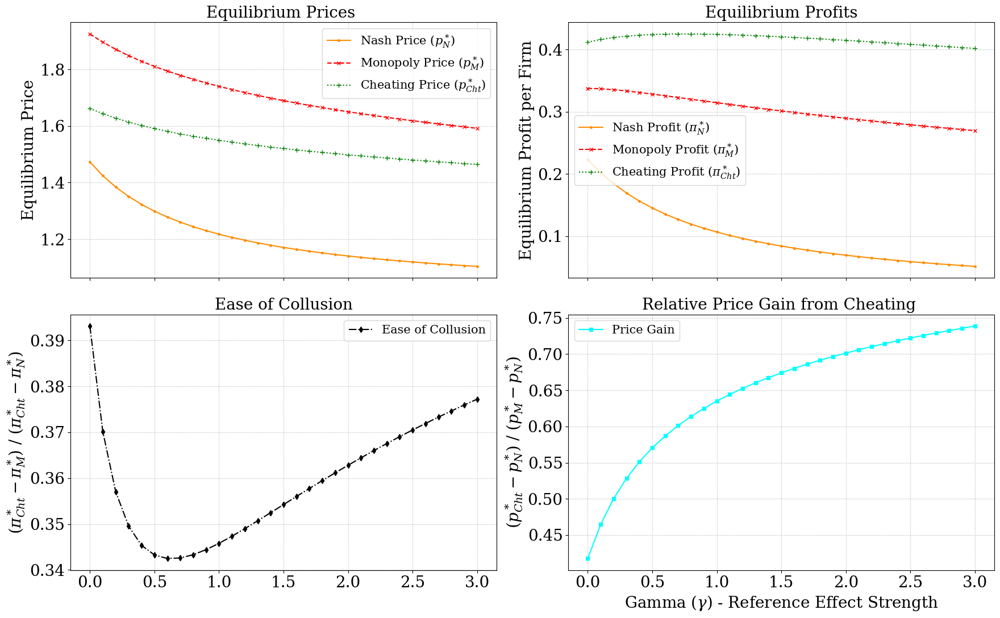

Plot display finished.
Generating requested Collusive vs. Nash Price plot...


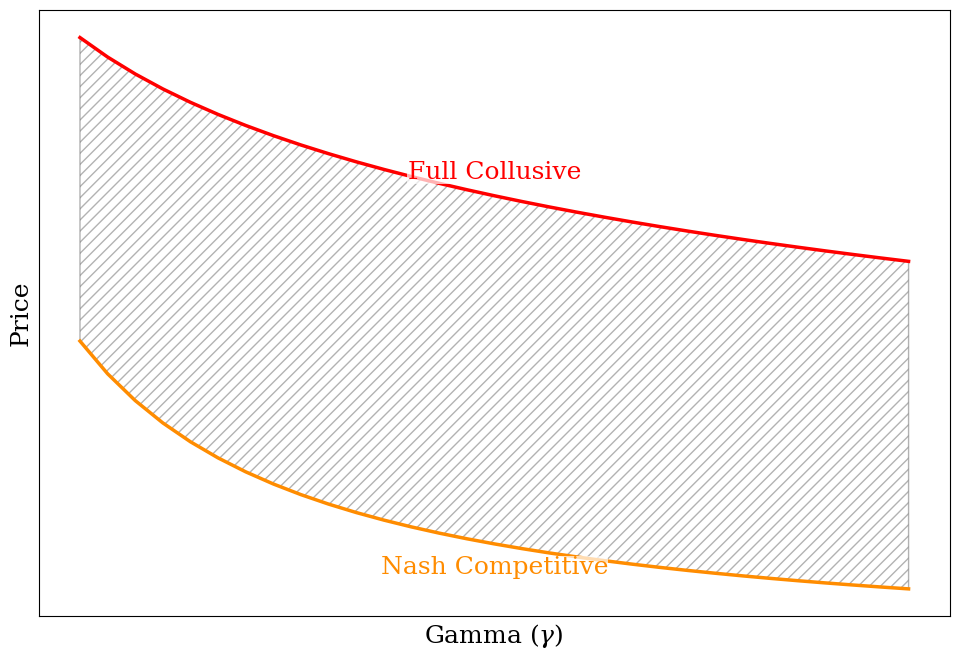

Requested plot generation finished.


In [72]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve
from itertools import product

# --- Model Class Definition with SMOOTH FOCs ---
# (Keep the model class definition exactly as in the previous version)
class model(object):
    """
    Model of algorithms and competition
    (Calculates Nash, Monopoly, and Cheating equilibria using SMOOTH FOCs)
    """

    def __init__(self, **kwargs):
        """Initialize game and compute equilibria"""
        # Default properties
        self.n = kwargs.get('n', 2)
        self.gamma = kwargs.get('gamma', 1)
        self.lossaversion = kwargs.get('lossaversion', 1.0)
        self.c = kwargs.get('c', 1)
        self.a = kwargs.get('a', 2)
        self.a0 = kwargs.get('a0', 0)
        self.mu = kwargs.get('mu', 0.25)
        self.common_reference = kwargs.get('common_reference', True)
        self.demand_type = kwargs.get('demand_type', 'reference')
        self.foc_smoothness = kwargs.get('foc_smoothness', 40) # Steepness factor

        if self.gamma > 0 and self.demand_type == 'noreference':
             self.demand_type = 'reference'

        valid_demand_types = {'reference', 'noreference','misspecification'}
        if self.demand_type not in valid_demand_types:
            raise ValueError(f"Invalid demand_type: {self.demand_type}. Allowed values: {valid_demand_types}")

        self.reference_loss_aversion = self.lossaversion > 1

        # --- Compute Nash, Monopoly, and Cheating equilibria ---
        p0_nash = np.ones(self.n) * self.c * 1.5 # Initial guess Nash
        p0_coop = np.ones(self.n) * self.c * 2.5 # Initial guess Coop

        # Initialize result arrays with NaNs
        self.p_nash = np.full(self.n, np.nan)
        self.NashProfits = np.full(self.n, np.nan)
        self.p_coop = np.full(self.n, np.nan)
        self.CoopProfits = np.full(self.n, np.nan)
        self.p_cheat = np.nan
        self.CheatProfit = np.nan

        try:
            p_nash_sol = fsolve(self.foc, p0_nash, xtol=1.49012e-08)
            p_coop_sol = fsolve(self.foc_monopoly, p0_coop, xtol=1.49012e-08)

            valid_nash = not np.isnan(p_nash_sol).any() and all(p_nash_sol > -1e-6)
            valid_coop = not np.isnan(p_coop_sol).any() and all(p_coop_sol > -1e-6)

            if valid_nash:
                self.p_nash = p_nash_sol
                r_nash = self.reference_price(self.p_nash)
                nash_demand = self.demand(self.p_nash, r=r_nash)
                self.NashProfits = (self.p_nash - self.c) * nash_demand
                print((self.p_nash - self.c), nash_demand)

            if valid_coop:
                self.p_coop = p_coop_sol
                r_coop = self.reference_price(self.p_coop)
                coop_demand = self.demand(self.p_coop, r=r_coop)
                self.CoopProfits = (self.p_coop - self.c) * coop_demand
                print((self.p_coop - self.c), coop_demand)

                if valid_nash: # Need Nash profit for the gain calculation later
                    p_M = self.p_coop[0]
                    # Use a guess below Nash, as cheating price is typically low
                    p0_cheat = self.p_nash[0] * 0.95 if self.p_nash[0] > 0 else p_M * 0.9

                    try:
                        p_cheat_sol = fsolve(self.foc_cheat, p0_cheat, args=(p_M,), xtol=1.49012e-08)
                        # print('cheat', p_cheat_sol)
                        # print('nash,coop', self.p_nash[0], p_M)

                        # Check if result is a single value array
                        if isinstance(p_cheat_sol, (np.ndarray, list)) and len(p_cheat_sol) > 0:
                           p_cheat_val = p_cheat_sol[0]
                        else:
                           p_cheat_val = p_cheat_sol # Assume scalar if not array

                        if not np.isnan(p_cheat_val) and p_cheat_val > -1e-6:
                            self.p_cheat = p_cheat_val # Store the scalar value
                            p_vector_cheat = np.full(self.n, p_M)
                            p_vector_cheat[0] = self.p_cheat
                            r_cheat = p_M
                            cheat_demand_vector = self.demand(p_vector_cheat, r=r_cheat)
                            self.CheatProfit = (self.p_cheat - self.c) * cheat_demand_vector[0]
                        # else: print(f"Debug: Invalid/NaN Cheating price (smooth) gamma={self.gamma}, sol={p_cheat_sol}")
                    except Exception as e_cheat:
                        print(f"Error solving smooth cheating price gamma={self.gamma}: {e_cheat}")
                # else: print(f"Debug: Nash invalid, cannot calculate cheat gain (smooth) gamma={self.gamma}")
            # else: print(f"Debug: Invalid/NaN Coop price (smooth) gamma={self.gamma}")

        except Exception as e_fsolve:
            print(f"Error during smooth fsolve for gamma={self.gamma}: {e_fsolve}")


    # --- Demand and Reference Price ---
    def reference_price(self, p):
        if self.common_reference:
            p_array = np.atleast_1d(p); return np.mean(p_array)
        else: return p

    def demand(self, p, r=None):
        p = np.asarray(p)
        if self.demand_type == 'noreference':
            e = np.exp((self.a - p) / self.mu)
            sum_e = np.sum(e) if e.ndim > 0 else e
            d = e / (sum_e + np.exp(self.a0 / self.mu))
        elif self.demand_type in ["reference", "misspecification"]:
            if r is None: r = self.reference_price(p)
            r = np.asarray(r)
            if self.common_reference and r.ndim == 0: r = np.full_like(p, r)
            p_eff = p + self.gamma * (p - r)
            if self.reference_loss_aversion:
                # Demand calculation still uses hard step logic
                price_above_r = p >= r; price_below_r = p < r
                p_eff = (p + self.gamma * (p - r) * price_below_r +
                         self.lossaversion * self.gamma * (p - r) * price_above_r)
            e = np.exp((self.a - p_eff) / self.mu)
            sum_e = np.sum(e) if e.ndim > 0 else e
            d = e / (sum_e + np.exp(self.a0 / self.mu))
        return d

    # --- SMOOTH FOC Functions ---
    def foc(self, p):
        """Compute first order condition using SMOOTH indicators"""
        p = np.asarray(p); r_eq = self.reference_price(p); d = self.demand(p, r=r_eq)
        one_minus_d = (1 - d) if d.ndim == 0 or d.shape[0] == 1 else (1 - d)
        if self.demand_type == 'noreference':
             zero = 1 - (p - self.c) * one_minus_d / self.mu
        elif self.demand_type in ["reference", "misspecification"]:
            p_i = p[0]; r_i = r_eq[0] if isinstance(r_eq, np.ndarray) else r_eq # Check at symmetric point
            if self.reference_loss_aversion:
                price_above_r = 1 / (1 + np.exp(-self.foc_smoothness * (p_i - r_i)))
                price_below_r = 1 / (1 + np.exp(self.foc_smoothness * (p_i - r_i)))
                derivative_factor = (1 + self.gamma * price_below_r + self.lossaversion * self.gamma * price_above_r)
            else: derivative_factor = (1 + self.gamma)
            zero = 1 - derivative_factor * (p - self.c) * one_minus_d / self.mu
        return np.squeeze(zero)

    def foc_monopoly(self, p):
        """Compute first-order condition for collusion using SMOOTH indicators"""
        p = np.asarray(p); r_eq = self.reference_price(p); d = self.demand(p, r=r_eq)
        p_vec = p.reshape(-1, 1) if p.ndim == 1 else p; d_vec = d.reshape(-1, 1) if d.ndim == 1 else d
        profit_margin = p_vec - self.c; total_contribution = np.sum(profit_margin * d_vec)
        own_contribution = profit_margin * d_vec; one_minus_d = 1.0 - d_vec
        if self.demand_type == 'noreference':
            zero = 1 - (profit_margin * one_minus_d / self.mu) + ((total_contribution - own_contribution) / self.mu)
        elif self.demand_type in ["reference", "misspecification"]:
            p_i = p[0]; r_i = r_eq[0] if isinstance(r_eq, np.ndarray) else r_eq
            if self.reference_loss_aversion:
                price_above_r = 1 / (1 + np.exp(-self.foc_smoothness * (p_i - r_i)))
                price_below_r = 1 / (1 + np.exp(self.foc_smoothness * (p_i - r_i)))
                derivative_factor = (1 + self.gamma * price_below_r + self.lossaversion * self.gamma * price_above_r)
            else: derivative_factor = (1 + self.gamma)
            zero = 1 - derivative_factor * (profit_margin * one_minus_d / self.mu) \
                     + derivative_factor * ((total_contribution - own_contribution) / self.mu)
        return np.squeeze(zero)

    # --- new, cleaner FOC for a one-shot deviator ------------------------
    def foc_cheat(self, p_i_cheat, p_M):
        """
        FOC: firm 1 deviates (p_i_cheat), firm 2 sticks to cartel price p_M (= r)
        Solves  1 - (p_i - c) * (1+γ) * (1-s_i)/μ = 0   (below-reference case)
        """
        p_i = float(np.asarray(p_i_cheat).ravel()[0])   # scalar
        p_j = r = float(p_M)

        # price vector and demand
        p_vec = np.array([p_i, p_j])
        s_vec = self.demand(p_vec, r=r)
        s_i  = s_vec[0]
        one_minus_si = 1.0 - s_i

        derivative_factor = (1 + self.gamma)       # below-reference ⇒ γ_b = γ
        # (If you keep loss‑aversion, add a branch: if p_i > r use 1+φγ.)

        zero = 1.0 - (p_i - self.c) * derivative_factor * one_minus_si / self.mu
        return zero   # scalar; fsolve expects a 0 of this function


# --- Calculation Loop ---
# gamma_values = np.linspace(0, 1, 10) # Original
gamma_values = np.linspace(0, 3, 31) # MODIFIED: Range 0 to 3, 31 points
nash_prices_smooth = []
nash_profits_smooth = []
monopoly_prices_smooth = []
monopoly_profits_smooth = []
cheat_prices_smooth = []
cheat_profits_smooth = []
profit_gains_smooth = []
price_gains_smooth = [] # New list for price gain metric
deltas_smooth = []

model_params = {
    'n': 2, 'c': 1, 'a': 2.0, 'mu': 0.25, 'a0': 0.0,
    'lossaversion': 1.5, 'foc_smoothness': 40,
    'common_reference': True, 'demand_type': 'reference'
}

print(f"Calculating SMOOTH equilibria for {len(gamma_values)} gamma values...")
for gamma in gamma_values:
    current_params = model_params.copy(); current_params['gamma'] = gamma
    p_N, p_M, p_Cht = np.nan, np.nan, np.nan # Initialize prices
    pi_N, pi_M, pi_Cht = np.nan, np.nan, np.nan # Initialize profits
    try:
        m = model(**current_params)

        # Extract results and store intermediate values
        p_N = m.p_nash[0] if not np.isnan(m.p_nash).any() else np.nan
        nash_prices_smooth.append(p_N)
        pi_N = m.NashProfits[0] if not np.isnan(m.NashProfits).any() else np.nan
        nash_profits_smooth.append(pi_N)

        p_M = m.p_coop[0] if not np.isnan(m.p_coop).any() else np.nan
        monopoly_prices_smooth.append(p_M)
        pi_M = m.CoopProfits[0] if not np.isnan(m.CoopProfits).any() else np.nan
        monopoly_profits_smooth.append(pi_M)

        p_Cht = m.p_cheat if not np.isnan(m.p_cheat) else np.nan # Already scalar
        cheat_prices_smooth.append(p_Cht)
        pi_Cht = m.CheatProfit if not np.isnan(m.CheatProfit) else np.nan
        cheat_profits_smooth.append(pi_Cht)

        # Calculate Profit Gain
        profit_gain = np.nan
        if not np.isnan(pi_Cht) and not np.isnan(pi_M) and not np.isnan(pi_N):
            denominator = pi_M - pi_N
            if abs(denominator) > 1e-9:
                 numerator = pi_Cht - pi_N
                 if numerator >= -1e-9:
                    profit_gain = numerator / denominator
        profit_gains_smooth.append(profit_gain)

        # Calculate Price Gain
        price_gain = np.nan
        if not np.isnan(p_Cht) and not np.isnan(p_M) and not np.isnan(p_N):
             denominator = p_M - p_N # Use p_N here
             if abs(denominator) > 1e-9:
                  numerator = p_Cht - p_N # Use p_M here
                  # Allow numerator to be positive or negative, as p_Cht can be > or < p_M theoretically
                  price_gain = numerator / denominator
             # else: print(f"Debug: Denominator zero/small for price gain calc gamma={gamma}")
        price_gains_smooth.append(price_gain)

        # Calculate Price Gain
        delta = np.nan
        if not np.isnan(p_Cht) and not np.isnan(p_M) and not np.isnan(p_N):
             denominator = pi_Cht - pi_N # Use p_N here
             if abs(denominator) > 1e-9:
                  numerator = pi_Cht - pi_M # Use p_M here
                  # Allow numerator to be positive or negative, as p_Cht can be > or < p_M theoretically
                  delta = numerator / denominator
             # else: print(f"Debug: Denominator zero/small for price gain calc gamma={gamma}")
        deltas_smooth.append(delta)


    except Exception as e:
         print(f"Error processing smooth gamma = {gamma}: {e}")
         nash_prices_smooth.append(np.nan); nash_profits_smooth.append(np.nan)
         monopoly_prices_smooth.append(np.nan); monopoly_profits_smooth.append(np.nan)
         cheat_prices_smooth.append(np.nan); cheat_profits_smooth.append(np.nan)
         profit_gains_smooth.append(np.nan)
         price_gains_smooth.append(np.nan) # Append NaN on error

print("Calculation complete.")
print(gamma_values, nash_profits_smooth, monopoly_profits_smooth)

# Convert lists to numpy arrays
nash_prices_smooth = np.array(nash_prices_smooth); nash_profits_smooth = np.array(nash_profits_smooth)
monopoly_prices_smooth = np.array(monopoly_prices_smooth); monopoly_profits_smooth = np.array(monopoly_profits_smooth)
cheat_prices_smooth = np.array(cheat_prices_smooth); cheat_profits_smooth = np.array(cheat_profits_smooth)
profit_gains_smooth = np.array(profit_gains_smooth)
price_gains_smooth = np.array(price_gains_smooth) # Convert price gains
deltas_smooth = np.array(deltas_smooth) # Convert price gains


# --- Plotting ---
print("Generating plots...")
plt.rcParams.update({
    'font.size': 20,         # General font size
    'axes.titlesize': 20,    # Subplot title
    'axes.labelsize': 20,    # Axis labels
    'xtick.labelsize': 20,   # X-axis tick labels
    'ytick.labelsize': 20,   # Y-axis tick labels
    'legend.fontsize': 15,   # Legend text
})
# Create 4 rows of subplots
fig, ax = plt.subplots(2, 2, figsize=(18, 12), sharex=True) # Adjusted rows and height

# Plot 1: Prices vs Gamma
ax[0,0].plot(gamma_values, nash_prices_smooth, marker='.', linestyle='-', markersize=5,color='darkorange', label='Nash Price ($p_N^*$)')
ax[0,0].plot(gamma_values, monopoly_prices_smooth, marker='x', linestyle='--', markersize=5, color='red', label='Monopoly Price ($p_M^*$)')
ax[0,0].plot(gamma_values, cheat_prices_smooth, marker='+', linestyle=':', markersize=6, color='green', label='Cheating Price ($p_{Cht}^*$)')
ax[0,0].set_ylabel('Equilibrium Price')
ax[0,0].set_title('Equilibrium Prices ')
ax[0,0].legend()
ax[0,0].grid(True, linestyle=':')
if np.isnan(nash_prices_smooth).any() or np.isnan(monopoly_prices_smooth).any() or np.isnan(cheat_prices_smooth).any():
    ax[0,0].text(0.95, 0.05, 'NaNs present', transform=ax[0,0].transAxes, ha='right', va='bottom', color='red', style='italic') # Corrected ax index

# Plot 2: Profits vs Gamma
ax[0,1].plot(gamma_values, nash_profits_smooth, marker='.', linestyle='-', color='darkorange', markersize=5, label='Nash Profit ($\pi_N^*$)')
ax[0,1].plot(gamma_values, monopoly_profits_smooth, marker='x', linestyle='--', color='red', markersize=5, label='Monopoly Profit ($\pi_M^*$)')
ax[0,1].plot(gamma_values, cheat_profits_smooth, marker='+', linestyle=':', color='green', markersize=6, label='Cheating Profit ($\pi_{Cht}^*$)')
ax[0,1].set_ylabel('Equilibrium Profit per Firm')
ax[0,1].set_title('Equilibrium Profits')
ax[0,1].legend()
ax[0,1].grid(True, linestyle=':')
if np.isnan(nash_profits_smooth).any() or np.isnan(monopoly_profits_smooth).any() or np.isnan(cheat_profits_smooth).any():
    ax[0,1].text(0.95, 0.05, 'NaNs present', transform=ax[0,1].transAxes, ha='right', va='bottom', color='red', style='italic') # Corrected ax index

# Plot 3: Profit Gain (Ease of Collusion)
ax[1,0].plot(gamma_values, deltas_smooth, marker='d', linestyle='-.', color='black', markersize=5, label='Ease of Collusion')
ax[1,0].set_ylabel('($\pi_{Cht}^* - \pi_M^*$) / ($\pi_{Cht}^* - \pi_N^*$)') # More explicit label
ax[1,0].set_title('Ease of Collusion')
ax[1,0].legend()
ax[1,0].grid(True, linestyle=':')
if np.isnan(deltas_smooth).any(): # Check deltas_smooth for NaNs
    ax[1,0].text(0.95, 0.05, 'NaNs present', transform=ax[1,0].transAxes, ha='right', va='bottom', color='red', style='italic') # Corrected ax index

# Plot 4: Price Gain (NEW PLOT)
ax[1,1].plot(gamma_values, price_gains_smooth, marker='s', linestyle='-', color='cyan', markersize=4, label='Price Gain')
ax[1,1].set_xlabel('Gamma ($\gamma$) - Reference Effect Strength')
ax[1,1].set_ylabel('($p_{Cht}^* - p_N^*$) / ($p_M^* - p_N^*$)') # More explicit label
ax[1,1].set_title('Relative Price Gain from Cheating ')
ax[1,1].legend()
ax[1,1].grid(True, linestyle=':')
if np.isnan(price_gains_smooth).any():
    ax[1,1].text(0.95, 0.05, 'NaNs present', transform=ax[1,1].transAxes, ha='right', va='bottom', color='red', style='italic') # Corrected ax index


plt.tight_layout(rect=[0, 0.03, 1, 0.97]) # Adjust top slightly for main title
plt.show()
print("Plot display finished.")


# --- NEW PLOT: Collusive vs Nash Prices (as requested) ---
print("Generating requested Collusive vs. Nash Price plot...")
plt.figure(figsize=(10, 7)) # New figure with adjusted size

# Plot the lines
# Ensure data is valid before plotting
valid_monopoly_indices = ~np.isnan(monopoly_prices_smooth)
valid_nash_indices = ~np.isnan(nash_prices_smooth)

plt.plot(gamma_values[valid_monopoly_indices], monopoly_prices_smooth[valid_monopoly_indices], color='red', linewidth=2.5)
plt.plot(gamma_values[valid_nash_indices], nash_prices_smooth[valid_nash_indices], color='darkorange', linewidth=2.5)

# Fill between the lines with hatching
# We need to handle NaNs carefully for fill_between.
# A common approach is to interpolate or use masked arrays, but for simplicity,
# we'll fill based on the generally expected relationship.
# Ensure both arrays are of the same length and NaNs are handled if fill_between struggles.
# For robust filling, one might need to iterate through segments.
# However, matplotlib's fill_between usually handles internal NaNs by breaking the fill.
plt.fill_between(gamma_values, nash_prices_smooth, monopoly_prices_smooth,
                 where=(monopoly_prices_smooth >= nash_prices_smooth) & ~np.isnan(nash_prices_smooth) & ~np.isnan(monopoly_prices_smooth),
                 hatch='///', facecolor='none', edgecolor='gray', alpha=0.6)

# Indicate lines with text
# Find a suitable index for text placement (e.g., around gamma = 1.0 or 1.5)
target_gamma_for_text = 1.5
if len(gamma_values) > 0:
    text_idx = (np.abs(gamma_values - target_gamma_for_text)).argmin()

    # Collusive price text
    if text_idx < len(monopoly_prices_smooth) and not np.isnan(monopoly_prices_smooth[text_idx]):
        plt.text(gamma_values[text_idx], monopoly_prices_smooth[text_idx] + 0.02 * (plt.ylim()[1] - plt.ylim()[0]), 'Full Collusive',
                 color='red', va='bottom', ha='center', fontsize=18,
                 bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=0.2))
    elif any(~np.isnan(monopoly_prices_smooth)): # Fallback: place near first valid point
        first_valid_idx = np.where(~np.isnan(monopoly_prices_smooth))[0][0]
        plt.text(gamma_values[first_valid_idx], monopoly_prices_smooth[first_valid_idx], 'Full Collusive',
                 color='red', va='bottom', ha='center', fontsize=12,
                 bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=0.2))


    # Competitive price text
    if text_idx < len(nash_prices_smooth) and not np.isnan(nash_prices_smooth[text_idx]):
        plt.text(gamma_values[text_idx], nash_prices_smooth[text_idx] - 0.02 * (plt.ylim()[1] - plt.ylim()[0]), 'Nash Competitive',
                 color='darkorange', va='top', ha='center', fontsize=18,
                 bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=0.2))
    elif any(~np.isnan(nash_prices_smooth)): # Fallback: place near first valid point
        first_valid_idx = np.where(~np.isnan(nash_prices_smooth))[0][0]
        plt.text(gamma_values[first_valid_idx], nash_prices_smooth[first_valid_idx], 'Nash Competitive',
                 color='darkorange', va='top', ha='center', fontsize=12,
                 bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=0.2))


# Remove numbers (tick labels) from axes
plt.xticks([])
plt.yticks([])

# Set conceptual labels and title
plt.xlabel('Gamma ($\gamma$)', fontsize=18)
plt.ylabel('Price', fontsize=18)
#plt.title('Collusive vs. Competitive Prices', fontsize=18)

plt.grid(True, linestyle=':', alpha=0.7)
plt.tight_layout()
plt.show()
print("Requested plot generation finished.")

In [2]:
import numpy as np
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve
from itertools import product
# ---------- Logit helpers ----------
def softmax_shares(Vi, Vj, V0):
    ei, ej, e0 = np.exp(Vi), np.exp(Vj), np.exp(V0)
    Z = ei + ej + e0
    return ei/Z, ej/Z

def demand_sym(p, a, mu, a0, gamma=0.0, r=None):
    """
    Symmetric shares at p_i=p_j=p. If r is None we take r=p (common reference).
    """
    if r is None:
        r = p
    Vi = (a - p + gamma*(r - p))/mu
    Vj = Vi
    V0 = a0/mu
    Di, Dj = softmax_shares(Vi, Vj, V0)
    return Di  # = Dj

# ---------- Simple robust 1D solver ----------
def bisect(f, lo, hi, tol=1e-12, it=200):
    flo, fhi = f(lo), f(hi)
    # expand hi if needed
    tries = 0
    while flo*fhi > 0 and tries < 40:
        hi = hi*1.2 + 1e-6
        fhi = f(hi)
        tries += 1
    if flo*fhi > 0:
        raise RuntimeError("Failed to bracket root.")
    for _ in range(it):
        mid = 0.5*(lo+hi)
        fm  = f(mid)
        if abs(hi-lo) < tol:
            return mid
        if flo*fm <= 0:
            hi, fhi = mid, fm
        else:
            lo, flo = mid, fm
    return 0.5*(lo+hi)

# ---------- Cartel pricing under two modes ----------
def cartel_price(a, c, mu, a0, gamma, mode="exogenous_r_foc"):
    """
    mode='exogenous_r_foc': FOC uses (1+gamma) multiplier: 1 - (1+γ)(p-c)(1-2D)/μ = 0
    mode='gamma_invariant': FOC without γ (correct if r=p in levels): 1 - (p-c)(1-2D)/μ = 0
    """
    if mode not in ("exogenous_r_foc", "gamma_invariant"):
        raise ValueError("mode must be 'exogenous_r_foc' or 'gamma_invariant'")
    lo, hi = c + 1e-9, c + 20.0

    def foc(p):
        D = demand_sym(p, a, mu, a0, gamma=gamma, r=p)  # r=p in levels
        if mode == "exogenous_r_foc":
            return 1.0 - (1.0 + gamma)*(p - c)*(1.0 - 2.0*D)/mu
        else:  # gamma_invariant
            return 1.0 - (p - c)*(1.0 - 2.0*D)/mu

    return bisect(foc, lo, hi)

def cartel_profit_per_firm(p, a, c, mu, a0, gamma, r=None):
    D = demand_sym(p, a, mu, a0, gamma=gamma, r=r)
    return (p - c)*D

# ---------- Derivatives ----------
def numerical_dPi_dgamma(a, c, mu, a0, gamma, mode, h=None):
    if h is None:
        h = 1e-4*(1.0 + gamma)
    # left/right prices from consistent FOC for each gamma
    pL = cartel_price(a, c, mu, a0, gamma - h, mode=mode)
    pR = cartel_price(a, c, mu, a0, gamma + h, mode=mode)
    # r=p in levels
    piL = cartel_profit_per_firm(pL, a, c, mu, a0, gamma - h, r=pL)
    piR = cartel_profit_per_firm(pR, a, c, mu, a0, gamma + h, r=pR)
    return (piR - piL) / (2.0*h)

def analytic_dPi_dgamma(a, c, mu, a0, gamma, p, r=None):
    """
    Analytic envelope result at the cooperative optimum:
    dΠ_col/dγ = [ D_i(r-p) + D_j(r-p) ] / (1+γ) = 2*D*(r-p)/(1+γ) under symmetry
    Returns both total (joint) and per-firm derivative (half of total).
    """
    if r is None:
        r = p
    D = demand_sym(p, a, mu, a0, gamma=gamma, r=r)
    total = 2.0*D*(r - p)/(1.0 + gamma)
    perfirm = 0.5*total
    return perfirm, total

# ---------- Quick demo ----------
if __name__ == "__main__":
    a, c, mu, a0 = 2.0, 1.0, 0.25, 0.0
    for mode in ("exogenous_r_foc", "gamma_invariant"):
        print(f"\nMode = {mode}")
        for gamma in (0.0, 0.5, 1.0, 2.0):
            p = cartel_price(a, c, mu, a0, gamma, mode=mode)
            pi = cartel_profit_per_firm(p, a, c, mu, a0, gamma, r=p)  # r=p in levels
            num = numerical_dPi_dgamma(a, c, mu, a0, gamma, mode)
            ana_perfirm, ana_total = analytic_dPi_dgamma(a, c, mu, a0, gamma, p, r=p)
            print(f"γ={gamma:>3}: p={p:.6f}, π_firm={pi:.6f}, "
                  f"dπ/dγ (num)={num:+.6e}, dπ/dγ (anal)={ana_perfirm:+.6e}")



Mode = exogenous_r_foc
γ=0.0: p=1.924981, π_firm=0.337490, dπ/dγ (num)=+6.084022e-10, dπ/dγ (anal)=+0.000000e+00
γ=0.5: p=1.828523, π_firm=0.330928, dπ/dγ (num)=-2.016206e-02, dπ/dγ (anal)=+0.000000e+00
γ=1.0: p=1.764999, π_firm=0.319999, dπ/dγ (num)=-2.247190e-02, dπ/dγ (anal)=+0.000000e+00
γ=2.0: p=1.680817, π_firm=0.298742, dπ/dγ (num)=-1.958359e-02, dπ/dγ (anal)=+0.000000e+00

Mode = gamma_invariant
γ=0.0: p=1.924981, π_firm=0.337490, dπ/dγ (num)=+0.000000e+00, dπ/dγ (anal)=+0.000000e+00
γ=0.5: p=1.924981, π_firm=0.337490, dπ/dγ (num)=+0.000000e+00, dπ/dγ (anal)=+0.000000e+00
γ=1.0: p=1.924981, π_firm=0.337490, dπ/dγ (num)=+0.000000e+00, dπ/dγ (anal)=+0.000000e+00
γ=2.0: p=1.924981, π_firm=0.337490, dπ/dγ (num)=+0.000000e+00, dπ/dγ (anal)=+0.000000e+00


In [1]:
# --- NEW PLOT: Collusive vs Nash Prices (as requested) ---
print("Generating requested Collusive vs. Nash Price plot...")
plt.figure(figsize=(15, 11)) # New figure with adjusted size

# Plot the lines
valid_monopoly_indices = ~np.isnan(monopoly_prices_smooth)
valid_nash_indices = ~np.isnan(nash_prices_smooth)

plt.plot(gamma_values[valid_monopoly_indices], monopoly_prices_smooth[valid_monopoly_indices], color='red', linewidth=2.5)
plt.plot(gamma_values[valid_nash_indices], nash_prices_smooth[valid_nash_indices], color='darkorange', linewidth=2.5)

# Fill between the lines with hatching
plt.fill_between(gamma_values, nash_prices_smooth, monopoly_prices_smooth,
                 where=(monopoly_prices_smooth >= nash_prices_smooth) & ~np.isnan(nash_prices_smooth) & ~np.isnan(monopoly_prices_smooth),
                 hatch='///', facecolor='none', edgecolor='gray', alpha=0.6)

# Indicate lines with text
target_gamma_for_text = 1.5 # Gamma value around which to place line labels
text_idx_line_label = -1
if len(gamma_values) > 0:
    text_idx_line_label = (np.abs(gamma_values - target_gamma_for_text)).argmin()

# Collusive price text
if text_idx_line_label != -1 and text_idx_line_label < len(monopoly_prices_smooth) and not np.isnan(monopoly_prices_smooth[text_idx_line_label]):
    plt.text(gamma_values[text_idx_line_label], monopoly_prices_smooth[text_idx_line_label] + 0.05 * (plt.ylim()[1] - plt.ylim()[0]), 'Full Collusive',
             color='red', va='bottom', ha='center', fontsize=40,
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=0.2))
elif any(~np.isnan(monopoly_prices_smooth)):
    first_valid_idx = np.where(~np.isnan(monopoly_prices_smooth))[0][0]
    plt.text(gamma_values[first_valid_idx], monopoly_prices_smooth[first_valid_idx], 'Full Collusive',
             color='red', va='bottom', ha='left', fontsize=40,  # Adjusted ha for edge case
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=0.2))

# Competitive price text
if text_idx_line_label != -1 and text_idx_line_label < len(nash_prices_smooth) and not np.isnan(nash_prices_smooth[text_idx_line_label]):
    plt.text(gamma_values[text_idx_line_label], nash_prices_smooth[text_idx_line_label] - 0.05 * (plt.ylim()[1] - plt.ylim()[0]), 'Nash Competitive',
             color='darkorange', va='top', ha='center', fontsize=40,
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=0.2))
elif any(~np.isnan(nash_prices_smooth)):
    first_valid_idx = np.where(~np.isnan(nash_prices_smooth))[0][0]
    plt.text(gamma_values[first_valid_idx], nash_prices_smooth[first_valid_idx], 'Nash Competitive',
             color='darkorange', va='top', ha='left', fontsize=40, # Adjusted ha for edge case
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=0.2))


# --- Add text to the hatched area ---
# Find a suitable gamma index for the "Sustainable Equilibrium Range" text
# Prefer a point where the gap is reasonably wide and both prices are valid.
text_idx_fill = -1
# Try a central gamma value first, e.g., gamma = 1.0 or 1.5
preferred_gamma_for_fill_text = 1.0 # You can adjust this
potential_idx = (np.abs(gamma_values - preferred_gamma_for_fill_text)).argmin()

if (potential_idx < len(nash_prices_smooth) and
    potential_idx < len(monopoly_prices_smooth) and
    not np.isnan(nash_prices_smooth[potential_idx]) and
    not np.isnan(monopoly_prices_smooth[potential_idx]) and
    monopoly_prices_smooth[potential_idx] > nash_prices_smooth[potential_idx] + 0.01): # ensure some gap
    text_idx_fill = potential_idx
else: # Fallback: iterate to find a good spot
    for i in range(len(gamma_values) // 4, 3 * len(gamma_values) // 4): # Search middle half
        if (i < len(nash_prices_smooth) and
            i < len(monopoly_prices_smooth) and
            not np.isnan(nash_prices_smooth[i]) and
            not np.isnan(monopoly_prices_smooth[i]) and
            monopoly_prices_smooth[i] > nash_prices_smooth[i] + 0.01): # Ensure there's a visible gap
            text_idx_fill = i
            break

if text_idx_fill != -1:
    x_pos_fill = gamma_values[text_idx_fill]+ 0.4
    # Position text vertically in the middle of the hatched area at this x_pos
    y_pos_fill = ((nash_prices_smooth[text_idx_fill] + monopoly_prices_smooth[text_idx_fill]) / 2.0) - 0.05

    plt.text(x_pos_fill, y_pos_fill, 'Sustainable Equilibrium Range',
             ha='center', va='center', fontsize=40, color='black')
# --- End of adding text to hatched area ---

# Remove numbers (tick labels) from axes
plt.xticks([])
plt.yticks([])

# Set conceptual labels and title
plt.xlabel('Gamma ($\gamma$)', fontsize=32)
plt.ylabel('Price', fontsize=32)
# plt.title('Collusive, Competitive Prices vs $\gamma$', fontsize=35)

plt.grid(True, linestyle=':', alpha=0.7)
plt.tight_layout()
plt.savefig('theoretical.png')
plt.show()
print("Requested plot generation finished.")

Generating requested Collusive vs. Nash Price plot...


NameError: name 'plt' is not defined

In [79]:
plt.savefig('theoretical.png')

<Figure size 640x480 with 0 Axes>

***
# 🧠 Welfare Analysis under Rational vs Reference-Dependent Consumer Behavior

This script performs a welfare analysis based on output from reinforcement learning simulations
of algorithmic price competition, using data from `session_summaries.csv` files.

## 🎯 Goal

We aim to understand how **consumer reference dependence** (a behavioral bias) impacts **market outcomes**
— particularly consumer welfare and expected utility — under different assumptions about how AI agents
(including your own) behave.

Specifically, we evaluate two environments:

1. **Rational World (γ ≈ 0)** — Consumers evaluate prices without reference effects.
2. **Reference-Dependent World (γ > 0)** — Consumers assess prices relative to a reference price,
   and exhibit loss aversion.

We use simulation data from these two environments to compute:

- The **price grid** `A` used in Q-learning simulations (derived endogenously from model primitives).
- The **average consumer surplus** across cycles in each session (from simulation output).
- (Optional, suggested extension): The **expected utility** for a rational or behavioral consumer using
  the logit model.

## 🧮 What is Being Calculated

- **Price Grid `A`**: Using first-order conditions from a logit demand model, we numerically solve for
  competitive and collusive price benchmarks under both rational and reference-dependent demand.
  These determine the support of the pricing strategy space for the Q-learning agents.

- **Consumer Surplus**: Read directly from simulation outputs. For each session, surplus may vary
  across cycle periods, so we average it per session, then across sessions.

- **(Optional)** **Expected Utility**: For each cycle of prices and reference prices, we compute the
  rational consumer’s expected utility using a logit model with or without reference effects:
  
  $
  EU_t = \mu \cdot \log\left( e^{u_0/\mu} + e^{u_{1,t}/\mu} + e^{u_{2,t}/\mu} \right)
  $

  Where:
  - $ u_{i,t} = a - p_{i,t} $ (rational)
  - or with reference effects:
    $
    u_{i,t} = \begin{cases}
    a - p_{i,t} + \gamma(r_t - p_{i,t}) & \text{if } p_{i,t} < r_t \\
    a - p_{i,t} - \gamma\phi(p_{i,t} - r_t) & \text{if } p_{i,t} \ge r_t
    \end{cases}
    $

## 🔁 2×2 Welfare Table

The script generates a simple 2×2 table comparing average consumer outcomes across four strategic cases:

|                             | Everyone Else is Rational | Everyone Else is Reference-Dependent |
|-----------------------------|---------------------------|--------------------------------------|
| Your Agent is Rational      | Low Welfare               | High Welfare                         |
| Your Agent is Reference-Dep | Lowest Welfare               | Highest Welfare                      |

The numbers in the table come from simulation data and reflect how behavioral biases may paradoxically
improve collective outcomes — raising important design questions for consumer AI agents.

## ✅ Assumptions

- Demand follows a logit model.
- Outside option utility is normalized (often to 0).
- The Q-learning pricing agents choose prices from a discrete grid.
- Reference prices may be common across firms or evolve via exponential smoothing.
- The CSV files contain cycle-level data for each session (prices, reference prices, surplus).



In [1]:
import numpy as np
import pandas as pd
from scipy.optimize import fsolve
import warnings

# Suppress runtime warnings from fsolve if it encounters difficult points
warnings.filterwarnings('ignore', 'The iteration is not making good progress')

# ==============================================================================
# STEP 1: REPLICATE THE LOGIC FROM YOUR `model` CLASS TO CALCULATE game.A
# We will use the parameters from your code as defaults.
# ==============================================================================

def demand(p, params, demand_type):
    """
    Logit demand with or without reference dependence.
    """
    a = params['a']
    mu = params['mu']
    a0 = params['a0']
    gamma = params['gamma']
    phi = params.get('lossaversion', 1.0)

    if demand_type == 'noreference':
        e = np.exp((a - p) / mu)
        d = e / (np.sum(e) + np.exp(a0 / mu))
    elif demand_type == 'reference':
        r = p  # assume reference = price (stationary point)
        price_below_r = (p < r).astype(float)
        price_above_r = (p >= r).astype(float)
        p_eff = (
            p + gamma * (p - r) * price_below_r
              + gamma * phi * (p - r) * price_above_r
        )
        e = np.exp((a - p_eff) / mu)
        d = e / (np.sum(e) + np.exp(a0 / mu))
    return d

def foc(p, params, demand_type):
    """First-order condition for competition."""
    c = params['c']
    mu = params['mu']
    gamma = params['gamma']
    phi = params.get('lossaversion', 1.0)
    d = demand(p, params, demand_type)

    if demand_type == 'noreference':
        zero = 1 - (p - c) * (1 - d) / mu
    elif demand_type == 'reference':
        r = p
        # Compute smooth price indicators
        price_above_r = 1 / (1 + np.exp(-40 * (p - r)))  # Smooth transition for p > r
        price_below_r = 1 / (1 + np.exp(40 * (p - r)))   # Smooth transition for p < r

        factor = 1 + gamma * price_below_r + gamma * phi * price_above_r
        zero = 1 - factor * (p - c) * (1 - d) / mu
    return np.squeeze(zero)

def foc_monopoly(p, params, demand_type):
    """First-order condition for monopoly."""
    c = params['c']
    mu = params['mu']
    gamma = params['gamma']
    phi = params.get('lossaversion', 1.0)
    d = demand(p, params, demand_type)

    total_contribution = np.sum((p - c) * d)
    own_contribution = (p - c) * d

    if demand_type == 'noreference':
        zero = 1 - ((p - c) * (1 - d) / mu) + ((total_contribution - own_contribution) / mu)
    elif demand_type == 'reference':
        r = p
        # Compute smooth price indicators
        price_above_r = 1 / (1 + np.exp(-40 * (p - r)))  # Smooth transition for p > r
        price_below_r = 1 / (1 + np.exp(40 * (p - r)))   # Smooth transition for p < r
        factor = 1 + gamma * price_below_r + gamma * phi * price_above_r
        zero = 1 - factor * ((p - c) * (1 - d) / mu) + factor * ((total_contribution - own_contribution) / mu)
    return np.squeeze(zero)

def compute_price_grid(params, k=15, extend=0.1):
    # Step 1: p_nash under reference dependence
    ref_params = params.copy()
    ref_params['gamma'] = 3
    ref_params['lossaversion'] = 1.5
    demand_type_ref = 'reference'
    p0 = np.ones((params['n'],)) * 3 * params['c']
    p_nash = fsolve(foc, p0, args=(ref_params, demand_type_ref))

    # Step 2: p_coop under no-reference
    noreference_params = params.copy()
    noreference_params['gamma'] = 0
    demand_type_nr = 'noreference'
    p_coop = fsolve(foc_monopoly, p0, args=(noreference_params, demand_type_nr))

    # Step 3: Compute bounds
    p_nash = np.min(p_nash)
    p_coop = np.max(p_coop)
    lower_bound = max(0, p_nash - extend * (p_coop - p_nash))
    upper_bound = p_coop + extend * (p_coop - p_nash)

    # Step 4: Return grid
    return np.linspace(lower_bound, upper_bound, k)


In [2]:
def calculate_average_expected_utility_dual(filepath, A, gamma_decide=0, phi_decide=1.0, gamma_welfare=0, phi_welfare=1.0, a=2, mu=0.25, a0=0):
    import ast
    df = pd.read_csv(filepath)
    session_utilities = []

    for _, row in df.iterrows():
        try:
            p1_idx = ast.literal_eval(row['cycle_prices_p1'])
            p2_idx = ast.literal_eval(row['cycle_prices_p2'])
            ref_idx = ast.literal_eval(row['cycle_reference_prices'])

            p1 = np.atleast_1d(A[np.array(p1_idx, dtype=int)])
            p2 = np.atleast_1d(A[np.array(p2_idx, dtype=int)])
            r = np.atleast_1d(A[np.array(ref_idx, dtype=int)])

            EU_list = []
            for i in range(len(p1)):
                # ----- Step 1: Decision utility (u) -----
                if gamma_decide == 0:
                    u1 = a - p1[i]
                    u2 = a - p2[i]
                else:
                    u1 = a - p1[i]
                    u1 += gamma_decide * (r[i] - p1[i]) if p1[i] < r[i] else -gamma_decide * phi_decide * (p1[i] - r[i])
                    u2 = a - p2[i]
                    u2 += gamma_decide * (r[i] - p2[i]) if p2[i] < r[i] else -gamma_decide * phi_decide * (p2[i] - r[i])

                # ----- Step 2: Welfare utility (v) -----
                if gamma_welfare == 0:
                    v1 = a - p1[i]
                    v2 = a - p2[i]
                else:
                    v1 = a - p1[i]
                    v1 += gamma_welfare * (r[i] - p1[i]) if p1[i] < r[i] else -gamma_welfare * phi_welfare * (p1[i] - r[i])
                    v2 = a - p2[i]
                    v2 += gamma_welfare * (r[i] - p2[i]) if p2[i] < r[i] else -gamma_welfare * phi_welfare * (p2[i] - r[i])

                # ----- Step 3: Experienced Utility -----
                exp_u1 = np.exp(u1 / mu)
                exp_u2 = np.exp(u2 / mu)
                exp_u0 = np.exp(a0 / mu)

                denom = exp_u0 + exp_u1 + exp_u2
                P1 = exp_u1 / denom
                P2 = exp_u2 / denom

                gamma_const = 0.5772  # Euler-Mascheroni constant

                EU = (
                    P1 * (v1 + np.log(P1)) +
                    P2 * (v2 + np.log(P2)) +
                    (1 - P1 - P2) * (a0 + np.log(1 - P1 - P2))
                )
                EU_list.append(EU)

            session_utilities.append(np.mean(EU_list))
        except Exception as e:
            continue  # skip malformed row

    return np.mean(session_utilities)


In [10]:
# File paths
rational_world_file = '/Users/neda/Desktop/UBC/PHD/research_term_4/Results/experiments/reference_qlearning_for_2*2/gamma_only/gamma_0.0/session_summaries.csv'
irrational_world_file = '/Users/neda/Desktop/UBC/PHD/research_term_4/Results/experiments/reference_qlearning_for_2*2/gamma_only/gamma_1.0/session_summaries.csv'
model_params = {
    'n': 2,
    'gamma': 1,
    'c': 1,
    'a': 2,
    'a0': 0,
    'mu': 0.25,
    'extend': 0.1,
    'k': 15
}

print("--- Calculating Price Grid (game.A) ---")
game_A = compute_price_grid(model_params, k=model_params['k'], extend=model_params['extend'])
print("Calculated game.A price grid:")
print(np.round(game_A, 8))
print("-" * 35)

--- Calculating Price Grid (game.A) ---
Calculated game.A price grid:
[1.02172835 1.09211167 1.16249499 1.2328783  1.30326162 1.37364494
 1.44402825 1.51441157 1.58479489 1.6551782  1.72556152 1.79594484
 1.86632815 1.93671147 2.00709479]
-----------------------------------


In [13]:
# Generate all 8 cases
results = {}
for gamma_choice in [0, 1]:
    for gamma_welfare in [0, 1]:
        for world, path in [('rational', rational_world_file), ('irrational', irrational_world_file)]:
            key = (gamma_choice, gamma_welfare, world)
            results[key] = calculate_average_expected_utility_dual(
                filepath=path,
                A=game_A,
                gamma_decide=gamma_choice,              # FIXED
                phi_decide=1.5 if gamma_choice else 0,  # FIXED
                gamma_welfare=gamma_welfare,
                phi_welfare=1.5 if gamma_welfare else 0
            )

import pandas as pd

# Create and display two 2x2 tables
table1 = pd.DataFrame({
    "Everyone Else Rational": [
        results[(0, 0, 'rational')],
        results[(1, 0, 'rational')]
    ],
    "Everyone Else Irrational": [
        results[(0, 0, 'irrational')],
        results[(1, 0, 'irrational')]
    ]
}, index=["You Act Rationally", "You Act Irrationally"])

table2 = pd.DataFrame({
    "Everyone Else Rational": [
        results[(0, 1, 'rational')],
        results[(1, 1, 'rational')]
    ],
    "Everyone Else Irrational": [
        results[(0, 1, 'irrational')],
        results[(1, 1, 'irrational')]
    ]
}, index=["You Act Rationally", "You Act Irrationally"])


print("\n--- Welfare Table: Rational vs Irrational Utility ---")
print(table1)

print("\n--- Welfare Table: Reference-Dependent Utility ---")
print(table2)



--- Welfare Table: Rational vs Irrational Utility ---
                      Everyone Else Rational  Everyone Else Irrational
You Act Rationally                 -0.505519                 -0.414420
You Act Irrationally               -0.489326                 -0.423224

--- Welfare Table: Reference-Dependent Utility ---
                      Everyone Else Rational  Everyone Else Irrational
You Act Rationally                 -0.529811                 -0.429966
You Act Irrationally               -0.505339                 -0.425783


***
Code for revenue advantage

In [4]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from glob import glob

# ———————————————
# helper as before
def load_gamma_metric(experiment_dir, metric_name):
    pattern = "gamma_*_lambda_*"
    run_dirs = glob(os.path.join(experiment_dir, pattern))

    gammas, values = [], []
    for run in run_dirs:
        base = os.path.basename(run)
        try:
            γ = float(base.split('gamma_')[1].split('_lambda_')[0])
        except:
            continue

        stats_file = os.path.join(run, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            continue
        df = pd.read_csv(stats_file)
        if metric_name == "Cycle Length":
            val = float(df["mean_cycle_length"].iloc[0])
        elif metric_name == "Surplus":
            val = float(df["mean_consumer_surplus"].iloc[0])
        else:
            key = metric_name.lower().replace(" ", "_")
            cols = [c for c in df.columns if c.startswith(f"mean_{key}_p")]
            val = df[cols].mean(axis=1).iloc[0] if cols else np.nan

        gammas.append(γ)
        values.append(val)

    if not gammas:
        raise ValueError(f"No data in {experiment_dir} for '{metric_name}'")

    df2 = pd.DataFrame({"gamma": gammas, "value": values}).dropna()
    grouped = df2.groupby("gamma")["value"].agg(["mean", "std"]).reset_index()
    return grouped["gamma"].values, grouped["mean"].values, grouped["std"].values



# ———————————————
# NEW: loader for gamma‑only runs
def load_gamma_only_metric(experiment_dir, metric_name):
    pattern = "gamma_*"
    run_dirs = glob(os.path.join(experiment_dir, pattern))

    gammas, means, stds = [], [], []
    for run in run_dirs:
        base = os.path.basename(run)
        try:
            γ = float(base.split("gamma_")[1])
        except:
            continue

        stats_file = os.path.join(run, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            continue

        df = pd.read_csv(stats_file)
        # pick your metric exactly as in load_gamma_metric,
        # but also grab std from 'std_<metric>_p*' columns:
        key = metric_name.lower().replace(" ", "_")
        mean_cols = [c for c in df.columns if c.startswith(f"mean_{key}_p")]
        std_cols  = [c for c in df.columns if c.startswith(f"std_{key}_p")]

        if not mean_cols or not std_cols:
            continue

        mval = df[mean_cols].mean(axis=1).iloc[0]
        sval = df[std_cols].mean(axis=1).iloc[0]

        gammas.append(γ)
        means.append(mval)
        stds.append(sval)

    if not gammas:
        raise ValueError(f"No γ-only data in {experiment_dir} for '{metric_name}'")

    # sort by γ
    idx = np.argsort(gammas)
    return (np.array(gammas)[idx],
            np.array(means)[idx],
            np.array(stds)[idx])


NameError: name 'out_dir' is not defined

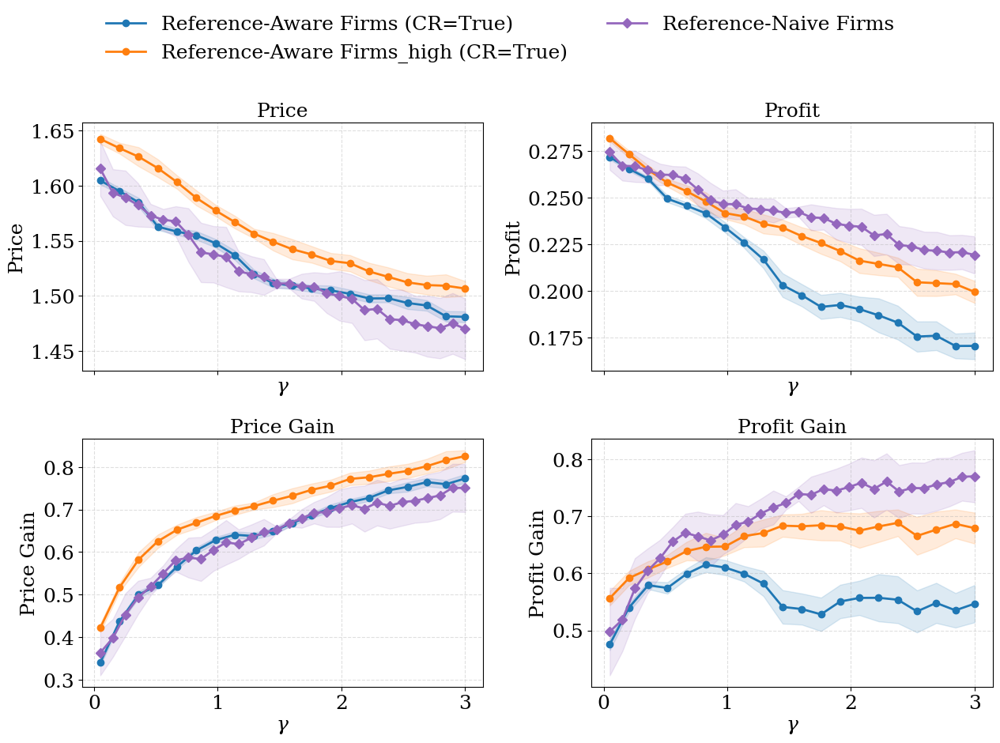

In [14]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
import os


# paths
folder   = "../Results_sockeye/experiments"
base     = "recreating_results/gamma_lambda"
base2     = "recreating_results/gamma"
metrics = ["Price", "Profit", "Price Gain", "Profit Gain"]

exp_dirs = {
    ('reference',        True) : os.path.join(folder, f"{base}_reference_True"),
    ('reference_high',   True) : os.path.join(folder, f"{base}_high_sessions_2_reference_True"),
    ('reference',        False): os.path.join(folder, f"{base}_reference_False"),
    ('misspecification', True) : os.path.join(folder, f"{base}_misspecification_True"),
    ('misspecification_high', True) : os.path.join(folder, f"{base}_high_sessions_2_misspecification_True"),
    ('misspecification', False): os.path.join(folder, f"{base}_misspecification_False"),
    #  add the q‑learning folders:
    ('qlr_reference',    True) : os.path.join(folder, f"{base2}_only_reference_True"),
    ('qlr_reference',    False): os.path.join(folder, f"{base2}_only_reference_False"),
}

# ------------------------------------------------------------------
# 2×2 “quad” figure with ONE legend
# ------------------------------------------------------------------
plt.rcParams.update({
    'font.size': 18,         # General font size
    'axes.titlesize': 18,    # Subplot title
    'axes.labelsize': 18,    # Axis labels
    'xtick.labelsize': 18,   # X-axis tick labels
    'ytick.labelsize': 18,   # Y-axis tick labels
    'legend.fontsize': 18,   # Legend text
})
fig_q, axes = plt.subplots(2, 2, figsize=(13, 9), sharex=True)
metric_axes = dict(zip(metrics, axes.flatten()))   # map metric → subplot

metrics = ["Price", "Profit", "Price Gain", "Profit Gain"]

# ———————————————
# plotting
ref_color = 'tab:blue'
mis_color = 'tab:orange'
qlr_color= 'tab:purple'


# we’ll collect the handles once (first metric) for the global legend
handles_for_legend, labels_for_legend = None, None

for metric_name in metrics:
    ax = metric_axes[metric_name]

    # ---------- grid‑search curves ----------
    for demand, cr in [('reference', True), 
                       #('reference_high',   True),  
                       ('misspecification', True),
                       #('misspecification_high', True)
                       ]:
        γ, μ, σ = load_gamma_metric(exp_dirs[(demand, cr)], metric_name)
        color     = ref_color if (demand == 'reference' or demand == 'reference_high') else mis_color
        linestyle = '-' if cr else '--'
        marker    = 'o' if cr else ' '  # Different marker for CR=False
        label     = f"{demand.capitalize()} (CR={cr})"

        ln, = ax.plot(γ, μ, color=color, linestyle=linestyle,
                    marker=marker, linewidth=2, label=label)
        ax.fill_between(γ, μ-σ, μ+σ, color=color, alpha=0.15)

    # ---------- Q‑learning curves ----------
    for demand, cr in [#('qlr_reference',    True), 
                    ('qlr_reference',    True),  
                    #('qlr_reference',    False),
                    ]:
        γ, μ, σ = load_gamma_only_metric(exp_dirs[(demand, cr)], metric_name)
        linestyle = '-' if cr else '--'
        marker    = 'D' if cr else 'x'  # Different marker for CR=False
        label     = f"Q‑learning Ref (CR={cr})"

        ln, = ax.plot(γ, μ, color=qlr_color, linestyle=linestyle,
                    marker=marker, linewidth=2, label=label)
        ax.fill_between(γ, μ-σ, μ+σ, color=qlr_color, alpha=0.15)
        
    # axis cosmetics
    ax.set_title(metric_name)
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_ylabel(metric_name)                  # show y‑label on every panel                        # bottom row only
    ax.set_xlabel(r"$\gamma$")
    ax.set_ylabel(metric_name)

    # grab legend handles/labels once
    if handles_for_legend is None:
        handles_for_legend, labels_for_legend = ax.get_legend_handles_labels()
    
    labels_for_legend = [
        "Reference-Aware Firms (CR=True)",
        "Reference-Aware Firms_high (CR=True)",
        #"Reference-Aware Firms (CR=False)",
        "Reference-Naive Firms",
        "Reference-Naive Firms_high",
        # "Misspecification (CR=True)",
        # "Misspecification (CR=False)",
        "QLearning Reference Pred (CR=True)",
        "QLearning Reference Pred (CR=False)",
    ]

# ---------------- shared legend & layout ----------------
fig_q.legend(handles_for_legend,
             labels_for_legend,
             loc='lower center',        # anchor it to the top edge
             bbox_to_anchor=(0.5, 0.95),# (x‑centre, just above 1.0)
             ncol=2,                    # 3 columns  → 2 rows of labels
             frameon=False)

# leave 10 % of the height for that legend bar
fig_q.tight_layout(rect=[0, 0, 1, 0.95])

quad_fname = "gamma_all6_quad.png"
fig_q.savefig(os.path.join(out_dir, quad_fname), dpi=300,
              bbox_inches='tight')



Generating 4x3 comparative heatmap for recreating_results/gamma_lambda (CR=True)...
Loading data for all metrics and scenarios...
Data loading complete.
Figure saved to ../Results_sockeye/experiments/recreating_results/gamma_lambda/Comparative_Figures_4x3_v2/gamma_lambda_4x3_ref_vs_miss_cr_true_comparison.png


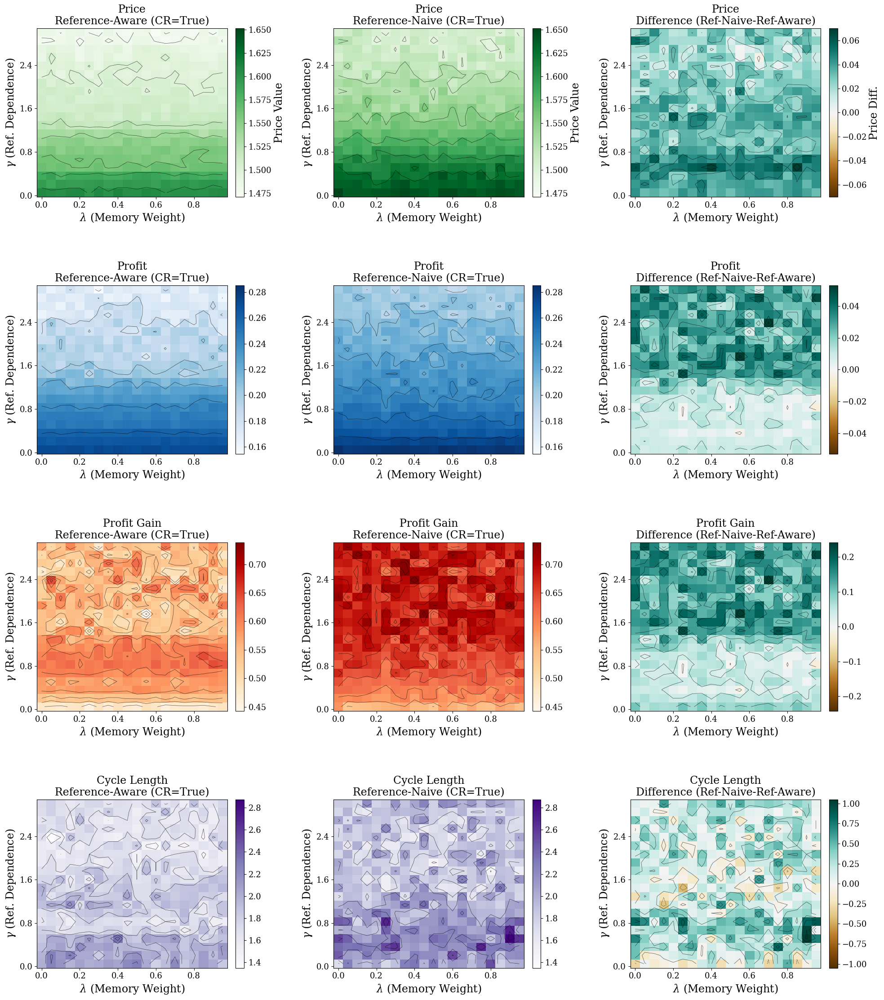

In [16]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as mticker
import numpy as np
import pandas as pd
import os
from glob import glob

# --- Placeholder/Assumed Helper Functions (If used by your actual data extraction) ---
def extract_min_max_price_metric(run_dir):
    # This is a placeholder. If your 'extract_metric_data_gl' or plotting relies on it,
    # you need your actual implementation.
    # print(f"Placeholder: extract_min_max_price_metric called for {run_dir}")
    return np.nan, np.nan

def replace_nans_and_zeros(data_grid, original_data_values=None, replacement_method='nan'):
    # This is a placeholder. The plot_heatmap_on_ax currently handles NaNs for imshow.
    # If you need specific zero replacement, implement it here.
    # print(f"Placeholder: replace_nans_and_zeros called.")
    return np.copy(data_grid)

# --- Enhanced Plotting Parameters ---
plt.rcParams.update({
    'font.size': 17,
    'axes.titlesize': 17,
    'axes.labelsize': 17,
    'xtick.labelsize': 13,
    'ytick.labelsize': 13,
    'figure.titlesize': 16,
    'font.family': 'serif',
    'mathtext.fontset': 'dejavuserif',
})

# --- Robust Data Extraction Function ---
def extract_metric_data_gl(experiment_dir_path, metric_name_display):
    gammas_list, lambdas_list, metrics_list = [], [], []
    
    if not os.path.isdir(experiment_dir_path):
        print(f"Warning: Experiment directory not found or not a directory: {experiment_dir_path}")
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)

    run_dirs = glob(os.path.join(experiment_dir_path, "gamma_*_lambda_*"))
    if not run_dirs:
        # print(f"Info: No run directories (gamma_*_lambda_*) found in {experiment_dir_path} for metric {metric_name_display}")
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)

    for run_dir in run_dirs:
        try:
            dir_name = os.path.basename(run_dir)
            parts_gamma = dir_name.split('gamma_')
            if len(parts_gamma) < 2: continue
            parts_lambda = parts_gamma[1].split('_lambda_')
            if len(parts_lambda) < 2: continue
            
            gamma_str = parts_lambda[0]
            lambda_str_full = parts_lambda[1]
            lambda_str = lambda_str_full.split('_')[0] 
            
            g_val = float(gamma_str)
            l_val = float(lambda_str)

            stats_file = os.path.join(run_dir, "cycle_statistics.csv")
            if os.path.exists(stats_file):
                df_stats = pd.read_csv(stats_file, on_bad_lines='skip') # Skip bad lines if any
                if not df_stats.empty:
                    metric_val_found = np.nan
                    
                    internal_metric_name = metric_name_display.lower().replace(" ", "_")
                    if metric_name_display == 'Cycle Length': # Specific handling for Cycle Length
                        col_prefix = 'mean_cycle_length' 
                    else: # General case for metrics like Price, Profit, Price Gain, Profit Gain
                        col_prefix = f'mean_{internal_metric_name}_p' # Assumes player suffix _pX

                    metric_columns = [col for col in df_stats.columns if col.startswith(col_prefix)]
                    
                    if metric_columns:
                        try:
                            # Ensure data is numeric before mean, convert errors to NaN
                            numeric_data = df_stats[metric_columns].apply(pd.to_numeric, errors='coerce')
                            if not numeric_data.empty and not numeric_data.isnull().all().all():
                                metric_val_found = numeric_data.mean(axis=1).iloc[0]
                        except (IndexError, TypeError, AttributeError) as e_inner:
                            # print(f"Inner error processing columns {metric_columns} in {stats_file}: {e_inner}")
                            metric_val_found = np.nan 
                    
                    if pd.notna(metric_val_found) and isinstance(metric_val_found, (int, float, np.number)):
                        gammas_list.append(g_val)
                        lambdas_list.append(l_val)
                        metrics_list.append(float(metric_val_found)) # Ensure float
            # else:
            #     print(f"Info: Stats file not found: {stats_file} (metric: {metric_name_display})")
        except Exception as e:
            # print(f"Warning: Skipping {run_dir} for metric {metric_name_display} due to error: {e}")
            continue
            
    if not metrics_list:
        # print(f"Info: No valid data points extracted for {metric_name_display} from {experiment_dir_path}")
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)
        
    return np.array(gammas_list, dtype=float), np.array(lambdas_list, dtype=float), np.array(metrics_list, dtype=float)


# --- Helper to Plot Single Heatmap on an Axes ---
def plot_heatmap_on_ax(ax, gamma_coords, lambda_coords, data_grid, title, cmap, norm, 
                       show_contours=True, fig_for_cbar=None, cbar_label=""):
    if data_grid is None or data_grid.size == 0 or gamma_coords.size == 0 or lambda_coords.size == 0:
        ax.text(0.5, 0.5, "No Data", ha='center', va='center', transform=ax.transAxes, fontsize=10)
        ax.set_title(title, fontsize=plt.rcParams['axes.titlesize'])
        ax.set_xlabel(r"$\lambda$ (Memory Weight)", fontsize=plt.rcParams['axes.labelsize'])
        ax.set_ylabel(r"$\gamma$ (Ref. Dependence)", fontsize=plt.rcParams['axes.labelsize'])
        return None

    # Calculate extent for imshow to center pixels on ticks
    lambda_step = (lambda_coords[1] - lambda_coords[0]) / 2.0 if len(lambda_coords) > 1 else 0.5
    gamma_step = (gamma_coords[1] - gamma_coords[0]) / 2.0 if len(gamma_coords) > 1 else 0.5
    extent = [lambda_coords.min() - lambda_step, lambda_coords.max() + lambda_step,
              gamma_coords.min() - gamma_step, gamma_coords.max() + gamma_step]

    im = ax.imshow(data_grid, aspect='auto', origin='lower', extent=extent, cmap=cmap, norm=norm)
    
    ax.set_title(title, fontsize=plt.rcParams['axes.titlesize'])
    ax.set_xlabel(r"$\lambda$ (Memory Weight)", fontsize=plt.rcParams['axes.labelsize'])
    ax.set_ylabel(r"$\gamma$ (Ref. Dependence)", fontsize=plt.rcParams['axes.labelsize'])

    if len(lambda_coords) > 1 and len(lambda_coords) <=10 :
        ax.set_xticks(lambda_coords)
        ax.set_xticklabels([f"{val:.1f}" for val in lambda_coords], rotation=45, ha="right")
    else:
        ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=5, integer=False, prune='both'))
        ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))

    if len(gamma_coords) > 1 and len(gamma_coords) <=10:
        ax.set_yticks(gamma_coords)
        ax.set_yticklabels([f"{val:.1f}" for val in gamma_coords])
    else:
        ax.yaxis.set_major_locator(mticker.MaxNLocator(nbins=5, integer=False, prune='both'))
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))

    if show_contours and np.any(np.isfinite(data_grid)):
        grid_for_contour = np.nan_to_num(data_grid, nan=np.nanmedian(data_grid[np.isfinite(data_grid)])) if np.any(np.isfinite(data_grid)) else data_grid
        if np.any(np.isfinite(grid_for_contour)) and grid_for_contour.shape[0] > 1 and grid_for_contour.shape[1] > 1: # Contour needs >1 data point in each dim
             X, Y = np.meshgrid(lambda_coords, gamma_coords) # Meshgrid for contour
             ax.contour(X, Y, grid_for_contour, levels=6, colors="black", linewidths=0.5, alpha=0.7)

    if fig_for_cbar and cbar_label:
        # Position colorbar to the right of the current axes
        # This creates a new axes for the colorbar.
        # Adjust fraction and pad for size and spacing.
        # For a multi-plot figure, it's often better to manage colorbars globally
        # or per row/column using GridSpec or fig.add_axes.
        # This will add a colorbar to EACH plot that calls it with fig_for_cbar and cbar_label.
        cbar = fig_for_cbar.colorbar(im, ax=ax, label=cbar_label, fraction=0.046, pad=0.04) # pad=0.04 default
        cbar.ax.tick_params(labelsize=10)
    return im

# --- Main Function for 4x3 Comparative Heatmaps ---
def create_metric_comparison_heatmaps(experiment_dirs_map, metrics_to_plot_list, figsize=(18, 20)):
    n_rows = len(metrics_to_plot_list)
    n_cols = 3
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, squeeze=False) # squeeze=False ensures axes is always 2D

    metric_cmaps = {
        "Price": 'Greens', "Profit": 'Blues', "Profit Gain": 'OrRd', "Cycle Length": 'Purples'
    }
    diff_cmap = 'BrBG'
    loaded_data_cache = {} # Cache loaded data

    print("Loading data for all metrics and scenarios...")
    for metric_name_disp in metrics_to_plot_list:
        if metric_name_disp not in loaded_data_cache:
            loaded_data_cache[metric_name_disp] = {}
        g_r, l_r, m_r = extract_metric_data_gl(experiment_dirs_map[('reference', True)], metric_name_disp)
        g_m, l_m, m_m = extract_metric_data_gl(experiment_dirs_map[('misspecification', True)], metric_name_disp)
        loaded_data_cache[metric_name_disp]['ref'] = (g_r, l_r, m_r)
        loaded_data_cache[metric_name_disp]['mis'] = (g_m, l_m, m_m)
    print("Data loading complete.")

    for i, metric_name_disp in enumerate(metrics_to_plot_list):
        data_for_metric = loaded_data_cache[metric_name_disp]
        g_ref, l_ref, m_ref = data_for_metric['ref']
        g_mis, l_mis, m_mis = data_for_metric['mis']

        # Combine all unique gammas and lambdas for consistent grid dimensions
        g_all_coords_list = [g for g in [g_ref, g_mis] if g is not None and g.size > 0]
        l_all_coords_list = [l for l in [l_ref, l_mis] if l is not None and l.size > 0]

        if not g_all_coords_list or not l_all_coords_list:
            print(f"Skipping metric '{metric_name_disp}' due to missing coordinate data.")
            for j_col in range(n_cols): axes[i, j_col].text(0.5,0.5, "No Coords", ha='center',va='center')
            continue
            
        unique_g_coords = np.sort(np.unique(np.concatenate(g_all_coords_list).astype(float)))
        unique_l_coords = np.sort(np.unique(np.concatenate(l_all_coords_list).astype(float)))

        if unique_g_coords.size == 0 or unique_l_coords.size == 0 :
            print(f"Skipping metric '{metric_name_disp}' due to empty unique coordinates.")
            for j_col in range(n_cols): axes[i, j_col].text(0.5,0.5, "Empty Coords", ha='center',va='center')
            continue

        # Create common grids
        grid_ref_common = np.full((len(unique_g_coords), len(unique_l_coords)), np.nan)
        grid_mis_common = np.full((len(unique_g_coords), len(unique_l_coords)), np.nan)

        if m_ref is not None and m_ref.size > 0:
            for g, l, val in zip(g_ref, l_ref, m_ref):
                idx_g, idx_l = np.argmin(np.abs(unique_g_coords - g)), np.argmin(np.abs(unique_l_coords - l))
                grid_ref_common[idx_g, idx_l] = val
        if m_mis is not None and m_mis.size > 0:
            for g, l, val in zip(g_mis, l_mis, m_mis):
                idx_g, idx_l = np.argmin(np.abs(unique_g_coords - g)), np.argmin(np.abs(unique_l_coords - l))
                grid_mis_common[idx_g, idx_l] = val
        
        # Determine vmin/vmax for the first two columns (absolute values)
        valid_metrics_abs = []
        if np.any(np.isfinite(grid_ref_common)): valid_metrics_abs.extend(grid_ref_common[np.isfinite(grid_ref_common)])
        if np.any(np.isfinite(grid_mis_common)): valid_metrics_abs.extend(grid_mis_common[np.isfinite(grid_mis_common)])
        
        if not valid_metrics_abs:
            print(f"No valid finite data for absolute plots of metric: {metric_name_disp}")
            vmin_abs, vmax_abs = 0, 1 # Default if no data
        else:
            vmin_abs, vmax_abs = np.min(valid_metrics_abs), np.max(valid_metrics_abs)
            if vmin_abs == vmax_abs: vmin_abs -=0.01; vmax_abs +=0.01 # Avoid flat colormap

        norm_abs = mcolors.Normalize(vmin=vmin_abs, vmax=vmax_abs)
        cmap_abs_val = metric_cmaps.get(metric_name_disp, 'viridis')

        # Col 1: Reference (CR=True)
        im_ref = plot_heatmap_on_ax(axes[i, 0], unique_g_coords, unique_l_coords, grid_ref_common,
                                   f"{metric_name_disp}\nReference-Aware (CR=True)", cmap_abs_val, norm_abs)
        
        # Col 2: Misspecification (CR=True)
        im_mis = plot_heatmap_on_ax(axes[i, 1], unique_g_coords, unique_l_coords, grid_mis_common,
                                   f"{metric_name_disp}\nReference-Naive (CR=True)", cmap_abs_val, norm_abs)

        # Col 3: Difference (Miss - Ref)
        grid_diff = grid_mis_common - grid_ref_common
        valid_diffs = grid_diff[np.isfinite(grid_diff)]
        
        if valid_diffs.size > 0:
            vcenter_d = 0
            abs_max_d = np.max(np.abs(valid_diffs - vcenter_d)) if valid_diffs.size >0 else 0.1
            vmin_d, vmax_d = vcenter_d - abs_max_d, vcenter_d + abs_max_d
            if vmin_d == vmax_d: vmin_d -=0.01; vmax_d +=0.01
            norm_d = mcolors.TwoSlopeNorm(vcenter=vcenter_d, vmin=vmin_d, vmax=vmax_d)
            im_diff = plot_heatmap_on_ax(axes[i, 2], unique_g_coords, unique_l_coords, grid_diff,
                                       f"{metric_name_disp}\nDifference (Ref-Naive-Ref-Aware)", diff_cmap, norm_d)
        else:
            axes[i,2].text(0.5,0.5,"No Diff Data",ha='center',va='center')
            axes[i,2].set_title(f"{metric_name_disp}\nDifference (Ref-Naive-Ref-Aware)")
            im_diff = None
            
        # Add shared colorbars per row to the right
        if i == 0: # Add labels only to the first row's colorbars
             if im_ref: fig.colorbar(im_ref, ax=axes[i,0], label=f"{metric_name_disp} Value", fraction=0.046, pad=0.04)
             if im_mis: fig.colorbar(im_mis, ax=axes[i,1], label=f"{metric_name_disp} Value", fraction=0.046, pad=0.04) # Redundant if same scale
             if im_diff: fig.colorbar(im_diff, ax=axes[i,2], label=f"{metric_name_disp} Diff.", fraction=0.046, pad=0.04)
        else:
             if im_ref: fig.colorbar(im_ref, ax=axes[i,0], fraction=0.046, pad=0.04)
             if im_mis: fig.colorbar(im_mis, ax=axes[i,1], fraction=0.046, pad=0.04)
             if im_diff: fig.colorbar(im_diff, ax=axes[i,2], fraction=0.046, pad=0.04)


    # fig.suptitle("Market Outcome Comparison: Reference vs. Misspecification (Common Reference = True)",
    #              fontsize=plt.rcParams['figure.titlesize'], y=0.995) # y slightly adjusted
    
    fig.tight_layout(rect=[0, 0.02, 1, 0.96], h_pad=3.5, w_pad=1.5) # rect adjusted, h_pad increased

    return fig

# --- Main Execution Logic ---
if __name__ == "__main__":
    folder_location = "../Results_sockeye/experiments" 
    experiment_base_pattern = "recreating_results/gamma_lambda" 

    # exp_dirs_for_plot = {
    #     ('reference', True): os.path.join(folder_location, f"{experiment_base_pattern}_high_sessions_2_reference_True"),
    #     ('misspecification', True): os.path.join(folder_location, f"{experiment_base_pattern}_high_sessions_2_misspecification_True")
    # }
    exp_dirs_for_plot = {
        ('reference', True): os.path.join(folder_location, f"{experiment_base_pattern}_reference_True"),
        ('misspecification', True): os.path.join(folder_location, f"{experiment_base_pattern}_misspecification_True")
    }
    
    all_paths_exist = True
    for key, path in exp_dirs_for_plot.items():
        if not os.path.isdir(path):
            print(f"FATAL: Experiment directory not found: {path}")
            all_paths_exist = False
    if not all_paths_exist:
        print("Please check your 'folder_location' and 'experiment_base_pattern'. Exiting.")
        exit()

    metrics_for_rows = ["Price", "Profit", "Profit Gain", "Cycle Length"]

    output_fig_dir = os.path.join(folder_location, experiment_base_pattern, "Comparative_Figures_4x3_v2") # New folder
    os.makedirs(output_fig_dir, exist_ok=True)

    print(f"Generating 4x3 comparative heatmap for {experiment_base_pattern} (CR=True)...")
    comparative_fig = create_metric_comparison_heatmaps(
        experiment_dirs_map=exp_dirs_for_plot,
        metrics_to_plot_list=metrics_for_rows,
        figsize=(20, 24) # Adjusted figsize for 4 rows, and more width for colorbars
    )

    fname = "gamma_lambda_4x3_ref_vs_miss_cr_true_comparison.png"
    comparative_fig.savefig(os.path.join(output_fig_dir, fname), dpi=300)
    print(f"Figure saved to {os.path.join(output_fig_dir, fname)}")
    plt.show()

***

In [1]:
import os
import numpy as np
import pandas as pd
from glob import glob

def _pick_metric_from_df(df: pd.DataFrame, metric_name: str):
    """Return (mean_value, std_value, count_value or None)."""
    if metric_name == "Cycle Length":
        mval = float(df["mean_cycle_length"].iloc[0])
        sval = float(df["std_cycle_length"].iloc[0]) if "std_cycle_length" in df.columns else np.nan
        nval = int(df["n_cycle_length"].iloc[0]) if "n_cycle_length" in df.columns else None
        return mval, sval, nval

    if metric_name == "Surplus":
        mval = float(df["mean_consumer_surplus"].iloc[0])
        sval = float(df["std_consumer_surplus"].iloc[0]) if "std_consumer_surplus" in df.columns else np.nan
        nval = int(df["n_consumer_surplus"].iloc[0]) if "n_consumer_surplus" in df.columns else None
        return mval, sval, nval

    key = metric_name.lower().replace(" ", "_")

    # Aggregate across product-specific columns (p1, p2, …) the same way you do now
    mean_cols = [c for c in df.columns if c.startswith(f"mean_{key}_p")]
    std_cols  = [c for c in df.columns if c.startswith(f"std_{key}_p")]
    # Optional counts per product if present (e.g., count_price_p1)
    cnt_cols  = [c for c in df.columns if c.startswith(f"count_{key}_p") or c.startswith(f"n_{key}_p")]

    if not mean_cols:
        return np.nan, np.nan, None

    # Per-run mean over products (same as your old behavior)
    mval = df[mean_cols].mean(axis=1).iloc[0]

    # Per-run std: average the stds across products if available, otherwise NaN
    sval = df[std_cols].mean(axis=1).iloc[0] if std_cols else np.nan

    # Per-run effective count: sum counts across products if present
    if cnt_cols:
        nval = int(df[cnt_cols].sum(axis=1).iloc[0])
    else:
        # If there's a single row summarizing many observations but no explicit counts,
        # leave as None — we’ll fall back to a weighted-variance approximation.
        nval = None

    return float(mval), float(sval) if np.isfinite(sval) else np.nan, nval


def load_gamma_metric_n(experiment_dir, metric_name):
    """
    Pool all runs (all lambdas) at each gamma when computing the std.
    Mean stays the same as averaging run means; std becomes the pooled std across runs.
    """
    pattern = "gamma_*_lambda_*"
    run_dirs = glob(os.path.join(experiment_dir, pattern))

    rows = []  # list of dicts: {"gamma": γ, "m": m_i, "s": s_i, "n": n_i}
    for run in run_dirs:
        base = os.path.basename(run)
        try:
            γ = float(base.split('gamma_')[1].split('_lambda_')[0])
        except Exception:
            continue

        stats_file = os.path.join(run, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            continue

        df = pd.read_csv(stats_file)
        mval, sval, nval = _pick_metric_from_df(df, metric_name)
        if not np.isfinite(mval):
            continue

        rows.append({"gamma": γ, "m": float(mval),
                     "s": float(sval) if np.isfinite(sval) else np.nan,
                     "n": int(nval) if (nval is not None and nval > 0) else None})

    if not rows:
        raise ValueError(f"No data in {experiment_dir} for '{metric_name}'")

    df_all = pd.DataFrame(rows)

    out = []
    for γ, gdf in df_all.groupby("gamma"):
        ms = gdf["m"].values
        ss = gdf["s"].values
        ns = gdf["n"].values  # may contain None

        # Unweighted mean to preserve your old curve
        mbar = float(np.mean(ms))

        # Counts where present; else weight=1
        has_any_counts = np.any(pd.notna(ns))
        w = np.array([n if (n is not None and n > 0) else 1 for n in ns], dtype=float)

        if has_any_counts and np.all(np.isfinite(ss)):
            # unbiased pooled variance around UNWEIGHTED mean mbar
            num_within  = np.sum([(n-1)*(s**2) for n, s in zip(w, ss)])
            num_between = np.sum([n*((m - mbar)**2) for n, m in zip(w, ms)])
            denom = np.sum(w) - 1
            svar = (num_within + num_between) / denom if denom > 0 else 0.0
            sbar = float(np.sqrt(max(svar, 0.0)))
            n_eff = int(np.sum(w))  # effective N when counts exist
        else:
            # fallback: total variance ≈ mean(within) + var(means)
            within  = float(np.nanmean(ss**2)) if np.any(np.isfinite(ss)) else 0.0
            between = float(np.var(ms, ddof=1)) if len(ms) > 1 else 0.0
            sbar = float(np.sqrt(max(within + between, 0.0)))
            n_eff = int(len(ms))  # fall back to number of runs

        out.append((γ, mbar, sbar, n_eff))

    out.sort(key=lambda x: x[0])
    gammas = np.array([t[0] for t in out])
    means  = np.array([t[1] for t in out])
    stds   = np.array([t[2] for t in out])
    n_eff  = np.array([t[3] for t in out])
    return gammas, means, stds, n_eff



# ———————————————
# NEW: loader for gamma‑only runs
def load_gamma_only_metric(experiment_dir, metric_name):
    pattern = "gamma_*"
    run_dirs = glob(os.path.join(experiment_dir, pattern))

    gammas, means, stds = [], [], []
    for run in run_dirs:
        base = os.path.basename(run)
        try:
            γ = float(base.split("gamma_")[1])
        except:
            continue

        stats_file = os.path.join(run, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            continue

        df = pd.read_csv(stats_file)
        # pick your metric exactly as in load_gamma_metric,
        # but also grab std from 'std_<metric>_p*' columns:
        key = metric_name.lower().replace(" ", "_")
        mean_cols = [c for c in df.columns if c.startswith(f"mean_{key}_p")]
        std_cols  = [c for c in df.columns if c.startswith(f"std_{key}_p")]

        if not mean_cols or not std_cols:
            continue

        mval = df[mean_cols].mean(axis=1).iloc[0]
        sval = df[std_cols].mean(axis=1).iloc[0]

        gammas.append(γ)
        means.append(mval)
        stds.append(sval)

    if not gammas:
        raise ValueError(f"No γ-only data in {experiment_dir} for '{metric_name}'")

    # sort by γ
    idx = np.argsort(gammas)
    return (np.array(gammas)[idx],
            np.array(means)[idx],
            np.array(stds)[idx])



NameError: name 'out_dir' is not defined

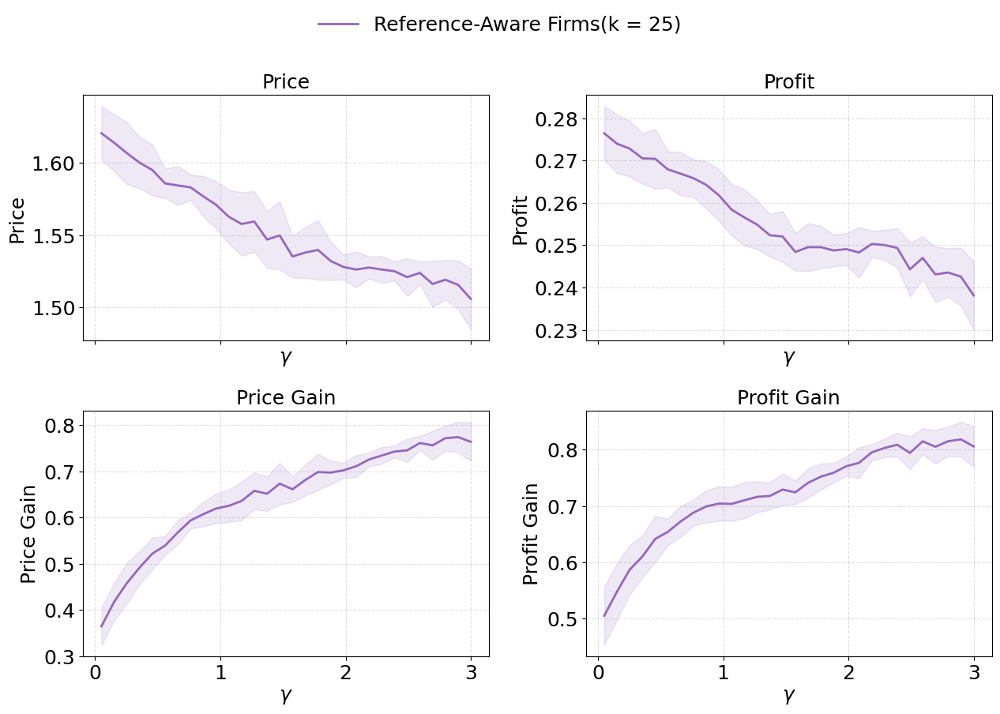

In [4]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
import os


# paths
folder   = "../Results/experiments"
base     = "noloss/gamma_lambda"
base2    = "final_gamma_only_no_loss_aversion/gamma"
base3    = "recreating_results_code2/gamma"
base4    = "k25/gamma"
metrics = ["Price", "Profit", "Price Gain", "Profit Gain"]

exp_dirs = {
    ('reference',        True) : os.path.join(folder, f"{base}_reference_True"),
    ('reference_high',   True) : os.path.join(folder, f"{base}_high_sessions_2_reference_True"),
    ('reference',        False): os.path.join(folder, f"{base}_reference_False"),
    ('misspecification', True) : os.path.join(folder, f"{base}_misspecification_True"),
    ('misspecification_high', True) : os.path.join(folder, f"{base}_high_sessions_2_misspecification_True"),
    ('misspecification', False): os.path.join(folder, f"{base}_misspecification_False"),
    #  add the q‑learning folders:
    ('qlr_reference',    True) : os.path.join(folder, f"{base2}_only_reference_True"),
    ('qlr_reference',    False): os.path.join(folder, f"{base2}_only_reference_False"),
    ('qlr_reference_nloss',    True) : os.path.join(folder, f"{base3}_nloss_only_reference_True"),
    ('qlr_reference_nloss',    False): os.path.join(folder, f"{base3}_nloss_only_reference_False"),
    ('qlr_reference_k25',    True) : os.path.join(folder, f"{base3}_only_reference_True"),
    ('qlr_misspecification_nloss',    True) : os.path.join(folder, f"{base3}_nloss_only_misspecification_True"),
    ('qlr_misspecification',    True) : os.path.join(folder, f"{base2}_only_misspecification_True"),
    ('qlr_misspecification',    False): os.path.join(folder, f"{base2}_only_misspecification_False"),
    ('qlr_reference_c0',    True): os.path.join(folder, f"{base3}_nloss_only_reference_Truec_0"),
    ('qlr_reference_mu0',    True): os.path.join(folder, f"{base3}_nloss_only_reference_Truemu_0"),
}

# ------------------------------------------------------------------
# 2×2 “quad” figure with ONE legend
# ------------------------------------------------------------------
plt.rcParams.update({
    'font.size': 18,         # General font size
    'axes.titlesize': 18,    # Subplot title
    'axes.labelsize': 18,    # Axis labels
    'xtick.labelsize': 18,   # X-axis tick labels
    'ytick.labelsize': 18,   # Y-axis tick labels
    'legend.fontsize': 18,   # Legend text
})
fig_q, axes = plt.subplots(2, 2, figsize=(13, 9), sharex=True)
metric_axes = dict(zip(metrics, axes.flatten()))   # map metric → subplot

metrics = ["Price", "Profit", "Price Gain", "Profit Gain"]

# ———————————————
# plotting
ref_color = 'tab:blue'
mis_color = 'tab:orange'
qlr_color= 'tab:purple'
qlr_miss_color = 'tab:red'
# --- styles so lines look different without new colors ---
qlr_base_color = qlr_color   # keep your purple

# dash patterns: (offset, (on, off, on, off, ...))
STYLE_MAP = {
    ('qlr_reference_nloss', True): dict(ls='-',              lw=3.0, band_alpha=0.18),        # solid, thicker (MAIN)
    ('qlr_reference_c0',    True): dict(ls=(0, (6, 3)),      lw=2.2, band_alpha=0.12),        # dashed  —–– ––– –––
    ('qlr_reference_mu0',   True): dict(ls=(0, (1, 2)),      lw=2.2, band_alpha=0.12),        # dotted  ·· ·· ··
}

LABEL_MAP = {
    ('qlr_reference_nloss', True): "QLR (baseline, no loss)",
    ('qlr_reference_c0',    True): "QLR (c ↓, μ same)",
    ('qlr_reference_mu0',   True): "QLR (μ ↓, c same)",
}



# we’ll collect the handles once (first metric) for the global legend
handles_for_legend, labels_for_legend = None, None

for metric_name in metrics:
    ax = metric_axes[metric_name]

    # ---------- grid-search curves ----------
    for demand, cr in [#('reference', True),
                       #('reference', False)
                       #('misspecification', True)
                       ]:
        γ, μ, σ, n_eff = load_gamma_metric_n(exp_dirs[(demand, cr)], metric_name)

        color     = ref_color if (demand in {'reference','reference_high'}) else mis_color
        linestyle = '-' if cr else '--'
        #marker    = 'o' if cr else ' '
        marker    = ' '
        label     = f"{demand.capitalize()} (CR={cr})"

        # mask + standard error & CI
        m = np.isfinite(γ) & np.isfinite(μ) & np.isfinite(σ) & np.isfinite(n_eff) & (n_eff > 0)
        se     = σ[m] / np.sqrt(n_eff[m])
        lower  = μ[m] - 1.8 * se
        upper  = μ[m] + 1.8 * se

        ln, = ax.plot(γ[m], μ[m], color=color, linestyle=linestyle, marker=marker,
                      linewidth=2, label=label)
        ax.fill_between(γ[m], lower, upper, color=color, alpha=0.15)


    # ---------- Q‑learning curves ----------
    for demand, cr in [#('qlr_reference',    True), 
                       #('qlr_reference',    False),  
                       ('qlr_reference_nloss',    True),
                       #('qlr_misspecification_nloss',    True),
                       #('qlr_reference_nloss',    False)
                       #('qlr_reference_k25',    True),
                       #('qlr_reference',    False),
                       #('qlr_reference_c0',    True),
                       #('qlr_reference_mu0',    True)
                    ]:
        γ, μ, σ = load_gamma_only_metric(exp_dirs[(demand, cr)], metric_name)

        color     = qlr_color if (demand in {'qlr_reference','qlr_reference_nloss','qlr_reference_k25'}) else qlr_miss_color
        linestyle = '-' if cr else '--'
        #marker    = 'D' if cr else 'x'  # Different marker for CR=False
        marker    = ' '
        if demand == 'qlr_reference_k25':
            marker = '*'
        
        label     = f"Q‑learning Ref (CR={cr})"

        ln, = ax.plot(γ, μ, color=color, linestyle=linestyle,
                    marker=marker, linewidth=2, label=label)
        ax.fill_between(γ, μ-0.8*σ, μ+0.8*σ, color=color, alpha=0.15)


        # st = STYLE_MAP[(demand, cr)]
        # ln, = ax.plot(
        #     γ, μ,
        #     color=qlr_base_color,
        #     linestyle=st['ls'],
        #     linewidth=st['lw'],
        #     marker=None,
        #     label=LABEL_MAP[(demand, cr)],
        # )
        # ax.fill_between(γ, μ - 0.8*σ, μ + 0.8*σ,
        #                 color=qlr_base_color, alpha=st['band_alpha'])
            
    # axis cosmetics
    ax.set_title(metric_name)
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_ylabel(metric_name)                  # show y‑label on every panel                        # bottom row only
    ax.set_xlabel(r"$\gamma$")
    ax.set_ylabel(metric_name)

    # grab legend handles/labels once
    if handles_for_legend is None:
        handles_for_legend, labels_for_legend = ax.get_legend_handles_labels()
    
    labels_for_legend = [
        #"Reference-Aware Firms (CR=True)",
        #"Exp Smoothing Reference Pred",
        #"Reference-Aware Firms Exp Smoothing",
        "Reference-Aware Firms(k = 25)",
        "Reference-Aware Firms(k = 15)"
       # "Reference-Aware Firms (CR=False)",
        #"Reference-Aware Firms (CR=True)",
        #"Reference-Naive Firms Exp Smoothing",
        #"Reference-Aware QLR ref Firms (CR=True)",
        #"Reference-Naive QLR ref Firms (CR=True)",
        #"QLearning Reference Pred",
        # "Misspecification (CR=True)",
        # "Misspecification (CR=False)",
        #"QLearning Reference Pred (CR=True)",
        #"QLearning Reference Pred (CR=False)",
        # "baseline(c = 1, $\mu$ = 0.25)",
        # "(c ↓, $\mu$ = 0.25)",
        # "(c = 1, μ ↓)",
    ]

# ---------------- shared legend & layout ----------------
fig_q.legend(handles_for_legend,
             labels_for_legend,
             loc='lower center',        # anchor it to the top edge
             bbox_to_anchor=(0.5, 0.95),# (x‑centre, just above 1.0)
             ncol=2,                    # 3 columns  → 2 rows of labels
             frameon=False)

# leave 10 % of the height for that legend bar
fig_q.tight_layout(rect=[0, 0, 1, 0.95])

quad_fname = "gamma_all6_quad.png"
fig_q.savefig(os.path.join(out_dir, quad_fname), dpi=300,
              bbox_inches='tight')



Generating 4x3 comparative heatmap for noloss/gamma_lambda (CR=True)...
Loading data for all metrics and scenarios...
Data loading complete.
Figure saved to ../Results/experiments/noloss/gamma_lambda/Comparative_Figures_4x3_v2/gamma_lambda_4x3_ref_vs_miss_cr_true_comparison.png


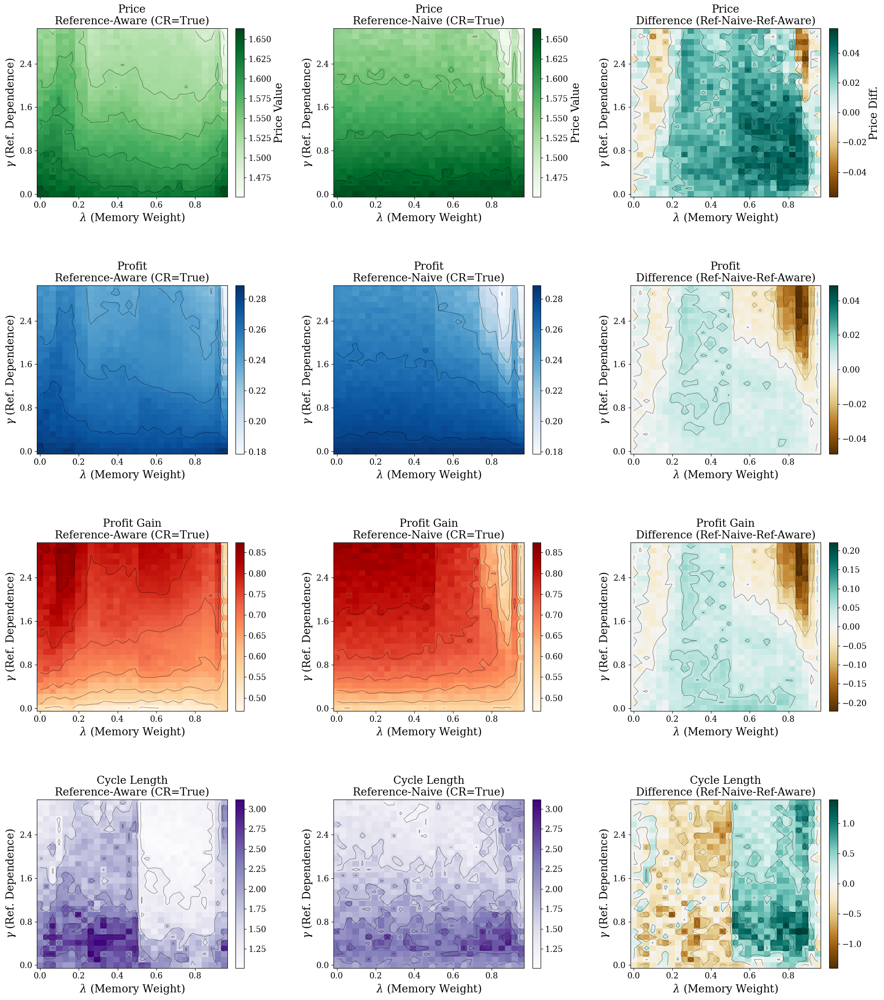

In [29]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as mticker
import numpy as np
import pandas as pd
import os
from glob import glob

# --- Placeholder/Assumed Helper Functions (If used by your actual data extraction) ---
def extract_min_max_price_metric(run_dir):
    # This is a placeholder. If your 'extract_metric_data_gl' or plotting relies on it,
    # you need your actual implementation.
    # print(f"Placeholder: extract_min_max_price_metric called for {run_dir}")
    return np.nan, np.nan

def replace_nans_and_zeros(data_grid, original_data_values=None, replacement_method='nan'):
    # This is a placeholder. The plot_heatmap_on_ax currently handles NaNs for imshow.
    # If you need specific zero replacement, implement it here.
    # print(f"Placeholder: replace_nans_and_zeros called.")
    return np.copy(data_grid)

# --- Enhanced Plotting Parameters ---
plt.rcParams.update({
    'font.size': 17,
    'axes.titlesize': 17,
    'axes.labelsize': 17,
    'xtick.labelsize': 13,
    'ytick.labelsize': 13,
    'figure.titlesize': 16,
    'font.family': 'serif',
    'mathtext.fontset': 'dejavuserif',
})

# --- Robust Data Extraction Function ---
def extract_metric_data_gl(experiment_dir_path, metric_name_display):
    gammas_list, lambdas_list, metrics_list = [], [], []
    
    if not os.path.isdir(experiment_dir_path):
        print(f"Warning: Experiment directory not found or not a directory: {experiment_dir_path}")
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)

    run_dirs = glob(os.path.join(experiment_dir_path, "gamma_*_lambda_*"))
    if not run_dirs:
        # print(f"Info: No run directories (gamma_*_lambda_*) found in {experiment_dir_path} for metric {metric_name_display}")
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)

    for run_dir in run_dirs:
        try:
            dir_name = os.path.basename(run_dir)
            parts_gamma = dir_name.split('gamma_')
            if len(parts_gamma) < 2: continue
            parts_lambda = parts_gamma[1].split('_lambda_')
            if len(parts_lambda) < 2: continue
            
            gamma_str = parts_lambda[0]
            lambda_str_full = parts_lambda[1]
            lambda_str = lambda_str_full.split('_')[0] 
            
            g_val = float(gamma_str)
            l_val = float(lambda_str)

            stats_file = os.path.join(run_dir, "cycle_statistics.csv")
            if os.path.exists(stats_file):
                df_stats = pd.read_csv(stats_file, on_bad_lines='skip') # Skip bad lines if any
                if not df_stats.empty:
                    metric_val_found = np.nan
                    
                    internal_metric_name = metric_name_display.lower().replace(" ", "_")
                    if metric_name_display == 'Cycle Length': # Specific handling for Cycle Length
                        col_prefix = 'mean_cycle_length' 
                    else: # General case for metrics like Price, Profit, Price Gain, Profit Gain
                        col_prefix = f'mean_{internal_metric_name}_p' # Assumes player suffix _pX

                    metric_columns = [col for col in df_stats.columns if col.startswith(col_prefix)]
                    
                    if metric_columns:
                        try:
                            # Ensure data is numeric before mean, convert errors to NaN
                            numeric_data = df_stats[metric_columns].apply(pd.to_numeric, errors='coerce')
                            if not numeric_data.empty and not numeric_data.isnull().all().all():
                                metric_val_found = numeric_data.mean(axis=1).iloc[0]
                        except (IndexError, TypeError, AttributeError) as e_inner:
                            # print(f"Inner error processing columns {metric_columns} in {stats_file}: {e_inner}")
                            metric_val_found = np.nan 
                    
                    if pd.notna(metric_val_found) and isinstance(metric_val_found, (int, float, np.number)):
                        gammas_list.append(g_val)
                        lambdas_list.append(l_val)
                        metrics_list.append(float(metric_val_found)) # Ensure float
            # else:
            #     print(f"Info: Stats file not found: {stats_file} (metric: {metric_name_display})")
        except Exception as e:
            # print(f"Warning: Skipping {run_dir} for metric {metric_name_display} due to error: {e}")
            continue
            
    if not metrics_list:
        # print(f"Info: No valid data points extracted for {metric_name_display} from {experiment_dir_path}")
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)
        
    return np.array(gammas_list, dtype=float), np.array(lambdas_list, dtype=float), np.array(metrics_list, dtype=float)


# --- Helper to Plot Single Heatmap on an Axes ---
def plot_heatmap_on_ax(ax, gamma_coords, lambda_coords, data_grid, title, cmap, norm, 
                       show_contours=True, fig_for_cbar=None, cbar_label=""):
    if data_grid is None or data_grid.size == 0 or gamma_coords.size == 0 or lambda_coords.size == 0:
        ax.text(0.5, 0.5, "No Data", ha='center', va='center', transform=ax.transAxes, fontsize=10)
        ax.set_title(title, fontsize=plt.rcParams['axes.titlesize'])
        ax.set_xlabel(r"$\lambda$ (Memory Weight)", fontsize=plt.rcParams['axes.labelsize'])
        ax.set_ylabel(r"$\gamma$ (Ref. Dependence)", fontsize=plt.rcParams['axes.labelsize'])
        return None

    # Calculate extent for imshow to center pixels on ticks
    lambda_step = (lambda_coords[1] - lambda_coords[0]) / 2.0 if len(lambda_coords) > 1 else 0.5
    gamma_step = (gamma_coords[1] - gamma_coords[0]) / 2.0 if len(gamma_coords) > 1 else 0.5
    extent = [lambda_coords.min() - lambda_step, lambda_coords.max() + lambda_step,
              gamma_coords.min() - gamma_step, gamma_coords.max() + gamma_step]

    im = ax.imshow(data_grid, aspect='auto', origin='lower', extent=extent, cmap=cmap, norm=norm)
    
    ax.set_title(title, fontsize=plt.rcParams['axes.titlesize'])
    ax.set_xlabel(r"$\lambda$ (Memory Weight)", fontsize=plt.rcParams['axes.labelsize'])
    ax.set_ylabel(r"$\gamma$ (Ref. Dependence)", fontsize=plt.rcParams['axes.labelsize'])

    if len(lambda_coords) > 1 and len(lambda_coords) <=10 :
        ax.set_xticks(lambda_coords)
        ax.set_xticklabels([f"{val:.1f}" for val in lambda_coords], rotation=45, ha="right")
    else:
        ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=5, integer=False, prune='both'))
        ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))

    if len(gamma_coords) > 1 and len(gamma_coords) <=10:
        ax.set_yticks(gamma_coords)
        ax.set_yticklabels([f"{val:.1f}" for val in gamma_coords])
    else:
        ax.yaxis.set_major_locator(mticker.MaxNLocator(nbins=5, integer=False, prune='both'))
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))

    if show_contours and np.any(np.isfinite(data_grid)):
        grid_for_contour = np.nan_to_num(data_grid, nan=np.nanmedian(data_grid[np.isfinite(data_grid)])) if np.any(np.isfinite(data_grid)) else data_grid
        if np.any(np.isfinite(grid_for_contour)) and grid_for_contour.shape[0] > 1 and grid_for_contour.shape[1] > 1: # Contour needs >1 data point in each dim
             X, Y = np.meshgrid(lambda_coords, gamma_coords) # Meshgrid for contour
             ax.contour(X, Y, grid_for_contour, levels=6, colors="black", linewidths=0.5, alpha=0.7)

    if fig_for_cbar and cbar_label:
        # Position colorbar to the right of the current axes
        # This creates a new axes for the colorbar.
        # Adjust fraction and pad for size and spacing.
        # For a multi-plot figure, it's often better to manage colorbars globally
        # or per row/column using GridSpec or fig.add_axes.
        # This will add a colorbar to EACH plot that calls it with fig_for_cbar and cbar_label.
        cbar = fig_for_cbar.colorbar(im, ax=ax, label=cbar_label, fraction=0.046, pad=0.04) # pad=0.04 default
        cbar.ax.tick_params(labelsize=10)
    return im

# --- Main Function for 4x3 Comparative Heatmaps ---
def create_metric_comparison_heatmaps(experiment_dirs_map, metrics_to_plot_list, figsize=(18, 20)):
    n_rows = len(metrics_to_plot_list)
    n_cols = 3
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, squeeze=False) # squeeze=False ensures axes is always 2D

    metric_cmaps = {
        "Price": 'Greens', "Profit": 'Blues', "Profit Gain": 'OrRd', "Cycle Length": 'Purples'
    }
    diff_cmap = 'BrBG'
    loaded_data_cache = {} # Cache loaded data

    print("Loading data for all metrics and scenarios...")
    for metric_name_disp in metrics_to_plot_list:
        if metric_name_disp not in loaded_data_cache:
            loaded_data_cache[metric_name_disp] = {}
        g_r, l_r, m_r = extract_metric_data_gl(experiment_dirs_map[('reference', True)], metric_name_disp)
        g_m, l_m, m_m = extract_metric_data_gl(experiment_dirs_map[('misspecification', True)], metric_name_disp)
        loaded_data_cache[metric_name_disp]['ref'] = (g_r, l_r, m_r)
        loaded_data_cache[metric_name_disp]['mis'] = (g_m, l_m, m_m)
    print("Data loading complete.")

    for i, metric_name_disp in enumerate(metrics_to_plot_list):
        data_for_metric = loaded_data_cache[metric_name_disp]
        g_ref, l_ref, m_ref = data_for_metric['ref']
        g_mis, l_mis, m_mis = data_for_metric['mis']

        # Combine all unique gammas and lambdas for consistent grid dimensions
        g_all_coords_list = [g for g in [g_ref, g_mis] if g is not None and g.size > 0]
        l_all_coords_list = [l for l in [l_ref, l_mis] if l is not None and l.size > 0]

        if not g_all_coords_list or not l_all_coords_list:
            print(f"Skipping metric '{metric_name_disp}' due to missing coordinate data.")
            for j_col in range(n_cols): axes[i, j_col].text(0.5,0.5, "No Coords", ha='center',va='center')
            continue
            
        unique_g_coords = np.sort(np.unique(np.concatenate(g_all_coords_list).astype(float)))
        unique_l_coords = np.sort(np.unique(np.concatenate(l_all_coords_list).astype(float)))

        if unique_g_coords.size == 0 or unique_l_coords.size == 0 :
            print(f"Skipping metric '{metric_name_disp}' due to empty unique coordinates.")
            for j_col in range(n_cols): axes[i, j_col].text(0.5,0.5, "Empty Coords", ha='center',va='center')
            continue

        # Create common grids
        grid_ref_common = np.full((len(unique_g_coords), len(unique_l_coords)), np.nan)
        grid_mis_common = np.full((len(unique_g_coords), len(unique_l_coords)), np.nan)

        if m_ref is not None and m_ref.size > 0:
            for g, l, val in zip(g_ref, l_ref, m_ref):
                idx_g, idx_l = np.argmin(np.abs(unique_g_coords - g)), np.argmin(np.abs(unique_l_coords - l))
                grid_ref_common[idx_g, idx_l] = val
        if m_mis is not None and m_mis.size > 0:
            for g, l, val in zip(g_mis, l_mis, m_mis):
                idx_g, idx_l = np.argmin(np.abs(unique_g_coords - g)), np.argmin(np.abs(unique_l_coords - l))
                grid_mis_common[idx_g, idx_l] = val
        
        # Determine vmin/vmax for the first two columns (absolute values)
        valid_metrics_abs = []
        if np.any(np.isfinite(grid_ref_common)): valid_metrics_abs.extend(grid_ref_common[np.isfinite(grid_ref_common)])
        if np.any(np.isfinite(grid_mis_common)): valid_metrics_abs.extend(grid_mis_common[np.isfinite(grid_mis_common)])
        
        if not valid_metrics_abs:
            print(f"No valid finite data for absolute plots of metric: {metric_name_disp}")
            vmin_abs, vmax_abs = 0, 1 # Default if no data
        else:
            vmin_abs, vmax_abs = np.min(valid_metrics_abs), np.max(valid_metrics_abs)
            if vmin_abs == vmax_abs: vmin_abs -=0.01; vmax_abs +=0.01 # Avoid flat colormap

        norm_abs = mcolors.Normalize(vmin=vmin_abs, vmax=vmax_abs)
        cmap_abs_val = metric_cmaps.get(metric_name_disp, 'viridis')

        # Col 1: Reference (CR=True)
        im_ref = plot_heatmap_on_ax(axes[i, 0], unique_g_coords, unique_l_coords, grid_ref_common,
                                   f"{metric_name_disp}\nReference-Aware (CR=True)", cmap_abs_val, norm_abs)
        
        # Col 2: Misspecification (CR=True)
        im_mis = plot_heatmap_on_ax(axes[i, 1], unique_g_coords, unique_l_coords, grid_mis_common,
                                   f"{metric_name_disp}\nReference-Naive (CR=True)", cmap_abs_val, norm_abs)

        # Col 3: Difference (Miss - Ref)
        grid_diff = grid_mis_common - grid_ref_common
        valid_diffs = grid_diff[np.isfinite(grid_diff)]
        
        if valid_diffs.size > 0:
            vcenter_d = 0
            abs_max_d = np.max(np.abs(valid_diffs - vcenter_d)) if valid_diffs.size >0 else 0.1
            vmin_d, vmax_d = vcenter_d - abs_max_d, vcenter_d + abs_max_d
            if vmin_d == vmax_d: vmin_d -=0.01; vmax_d +=0.01
            norm_d = mcolors.TwoSlopeNorm(vcenter=vcenter_d, vmin=vmin_d, vmax=vmax_d)
            im_diff = plot_heatmap_on_ax(axes[i, 2], unique_g_coords, unique_l_coords, grid_diff,
                                       f"{metric_name_disp}\nDifference (Ref-Naive-Ref-Aware)", diff_cmap, norm_d)
        else:
            axes[i,2].text(0.5,0.5,"No Diff Data",ha='center',va='center')
            axes[i,2].set_title(f"{metric_name_disp}\nDifference (Ref-Naive-Ref-Aware)")
            im_diff = None
            
        # Add shared colorbars per row to the right
        if i == 0: # Add labels only to the first row's colorbars
             if im_ref: fig.colorbar(im_ref, ax=axes[i,0], label=f"{metric_name_disp} Value", fraction=0.046, pad=0.04)
             if im_mis: fig.colorbar(im_mis, ax=axes[i,1], label=f"{metric_name_disp} Value", fraction=0.046, pad=0.04) # Redundant if same scale
             if im_diff: fig.colorbar(im_diff, ax=axes[i,2], label=f"{metric_name_disp} Diff.", fraction=0.046, pad=0.04)
        else:
             if im_ref: fig.colorbar(im_ref, ax=axes[i,0], fraction=0.046, pad=0.04)
             if im_mis: fig.colorbar(im_mis, ax=axes[i,1], fraction=0.046, pad=0.04)
             if im_diff: fig.colorbar(im_diff, ax=axes[i,2], fraction=0.046, pad=0.04)


    # fig.suptitle("Market Outcome Comparison: Reference vs. Misspecification (Common Reference = True)",
    #              fontsize=plt.rcParams['figure.titlesize'], y=0.995) # y slightly adjusted
    
    fig.tight_layout(rect=[0, 0.02, 1, 0.96], h_pad=3.5, w_pad=1.5) # rect adjusted, h_pad increased

    return fig

# --- Main Execution Logic ---
if __name__ == "__main__":
    folder_location = "../Results/experiments" 
    experiment_base_pattern = "noloss/gamma_lambda" 

    # exp_dirs_for_plot = {
    #     ('reference', True): os.path.join(folder_location, f"{experiment_base_pattern}_high_sessions_2_reference_True"),
    #     ('misspecification', True): os.path.join(folder_location, f"{experiment_base_pattern}_high_sessions_2_misspecification_True")
    # }
    exp_dirs_for_plot = {
        ('reference', True): os.path.join(folder_location, f"{experiment_base_pattern}_reference_True"),
        ('misspecification', True): os.path.join(folder_location, f"{experiment_base_pattern}_misspecification_True")
    }
    
    all_paths_exist = True
    for key, path in exp_dirs_for_plot.items():
        if not os.path.isdir(path):
            print(f"FATAL: Experiment directory not found: {path}")
            all_paths_exist = False
    if not all_paths_exist:
        print("Please check your 'folder_location' and 'experiment_base_pattern'. Exiting.")
        exit()

    metrics_for_rows = ["Price", "Profit", "Profit Gain", "Cycle Length"]

    output_fig_dir = os.path.join(folder_location, experiment_base_pattern, "Comparative_Figures_4x3_v2") # New folder
    os.makedirs(output_fig_dir, exist_ok=True)

    print(f"Generating 4x3 comparative heatmap for {experiment_base_pattern} (CR=True)...")
    comparative_fig = create_metric_comparison_heatmaps(
        experiment_dirs_map=exp_dirs_for_plot,
        metrics_to_plot_list=metrics_for_rows,
        figsize=(20, 24) # Adjusted figsize for 4 rows, and more width for colorbars
    )

    fname = "gamma_lambda_4x3_ref_vs_miss_cr_true_comparison.png"
    comparative_fig.savefig(os.path.join(output_fig_dir, fname), dpi=300)
    print(f"Figure saved to {os.path.join(output_fig_dir, fname)}")
    plt.show()

***
## Low cost low $\mu$

In [22]:
import os
import numpy as np
import pandas as pd
from glob import glob

def _pick_metric_from_df(df: pd.DataFrame, metric_name: str):
    """Return (mean_value, std_value, count_value or None)."""
    if metric_name == "Cycle Length":
        mval = float(df["mean_cycle_length"].iloc[0])
        sval = float(df["std_cycle_length"].iloc[0]) if "std_cycle_length" in df.columns else np.nan
        nval = int(df["n_cycle_length"].iloc[0]) if "n_cycle_length" in df.columns else None
        return mval, sval, nval

    if metric_name == "Surplus":
        mval = float(df["mean_consumer_surplus"].iloc[0])
        sval = float(df["std_consumer_surplus"].iloc[0]) if "std_consumer_surplus" in df.columns else np.nan
        nval = int(df["n_consumer_surplus"].iloc[0]) if "n_consumer_surplus" in df.columns else None
        return mval, sval, nval

    key = metric_name.lower().replace(" ", "_")

    # Aggregate across product-specific columns (p1, p2, …) the same way you do now
    mean_cols = [c for c in df.columns if c.startswith(f"mean_{key}_p")]
    std_cols  = [c for c in df.columns if c.startswith(f"std_{key}_p")]
    # Optional counts per product if present (e.g., count_price_p1)
    cnt_cols  = [c for c in df.columns if c.startswith(f"count_{key}_p") or c.startswith(f"n_{key}_p")]

    if not mean_cols:
        return np.nan, np.nan, None

    # Per-run mean over products (same as your old behavior)
    mval = df[mean_cols].mean(axis=1).iloc[0]

    # Per-run std: average the stds across products if available, otherwise NaN
    sval = df[std_cols].mean(axis=1).iloc[0] if std_cols else np.nan

    # Per-run effective count: sum counts across products if present
    if cnt_cols:
        nval = int(df[cnt_cols].sum(axis=1).iloc[0])
    else:
        # If there's a single row summarizing many observations but no explicit counts,
        # leave as None — we’ll fall back to a weighted-variance approximation.
        nval = None

    return float(mval), float(sval) if np.isfinite(sval) else np.nan, nval


def load_gamma_metric_n(experiment_dir, metric_name):
    """
    Pool all runs (all lambdas) at each gamma when computing the std.
    Mean stays the same as averaging run means; std becomes the pooled std across runs.
    """
    pattern = "gamma_*_lambda_*"
    run_dirs = glob(os.path.join(experiment_dir, pattern))

    rows = []  # list of dicts: {"gamma": γ, "m": m_i, "s": s_i, "n": n_i}
    for run in run_dirs:
        base = os.path.basename(run)
        try:
            γ = float(base.split('gamma_')[1].split('_lambda_')[0])
        except Exception:
            continue

        stats_file = os.path.join(run, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            continue

        df = pd.read_csv(stats_file)
        mval, sval, nval = _pick_metric_from_df(df, metric_name)
        if not np.isfinite(mval):
            continue

        rows.append({"gamma": γ, "m": float(mval),
                     "s": float(sval) if np.isfinite(sval) else np.nan,
                     "n": int(nval) if (nval is not None and nval > 0) else None})

    if not rows:
        raise ValueError(f"No data in {experiment_dir} for '{metric_name}'")

    df_all = pd.DataFrame(rows)

    out = []
    for γ, gdf in df_all.groupby("gamma"):
        ms = gdf["m"].values
        ss = gdf["s"].values
        ns = gdf["n"].values  # may contain None

        # Unweighted mean to preserve your old curve
        mbar = float(np.mean(ms))

        # Counts where present; else weight=1
        has_any_counts = np.any(pd.notna(ns))
        w = np.array([n if (n is not None and n > 0) else 1 for n in ns], dtype=float)

        if has_any_counts and np.all(np.isfinite(ss)):
            # unbiased pooled variance around UNWEIGHTED mean mbar
            num_within  = np.sum([(n-1)*(s**2) for n, s in zip(w, ss)])
            num_between = np.sum([n*((m - mbar)**2) for n, m in zip(w, ms)])
            denom = np.sum(w) - 1
            svar = (num_within + num_between) / denom if denom > 0 else 0.0
            sbar = float(np.sqrt(max(svar, 0.0)))
            n_eff = int(np.sum(w))  # effective N when counts exist
        else:
            # fallback: total variance ≈ mean(within) + var(means)
            within  = float(np.nanmean(ss**2)) if np.any(np.isfinite(ss)) else 0.0
            between = float(np.var(ms, ddof=1)) if len(ms) > 1 else 0.0
            sbar = float(np.sqrt(max(within + between, 0.0)))
            n_eff = int(len(ms))  # fall back to number of runs

        out.append((γ, mbar, sbar, n_eff))

    out.sort(key=lambda x: x[0])
    gammas = np.array([t[0] for t in out])
    means  = np.array([t[1] for t in out])
    stds   = np.array([t[2] for t in out])
    n_eff  = np.array([t[3] for t in out])
    return gammas, means, stds, n_eff




***

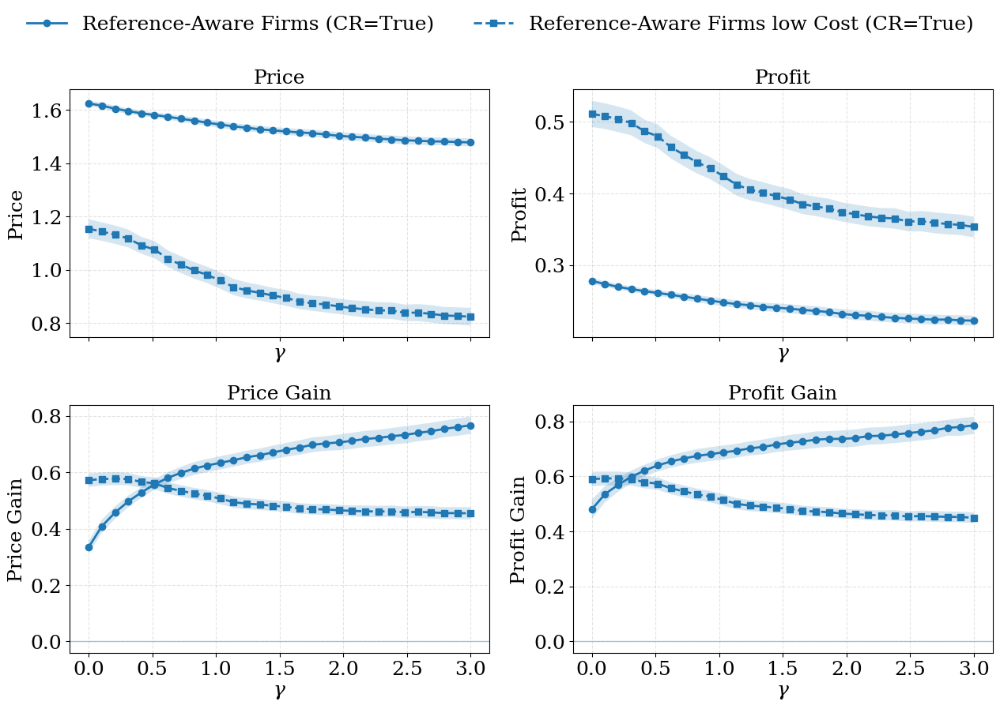

In [27]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# --- output folder ---
out_dir = "./plots"
os.makedirs(out_dir, exist_ok=True)

# --- styles: hue = family, style = variant ---
COL_GRID = "#1f77b4"   # blue   (grid-search reference)
COL_QLR  = "#7f3c8d"   # purple (Q-learning)

# paths
folder   = "../Results_sockeye/experiments"
base     = "recreating_results/gamma_lambda_high"
base2     = "recreating_results/gamma"

exp_dirs = {
    ('reference',        True) : os.path.join(folder, f"{base}_reference_True"),
    ('reference_low',   True) : os.path.join(folder, f"{base}_lowc_lowmu_30_reference_True"),
    ('reference',        False): os.path.join(folder, f"{base}_reference_False"),
    ('misspecification', True) : os.path.join(folder, f"{base}_misspecification_True"),
    ('misspecification', False): os.path.join(folder, f"{base}_misspecification_False"),
    #  add the q‑learning folders:
    ('qlr_reference',    True) : os.path.join(folder, f"{base2}_only_reference_True"),
    ('qlr_reference',    False): os.path.join(folder, f"{base2}_only_reference_False"),
    ('qlr_reference_low',    True) : os.path.join(folder, f"{base2}_only_low_reference_True"),
}



STYLES = {
    ('reference', True):        dict(color=COL_GRID, ls="-",  marker="o",  band_hatch=None,
                                     label="Reference-Aware Firms (CR=True)"),
    ('reference_low', True):    dict(color=COL_GRID, ls="--", marker="s",  band_hatch="///",
                                     label="Reference-Aware Firms low Cost (CR=True)"),
    ('qlr_reference', True):    dict(color=COL_QLR,  ls="-",  marker="D",  band_hatch=None,
                                     label="QLearning Reference Pred"),
    ('qlr_reference_low', True):dict(color=COL_QLR,  ls="--", marker="X",  band_hatch="///",
                                     label="QLearning Reference Pred Low Cost"),
}

def ci_band(mean, std, n_eff=None, use_95=True):
    """Return (lo, hi) using 95% CI if n_eff known, else ±1σ."""
    mean = np.asarray(mean); std = np.asarray(std)
    if n_eff is not None and np.all(np.isfinite(n_eff)):
        se = std / np.sqrt(n_eff)
        z = 1.96 if use_95 else 1.0
        return mean - z*se, mean + z*se
    return mean - std, mean + std

plt.rcParams.update({
    'font.size': 18, 'axes.titlesize': 18, 'axes.labelsize': 18,
    'xtick.labelsize': 18, 'ytick.labelsize': 18, 'legend.fontsize': 18,
})

fig_q, axes = plt.subplots(2, 2, figsize=(13, 9), sharex=True)
metric_axes = dict(zip(metrics, axes.flatten()))

legend_handles = []  # collect once, in fixed order
added_labels   = set()

for metric_name in metrics:
    ax = metric_axes[metric_name]

    # ---- grid-search (gamma, lambda) ----
    for key in [('reference', True), ('reference_low', True)]:
        γ, μ, σ, n_eff = load_gamma_metric_n(exp_dirs[key], metric_name)
        m = np.isfinite(γ) & np.isfinite(μ) & np.isfinite(σ)
        γ, μ, σ = γ[m], μ[m], σ[m]
        n_eff_m = n_eff[m] if (n_eff is not None) else None

        sty = STYLES[key]
        lo, hi = ci_band(μ, σ, n_eff=n_eff_m, use_95=True)
        ln, = ax.plot(γ, μ, color=sty["color"], linestyle=sty["ls"], marker=sty["marker"],
                      linewidth=2, label=sty["label"], zorder=3)
        band = ax.fill_between(γ, lo, hi, facecolor=sty["color"], alpha=0.18, zorder=2)
        # if sty["band_hatch"]:
        #     band.set_hatch(sty["band_hatch"])

        # add to legend once, in the desired order
        if sty["label"] not in added_labels and metric_name == metrics[0]:
            legend_handles.append(ln); added_labels.add(sty["label"])

    # ---- Q-learning (gamma-only) ----
    for key in [#('qlr_reference', True), ('qlr_reference_low', True)
        ]:
        γ, μ, σ = load_gamma_only_metric(exp_dirs[key], metric_name)
        m = np.isfinite(γ) & np.isfinite(μ) & np.isfinite(σ)
        γ, μ, σ = γ[m], μ[m], σ[m]

        sty = STYLES[key]
        lo, hi = ci_band(μ, σ, n_eff=None, use_95=True)  # no n_eff available → ±1σ
        ln, = ax.plot(γ, μ, color=sty["color"], linestyle=sty["ls"], marker=sty["marker"],
                      linewidth=2, label=sty["label"], zorder=3)
        band = ax.fill_between(γ, lo, hi, facecolor=sty["color"], alpha=0.18, zorder=2)
        # if sty["band_hatch"]:
        #     band.set_hatch(sty["band_hatch"])

        if sty["label"] not in added_labels and metric_name == metrics[0]:
            legend_handles.append(ln); added_labels.add(sty["label"])

    # cosmetics
    ax.set_title(metric_name)
    ax.set_xlabel(r"$\gamma$")
    ax.set_ylabel(metric_name)
    ax.grid(True, linestyle="--", alpha=0.35)
    # helpful zero line for gains
    if "Gain" in metric_name:
        ax.axhline(0, linewidth=1, alpha=0.4, zorder=1)

# shared legend (order = grid normal, grid low, qlr normal, qlr low)
legend_labels = [h.get_label() for h in legend_handles]
fig_q.legend(legend_handles, legend_labels, loc='upper center',
             bbox_to_anchor=(0.5, 1.02), ncol=2, frameon=False)

fig_q.tight_layout(rect=[0, 0, 1, 0.95])

quad_fname = "gamma_all4_quad.png"
fig_q.savefig(os.path.join(out_dir, quad_fname), dpi=300, bbox_inches="tight")


Looking for data in: /Users/neda/Desktop/UBC/PHD/research_term_4/Results/experiments


FileNotFoundError: [Errno 2] No such file or directory: '/Users/neda/Desktop/UBC/PHD/research_term_4/Figures_Heatmaps/quad_heatmap_gamma_lambda_recreating_results/gamma_lambda_high_lowc_lowmu_30_reference_True.png'

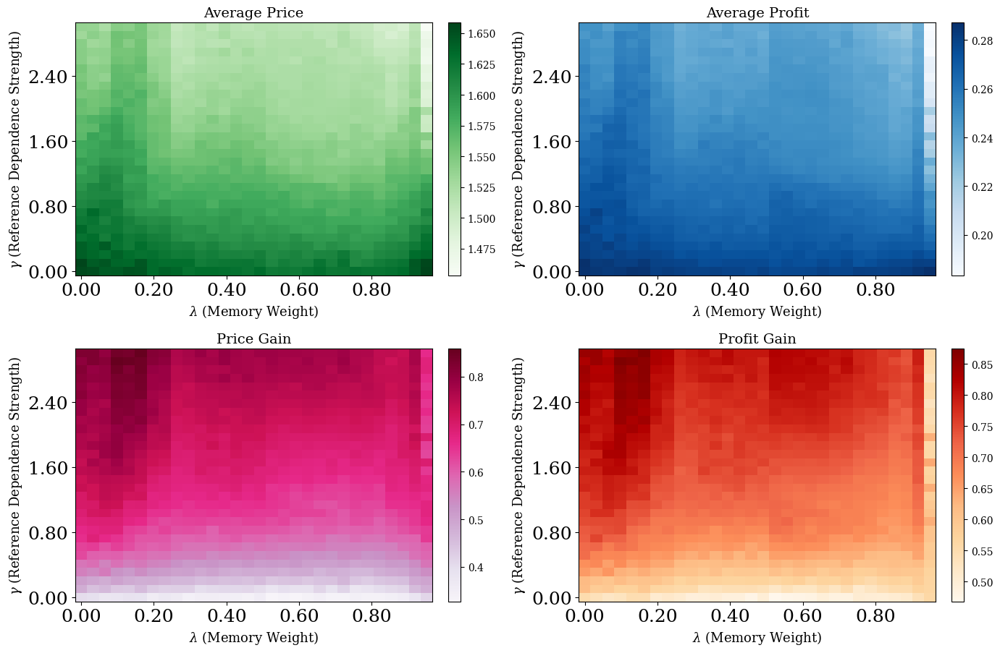

In [62]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from glob import glob # For finding directories

# --- Placeholder/Assumed Helper Functions ---
def extract_min_max_price_metric(run_dir):
    """
    Placeholder: Assumes this function exists and extracts avg min/max prices
    from the run_dir, perhaps from a specific file or calculation.
    Returns: (avg_min_price, avg_max_price)
    """
    # Example: Read from a hypothetical file or return dummy data
    # For now, returning NaNs so it doesn't interfere if not fully implemented
    # but allows the main logic to proceed.
    # In a real scenario, this would parse actual data.
    # try:
    #     # df_prices = pd.read_csv(os.path.join(run_dir, "price_summary.csv"))
    #     # return df_prices['avg_min_price'].iloc[0], df_prices['avg_max_price'].iloc[0]
    #     pass
    # except FileNotFoundError:
    #     print(f"Warning: Price summary file not found in {run_dir}")
    return np.nan, np.nan

def replace_nans_and_zeros(data_grid, original_data_values=None, replacement_method='nan'):
    """
    Placeholder: Replaces NaNs and/or zeros in the data_grid.
    'nan' method replaces zeros with NaN.
    'interpolate' could be an option for NaNs (more complex).
    """
    grid_copy = np.copy(data_grid)
    if replacement_method == 'nan':
        # If you want to treat actual zeros from data as missing for visualization
        # This is often not desired unless zeros truly mean "no data"
        # grid_copy[grid_copy == 0] = np.nan # Be careful with this
        pass # Usually, np.nan is already handled by imshow
    # If original_data_values is provided and you want to fill based on its distribution,
    # that's more advanced. For now, we'll assume NaNs are handled by imshow.
    return grid_copy

# --- Enhanced Plotting Parameters (similar to your quad figure) ---
plt.rcParams.update({
    'font.size': 12, # Adjusted for potentially smaller subplots
    'axes.titlesize': 14,
    'axes.labelsize': 13,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 11, # Not directly used for heatmaps but good to have
    'figure.titlesize': 18,
    'font.family': 'serif',
    'mathtext.fontset': 'dejavuserif',
})

# --- 1. Refactored Data Loading Function ---
def load_gamma_lambda_heatmap_data(results_dir, experiment_name_pattern="*", target_metrics=None):
    """
    Loads and processes data for specified metrics across gamma and lambda experiments.

    Parameters:
    -----------
    results_dir : str
        Directory containing experiment results.
    experiment_name_pattern : str
        Pattern to match specific top-level experiment directories (e.g., "experiment_set_A*").
    target_metrics : list of str
        List of metric names to extract (e.g., ["Price", "Profit", "Profit Gain"]).
        If None, attempts to extract "Price", "Profit", "Price Gain", "Profit Gain", "mean_cycle_length".

    Returns:
    --------
    pd.DataFrame
        A DataFrame with columns: 'gamma', 'lambda', 'metric_name', 'value', 
                                  'avg_min_price' (optional), 'avg_max_price' (optional).
        Returns an empty DataFrame if no data is found.
    """
    if target_metrics is None:
        target_metrics = ["Price", "Profit", "Price Gain", "Profit Gain", "mean_cycle_length"]

    results_dir = os.path.abspath(results_dir)
    base_exp_dirs = glob(os.path.join(results_dir, experiment_name_pattern))

    if not base_exp_dirs:
        print(f"Warning: No experiment directories found matching pattern '{experiment_name_pattern}' in {results_dir}")
        return pd.DataFrame()

    all_data = []
    
    for base_exp_dir in base_exp_dirs: # Loop through matched top-level experiment dirs
        if not os.path.isdir(base_exp_dir):
            continue

        run_dir_pattern = os.path.join(base_exp_dir, "gamma_*_lambda_*")
        run_dirs = glob(run_dir_pattern)

        if not run_dirs:
            print(f"No run directories found matching pattern '{run_dir_pattern}' in {base_exp_dir}")
            continue

        for run_dir in run_dirs:
            dir_name = os.path.basename(run_dir)
            try:
                gamma_str = dir_name.split('gamma_')[1].split('_lambda_')[0]
                lambda_str = dir_name.split('lambda_')[1].split('_')[0] # Assuming format "lambda_X" or "lambda_X_timestamp"
                
                gamma = float(gamma_str)
                lambda_val = float(lambda_str)

                stats_file = os.path.join(run_dir, "cycle_statistics.csv")
                avg_min_price, avg_max_price = extract_min_max_price_metric(run_dir) # Get min/max prices

                if os.path.exists(stats_file):
                    df_stats = pd.read_csv(stats_file)
                    for metric_name in target_metrics:
                        metric_value = np.nan
                        if metric_name == 'mean_cycle_length':
                            metric_columns = [col for col in df_stats.columns if col.startswith('mean_cycle_length')]
                        elif metric_name == "Price (Min)": # Special handling for min/max price if needed
                            metric_value = avg_min_price
                        elif metric_name == "Price (Max)":
                            metric_value = avg_max_price
                        else:
                            # Standard metric name conversion
                            col_prefix = f'mean_{metric_name.lower().replace(" ", "_")}_p'
                            metric_columns = [col for col in df_stats.columns if col.startswith(col_prefix)]
                        
                        if metric_name not in ["Price (Min)", "Price (Max)"] and metric_columns: # Process standard metrics
                            # Compute the average across all player columns for the first row (assuming one summary row)
                            if not df_stats.empty:
                                metric_value = df_stats[metric_columns].mean(axis=1).iloc[0]
                        
                        if not np.isnan(metric_value): # Only append if a value was found/calculated
                             all_data.append({
                                'gamma': gamma,
                                'lambda': lambda_val,
                                'metric_name': metric_name,
                                'value': metric_value,
                                'avg_min_price': avg_min_price, # Store for potential use
                                'avg_max_price': avg_max_price  # Store for potential use
                            })
                else:
                    print(f"Warning: cycle_statistics.csv not found in {run_dir}")

            except (IndexError, ValueError) as e:
                print(f"Skipping directory {dir_name} in {base_exp_dir} due to parsing error: {e}")
                continue
    
    if not all_data:
        print("No valid data collected.")
        return pd.DataFrame()
        
    return pd.DataFrame(all_data)


# --- 2. Refactored Single Heatmap Plotting Function ---
def plot_single_heatmap_on_ax(ax, gamma_values, lambda_values, data_values, metric_name_display, cmap='viridis', fig_for_cbar=None):
    """
    Plots a single heatmap on a given matplotlib Axes object.

    Parameters:
    -----------
    ax : matplotlib.axes.Axes
        The Axes object to plot on.
    gamma_values : np.ndarray
        Sorted unique gamma values (for y-axis).
    lambda_values : np.ndarray
        Sorted unique lambda values (for x-axis).
    data_values : np.ndarray
        2D grid of metric values (rows=gamma, cols=lambda).
    metric_name_display : str
        Title for the heatmap and colorbar label.
    cmap : str
        Colormap name.
    fig_for_cbar : matplotlib.figure.Figure, optional
        The figure to attach the colorbar to. If None, uses ax.figure.
    """
    if data_values.size == 0:
        ax.text(0.5, 0.5, "No data", ha='center', va='center', transform=ax.transAxes)
        ax.set_title(metric_name_display)
        ax.set_xlabel(r'$\lambda$ (Memory Weight)')
        ax.set_ylabel(r'$\gamma$ (Reference Dependence)')
        return

    data_grid_processed = replace_nans_and_zeros(data_values) # Use your processing function

    im = ax.imshow(
        data_grid_processed,
        aspect='auto',
        origin='lower',
        extent=[min(lambda_values) - (lambda_values[1]-lambda_values[0])/2 if len(lambda_values)>1 else min(lambda_values)-0.5, # Adjust extent for centering
                max(lambda_values) + (lambda_values[1]-lambda_values[0])/2 if len(lambda_values)>1 else max(lambda_values)+0.5,
                min(gamma_values) - (gamma_values[1]-gamma_values[0])/2 if len(gamma_values)>1 else min(gamma_values)-0.5,
                max(gamma_values) + (gamma_values[1]-gamma_values[0])/2 if len(gamma_values)>1 else max(gamma_values)+0.5],
        cmap=cmap,
    )
    
    # Add color bar
    if fig_for_cbar is None:
        fig_for_cbar = ax.figure
    cbar = fig_for_cbar.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=10)


    ax.set_xlabel(r'$\lambda$ (Memory Weight)')
    ax.set_ylabel(r'$\gamma$ (Reference Dependence Strength)')
    ax.set_title(metric_name_display)

    # Set ticks to be the actual unique gamma and lambda values
    if len(lambda_values) > 1 and len(lambda_values) <=15: # Avoid overcrowding
        ax.set_xticks(lambda_values)
        ax.set_xticklabels([f"{val:.2f}" for val in lambda_values], rotation=45, ha="right")
    else:
        ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=5, prune='both')) # Auto ticks if too many
        ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))


    if len(gamma_values) > 1 and len(gamma_values) <=15:
        ax.set_yticks(gamma_values)
        ax.set_yticklabels([f"{val:.2f}" for val in gamma_values])
    else:
        ax.yaxis.set_major_locator(mticker.MaxNLocator(nbins=5, prune='both'))
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))


# --- 3. Function to Create the 2x2 Quad Heatmap Figure ---
def create_gamma_lambda_quad_heatmap(results_dir, experiment_name_pattern="*", figsize=(14, 10)):
    """
    Creates a 2x2 figure with heatmaps for Price, Profit, Price Gain, and Profit Gain.

    Parameters:
    -----------
    results_dir : str
        Directory containing experiment results.
    experiment_name_pattern : str
        Pattern to match specific experiment directories.
    figsize : tuple
        Size of the overall figure.
    """
    target_metrics_for_quad = ["Price", "Profit", "Price Gain", "Profit Gain"]
    
    # Define human-readable titles and colormaps for the quad
    metric_display_config = {
        "Price": {"title": "Average Price", "cmap": 'Greens'},
        "Profit": {"title": "Average Profit", "cmap": 'Blues'},
        "Price Gain": {"title": "Price Gain", "cmap": 'PuRd'}, # OrRd is good for gains
        "Profit Gain": {"title": "Profit Gain", "cmap": 'OrRd'} # PuRd also good
    }

    # Load data for all target metrics
    df_all_metrics = load_gamma_lambda_heatmap_data(results_dir, experiment_name_pattern, target_metrics_for_quad)

    if df_all_metrics.empty:
        print("No data loaded for quad heatmap. Cannot create figure.")
        # Create a blank figure with a message
        fig, ax = plt.subplots(figsize=figsize)
        ax.text(0.5, 0.5, "No data found for heatmap generation.", 
                horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
        ax.set_axis_off()
        return fig

    fig, axes = plt.subplots(2, 2, figsize=figsize, sharex=False, sharey=False) # No sharing axes for heatmaps
    axes_flat = axes.flatten()

    unique_gammas_all = np.sort(df_all_metrics['gamma'].unique())
    unique_lambdas_all = np.sort(df_all_metrics['lambda'].unique())

    if len(unique_gammas_all) == 0 or len(unique_lambdas_all) == 0:
        print("Not enough unique gamma or lambda values to create heatmaps.")
        for ax in axes_flat:
            ax.text(0.5, 0.5, "Insufficient Data Dimensions", ha='center', va='center', transform=ax.transAxes)
            ax.set_axis_off()
        return fig


    for i, metric_key in enumerate(target_metrics_for_quad):
        ax = axes_flat[i]
        display_info = metric_display_config[metric_key]
        
        df_metric = df_all_metrics[df_all_metrics['metric_name'] == metric_key]

        if df_metric.empty:
            print(f"No data found for metric: {metric_key}")
            ax.text(0.5, 0.5, f"No data for\n{display_info['title']}", ha='center', va='center', transform=ax.transAxes, fontsize=10)
            ax.set_title(display_info['title'])
            ax.set_xlabel(r'$\lambda$')
            ax.set_ylabel(r'$\gamma$')
            continue

        # Pivot the data for the current metric
        try:
            # Using pivot_table to handle potential duplicate (gamma, lambda) pairs by averaging
            pivot_df = df_metric.pivot_table(index='gamma', columns='lambda', values='value', aggfunc='mean')
            # Ensure the pivot table has all unique gammas and lambdas, fill missing with NaN
            pivot_df = pivot_df.reindex(index=unique_gammas_all, columns=unique_lambdas_all)
            data_grid = pivot_df.values
        except Exception as e:
            print(f"Error pivoting data for {metric_key}: {e}")
            ax.text(0.5, 0.5, f"Error processing\n{display_info['title']}", ha='center', va='center', transform=ax.transAxes, fontsize=10)
            continue
            
        plot_single_heatmap_on_ax(ax, unique_gammas_all, unique_lambdas_all, data_grid, 
                                  display_info['title'], cmap=display_info['cmap'], fig_for_cbar=fig)

    #fig.suptitle(f'Heatmaps for {experiment_name_pattern.replace("*","All Experiments") if experiment_name_pattern=="*" else experiment_name_pattern } \n(γ vs. λ)', fontsize=plt.rcParams['figure.titlesize'])
    fig.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust rect for suptitle

    return fig

# --- Example Usage (similar to your original calls) ---
if __name__ == "__main__":
    # Create the output directory if it doesn't exist
    output_figure_dir = "../Figures_Heatmaps" # Example output directory
    os.makedirs(output_figure_dir, exist_ok=True)

    # experiment_base_pattern = "recreating_results/gamma_lambda_high" 

    # Assuming your results are in "../Results_sockeye/experiments"
    # And inside that, you have experiment set directories like "final_results_gamma_lambda_reference_True"
    # The `experiment_name_pattern` should match these *set* directories.
    # For example, if your structure is:
    # ../Results_sockeye/experiments/MyExperimentSet1/gamma_0.1_lambda_0.2/...
    # ../Results_sockeye/experiments/MyExperimentSet2/gamma_0.1_lambda_0.2/...
    # Then experiment_name_pattern could be "MyExperimentSet1" or "MyExperimentSet*"
    
    # If your `experiment_name` in the original call was referring to a specific sub-folder
    # like "final_results_gamma_lambda_reference_True", then that's what you pass here.
    # Let's assume it's a specific set for this example:
    experiment_set_name = "recreating_results/gamma_lambda_high_lowc_lowmu_30_reference_True" # ADJUST THIS
    
    print(f"Looking for data in: {os.path.abspath('../Results/experiments')}")
    
    quad_fig = create_gamma_lambda_quad_heatmap(
        "../Results/experiments", # Base directory containing experiment sets
        experiment_name_pattern="noloss/gamma_lambda_reference_True" # Pattern for the specific set of experiments
    )
    
    if quad_fig:
        quad_fig.savefig(os.path.join(output_figure_dir, f"quad_heatmap_gamma_lambda_{experiment_set_name}.png"), dpi=300)
        print(f"Quad heatmap saved to {os.path.join(output_figure_dir, f'quad_heatmap_gamma_lambda_{experiment_set_name}.png')}")
        plt.show()

    # You can still create single heatmaps if needed:
    # df_single = load_gamma_lambda_heatmap_data("../Results_sockeye/experiments", experiment_set_name, ["Profit Gain"])
    # if not df_single.empty:
    #     fig_single, ax_single = plt.subplots(figsize=(8,6))
    #     pivot_single = df_single.pivot_table(index='gamma', columns='lambda', values='value', aggfunc='mean')
    #     pivot_single = pivot_single.reindex(index=np.sort(df_single['gamma'].unique()), columns=np.sort(df_single['lambda'].unique()))
    #     plot_single_heatmap_on_ax(ax_single, 
    #                               np.sort(df_single['gamma'].unique()), 
    #                               np.sort(df_single['lambda'].unique()), 
    #                               pivot_single.values, 
    #                               "Profit Gain", cmap='OrRd', fig_for_cbar=fig_single)
    #     fig_single.suptitle(f"Single Heatmap for Profit Gain ({experiment_set_name})")
    #     fig_single.tight_layout(rect=[0,0.03,1,0.93])
    #     fig_single.savefig(os.path.join(output_figure_dir, f"single_heatmap_profit_gain_{experiment_set_name}.png"), dpi=300)
    #     plt.show()

***
### 4 Figures side by side

In [50]:
import matplotlib.pyplot as plt
import os
import numpy as np

# ------------------------------
# Output directory
# ------------------------------
out_dir = "Images/exp_smoothing_firm_specific"
os.makedirs(out_dir, exist_ok=True)

# ------------------------------
# Matplotlib settings
# ------------------------------
plt.rcParams.update({
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 14,
})

# ------------------------------
# Metric definitions
# ------------------------------
metric_specs = [
    ("Price",       "figure1_gamma_only_q_price.png"),
    ("Profit",      "figure1_gamma_only_q_profit.png"),
    ("Price Gain",  "figure1_gamma_only_q_price_gain.png"),
    ("Profit Gain", "figure1_gamma_only_q_profit_gain.png"),
]

# ------------------------------
# Colors
# ------------------------------
ref_color      = 'tab:blue'
mis_color      = 'tab:orange'
qlr_color      = 'tab:purple'
qlr_miss_color = 'tab:red'

# ------------------------------
# Variables to capture shared legend (once)
# ------------------------------
shared_handles = None
shared_labels  = None

# ============================================================
# MAIN LOOP – Creates 4 figures AND extracts the legend once
# ============================================================
for metric_index, (metric_name, fname) in enumerate(metric_specs):

    fig, ax = plt.subplots(figsize=(6, 4))

    # =====================================================
    # GRID-SEARCH CURVES (if needed)
    # =====================================================
    for demand, cr in [
        ('reference', True),
        ('reference', False),
        #('misspecification', True),
    ]:
        γ, μ, σ, n_eff = load_gamma_metric_n(exp_dirs[(demand, cr)], metric_name)

        color     = ref_color if (demand in {'reference','reference_high'}) else mis_color
        linestyle = '-' if cr else '--'
        # label     = f"Reference-{'Aware' if 'reference' in demand else 'Naive'} Firms Exp Smoothing"
        label     = f"Reference-{'Aware' if 'reference' in demand else 'Naive'} Firms Exp Smoothing(CR={cr})"
        #label  = "Exp Smoothing Refrence Pred"

        m = np.isfinite(γ) & np.isfinite(μ) & np.isfinite(σ) & np.isfinite(n_eff) & (n_eff > 0)
        se     = σ[m] / np.sqrt(n_eff[m])
        lower  = μ[m] - 1.8 * se
        upper  = μ[m] + 1.8 * se

        ax.plot(γ[m], μ[m], color=color, linestyle=linestyle,
                marker=' ', linewidth=2, label=label)
        ax.fill_between(γ[m], lower, upper, color=color, alpha=0.15)

    # =====================================================
    # Q-LEARNING CURVES (your main curves)
    # =====================================================

    # dash patterns: (offset, (on, off, on, off, ...))
    # STYLE_MAP = {
    #     ('qlr_reference_nloss', True): dict(ls='-',              lw=3.0, band_alpha=0.18),        # solid, thicker (MAIN)
    #     ('qlr_reference_c0',    True): dict(ls=(0, (6, 3)),      lw=2.2, band_alpha=0.12),        # dashed  —–– ––– –––
    #     ('qlr_reference_mu0',   True): dict(ls=(0, (1, 2)),      lw=2.2, band_alpha=0.12),        # dotted  ·· ·· ··
    # }

    # LABEL_MAP = {
    #     ('qlr_reference_nloss', True): "baseline(c = 1, μ = 0.25)",
    #     ('qlr_reference_c0',    True): "(c ↓, μ = 0.25)",
    #     ('qlr_reference_mu0',   True): "(c = 1, μ ↓)",
    # }

    for demand, cr in [
        #('qlr_reference_nloss', True),
        #('qlr_reference_nloss', False),
        #('qlr_misspecification_nloss', True),
        #('qlr_reference_c0',    True),
        #('qlr_reference_mu0',    True)
    ]:
        γ, μ, σ = load_gamma_only_metric(exp_dirs[(demand, cr)], metric_name)

        color     = qlr_color if (demand in {'qlr_reference','qlr_reference_nloss','qlr_reference_k25'}) else qlr_miss_color
        linestyle = '-' if cr else '--'
        #label     = f"Reference-{'Aware' if 'reference' in demand else 'Naive'} Firms"
        #label     = f"Reference-{'Aware' if 'reference' in demand else 'Naive'} Firms (CR={cr})"
        label     = "QLearning Refrence Pred"


        # st = STYLE_MAP[(demand, cr)]
        # ln, = ax.plot(
        #     γ, μ,
        #     color=qlr_base_color,
        #     linestyle=st['ls'],
        #     linewidth=st['lw'],
        #     marker=None,
        #     label=LABEL_MAP[(demand, cr)],
        # )
        # ax.fill_between(γ, μ - 0.8*σ, μ + 0.8*σ,
        #                 color=qlr_base_color, alpha=st['band_alpha'])


        ax.plot(γ, μ, color=color, linestyle=linestyle,
                marker=' ', linewidth=2, label=label)
        ax.fill_between(γ, μ - 0.8 * σ, μ + 0.8 * σ,
                        color=color, alpha=0.15)

    # =====================================================
    # AXES setup
    # =====================================================
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_xlabel(r"$\gamma$")
    ax.set_ylabel(metric_name)

    # =====================================================
    # CAPTURE LEGEND ONLY ON FIRST FIGURE
    # =====================================================
    handles, labels = ax.get_legend_handles_labels()

    if metric_index == 0:      # ← only first figure stores the legend
        shared_handles = handles
        shared_labels  = labels

    # REMOVE legend from the panel figure
    if ax.get_legend():
        ax.get_legend().remove()

    # Save the panel
    fig.tight_layout()
    fig.savefig(os.path.join(out_dir, fname), dpi=300, bbox_inches="tight")
    plt.close(fig)

# ============================================================
# SAVE SEPARATE LEGEND-ONLY FIGURE
# ============================================================
print("Saving shared legend…")

fig_leg = plt.figure(figsize=(8, 0.7))   # adjust height if needed
fig_leg.legend(shared_handles, shared_labels,
               loc="center",
               ncol=2,
               frameon=False)

fig_leg.tight_layout()
legend_path = os.path.join(out_dir, "legend_reference_naive.png")
fig_leg.savefig(legend_path, dpi=300, bbox_inches="tight")
plt.close(fig_leg)

print("DONE. All four panels + shared legend saved.")


Saving shared legend…
DONE. All four panels + shared legend saved.


***
## 

In [19]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from glob import glob  # For finding directories

# --- Placeholder/Assumed Helper Functions ---
def extract_min_max_price_metric(run_dir):
    """
    Placeholder: Assumes this function exists and extracts avg min/max prices
    from the run_dir, perhaps from a specific file or calculation.
    Returns: (avg_min_price, avg_max_price)
    """
    return np.nan, np.nan

def replace_nans_and_zeros(data_grid, original_data_values=None, replacement_method='nan'):
    """
    Placeholder: Replaces NaNs and/or zeros in the data_grid.
    """
    grid_copy = np.copy(data_grid)
    # you can add more sophisticated handling if needed
    return grid_copy

# --- Plotting Parameters ---
plt.rcParams.update({
    'font.size': 18,
    'axes.titlesize': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 18,
    'figure.titlesize': 18,
    'font.family': 'serif',
    'mathtext.fontset': 'dejavuserif',
})

# --- 1. Data Loading Function (same as yours) ---
def load_gamma_lambda_heatmap_data(results_dir, experiment_name_pattern="*", target_metrics=None):
    if target_metrics is None:
        target_metrics = ["Price", "Profit", "Price Gain", "Profit Gain", "mean_cycle_length"]

    results_dir = os.path.abspath(results_dir)
    base_exp_dirs = glob(os.path.join(results_dir, experiment_name_pattern))

    if not base_exp_dirs:
        print(f"Warning: No experiment directories found matching pattern '{experiment_name_pattern}' in {results_dir}")
        return pd.DataFrame()

    all_data = []

    for base_exp_dir in base_exp_dirs:
        if not os.path.isdir(base_exp_dir):
            continue

        run_dir_pattern = os.path.join(base_exp_dir, "gamma_*_lambda_*")
        run_dirs = glob(run_dir_pattern)

        if not run_dirs:
            print(f"No run directories found matching pattern '{run_dir_pattern}' in {base_exp_dir}")
            continue

        for run_dir in run_dirs:
            dir_name = os.path.basename(run_dir)
            try:
                gamma_str = dir_name.split('gamma_')[1].split('_lambda_')[0]
                lambda_str = dir_name.split('lambda_')[1].split('_')[0]

                gamma = float(gamma_str)
                lambda_val = float(lambda_str)

                stats_file = os.path.join(run_dir, "cycle_statistics.csv")
                avg_min_price, avg_max_price = extract_min_max_price_metric(run_dir)

                if os.path.exists(stats_file):
                    df_stats = pd.read_csv(stats_file)
                    for metric_name in target_metrics:
                        metric_value = np.nan
                        if metric_name == 'mean_cycle_length':
                            metric_columns = [col for col in df_stats.columns
                                              if col.startswith('mean_cycle_length')]
                        elif metric_name == "Price (Min)":
                            metric_value = avg_min_price
                        elif metric_name == "Price (Max)":
                            metric_value = avg_max_price
                        else:
                            col_prefix = f'mean_{metric_name.lower().replace(" ", "_")}_p'
                            metric_columns = [col for col in df_stats.columns
                                              if col.startswith(col_prefix)]

                        if metric_name not in ["Price (Min)", "Price (Max)"] and metric_columns:
                            if not df_stats.empty:
                                metric_value = df_stats[metric_columns].mean(axis=1).iloc[0]

                        if not np.isnan(metric_value):
                            all_data.append({
                                'gamma': gamma,
                                'lambda': lambda_val,
                                'metric_name': metric_name,
                                'value': metric_value,
                                'avg_min_price': avg_min_price,
                                'avg_max_price': avg_max_price
                            })
                else:
                    print(f"Warning: cycle_statistics.csv not found in {run_dir}")

            except (IndexError, ValueError) as e:
                print(f"Skipping directory {dir_name} in {base_exp_dir} due to parsing error: {e}")
                continue

    if not all_data:
        print("No valid data collected.")
        return pd.DataFrame()

    return pd.DataFrame(all_data)


# --- 2. Single Heatmap Plotting Function (same as yours) ---
def plot_single_heatmap_on_ax(ax, gamma_values, lambda_values, data_values,
                              metric_name_display, cmap='viridis', fig_for_cbar=None):
    if data_values.size == 0:
        ax.text(0.5, 0.5, "No data", ha='center', va='center', transform=ax.transAxes)
        ax.set_title(metric_name_display)
        ax.set_xlabel(r'$\lambda$ (Memory Weight)')
        ax.set_ylabel(r'$\gamma$ (Reference Dependence)')
        return

    data_grid_processed = replace_nans_and_zeros(data_values)

    # Compute extent so cells are centered
    if len(lambda_values) > 1:
        dx = lambda_values[1] - lambda_values[0]
    else:
        dx = 1.0
    if len(gamma_values) > 1:
        dy = gamma_values[1] - gamma_values[0]
    else:
        dy = 1.0

    extent = [
        min(lambda_values) - dx / 2,
        max(lambda_values) + dx / 2,
        min(gamma_values) - dy / 2,
        max(gamma_values) + dy / 2,
    ]

    im = ax.imshow(
        data_grid_processed,
        aspect='auto',
        origin='lower',
        extent=extent,
        cmap=cmap,
    )

    if fig_for_cbar is None:
        fig_for_cbar = ax.figure
    cbar = fig_for_cbar.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=10)

    ax.set_xlabel(r'$\lambda$ (Memory Weight)')
    ax.set_ylabel(r'$\gamma$')
    #ax.set_title(metric_name_display)

    # X ticks
    if 1 < len(lambda_values) <= 15:
        ax.set_xticks(lambda_values)
        ax.set_xticklabels([f"{val:.2f}" for val in lambda_values],
                           rotation=45, ha="right")
    else:
        ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=5, prune='both'))
        ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))

    # Y ticks
    if 1 < len(gamma_values) <= 15:
        ax.set_yticks(gamma_values)
        ax.set_yticklabels([f"{val:.2f}" for val in gamma_values])
    else:
        ax.yaxis.set_major_locator(mticker.MaxNLocator(nbins=5, prune='both'))
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))


# -------------------------------------------------------------------
# 3. NEW: Create one separate figure per metric (4 figures total)
# -------------------------------------------------------------------
def create_gamma_lambda_single_heatmaps(results_dir,
                                        experiment_name_pattern="*",
                                        output_dir=".",
                                        base_filename_prefix="heatmap_gamma_lambda",
                                        figsize=(7, 5)):
    """
    Creates 4 separate figures with heatmaps for
    Price, Profit, Price Gain, and Profit Gain.

    Each figure is saved as:
      <output_dir>/<base_filename_prefix>_<metric_key>.png
    """
    target_metrics = ["Price", "Profit", "Price Gain", "Profit Gain"]

    metric_display_config = {
        "Price": {"title": "Average Price", "cmap": 'Greens'},
        "Profit": {"title": "Average Profit", "cmap": 'Blues'},
        "Price Gain": {"title": "Price Gain", "cmap": 'PuRd'},
        "Profit Gain": {"title": "Profit Gain", "cmap": 'OrRd'},
    }

    os.makedirs(output_dir, exist_ok=True)

    # Load once for all metrics
    df_all = load_gamma_lambda_heatmap_data(results_dir,
                                            experiment_name_pattern,
                                            target_metrics)

    if df_all.empty:
        print("No data loaded; cannot create single heatmaps.")
        return

    unique_gammas_all = np.sort(df_all['gamma'].unique())
    unique_lambdas_all = np.sort(df_all['lambda'].unique())

    if len(unique_gammas_all) == 0 or len(unique_lambdas_all) == 0:
        print("Not enough unique gamma or lambda values.")
        return

    for metric_key in target_metrics:
        display_info = metric_display_config[metric_key]
        df_metric = df_all[df_all['metric_name'] == metric_key]

        if df_metric.empty:
            print(f"No data for metric: {metric_key}, skipping.")
            continue

        # Pivot into gamma × lambda grid
        pivot_df = df_metric.pivot_table(index='gamma',
                                         columns='lambda',
                                         values='value',
                                         aggfunc='mean')
        pivot_df = pivot_df.reindex(index=unique_gammas_all,
                                    columns=unique_lambdas_all)
        data_grid = pivot_df.values

        # Create figure and plot
        fig, ax = plt.subplots(figsize=figsize)
        plot_single_heatmap_on_ax(ax,
                                  unique_gammas_all,
                                  unique_lambdas_all,
                                  data_grid,
                                  display_info['title'],
                                  cmap=display_info['cmap'],
                                  fig_for_cbar=fig)
        fig.tight_layout()

        # Clean metric key for filename
        key_for_file = metric_key.lower().replace(" ", "_")
        fname = f"{base_filename_prefix}_{key_for_file}.png"
        out_path = os.path.join(output_dir, fname)
        fig.savefig(out_path, dpi=300, bbox_inches="tight")
        plt.close(fig)
        print(f"Saved {metric_key} heatmap to {out_path}")


# --------------------------------------------------------
# Example usage
# --------------------------------------------------------
if __name__ == "__main__":
    # Base directory where experiments live
    results_base_dir = "../Results/experiments"

    # Pattern for your specific experiment set
    experiment_pattern = "noloss/gamma_lambda_reference_True"

    output_figure_dir = "Images/gamma_lambda"
    os.makedirs(output_figure_dir, exist_ok=True)

    create_gamma_lambda_single_heatmaps(
        results_dir=results_base_dir,
        experiment_name_pattern=experiment_pattern,
        output_dir=output_figure_dir,
        base_filename_prefix="gamma_lambda",
        figsize=(7, 5)
    )


Saved Price heatmap to Images/gamma_lambda/gamma_lambda_price.png
Saved Profit heatmap to Images/gamma_lambda/gamma_lambda_profit.png
Saved Price Gain heatmap to Images/gamma_lambda/gamma_lambda_price_gain.png
Saved Profit Gain heatmap to Images/gamma_lambda/gamma_lambda_profit_gain.png


In [35]:
# ============================================================
# FUNCTION: SAVE 12 SEPARATE HEATMAP PANELS
# ============================================================

def save_all_panels_separately(experiment_dirs_map, metrics_to_plot_list,
                               out_dir="Images/Separated_Heatmaps", figsize=(7, 6)):
    os.makedirs(out_dir, exist_ok=True)

    plt.rcParams.update({
    "axes.titlesize": 22,
    "axes.labelsize": 20,
    "xtick.labelsize": 18,
    "ytick.labelsize": 18,
    })

    metric_cmaps = {
        "Price": 'Greens',
        "Profit": 'Blues',
        "Profit Gain": 'OrRd',
        "Cycle Length": 'Purples'
    }
    diff_cmap = "BrBG"

    print("\nExtracting and saving individual panels...\n")

    for metric in metrics_to_plot_list:

        # Load data
        g_ref, l_ref, m_ref = extract_metric_data_gl(
            experiment_dirs_map[('reference', True)], metric
        )
        g_mis, l_mis, m_mis = extract_metric_data_gl(
            experiment_dirs_map[('misspecification', True)], metric
        )

        # If missing → skip
        if g_ref.size == 0 or l_ref.size == 0:
            print(f"Skipping {metric}: no reference-aware data.")
            continue

        # Shared coordinate grid
        g_all = np.sort(np.unique(np.concatenate([g_ref, g_mis])))
        l_all = np.sort(np.unique(np.concatenate([l_ref, l_mis])))

        # Prepare grids
        grid_ref = np.full((len(g_all), len(l_all)), np.nan)
        grid_mis = np.full((len(g_all), len(l_all)), np.nan)

        for g, l, val in zip(g_ref, l_ref, m_ref):
            grid_ref[np.argmin(abs(g_all-g)),
                     np.argmin(abs(l_all-l))] = val

        for g, l, val in zip(g_mis, l_mis, m_mis):
            grid_mis[np.argmin(abs(g_all-g)),
                     np.argmin(abs(l_all-l))] = val

        grid_diff = grid_mis - grid_ref

        # Normalization absolute
        valid_abs = np.hstack([
            grid_ref[np.isfinite(grid_ref)],
            grid_mis[np.isfinite(grid_mis)]
        ])
        if valid_abs.size == 0:
            vmin_abs, vmax_abs = 0, 1
        else:
            vmin_abs, vmax_abs = valid_abs.min(), valid_abs.max()

        norm_abs = mcolors.Normalize(vmin=vmin_abs, vmax=vmax_abs)

        # Normalization diff
        valid_diff = grid_diff[np.isfinite(grid_diff)]
        if valid_diff.size > 0:
            maxabs = np.max(np.abs(valid_diff))
            norm_diff = mcolors.TwoSlopeNorm(vcenter=0, vmin=-maxabs, vmax=maxabs)
        else:
            norm_diff = None

        cmap_abs = metric_cmaps.get(metric, "viridis")

        # --------------------------
        # SAVE PANEL 1 (Reference-Aware)
        # --------------------------
        fig, ax = plt.subplots(figsize=figsize)
        im = plot_heatmap_on_ax(ax, g_all, l_all, grid_ref,
                                f"{metric}\nReference-Aware",
                                cmap_abs, norm_abs)
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        fig.savefig(f"{out_dir}/{metric.replace(' ','_').lower()}_aware.png",
                    dpi=300, bbox_inches='tight')
        plt.close(fig)

        # --------------------------
        # SAVE PANEL 2 (Reference-Naive)
        # --------------------------
        fig, ax = plt.subplots(figsize=figsize)
        im = plot_heatmap_on_ax(ax, g_all, l_all, grid_mis,
                                f"{metric}\nReference-Naive",
                                cmap_abs, norm_abs)
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        fig.savefig(f"{out_dir}/{metric.replace(' ','_').lower()}_naive.png",
                    dpi=300, bbox_inches='tight')
        plt.close(fig)

        # --------------------------
        # SAVE PANEL 3 (Difference)
        # --------------------------
        fig, ax = plt.subplots(figsize=figsize)
        im = plot_heatmap_on_ax(
            ax, g_all, l_all, grid_diff,
            f"{metric}\nDifference (Naive − Aware)",
            diff_cmap, norm_diff
        )
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        fig.savefig(f"{out_dir}/{metric.replace(' ','_').lower()}_difference.png",
                    dpi=300, bbox_inches='tight')
        plt.close(fig)

        print(f"Saved 3 panels for: {metric}")

    print("\n=== DONE: All panels saved ===\n")


# ============================================================
# RUN IT
# ============================================================
if __name__ == "__main__":
    output_dir_sep = os.path.join("Images/Separated_Panels_miss")
    save_all_panels_separately(
        experiment_dirs_map=exp_dirs_for_plot,
        metrics_to_plot_list=metrics_for_rows,
        out_dir=output_dir_sep
    )



Extracting and saving individual panels...

Saved 3 panels for: Price
Saved 3 panels for: Profit
Saved 3 panels for: Profit Gain
Saved 3 panels for: Cycle Length

=== DONE: All panels saved ===



In [34]:
import os
import numpy as np
import matplotlib.colors as mcolors

plt.rcParams.update({
    "axes.titlesize": 22,
    "axes.labelsize": 20,
    "xtick.labelsize": 18,
    "ytick.labelsize": 18,
})

def save_cr_panels_separately(experiment_dirs_map,
                              metrics_to_plot_list,
                              out_dir="Separated_CR_Panels",
                              figsize=(6, 4)):
    """
    For each metric, save 3 separate figures:
      1) Reference-Aware (CR=True)
      2) Reference-Aware (CR=False)
      3) Difference (CR=False − CR=True)
    """
    os.makedirs(out_dir, exist_ok=True)

    metric_cmaps = {
        "Price": "Greens",
        "Profit": "Blues",
        "Profit Gain": "OrRd",
        "Cycle Length": "Purples",
    }
    diff_cmap = "BrBG"

    print("\nSaving separate CR=True / CR=False / Diff panels...\n")

    for metric in metrics_to_plot_list:
        print(f"  Metric: {metric}")

        # ----- load data -----
        g_true, l_true, m_true = extract_metric_data_gl(
            experiment_dirs_map[('reference', True)],
            metric
        )
        g_false, l_false, m_false = extract_metric_data_gl(
            experiment_dirs_map[('reference', False)],
            metric
        )

        if g_true.size == 0 or l_true.size == 0:
            print(f"    Skipping {metric}: no CR=True data.")
            continue

        # union of coordinates
        g_all_list = [g for g in [g_true, g_false] if g.size > 0]
        l_all_list = [l for l in [l_true, l_false] if l.size > 0]
        if not g_all_list or not l_all_list:
            print(f"    Skipping {metric}: missing coords.")
            continue

        g_all = np.sort(np.unique(np.concatenate(g_all_list)))
        l_all = np.sort(np.unique(np.concatenate(l_all_list)))

        grid_true  = np.full((len(g_all), len(l_all)), np.nan)
        grid_false = np.full((len(g_all), len(l_all)), np.nan)

        # fill CR=True grid
        for g, l, val in zip(g_true, l_true, m_true):
            i = np.argmin(np.abs(g_all - g))
            j = np.argmin(np.abs(l_all - l))
            grid_true[i, j] = val

        # fill CR=False grid
        for g, l, val in zip(g_false, l_false, m_false):
            i = np.argmin(np.abs(g_all - g))
            j = np.argmin(np.abs(l_all - l))
            grid_false[i, j] = val

        # ----- absolute color scale -----
        vals_abs = np.hstack([
            grid_true[np.isfinite(grid_true)],
            grid_false[np.isfinite(grid_false)]
        ])
        if vals_abs.size == 0:
            vmin_abs, vmax_abs = 0, 1
        else:
            vmin_abs, vmax_abs = vals_abs.min(), vals_abs.max()
            if vmin_abs == vmax_abs:
                vmin_abs -= 0.01
                vmax_abs += 0.01
        norm_abs = mcolors.Normalize(vmin=vmin_abs, vmax=vmax_abs)

        cmap_abs = metric_cmaps.get(metric, "viridis")

        metric_short = metric.lower().replace(" ", "_")

        # =====================================================
        # 1) Panel: CR=True
        # =====================================================
        fig, ax = plt.subplots(figsize=figsize)
        im = plot_heatmap_on_ax(
            ax, g_all, l_all, grid_true,
            f"{metric}\nReference-Aware (CR=True)",
            cmap_abs, norm_abs
        )
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        fname_true = os.path.join(out_dir, f"{metric_short}_cr_true.png")
        fig.savefig(fname_true, dpi=300, bbox_inches="tight")
        plt.close(fig)

        # =====================================================
        # 2) Panel: CR=False
        # =====================================================
        fig, ax = plt.subplots(figsize=figsize)
        im = plot_heatmap_on_ax(
            ax, g_all, l_all, grid_false,
            f"{metric}\nReference-Aware (CR=False)",
            cmap_abs, norm_abs
        )
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        fname_false = os.path.join(out_dir, f"{metric_short}_cr_false.png")
        fig.savefig(fname_false, dpi=300, bbox_inches="tight")
        plt.close(fig)

        # =====================================================
        # 3) Panel: Difference (CR=False − CR=True)
        # =====================================================
        grid_diff = grid_false - grid_true
        vals_diff = grid_diff[np.isfinite(grid_diff)]
        if vals_diff.size > 0:
            maxabs = np.max(np.abs(vals_diff))
            norm_diff = mcolors.TwoSlopeNorm(
                vcenter=0, vmin=-maxabs, vmax=maxabs
            )
        else:
            norm_diff = None

        fig, ax = plt.subplots(figsize=figsize)
        im = plot_heatmap_on_ax(
            ax, g_all, l_all, grid_diff,
            f"{metric}\nDiff. (CR=False − CR=True)",
            diff_cmap, norm_diff
        )
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        fname_diff = os.path.join(out_dir, f"{metric_short}_cr_diff.png")
        fig.savefig(fname_diff, dpi=300, bbox_inches="tight")
        plt.close(fig)

        print(f"    Saved: {os.path.basename(fname_true)}, "
              f"{os.path.basename(fname_false)}, "
              f"{os.path.basename(fname_diff)}")

    print("\nDone saving CR panels.\n")


# ----------------------------------------------------------------
# Call this in your main block, after you build exp_dirs_for_cr_comparison
# and metrics_for_rows
# ----------------------------------------------------------------
if __name__ == "__main__":
    folder_location = "../Results/experiments"
    experiment_base_pattern = "noloss/gamma_lambda"

    exp_dirs_for_cr_comparison = {
        ('reference', True):  os.path.join(folder_location, f"{experiment_base_pattern}_reference_True"),
        ('reference', False): os.path.join(folder_location, f"{experiment_base_pattern}_reference_False"),
    }

    # (path checks as you already have...)
    metrics_for_rows = ["Price", "Profit", "Profit Gain", "Cycle Length"]

    sep_out_dir = "Images/Separated_Panels_CR_True_vs_False"
    
    save_cr_panels_separately(
        experiment_dirs_map=exp_dirs_for_cr_comparison,
        metrics_to_plot_list=metrics_for_rows,
        out_dir=sep_out_dir,
        figsize=(6, 4)
    )



Saving separate CR=True / CR=False / Diff panels...

  Metric: Price
    Saved: price_cr_true.png, price_cr_false.png, price_cr_diff.png
  Metric: Profit
    Saved: profit_cr_true.png, profit_cr_false.png, profit_cr_diff.png
  Metric: Profit Gain
    Saved: profit_gain_cr_true.png, profit_gain_cr_false.png, profit_gain_cr_diff.png
  Metric: Cycle Length
    Saved: cycle_length_cr_true.png, cycle_length_cr_false.png, cycle_length_cr_diff.png

Done saving CR panels.



In [21]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as mticker
import numpy as np
import pandas as pd
import os
from glob import glob

# --------------------------------------------------
# 1. Data loader (your function, unchanged)
# --------------------------------------------------
def extract_metric_data(experiment_dir_parent, metric_name):
    pattern_sub_dirs = "alpha_*_beta_*"
    run_dirs = glob(os.path.join(experiment_dir_parent, pattern_sub_dirs))
    alpha_values_all, beta_values_all, metric_values_all = [], [], []

    if not run_dirs:
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)

    for run_dir_path in run_dirs:
        dir_name = os.path.basename(run_dir_path)
        try:
            alpha_str = dir_name.split('alpha_')[1].split('_beta_')[0]
            beta_str_full = dir_name.split('beta_')[1]
            beta_str = beta_str_full.split('_')[0]
            alpha_val, beta_val = float(alpha_str), float(beta_str)
        except (IndexError, ValueError):
            continue

        metric_val = np.nan
        stats_file = os.path.join(run_dir_path, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            continue

        try:
            df_stats = pd.read_csv(stats_file, on_bad_lines='skip')
            if not df_stats.empty:
                if metric_name == "Cycle Length":
                    if "mean_cycle_length" in df_stats.columns:
                        metric_val = float(df_stats["mean_cycle_length"].iloc[0])
                elif metric_name == "Surplus":
                    if "mean_consumer_surplus" in df_stats.columns:
                        metric_val = float(df_stats["mean_consumer_surplus"].iloc[0])
                elif metric_name in [
                    "Cycle Probability",
                    "Conditional Cycle Length",
                    "Average Cycle Length (Sessions)",
                ]:
                    session_summary_file = os.path.join(run_dir_path, "session_summaries.csv")
                    if not os.path.exists(session_summary_file):
                        continue
                    df_sessions = pd.read_csv(session_summary_file, on_bad_lines='skip')
                    if df_sessions.empty or "cycle_length" not in df_sessions.columns:
                        continue
                    df_sessions["cycle_length"] = pd.to_numeric(
                        df_sessions["cycle_length"], errors="coerce"
                    )
                    df_sessions = df_sessions.dropna(subset=["cycle_length"])
                    if df_sessions.empty:
                        continue

                    if metric_name == "Cycle Probability":
                        metric_val = (
                            (df_sessions["cycle_length"] > 1).sum() / len(df_sessions)
                            if len(df_sessions) > 0
                            else 0.0
                        )
                    elif metric_name == "Conditional Cycle Length":
                        cycles_df = df_sessions[df_sessions["cycle_length"] > 1]
                        metric_val = cycles_df["cycle_length"].mean() if not cycles_df.empty else np.nan
                    elif metric_name == "Average Cycle Length (Sessions)":
                        metric_val = df_sessions["cycle_length"].mean()
                else:
                    key = metric_name.lower().replace(" ", "_")
                    cols = [c for c in df_stats.columns if c.startswith(f"mean_{key}_p")]
                    if cols:
                        numeric_data = df_stats[cols].apply(pd.to_numeric, errors="coerce")
                        if not numeric_data.empty and not numeric_data.isnull().all().all():
                            metric_val = numeric_data.mean(axis=1).iloc[0]
        except Exception:
            metric_val = np.nan

        if pd.notna(metric_val) and isinstance(metric_val, (int, float, np.number)):
            alpha_values_all.append(alpha_val)
            beta_values_all.append(beta_val)
            metric_values_all.append(float(metric_val))

    if not alpha_values_all:
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)

    return (
        np.array(alpha_values_all, dtype=float),
        np.array(beta_values_all, dtype=float),
        np.array(metric_values_all, dtype=float),
    )

# --------------------------------------------------
# 2. Single heatmap helper (your function, unchanged)
# --------------------------------------------------
def plot_ab_heatmap_on_ax(
    ax,
    alpha_coords,
    beta_coords,
    data_grid,
    title,
    cmap,
    norm,
    show_contours=True,
    fig_for_cbar=None,
    cbar_label="",
):
    
    plt.rcParams.update({
    "axes.titlesize": 22,
    "axes.labelsize": 20,
    "xtick.labelsize": 18,
    "ytick.labelsize": 18,
    })
    if (
        data_grid is None
        or data_grid.size == 0
        or alpha_coords.size == 0
        or beta_coords.size == 0
    ):
        ax.text(0.5, 0.5, "No Data", ha="center", va="center", fontsize=10)
        ax.set_title(title, fontsize=plt.rcParams["axes.titlesize"])
        ax.set_xlabel(r"$\beta$ (Exploration Rate)", fontsize=plt.rcParams["axes.labelsize"])
        ax.set_ylabel(r"$\alpha$ (Learning Rate)", fontsize=plt.rcParams["axes.labelsize"])
        return None

    beta_step = (
        (beta_coords[1] - beta_coords[0]) / 2.0
        if len(beta_coords) > 1
        else (beta_coords[0] * 0.1 or 1e-7)
    )
    alpha_step = (
        (alpha_coords[1] - alpha_coords[0]) / 2.0
        if len(alpha_coords) > 1
        else (alpha_coords[0] * 0.1 or 0.01)
    )
    extent = [
        beta_coords.min() - beta_step,
        beta_coords.max() + beta_step,
        alpha_coords.min() - alpha_step,
        alpha_coords.max() + alpha_step,
    ]

    im = ax.imshow(
        data_grid,
        aspect="auto",
        origin="lower",
        extent=extent,
        cmap=cmap,
        norm=norm,
    )

    ax.set_title(title, fontsize=plt.rcParams["axes.titlesize"])
    ax.set_xlabel(r"$\beta$ (Exploration Rate)", fontsize=plt.rcParams["axes.labelsize"])
    ax.set_ylabel(r"$\alpha$ (Learning Rate)", fontsize=plt.rcParams["axes.labelsize"])

    ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=5, prune="both"))
    ax.xaxis.set_major_formatter(mticker.FormatStrFormatter("%.1e"))
    if len(beta_coords) <= 10 and len(beta_coords) > 0:
        ax.set_xticks(beta_coords)

    ax.yaxis.set_major_locator(mticker.MaxNLocator(nbins=5, prune="both"))
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter("%.2f"))
    if len(alpha_coords) <= 10 and len(alpha_coords) > 0:
        ax.set_yticks(alpha_coords)

    if show_contours and np.any(np.isfinite(data_grid)):
        grid_for_contour = (
            np.nan_to_num(
                data_grid,
                nan=np.nanmedian(data_grid[np.isfinite(data_grid)]),
            )
            if np.any(np.isfinite(data_grid))
            else data_grid
        )
        if (
            np.any(np.isfinite(grid_for_contour))
            and grid_for_contour.shape[0] > 1
            and grid_for_contour.shape[1] > 1
        ):
            X_beta, Y_alpha = np.meshgrid(beta_coords, alpha_coords)
            ax.contour(
                X_beta,
                Y_alpha,
                grid_for_contour,
                levels=6,
                colors="black",
                linewidths=0.5,
                alpha=0.7,
            )

    if fig_for_cbar and cbar_label:
        cbar = fig_for_cbar.colorbar(
            im,
            ax=ax,
            label=cbar_label,
            fraction=0.046,
            pad=0.04,
        )
        cbar.ax.tick_params(labelsize=10)

    return im

# --------------------------------------------------
# 3. Global font sizes
# --------------------------------------------------
plt.rcParams.update(
    {
        "font.size": 18,
        "axes.titlesize": 18,
        "axes.labelsize": 18,
        "xtick.labelsize": 15,
        "ytick.labelsize": 15,
        "figure.titlesize": 16,
        "font.family": "serif",
        "mathtext.fontset": "dejavuserif",
    }
)

# --------------------------------------------------
# 4. NEW: save each alpha–beta panel separately
# --------------------------------------------------
def save_alpha_beta_panels_separately(
    experiment_dirs_map,
    metrics_to_plot_list,
    out_dir="Images/Separated_Panels_AlphaBeta",
    figsize=(6, 4),
    exclude_smallest_beta=True,
):
    """
    For each metric, save 3 separate panels:
      1) No Reference
      2) Reference-Aware
      3) Difference (Ref-Aware - NoRef)
    """

    os.makedirs(out_dir, exist_ok=True)

    metric_cmaps = {
        "Price": "Greens",
        "Profit": "Blues",
        "Profit Gain": "OrRd",
        "Cycle Length": "Purples",
        "Cycle Probability": "GnBu",
        "Conditional Cycle Length": "YlOrBr",
        "Average Cycle Length (Sessions)": "PuBuGn",
        "Surplus": "viridis",
    }
    diff_cmap = "BrBG"

    print("\nSaving separate alpha–beta panels...\n")

    for metric_name_disp in metrics_to_plot_list:
        print(f"  Metric: {metric_name_disp}")

        # ---- load data ----
        a_nr, b_nr, m_nr = extract_metric_data(experiment_dirs_map["noref"], metric_name_disp)
        a_r, b_r, m_r = extract_metric_data(experiment_dirs_map["ref"], metric_name_disp)

        alpha_all_raw = [a for a in [a_nr, a_r] if a is not None and a.size > 0]
        beta_all_raw = [b for b in [b_nr, b_r] if b is not None and b.size > 0]

        if not alpha_all_raw or not beta_all_raw:
            print(f"    Skipping {metric_name_disp}: no coordinate data.")
            continue

        unique_alpha_coords_full = np.sort(np.unique(np.concatenate(alpha_all_raw).astype(float)))
        unique_beta_coords_full = np.sort(np.unique(np.concatenate(beta_all_raw).astype(float)))

        # Optionally drop smallest beta (as in your combined plot)
        unique_beta_coords_to_plot = unique_beta_coords_full
        smallest_beta_value = None
        if exclude_smallest_beta and len(unique_beta_coords_full) > 1:
            smallest_beta_value = unique_beta_coords_full[0]
            unique_beta_coords_to_plot = unique_beta_coords_full[1:]
            if unique_beta_coords_to_plot.size == 0:
                # if excluding leaves nothing, revert
                unique_beta_coords_to_plot = unique_beta_coords_full
                smallest_beta_value = None

        if unique_alpha_coords_full.size == 0 or unique_beta_coords_to_plot.size == 0:
            print(f"    Skipping {metric_name_disp}: empty coords after filtering.")
            continue

        # grids
        grid_noref = np.full(
            (len(unique_alpha_coords_full), len(unique_beta_coords_to_plot)), np.nan
        )
        grid_ref = np.full(
            (len(unique_alpha_coords_full), len(unique_beta_coords_to_plot)), np.nan
        )

        # fill NoRef grid
        if m_nr is not None and m_nr.size > 0:
            for alpha, beta, val in zip(a_nr, b_nr, m_nr):
                if (
                    exclude_smallest_beta
                    and smallest_beta_value is not None
                    and np.isclose(beta, smallest_beta_value)
                ):
                    continue
                try:
                    ia = np.where(unique_alpha_coords_full == alpha)[0][0]
                    ib = np.where(unique_beta_coords_to_plot == beta)[0][0]
                    grid_noref[ia, ib] = val
                except IndexError:
                    pass

        # fill Ref-Aware grid
        if m_r is not None and m_r.size > 0:
            for alpha, beta, val in zip(a_r, b_r, m_r):
                if (
                    exclude_smallest_beta
                    and smallest_beta_value is not None
                    and np.isclose(beta, smallest_beta_value)
                ):
                    continue
                try:
                    ia = np.where(unique_alpha_coords_full == alpha)[0][0]
                    ib = np.where(unique_beta_coords_to_plot == beta)[0][0]
                    grid_ref[ia, ib] = val
                except IndexError:
                    pass

        # color scale for NoRef / Ref
        valid_abs = []
        if np.any(np.isfinite(grid_noref)):
            valid_abs.extend(grid_noref[np.isfinite(grid_noref)])
        if np.any(np.isfinite(grid_ref)):
            valid_abs.extend(grid_ref[np.isfinite(grid_ref)])

        if not valid_abs:
            vmin_abs, vmax_abs = 0, 1
        else:
            vmin_abs, vmax_abs = np.min(valid_abs), np.max(valid_abs)
            if vmin_abs == vmax_abs:
                vmin_abs -= 0.01
                vmax_abs += 0.01

        norm_abs = mcolors.Normalize(vmin=vmin_abs, vmax=vmax_abs)
        cmap_abs = metric_cmaps.get(metric_name_disp, "viridis")

        metric_short = metric_name_disp.lower().replace(" ", "_")

        # -------------------- 1) No Reference --------------------
        fig, ax = plt.subplots(figsize=figsize)
        im = plot_ab_heatmap_on_ax(
            ax,
            unique_alpha_coords_full,
            unique_beta_coords_to_plot,
            grid_noref,
            f"{metric_name_disp}\nNo Reference",
            cmap_abs,
            norm_abs,
        )
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        fpath_nr = os.path.join(out_dir, f"{metric_short}_noref.png")
        fig.savefig(fpath_nr, dpi=300, bbox_inches="tight")
        plt.close(fig)

        # -------------------- 2) Reference-Aware --------------------
        fig, ax = plt.subplots(figsize=figsize)
        im = plot_ab_heatmap_on_ax(
            ax,
            unique_alpha_coords_full,
            unique_beta_coords_to_plot,
            grid_ref,
            f"{metric_name_disp}\nReference-Aware",
            cmap_abs,
            norm_abs,
        )
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        fpath_ref = os.path.join(out_dir, f"{metric_short}_refaware.png")
        fig.savefig(fpath_ref, dpi=300, bbox_inches="tight")
        plt.close(fig)

        # -------------------- 3) Difference (Ref - NoRef) --------------------
        grid_diff = grid_ref - grid_noref
        vals_diff = grid_diff[np.isfinite(grid_diff)]
        if vals_diff.size > 0:
            maxabs = np.max(np.abs(vals_diff))
            norm_diff = mcolors.TwoSlopeNorm(vcenter=0, vmin=-maxabs, vmax=maxabs)
        else:
            norm_diff = None

        fig, ax = plt.subplots(figsize=figsize)
        im = plot_ab_heatmap_on_ax(
            ax,
            unique_alpha_coords_full,
            unique_beta_coords_to_plot,
            grid_diff,
            f"{metric_name_disp}\nDiff. (Ref-Aware - NoRef)",
            diff_cmap,
            norm_diff,
        )
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        fpath_diff = os.path.join(out_dir, f"{metric_short}_diff.png")
        fig.savefig(fpath_diff, dpi=300, bbox_inches="tight")
        plt.close(fig)

        print(
            f"    Saved: {os.path.basename(fpath_nr)}, "
            f"{os.path.basename(fpath_ref)}, "
            f"{os.path.basename(fpath_diff)}"
        )

    print("\nDone saving alpha–beta panels.\n")


# --------------------------------------------------
# 5. Main
# --------------------------------------------------
if __name__ == "__main__":
    base_results_dir = "../Results_sockeye/experiments"

    alpha_beta_exp_dirs = {
        "noref": os.path.join(base_results_dir, "final_results/alpha_beta_noreference_True"),
        "ref":   os.path.join(base_results_dir, "final_results/alpha_beta_reference_True"),
    }

    all_paths_exist = True
    for key, path in alpha_beta_exp_dirs.items():
        if not os.path.isdir(path):
            print(f"FATAL: Dir for '{key}' not found: {path}")
            all_paths_exist = False
    if not all_paths_exist:
        print("Exiting.")
        raise SystemExit

    ab_metrics_to_plot = ["Price", "Profit", "Profit Gain", "Cycle Length"]

    out_dir = "Images/Separated_Panels_AlphaBeta"
    save_alpha_beta_panels_separately(
        experiment_dirs_map=alpha_beta_exp_dirs,
        metrics_to_plot_list=ab_metrics_to_plot,
        out_dir=out_dir,
        figsize=(6.5, 4.5),   # tweak if you want
        exclude_smallest_beta=True,
    )



Saving separate alpha–beta panels...

  Metric: Price
    Saved: price_noref.png, price_refaware.png, price_diff.png
  Metric: Profit
    Saved: profit_noref.png, profit_refaware.png, profit_diff.png
  Metric: Profit Gain
    Saved: profit_gain_noref.png, profit_gain_refaware.png, profit_gain_diff.png
  Metric: Cycle Length
    Saved: cycle_length_noref.png, cycle_length_refaware.png, cycle_length_diff.png

Done saving alpha–beta panels.



***
## Loss Aversion

In [22]:
import matplotlib.pyplot as plt
import os
import numpy as np
import pandas as pd
from glob import glob
from itertools import cycle

def save_lossaversion_price_profit(
        repos,
        run_glob="lossaversion_*",
        out_dir="Images/lossaversion",
        figsize=(7, 4.5)
    ):
    """
    For each metric in {Price, Profit}, plot loss aversion curves (with bands)
    for all repos and save each panel as a separate PNG.

    repos: list of dicts with keys
        - 'results_dir'
        - 'experiment_name'
        - 'label'
        optional: 'color', 'linestyle'
    """

    os.makedirs(out_dir, exist_ok=True)

    metrics = ["Price", "Profit"]

    plt.rcParams.update({
        'font.size': 18,
        'axes.titlesize': 20,
        'axes.labelsize': 18,
        'xtick.labelsize': 18,
        'ytick.labelsize': 18,
        'legend.fontsize': 13,
    })

    # style cyclers
    color_cycler = cycle(
        plt.rcParams['axes.prop_cycle'].by_key().get('color',
                                                    ['C0', 'C1', 'C2', 'C3'])
    )
    linestyle_cycler = cycle(['-', '--', '-.', ':'])
    marker = ' '   # no markers
    # --- Plotting Parameters ---
    plt.rcParams.update({
        'font.size': 18,
        'axes.titlesize': 18,
        'axes.labelsize': 18,
        'xtick.labelsize': 20,
        'ytick.labelsize': 20,
        'legend.fontsize': 20,
        'figure.titlesize': 16,
        'font.family': 'serif',
        'mathtext.fontset': 'dejavuserif',
    })

    for metric_name in metrics:
        fig, ax = plt.subplots(figsize=figsize)

        # collect lines for legend
        legend_handles, legend_labels = [], []

        for repo in repos:
            results_dir = repo['results_dir']
            experiment_name = repo['experiment_name']
            label = repo.get('label', experiment_name)

            color = repo.get('color', next(color_cycler))
            linestyle = repo.get('linestyle', next(linestyle_cycler))

            exp_dir = os.path.join(os.path.abspath(results_dir), experiment_name)
            run_dirs = glob(os.path.join(exp_dir, run_glob))

            if not run_dirs:
                print(f"[WARN] No run directories found in {exp_dir} with glob '{run_glob}'")
                continue

            x_vals, y_vals, std_vals = [], [], []

            for run_dir in run_dirs:
                try:
                    dir_name = os.path.basename(run_dir)
                    loss_val = float(dir_name.split("lossaversion_")[1])

                    df = pd.read_csv(os.path.join(run_dir, "cycle_statistics.csv"))

                    mean_cols = [
                        c for c in df.columns
                        if c.startswith(f"mean_{metric_name.lower().replace(' ', '_')}_p")
                    ]
                    std_cols = [
                        c for c in df.columns
                        if c.startswith(f"std_{metric_name.lower().replace(' ', '_')}_p")
                    ]

                    if mean_cols:
                        y = df[mean_cols].mean(axis=1).iloc[0]
                        x_vals.append(loss_val)
                        y_vals.append(float(y))

                        if std_cols:
                            s = df[std_cols].mean(axis=1).iloc[0]
                            std_vals.append(float(s))
                        else:
                            std_vals.append(0.0)
                except Exception as e:
                    print(f"[WARN] Skipping {run_dir}: {e}")
                    continue

            if not x_vals:
                print(f"[INFO] No data for {metric_name} in {label}")
                continue

            # sort by loss aversion
            sort_idx = np.argsort(x_vals)
            x = np.array(x_vals)[sort_idx]
            y = np.array(y_vals)[sort_idx]
            std = np.array(std_vals)[sort_idx]

            line, = ax.plot(
                x, y,
                linestyle=linestyle,
                marker=marker,
                color=color,
                label=label,
                linewidth=2,
            )
            if np.any(std > 0):
                ax.fill_between(x, y - 0.5 * std, y + 0.5 * std,
                                color=color, alpha=0.2)

            legend_handles.append(line)
            legend_labels.append(label)

        # axis formatting
        #ax.set_title(metric_name)
        ax.set_xlabel(r"Loss Aversion ($\phi$)")
        ax.set_ylabel(metric_name)
        ax.grid(True, linestyle='--', alpha=0.4)

        # if legend_handles:
        #     ax.legend(frameon=False, loc="best")

        fig.tight_layout()

        metric_short = metric_name.lower().replace(" ", "_")
        fname = os.path.join(out_dir, f"lossaversion_{metric_short}.png")
        fig.savefig(fname, dpi=300, bbox_inches="tight")
        plt.close(fig)
        print(f"Saved {fname}")


# Example main usage
if __name__ == "__main__":
    repos = [
        {
            "results_dir": "../Results/experiments",
            "experiment_name": "loss_extreme/lossaversion_reverse",
            "color": "purple",
            "linestyle": "-",
        },
        # add more repos here if you want multiple lines per plot
    ]

    save_lossaversion_price_profit(
        repos=repos,
        run_glob="lossaversion_*",
        out_dir="Images/lossaversion_separate",
        figsize=(7, 4.5),
    )


Saved Images/lossaversion_separate/lossaversion_price.png
Saved Images/lossaversion_separate/lossaversion_profit.png


In [23]:
import re  # for safe file names

def save_lambda_panels_separately(exp_dirs,
                                  scenario_styles,
                                  metrics_to_plot,
                                  out_dir="./Figures_Lambda_Plots_with_QLR_Avg/Separated",
                                  scenarios_to_plot_lines=None,
                                  qlr_scenario_for_average=None,
                                  figsize=(6, 4.5)):
    """
    For each metric in metrics_to_plot, create a single-panel figure:
      - plots all lambda-varying scenarios in `scenarios_to_plot_lines`
      - optionally adds a horizontal QLR average line
      - saves figure as PNG in `out_dir`.

    Parameters
    ----------
    exp_dirs : dict
        Same mapping you already use, e.g. {('reference', True): "...", ...}
    scenario_styles : dict
        Style dict you already defined for each scenario key.
    metrics_to_plot : list of str
        Metric names, e.g. ["Price", "Profit", ...].
    out_dir : str
        Output directory where PNGs are saved.
    scenarios_to_plot_lines : list of keys
        Which scenarios to draw as λ-varying lines.
        If None, defaults to all non-QLR keys in scenario_styles ∩ exp_dirs.
    qlr_scenario_for_average : tuple or None
        Key in exp_dirs/scenario_styles for QLR; if None, no QLR line is drawn.
    figsize : tuple
        Figure size for each panel.
    """
    os.makedirs(out_dir, exist_ok=True)

    # Default scenarios: all style keys that exist in exp_dirs and are not QLR
    if scenarios_to_plot_lines is None:
        scenarios_to_plot_lines = [
            k for k in scenario_styles.keys()
            if k in exp_dirs and not (isinstance(k[0], str) and k[0].startswith("qlr"))
        ]

    plt.rcParams.update({
        'font.size': 14,
        'axes.titlesize': 18,
        'axes.labelsize': 18,
        'xtick.labelsize': 18,
        'ytick.labelsize': 18,
        'legend.fontsize': 13,
        'figure.titlesize': 16,
        'font.family': 'serif',
        'mathtext.fontset': 'dejavuserif',
    })

    for metric_name_display in metrics_to_plot:
        print(f"\nSaving λ-panel for metric: {metric_name_display}")

        fig, ax = plt.subplots(figsize=figsize)

        handles, labels = [], []
        first_lambda_series_for_xlim = None

        # --- Plot λ-varying scenarios ---
        for scenario_key in scenarios_to_plot_lines:
            if scenario_key not in scenario_styles or scenario_key not in exp_dirs:
                continue

            style = scenario_styles[scenario_key]
            parent_dir = exp_dirs[scenario_key]
            if not parent_dir or not os.path.isdir(parent_dir):
                print(f"  [WARN] Invalid path for {scenario_key}: {parent_dir}")
                continue

            lam, mu, sigma = load_lambda_metric(parent_dir, metric_name_display)
            if lam.size == 0:
                print(f"  [INFO] No data for {metric_name_display} in {scenario_key}")
                continue

            if first_lambda_series_for_xlim is None:
                first_lambda_series_for_xlim = lam

            line, = ax.plot(
                lam, mu,
                color=style.get('color', 'C0'),
                linestyle=style.get('linestyle', '-'),
                marker=style.get('marker', 'o'),
                linewidth=1.8,
                markersize=5,
                label=style.get('label', str(scenario_key)),
            )
            if np.any(sigma > 0):
                ax.fill_between(
                    lam,
                    mu - sigma,
                    mu + sigma,
                    color=style.get('color', 'C0'),
                    alpha=0.18
                )

            handles.append(line)
            labels.append(style.get('label', str(scenario_key)))

        # --- Optional QLR average horizontal line ---
        if qlr_scenario_for_average is not None:
            if (qlr_scenario_for_average in exp_dirs and
                qlr_scenario_for_average in scenario_styles):

                qlr_parent = exp_dirs[qlr_scenario_for_average]
                if qlr_parent and os.path.isdir(qlr_parent):
                    qlr_avg = load_qlr_average_metric(
                        qlr_parent, metric_name_display
                    )
                    if pd.notna(qlr_avg):
                        qlr_style = scenario_styles[qlr_scenario_for_average]
                        hline = ax.axhline(
                            y=qlr_avg,
                            color=qlr_style.get('color', 'tab:green'),
                            linestyle=qlr_style.get('linestyle', '--'),
                            linewidth=2.0,
                            label=qlr_style.get('label', 'QLR Avg')
                        )
                        handles.append(hline)
                        labels.append(qlr_style.get('label', 'QLR Avg'))
                    else:
                        print(f"  [INFO] No QLR avg for {metric_name_display}")
                else:
                    print(f"  [WARN] QLR path invalid: {qlr_parent}")

        # --- Axis cosmetics ---
        ax.set_title(metric_name_display + r" vs. $\lambda$")
        ax.set_xlabel(r"$\lambda$ (Consumer Memory Weight)")
        ax.set_ylabel(metric_name_display)
        ax.grid(True, linestyle=':', linewidth=0.7, alpha=0.6)
        ax.tick_params(direction='in', top=True, right=True)

        # y-axis formatting similar to your grid version
        if "Gain" in metric_name_display or "Probability" in metric_name_display:
            ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))
            if "Probability" in metric_name_display:
                ymin, ymax = ax.get_ylim()
                ax.set_ylim(bottom=max(-0.05, ymin), top=min(1.05, ymax))
        elif "Cycle Length" in metric_name_display:
            ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))
            ymin, ymax = ax.get_ylim()
            ax.set_ylim(bottom=max(0.5, ymin))
        else:
            ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.3f'))

        # x-axis range + ticks
        if first_lambda_series_for_xlim is not None and first_lambda_series_for_xlim.size > 0:
            lam_unique = np.unique(first_lambda_series_for_xlim)
            ax.set_xlim(
                left=max(-0.05, lam_unique.min() - 0.05),
                right=min(1.05, lam_unique.max() + 0.05),
            )
            if lam_unique.size <= 12:
                ax.set_xticks(lam_unique)
        else:
            ax.set_xlim(-0.05, 1.05)

        # Legend
        if handles:
            # deduplicate labels
            seen = set()
            h_uniq, l_uniq = [], []
            for h, l in zip(handles, labels):
                if l not in seen:
                    seen.add(l)
                    h_uniq.append(h)
                    l_uniq.append(l)
            #ax.legend(h_uniq, l_uniq, frameon=False, loc="best")

        fig.tight_layout()

        # safe filename: lambda_price.png, lambda_cycle_length_sessions.png, etc.
        metric_short = metric_name_display.lower()
        metric_short = re.sub(r"[^a-z0-9]+", "_", metric_short)
        fname = os.path.join(out_dir, f"lambda_{metric_short}.png")
        fig.savefig(fname, dpi=300, bbox_inches="tight")
        plt.close(fig)
        print(f"  Saved {fname}")

    print("\nDone saving separate λ-panels.\n")


# ----------------------------------------------------------------------
# Example main block calling the new function
# ----------------------------------------------------------------------
if __name__ == "__main__":
    # (your existing configuration above this stays the same)

    # define QLR scenario if you actually want the horizontal benchmark;
    # otherwise pass qlr_scenario_for_average=None below.
    qlr_scenario_for_average = ('qlr_reference', True)

    sep_out_dir = "Images/lambda"

    save_lambda_panels_separately(
        exp_dirs=exp_dirs,
        scenario_styles=scenario_styles,
        metrics_to_plot=metrics_to_plot,
        out_dir=sep_out_dir,
        # e.g. only ref-aware + miss-naive with common ref:
        scenarios_to_plot_lines=[
            ('reference', True),
            ('misspecification', True),
        ],
        qlr_scenario_for_average=None,  # or qlr_scenario_for_average if you want it
        figsize=(7, 4.5),
    )


NameError: name 'exp_dirs' is not defined

NameError: name 'scenario_styles' is not defined

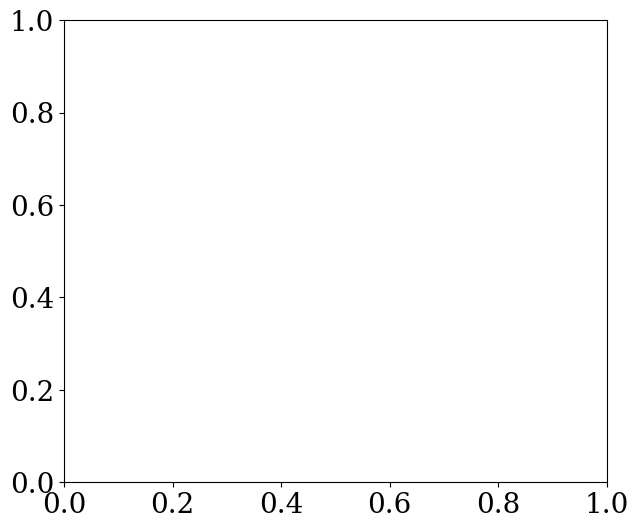

In [24]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import os
import numpy as np
import pandas as pd
from glob import glob

# ... keep all your existing functions: load_gamma_only_metric, load_gamma_metric_cycle, scenario_styles, exp_dirs, etc.

out_dir = "Images/cycle"
os.makedirs(out_dir, exist_ok=True)

metrics_for_cycle_figure = [
    "Cycle Probability",
    "Conditional Cycle Length",
    "Average Cycle Length",
]

scenarios_to_plot_on_cycle_fig = [
    ('reference', True),
    ('qlr_reference', True),
]

plt.rcParams.update({
    'font.size': 20,
    'axes.titlesize': 20,
    'axes.labelsize': 20,
    'xtick.labelsize': 20,
    'ytick.labelsize': 20,
    'legend.fontsize': 16,
    'font.family': 'serif',
    'mathtext.fontset': 'dejavuserif',
})

def plot_single_cycle_metric(metric_to_display, filename):
    fig, ax = plt.subplots(figsize=(7, 6))

    plot_handles = []
    plot_labels = []
    first_gamma_series = None

    for scenario_key in scenarios_to_plot_on_cycle_fig:
        if scenario_key not in scenario_styles or scenario_key not in exp_dirs:
            continue

        style_config = scenario_styles[scenario_key]
        scenario_parent_dir = exp_dirs[scenario_key]

        if not scenario_parent_dir or not os.path.isdir(scenario_parent_dir):
            continue

        gammas_agg, means_agg, stds_agg = [], [], []

        # --- QLR branch ---
        if scenario_key[0].startswith('qlr'):
            gamma_specific_dirs = glob(os.path.join(scenario_parent_dir, "gamma_*"))
            if not gamma_specific_dirs:
                continue

            temp_gammas, temp_means, temp_stds = [], [], []
            for gamma_dir in gamma_specific_dirs:
                g, m, s = load_gamma_only_metric(gamma_dir, metric_to_display)
                if g is not None and pd.notna(m):
                    temp_gammas.append(g)
                    temp_means.append(m)
                    temp_stds.append(s if pd.notna(s) else 0)

            if not temp_gammas:
                continue

            sort_idx = np.argsort(temp_gammas)
            gammas_agg = np.array(temp_gammas)[sort_idx]
            means_agg  = np.array(temp_means)[sort_idx]
            stds_agg   = np.array(temp_stds)[sort_idx]

        # --- Non-QLR branch (aggregate over lambdas) ---
        else:
            pattern_sub_dirs = "gamma_*_lambda_*"
            run_sub_dirs = glob(os.path.join(scenario_parent_dir, pattern_sub_dirs))
            if not run_sub_dirs:
                continue

            gamma_values, metric_values = [], []
            for run_dir_path in run_sub_dirs:
                g_val, m_val = load_gamma_metric_cycle(run_dir_path, metric_to_display)
                if g_val is not None and pd.notna(m_val):
                    gamma_values.append(g_val)
                    metric_values.append(m_val)

            if not gamma_values:
                continue

            df_scenario = pd.DataFrame({'gamma': gamma_values, 'value': metric_values})
            grouped = df_scenario.groupby('gamma')['value'].agg(['mean', 'std']).reset_index()
            grouped['std'].fillna(0, inplace=True)

            gammas_agg = grouped['gamma'].values
            means_agg  = grouped['mean'].values
            stds_agg   = grouped['std'].values

            sort_idx = np.argsort(gammas_agg)
            gammas_agg = gammas_agg[sort_idx]
            means_agg  = means_agg[sort_idx]
            stds_agg   = stds_agg[sort_idx]

        if len(gammas_agg) == 0:
            continue

        if first_gamma_series is None:
            first_gamma_series = gammas_agg

        ln, = ax.plot(
            gammas_agg, means_agg,
            color=style_config['color'],
            linestyle='-',
            marker=style_config['marker'],
            markersize=5,
            linewidth=1.5,
            label=style_config['label'],
            markevery=3,
        )
        ax.fill_between(
            gammas_agg,
            means_agg - 0.5 * stds_agg,
            means_agg + 0.8 * stds_agg,
            color=style_config['color'],
            alpha=0.15 if scenario_key[1] else 0.12,
        )

        plot_handles.append(ln)
        plot_labels.append(style_config['label'])

    # Cosmetics
    ax.set_title(metric_to_display)
    ax.set_xlabel(r"$\gamma$")
    ax.set_ylabel(metric_to_display)
    ax.grid(True, linestyle=':', linewidth=0.7, alpha=0.6)
    ax.tick_params(direction='in', top=True, right=True)

    if "Probability" in metric_to_display:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))
        ax.set_ylim(bottom=max(-0.05, ax.get_ylim()[0]), top=min(1.05, ax.get_ylim()[1]))
    elif "Cycle Length" in metric_to_display:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))
        ax.set_ylim(bottom=max(0, ax.get_ylim()[0]))

    if first_gamma_series is not None and first_gamma_series.size > 0:
        ax.set_xlim(first_gamma_series.min(), first_gamma_series.max())
    else:
        ax.set_xlim(0, 3)

    if plot_handles:
        ax.legend(frameon=False)

    fig.tight_layout()
    fig.savefig(os.path.join(out_dir, filename), dpi=300, bbox_inches='tight')
    plt.close(fig)
    print(f"Saved: {os.path.join(out_dir, filename)}")


# ---- Call once per metric ----
for metric in metrics_for_cycle_figure:
    safe_name = metric.lower().replace(" ", "_")
    fname = f"gamma_{safe_name}.pdf"   # or .png if you prefer
    plot_single_cycle_metric(metric, fname)


In [32]:
# ... (keep imports and helper functions like adjust_color_brightness, plot_heatmap_on_ax from previous answers if needed, though plot_heatmap_on_ax is not used for line plots)
import os
import pandas as pd
import numpy as np
from glob import glob
import types # For isinstance check
import matplotlib.ticker as mticker

# --- Modified load_gamma_only_metric ---
def load_gamma_only_metric(gamma_run_dir, metric_name_display):
    """
    Loads a specific metric for a given QLR gamma-specific run directory.
    Handles cycle metrics from session_summaries.csv and others from cycle_statistics.csv.
    Returns (gamma_value, mean_metric_value, std_metric_value) for the run.
    For new cycle metrics from session_summaries.csv, std_metric_value will be 0 or NaN.
    """
    base_gamma_dir_name = os.path.basename(gamma_run_dir)
    current_gamma = np.nan
    try:
        # Assumes directory name is like "gamma_0.1"
        current_gamma = float(base_gamma_dir_name.split("gamma_")[1])
    except (IndexError, ValueError):
        print(f"Could not parse gamma from QLR directory: {gamma_run_dir}")
        return None, np.nan, np.nan

    mean_val = np.nan
    std_val = np.nan # Default std for new metrics or if not found

    if metric_name_display in ["Cycle Probability", "Conditional Cycle Length", "Average Cycle Length"]:
        session_summary_file = os.path.join(gamma_run_dir, "session_summaries.csv")
        if not os.path.exists(session_summary_file):
            # print(f"QLR: session_summaries.csv not found in {gamma_run_dir} for {metric_name_display}")
            return current_gamma, np.nan, np.nan
        
        try:
            df_sessions = pd.read_csv(session_summary_file)
            if df_sessions.empty or 'cycle_length' not in df_sessions.columns:
                return current_gamma, np.nan, np.nan
            df_sessions['cycle_length'] = pd.to_numeric(df_sessions['cycle_length'], errors='coerce').dropna()
            if df_sessions.empty: return current_gamma, np.nan, np.nan

            if metric_name_display == "Cycle Probability":
                mean_val = (df_sessions['cycle_length'] > 1).sum() / len(df_sessions) if len(df_sessions) > 0 else 0
                std_val = 0 # Probability is a single value from this file
            elif metric_name_display == "Conditional Cycle Length":
                cycles_df = df_sessions[df_sessions['cycle_length'] > 1]
                mean_val = cycles_df['cycle_length'].mean() if not cycles_df.empty else np.nan
                std_val = cycles_df['cycle_length'].std() if not cycles_df.empty and len(cycles_df) > 1 else 0 # Std of cycle lengths if multiple cycles > 1
            elif metric_name_display == "Average Cycle Length": # Avg of all cycle_length in session_summaries
                mean_val = df_sessions['cycle_length'].mean()
                std_val = df_sessions['cycle_length'].std() if len(df_sessions) > 1 else 0 # Std of cycle lengths
            if std_val is np.nan: std_val = 0 # Ensure std is not NaN if calculation yields it
                
        except Exception as e:
            print(f"QLR Err session_sum {gamma_run_dir} for {metric_name_display}: {e}")
            return current_gamma, np.nan, np.nan
    
    # For other metrics from cycle_statistics.csv (Price, Profit, Gains, or original mean_cycle_length)
    else:
        stats_file = os.path.join(gamma_run_dir, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            # print(f"QLR: cycle_statistics.csv not found in {gamma_run_dir} for {metric_name_display}")
            return current_gamma, np.nan, np.nan
        try:
            df_stats = pd.read_csv(stats_file)
            if not df_stats.empty:
                internal_metric_name = metric_name_display.lower().replace(" ", "_")
                
                # Check for pre-aggregated mean_cycle_length if that's the metric name used
                if metric_name_display == "Old Avg Cycle Length" or internal_metric_name == "mean_cycle_length":
                    if "mean_cycle_length" in df_stats.columns:
                        mean_val = float(df_stats["mean_cycle_length"].iloc[0])
                        std_val = float(df_stats["std_cycle_length"].iloc[0]) if "std_cycle_length" in df_stats.columns else 0
                else: # For Price, Profit, Price Gain, Profit Gain
                    mean_col_prefix = f'mean_{internal_metric_name}_p'
                    std_col_prefix = f'std_{internal_metric_name}_p'
                    
                    mean_cols = [c for c in df_stats.columns if c.startswith(mean_col_prefix)]
                    std_cols  = [c for c in df_stats.columns if c.startswith(std_col_prefix)]

                    if mean_cols: # Std_cols might not exist for all metrics
                        numeric_mean_data = df_stats[mean_cols].apply(pd.to_numeric, errors='coerce')
                        if not numeric_mean_data.empty and not numeric_mean_data.isnull().all().all():
                            mean_val = numeric_mean_data.mean(axis=1).iloc[0]
                        
                        if std_cols:
                            numeric_std_data = df_stats[std_cols].apply(pd.to_numeric, errors='coerce')
                            if not numeric_std_data.empty and not numeric_std_data.isnull().all().all():
                                std_val = numeric_std_data.mean(axis=1).iloc[0] # Average of stds if multiple player stds
                            else: std_val = 0 # if std_cols exist but data is bad
                        else: std_val = 0 # If no std_cols found, assume std is 0 for plotting
                    else: 
                        # print(f"QLR: No mean_cols found for {metric_name_display} in {stats_file}")
                        pass # mean_val remains np.nan
            else:
                # print(f"QLR: cycle_statistics.csv is empty in {gamma_run_dir}")
                pass
        except Exception as e:
            print(f"QLR Err cycle_stats {gamma_run_dir} for {metric_name_display}: {e}")
            return current_gamma, np.nan, np.nan

    return current_gamma, mean_val, std_val if pd.notna(std_val) else 0
# --- load_gamma_metric_cycle (from your previous response, for non-QLR data) ---
def load_gamma_metric_cycle(run_dir_path, metric_name_display):
    # (This is the function you provided that processes gamma_X_lambda_Y directories
    # and expects aggregation to happen outside, based on the gamma value it returns)
    base_run_dir_name = os.path.basename(run_dir_path)
    current_gamma = np.nan
    try:
        current_gamma = float(base_run_dir_name.split('gamma_')[1].split('_lambda_')[0])
    except (Ind

# --- Configuration ---
out_dir = "./Figures_Cycle_Metrics_with_QLR"
os.makedirs(out_dir, exist_ok=True)

folder_location = "../Results/experiments"
base_exp_name = "noloss/gamma_lambda"
# IMPORTANT: Define the base name for your QLR experiment directories
base_qlr_exp_name = "recreating_results_code2/gamma" # EXAMPLE - CHANGE THIS

exp_dirs = {
    ('reference', True): os.path.join(folder_location, f"{base_exp_name}_reference_True"),
    ('reference', False): os.path.join(folder_location, f"{base_exp_name}_reference_False"),
    ('misspecification', True): os.path.join(folder_location, f"{base_exp_name}_misspecification_True"),
    ('misspecification', False): os.path.join(folder_location, f"{base_exp_name}_misspecification_False"),
    # QLR paths - these parent directories should contain "gamma_X" subfolders
    ('qlr_reference', True): os.path.join(folder_location, f"{base_qlr_exp_name}_only_reference_True"),
    ('qlr_reference', False): os.path.join(folder_location, f"{base_qlr_exp_name}_only_reference_False"), # If you have CR=False for QLR
}

# --- Scenario Styles ---
def adjust_color_brightness(color_name, factor):
    try: c = mcolors.to_rgb(color_name); c_hsv = mcolors.rgb_to_hsv(c); c_hsv[2] = np.clip(c_hsv[2] * factor, 0, 1); return mcolors.hsv_to_rgb(c_hsv)
    except ValueError: return color_name

scenario_styles = {
    ('reference', True): {'color': 'tab:blue', 'marker': 'o', 'label': "Reference-Aware Firms Exp Smoothing"},
    ('reference', False): {'color': adjust_color_brightness('tab:blue', 1.3), 'marker': 's', 'label': "Exp Smoothing(Reference-Aware, CR=False)"},
    ('misspecification', True): {'color': 'tab:orange', 'marker': 'o', 'label': "Exp Smoothing(Reference-Naive, CR=True)"},
    ('misspecification', False): {'color': adjust_color_brightness('tab:orange', 1.3), 'marker': 's', 'label': "Exp Smoothing(Reference-Naive,CR=False)"},
    ('qlr_reference', True): {'color': 'tab:green', 'marker': 'D', 'label': "Reference-Aware Firms"},
    ('qlr_reference', False): {'color': adjust_color_brightness('tab:green', 1.3), 'marker': 'P', 'label': "QLR Pred(Reference-Aware,CR=False)"},
}

# --- Plotting Setup ---
plt.rcParams.update({
    'font.size': 20, 'axes.titlesize': 20, 'axes.labelsize': 20,
    'xtick.labelsize': 20, 'ytick.labelsize': 20, 'legend.fontsize': 20, # Smaller legend
    'figure.titlesize': 18, 'font.family': 'serif', 'mathtext.fontset': 'dejavuserif',
})

metrics_for_cycle_figure = ["Cycle Probability", "Conditional Cycle Length", "Average Cycle Length"]
# Define which scenarios to plot on these axes
scenarios_to_plot_on_cycle_fig = [
    ('reference', True),
    #('reference', False),
    #('misspecification', True),
    #('misspecification', False),
    ('qlr_reference', True),      # Add QLR scenario
    # ('qlr_reference', False),   # Add if you have this data and want to plot it
]

fig_cycle, axes_cycle = plt.subplots(1, 3, figsize=(22, 9), sharex=True) # Slightly wider for legend
if not isinstance(axes_cycle, np.ndarray): axes_cycle = np.array([axes_cycle])
axes_cycle_flat = axes_cycle.flatten()

plot_handles_for_legend_cycle = []
plot_labels_for_legend_cycle = []
legend_elements_collected_cycle = False

for idx, metric_to_display in enumerate(metrics_for_cycle_figure):
    if idx >= len(axes_cycle_flat): break
    ax = axes_cycle_flat[idx]
    ax.set_title(metric_to_display)
    first_gamma_series_for_xlim_cycle = None

    for scenario_key in scenarios_to_plot_on_cycle_fig:
        if scenario_key not in scenario_styles or scenario_key not in exp_dirs:
            print(f"Skipping scenario {scenario_key}: not in styles or exp_dirs.")
            continue
        
        style_config = scenario_styles[scenario_key]
        scenario_parent_dir = exp_dirs[scenario_key]

        if not scenario_parent_dir or not os.path.isdir(scenario_parent_dir):
            print(f"Path for key {scenario_key} is invalid: {scenario_parent_dir}")
            continue
        
        # --- Data Loading and Aggregation Logic ---
        gammas_agg, means_agg, stds_agg = [], [], []

        if scenario_key[0].startswith('qlr'): # Use load_gamma_only_metric
            # QLR data is per gamma, so glob for gamma_* subdirs
            gamma_specific_dirs = glob(os.path.join(scenario_parent_dir, "gamma_*"))
            if not gamma_specific_dirs:
                print(f"No gamma-specific subdirectories found in QLR path: {scenario_parent_dir}")
                continue
            
            temp_gammas, temp_means, temp_stds = [], [], []
            for gamma_dir in gamma_specific_dirs:
                g, m, s = load_gamma_only_metric(gamma_dir, metric_to_display)
                if g is not None and pd.notna(m):
                    temp_gammas.append(g)
                    temp_means.append(m)
                    temp_stds.append(s if pd.notna(s) else 0) # Use 0 for std if NaN
            
            if not temp_gammas: continue
            # Sort by gamma for QLR data as it's collected per gamma dir
            sort_indices_qlr = np.argsort(temp_gammas)
            gammas_agg = np.array(temp_gammas)[sort_indices_qlr]
            means_agg = np.array(temp_means)[sort_indices_qlr]
            stds_agg = np.array(temp_stds)[sort_indices_qlr]

        else: # Use load_gamma_metric_cycle and aggregate over lambdas
            pattern_sub_dirs = "gamma_*_lambda_*"
            run_sub_dirs = glob(os.path.join(scenario_parent_dir, pattern_sub_dirs))
            if not run_sub_dirs: continue

            gamma_values_for_scenario, metric_values_for_scenario = [], []
            for run_dir_path in run_sub_dirs:
                g_val, m_val = load_gamma_metric_cycle(run_dir_path, metric_to_display)
                if g_val is not None and pd.notna(m_val):
                    gamma_values_for_scenario.append(g_val)
                    metric_values_for_scenario.append(m_val)
            
            if not gamma_values_for_scenario: continue
            df_scenario_data = pd.DataFrame({'gamma': gamma_values_for_scenario, 'value': metric_values_for_scenario})
            
            std_dev_data = df_scenario_data.groupby('gamma')['value'].std()
            mean_data = df_scenario_data.groupby('gamma')['value'].mean()
            grouped_scenario = pd.DataFrame({'mean': mean_data, 'std': std_dev_data}).reset_index()
            grouped_scenario['std'].fillna(0, inplace=True)

            gammas_agg, means_agg, stds_agg = grouped_scenario['gamma'].values, grouped_scenario['mean'].values, grouped_scenario['std'].values
            # Sort by gamma (already done by groupby, but good practice)
            sort_indices = np.argsort(gammas_agg)
            gammas_agg, means_agg, stds_agg = gammas_agg[sort_indices], means_agg[sort_indices], stds_agg[sort_indices]
        
        # --- Plotting ---
        if first_gamma_series_for_xlim_cycle is None and gammas_agg.size > 0:
            first_gamma_series_for_xlim_cycle = gammas_agg

        ln, = ax.plot(gammas_agg, means_agg, color=style_config['color'], linestyle='-',
                      marker=style_config['marker'], markersize=5, linewidth=1.5, 
                      label=style_config['label'], markevery=3)
        ax.fill_between(gammas_agg, means_agg - 0.5*stds_agg, means_agg + 0.8*stds_agg, 
                        color=style_config['color'], alpha=0.15 if scenario_key[1] else 0.12) # CR=False slightly more transparent fill

        if not legend_elements_collected_cycle:
            plot_handles_for_legend_cycle.append(ln)
            plot_labels_for_legend_cycle.append(style_config['label'])
            
    if not legend_elements_collected_cycle and plot_handles_for_legend_cycle:
        legend_elements_collected_cycle = True

    # Axis Cosmetics
    ax.grid(True, linestyle=':', linewidth=0.7, alpha=0.6)
    ax.set_ylabel(metric_to_display)
    ax.tick_params(direction='in', top=True, right=True)
    if "Probability" in metric_to_display:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f')); ax.set_ylim(bottom=max(-0.05, ax.get_ylim()[0]), top=min(1.05, ax.get_ylim()[1]))
    elif "Cycle Length" in metric_to_display:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f')); ax.set_ylim(bottom=max(0, ax.get_ylim()[0]))
    ax.set_xlabel(r"$\gamma$ (Reference Dependence Strength)")
    if first_gamma_series_for_xlim_cycle is not None and first_gamma_series_for_xlim_cycle.size > 0:
         ax.set_xlim(left=first_gamma_series_for_xlim_cycle.min(), right=first_gamma_series_for_xlim_cycle.max())
    else: ax.set_xlim(0, 3)

# --- Suptitle, Shared Legend & Layout for Cycle Figure ---
#fig_cycle.suptitle("Analysis of Cycle Metrics vs. Reference Dependence (γ)", y=0.99, fontsize=plt.rcParams['figure.titlesize'])
if plot_handles_for_legend_cycle:
    num_items = len(plot_handles_for_legend_cycle)
    ncol_lg = 2 if num_items > 3 else num_items # Try 2 columns if more than 3 items
    bbox_y = 0.92 if num_items <=3 else 0.90 # Adjust legend y based on rows
    fig_cycle.lexError, ValueError): return None, np.nan
    val = np.nan
    if metric_name_display in ["Cycle Probability", "Conditional Cycle Length", "Average Cycle Length"]:
        session_summary_file = os.path.join(run_dir_path, "session_summaries.csv")
        if not os.path.exists(session_summary_file): return current_gamma, np.nan
        try:
            df_sessions = pd.read_csv(session_summary_file)
            if df_sessions.empty or 'cycle_length' not in df_sessions.columns: return current_gamma, np.nan
            df_sessions['cycle_length'] = pd.to_numeric(df_sessions['cycle_length'], errors='coerce').dropna()
            if df_sessions.empty: return current_gamma, np.nan
            if metric_name_display == "Cycle Probability": val = (df_sessions['cycle_length'] > 1).sum() / len(df_sessions) if len(df_sessions) > 0 else 0
            elif metric_name_display == "Conditional Cycle Length":
                cycles_df = df_sessions[df_sessions['cycle_length'] > 1]; val = cycles_df['cycle_length'].mean() if not cycles_df.empty else np.nan
            elif metric_name_display == "Average Cycle Length": val = df_sessions['cycle_length'].mean()
        except Exception: return current_gamma, np.nan
    else: # For other metrics from cycle_statistics.csv
        stats_file = os.path.join(run_dir_path, "cycle_statistics.csv")
        if not os.path.exists(stats_file): return current_gamma, np.nan
        try:
            df_stats = pd.read_csv(stats_file); #... (rest of your original logic for other metrics)
            # This part needs to be complete if you plot other metrics with this function
            if not df_stats.empty:
                internal_metric_name = metric_name_display.lower().replace(" ", "_")
                col_prefix = 'mean_cycle_length' if metric_name_display == 'Old Avg Cycle Length' else f'mean_{internal_metric_name}_p'
                cols = [c for c in df_stats.columns if c.startswith(col_prefix)]
                if cols:
                    numeric_data = df_stats[cols].apply(pd.to_numeric, errors='coerce')
                    if not numeric_data.empty and not numeric_data.isnull().all().all(): val = numeric_data.mean(axis=1).iloc[0]
        except Exception: return current_gamma, np.nan
    return current_gamma, val
legend(plot_handles_for_legend_cycle, plot_labels_for_legend_cycle,
                     loc='upper center', bbox_to_anchor=(0.5, bbox_y),
                     ncol=ncol_lg, frameon=False, handlelength=2.0, labelspacing=0.4, columnspacing=1.0)
    rect_top_val = 0.85 if num_items > 3 else 0.88 # More space for taller legend
    fig_cycle.tight_layout(rect=[0, 0.03, 1, rect_top_val], h_pad=3.0, w_pad=2.0)
else:
    fig_cycle.tight_layout(rect=[0, 0.03, 1, 0.93], h_pad=3.0, w_pad=2.0)

cycle_fig_fname = "gamma_cycle_metrics_3x1_with_qlr.png"
fig_cycle.savefig(os.path.join(out_dir, cycle_fig_fname), dpi=300, bbox_inches='tight')
print(f"Cycle metrics figure saved to {os.path.join(out_dir, cycle_fig_fname)}")
plt.show()

SyntaxError: invalid syntax. Perhaps you forgot a comma? (2425967181.py, line 111)

In [37]:
import matplotlib.pyplot as plt
folder_location = "../Results/experiments"
base_exp_name = "noloss/gamma_lambda"
# IMPORTANT: Define the base name for your QLR experiment directories
base_qlr_exp_name = "recreating_results_code2/gamma" # EXAMPLE - CHANGE THIS

exp_dirs = {
    ('reference', True): os.path.join(folder_location, f"{base_exp_name}_reference_True"),
    ('reference', False): os.path.join(folder_location, f"{base_exp_name}_reference_False"),
    ('misspecification', True): os.path.join(folder_location, f"{base_exp_name}_misspecification_True"),
    ('misspecification', False): os.path.join(folder_location, f"{base_exp_name}_misspecification_False"),
    # QLR paths - these parent directories should contain "gamma_X" subfolders
    ('qlr_reference', True): os.path.join(folder_location, f"{base_qlr_exp_name}_only_reference_True"),
    ('qlr_reference', False): os.path.join(folder_location, f"{base_qlr_exp_name}_only_reference_False"), # If you have CR=False for QLR
}

# --- Scenario Styles ---
def adjust_color_brightness(color_name, factor):
    try: c = mcolors.to_rgb(color_name); c_hsv = mcolors.rgb_to_hsv(c); c_hsv[2] = np.clip(c_hsv[2] * factor, 0, 1); return mcolors.hsv_to_rgb(c_hsv)
    except ValueError: return color_name


scenario_styles = {
    ('reference', True): {'color': 'tab:blue', 'marker': 'o', 'label': "Reference-Aware Firms Exp Smoothing"},
    ('reference', False): {'color': adjust_color_brightness('tab:blue', 1.3), 'marker': 's', 'label': "Exp Smoothing(Reference-Aware, CR=False)"},
    ('misspecification', True): {'color': 'tab:orange', 'marker': 'o', 'label': "Exp Smoothing(Reference-Naive, CR=True)"},
    ('misspecification', False): {'color': adjust_color_brightness('tab:orange', 1.3), 'marker': 's', 'label': "Exp Smoothing(Reference-Naive,CR=False)"},
    ('qlr_reference', True): {'color': 'tab:green', 'marker': 'D', 'label': "Reference-Aware Firms Q-Learning"},
    ('qlr_reference', False): {'color': adjust_color_brightness('tab:green', 1.3), 'marker': 'P', 'label': "QLR Pred(Reference-Aware,CR=False)"},
}

plt.rcParams.update({
    'font.size': 20,         # General font size
    'axes.titlesize': 20,    # Subplot title
    'axes.labelsize': 20,    # Axis labels
    'xtick.labelsize': 20,   # X-axis tick labels
    'ytick.labelsize': 20,   # Y-axis tick labels
    'legend.fontsize': 15,   # Legend text
})

def save_legend(handles, labels, filename, ncol=2, figsize=(7, 1.0)):
    """
    Save a standalone legend as its own figure.
    """
    fig_leg = plt.figure(figsize=figsize)
    ax = fig_leg.add_subplot(111)
    ax.axis("off")

    legend = fig_leg.legend(
        handles, labels,
        loc="center",
        ncol=ncol,
        frameon=False,
        handlelength=2.0,
        columnspacing=1.0,
        labelspacing=0.4,
    )

    fig_leg.savefig(filename, dpi=300, bbox_inches="tight")
    plt.close(fig_leg)
    print(f"Saved legend to {filename}")



def plot_single_cycle_metric(metric_to_display, filename, return_legend_handles=False):
    fig, ax = plt.subplots(figsize=(7, 6))

    plot_handles = []
    plot_labels = []
    first_gamma_series = None

    for scenario_key in scenarios_to_plot_on_cycle_fig:
        if scenario_key not in scenario_styles or scenario_key not in exp_dirs:
            continue

        style_config = scenario_styles[scenario_key]
        scenario_parent_dir = exp_dirs[scenario_key]

        if not scenario_parent_dir or not os.path.isdir(scenario_parent_dir):
            continue

        gammas_agg, means_agg, stds_agg = [], [], []

        # --- QLR branch ---
        if scenario_key[0].startswith('qlr'):
            gamma_specific_dirs = glob(os.path.join(scenario_parent_dir, "gamma_*"))
            if not gamma_specific_dirs:
                continue

            temp_gammas, temp_means, temp_stds = [], [], []
            for gamma_dir in gamma_specific_dirs:
                g, m, s = load_gamma_only_metric(gamma_dir, metric_to_display)
                if g is not None and pd.notna(m):
                    temp_gammas.append(g)
                    temp_means.append(m)
                    temp_stds.append(s if pd.notna(s) else 0)

            if not temp_gammas:
                continue

            sort_idx = np.argsort(temp_gammas)
            gammas_agg = np.array(temp_gammas)[sort_idx]
            means_agg  = np.array(temp_means)[sort_idx]
            stds_agg   = np.array(temp_stds)[sort_idx]

        # --- Non-QLR branch (aggregate over lambdas) ---
        else:
            pattern_sub_dirs = "gamma_*_lambda_*"
            run_sub_dirs = glob(os.path.join(scenario_parent_dir, pattern_sub_dirs))
            if not run_sub_dirs:
                continue

            gamma_values, metric_values = [], []
            for run_dir_path in run_sub_dirs:
                g_val, m_val = load_gamma_metric_cycle(run_dir_path, metric_to_display)
                if g_val is not None and pd.notna(m_val):
                    gamma_values.append(g_val)
                    metric_values.append(m_val)

            if not gamma_values:
                continue

            df_scenario = pd.DataFrame({'gamma': gamma_values, 'value': metric_values})
            grouped = df_scenario.groupby('gamma')['value'].agg(['mean', 'std']).reset_index()
            grouped['std'].fillna(0, inplace=True)

            gammas_agg = grouped['gamma'].values
            means_agg  = grouped['mean'].values
            stds_agg   = grouped['std'].values

            sort_idx = np.argsort(gammas_agg)
            gammas_agg = gammas_agg[sort_idx]
            means_agg  = means_agg[sort_idx]
            stds_agg   = stds_agg[sort_idx]

        if len(gammas_agg) == 0:
            continue

        if first_gamma_series is None:
            first_gamma_series = gammas_agg

        ln, = ax.plot(
            gammas_agg, means_agg,
            color=style_config['color'],
            linestyle='-',
            marker=style_config['marker'],
            markersize=5,
            linewidth=1.5,
            label=style_config['label'],
            markevery=3,
        )
        ax.fill_between(
            gammas_agg,
            means_agg - 0.5 * stds_agg,
            means_agg + 0.8 * stds_agg,
            color=style_config['color'],
            alpha=0.15 if scenario_key[1] else 0.12,
        )

        plot_handles.append(ln)
        plot_labels.append(style_config['label'])

    # Cosmetics
    #ax.set_title(metric_to_display)
    ax.set_xlabel(r"$\gamma$", fontsize=20)
    ax.set_ylabel(metric_to_display, fontsize=20)
    ax.grid(True, linestyle=':', linewidth=0.7, alpha=0.6)
    ax.tick_params(direction='in', top=True, right=True)

    if "Probability" in metric_to_display:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))
        ax.set_ylim(bottom=max(-0.05, ax.get_ylim()[0]), top=min(1.05, ax.get_ylim()[1]))
    elif "Cycle Length" in metric_to_display:
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))
        ax.set_ylim(bottom=max(0, ax.get_ylim()[0]))

    if first_gamma_series is not None and first_gamma_series.size > 0:
        ax.set_xlim(first_gamma_series.min(), first_gamma_series.max())
    else:
        ax.set_xlim(0, 3)

    # IMPORTANT: do NOT add ax.legend() here, since we’ll use separate legend

    fig.tight_layout()
    full_path = os.path.join(out_dir, filename)
    fig.savefig(full_path, dpi=300, bbox_inches='tight')
    plt.close(fig)
    print(f"Saved: {full_path}")

    if return_legend_handles:
        return plot_handles, plot_labels
    return None, None


metrics_for_cycle_figure = [
    "Cycle Probability",
    "Conditional Cycle Length",
    "Average Cycle Length",
]

legend_handles, legend_labels = None, None

for idx, metric in enumerate(metrics_for_cycle_figure):
    out_dir = "Images/cycle"
    safe_name = metric.lower().replace(" ", "_")
    fname = f"gamma_{safe_name}.png"

    # For the first metric, also get legend handles
    if idx == 0:
        legend_handles, legend_labels = plot_single_cycle_metric(
            metric, fname, return_legend_handles=True
        )
    else:
        plot_single_cycle_metric(metric, fname, return_legend_handles=False)

# Save standalone legend (using handles from first plot)
if legend_handles:
    legend_file = "Images/cycle/gamma_cycle_legend.png"
    save_legend(legend_handles, legend_labels, legend_file, ncol=2)



/var/folders/xc/z0h2gmnn7gs78ryc5jz6h_mw0000gn/T/ipykernel_90168/19824421.py:125: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  grouped['std'].fillna(0, inplace=True)


Saved: Images/cycle/gamma_cycle_probability.png


/var/folders/xc/z0h2gmnn7gs78ryc5jz6h_mw0000gn/T/ipykernel_90168/19824421.py:125: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  grouped['std'].fillna(0, inplace=True)


Saved: Images/cycle/gamma_conditional_cycle_length.png
Saved: Images/cycle/gamma_average_cycle_length.png
Saved legend to Images/cycle/gamma_cycle_legend.png


/var/folders/xc/z0h2gmnn7gs78ryc5jz6h_mw0000gn/T/ipykernel_90168/19824421.py:125: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  grouped['std'].fillna(0, inplace=True)


Calculating SMOOTH equilibria for 31 gamma values...
[0.47292666 0.47292666] [0.47137681 0.47137681]
[0.92498092 0.92498092] [0.36486208 0.36486208]
[0.42425004 0.42425004] [0.47619988 0.47619988]
[0.89598627 0.89598627] [0.37599016 0.37599016]
[0.38429858 0.38429858] [0.47957132 0.47957132]
[0.87076239 0.87076239] [0.38515811 0.38515811]
[0.35101801 0.35101801] [0.48202606 0.48202606]
[0.84847118 0.84847118] [0.39285542 0.39285542]
[0.32291933 0.32291933] [0.48387522 0.48387522]
[0.82852345 0.82852345] [0.39941946 0.39941946]
[0.2989094 0.2989094] [0.48530841 0.48530841]
[0.81048973 0.81048973] [0.40509062 0.40509062]
[0.27817362 0.27817362] [0.48644611 0.48644611]
[0.79404755 0.79404755] [0.41004497 0.41004497]
[0.26009548 0.26009548] [0.48736774 0.48736774]
[0.77894883 0.77894883] [0.41441457 0.41441457]
[0.24420138 0.24420138] [0.48812738 0.48812738]
[0.7649987 0.7649987] [0.41830051 0.41830051]
[0.23012231 0.23012231] [0.48876291 0.48876291]
[0.75204139 0.75204139] [0.42178153 0.4

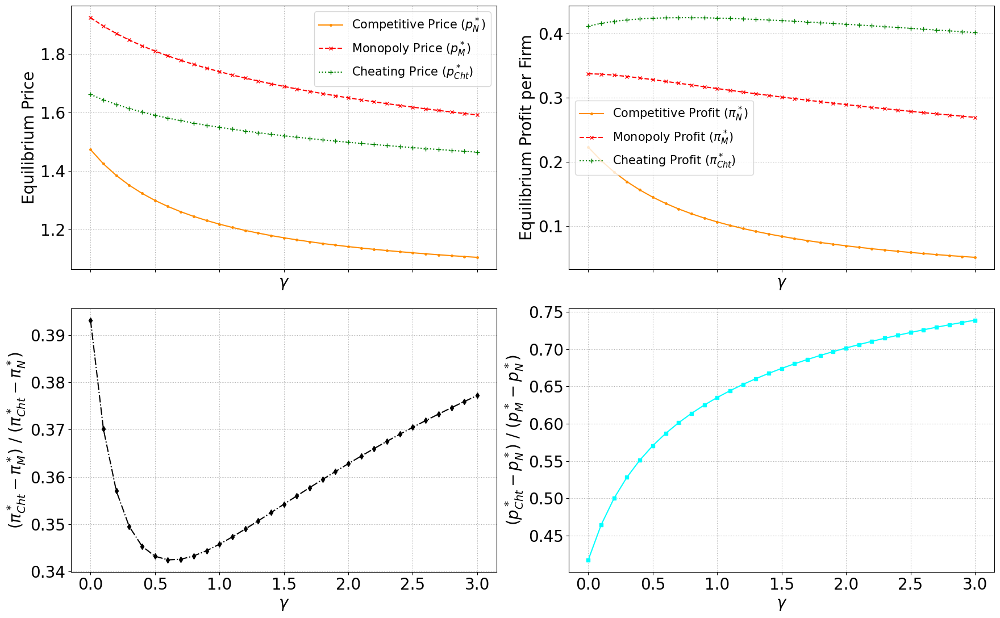

Plot display finished.
Generating requested Collusive vs. Nash Price plot...


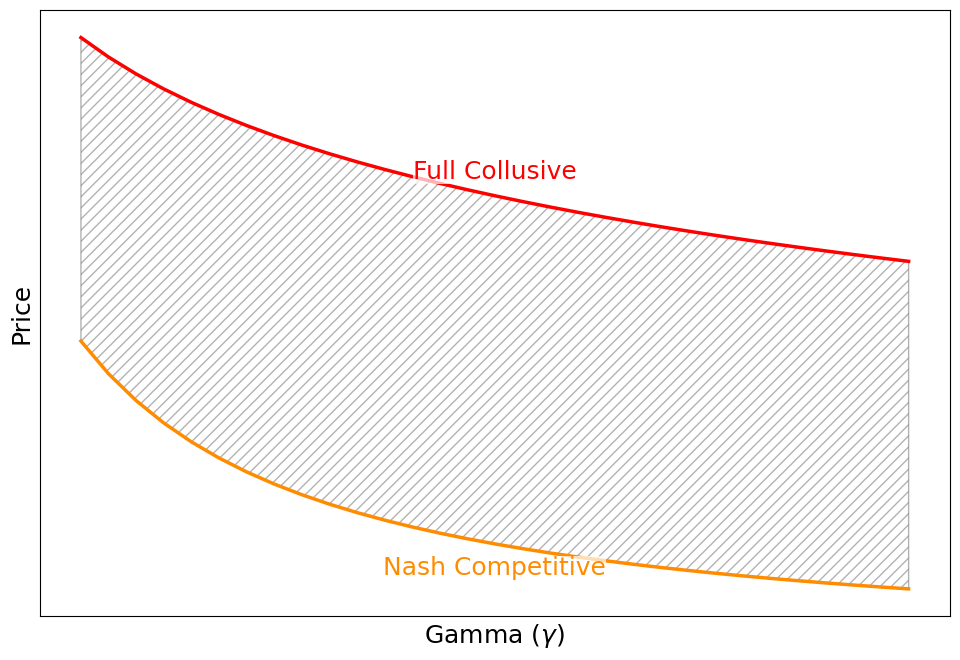

Requested plot generation finished.


In [12]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve
from itertools import product

# --- Model Class Definition with SMOOTH FOCs ---
# (Keep the model class definition exactly as in the previous version)
class model(object):
    """
    Model of algorithms and competition
    (Calculates Nash, Monopoly, and Cheating equilibria using SMOOTH FOCs)
    """

    def __init__(self, **kwargs):
        """Initialize game and compute equilibria"""
        # Default properties
        self.n = kwargs.get('n', 2)
        self.gamma = kwargs.get('gamma', 1)
        self.lossaversion = kwargs.get('lossaversion', 1.0)
        self.c = kwargs.get('c', 1)
        self.a = kwargs.get('a', 2)
        self.a0 = kwargs.get('a0', 0)
        self.mu = kwargs.get('mu', 0.25)
        self.common_reference = kwargs.get('common_reference', True)
        self.demand_type = kwargs.get('demand_type', 'reference')
        self.foc_smoothness = kwargs.get('foc_smoothness', 40) # Steepness factor

        if self.gamma > 0 and self.demand_type == 'noreference':
             self.demand_type = 'reference'

        valid_demand_types = {'reference', 'noreference','misspecification'}
        if self.demand_type not in valid_demand_types:
            raise ValueError(f"Invalid demand_type: {self.demand_type}. Allowed values: {valid_demand_types}")

        self.reference_loss_aversion = self.lossaversion > 1

        # --- Compute Nash, Monopoly, and Cheating equilibria ---
        p0_nash = np.ones(self.n) * self.c * 1.5 # Initial guess Nash
        p0_coop = np.ones(self.n) * self.c * 2.5 # Initial guess Coop

        # Initialize result arrays with NaNs
        self.p_nash = np.full(self.n, np.nan)
        self.NashProfits = np.full(self.n, np.nan)
        self.p_coop = np.full(self.n, np.nan)
        self.CoopProfits = np.full(self.n, np.nan)
        self.p_cheat = np.nan
        self.CheatProfit = np.nan

        try:
            p_nash_sol = fsolve(self.foc, p0_nash, xtol=1.49012e-08)
            p_coop_sol = fsolve(self.foc_monopoly, p0_coop, xtol=1.49012e-08)

            valid_nash = not np.isnan(p_nash_sol).any() and all(p_nash_sol > -1e-6)
            valid_coop = not np.isnan(p_coop_sol).any() and all(p_coop_sol > -1e-6)

            if valid_nash:
                self.p_nash = p_nash_sol
                r_nash = self.reference_price(self.p_nash)
                nash_demand = self.demand(self.p_nash, r=r_nash)
                self.NashProfits = (self.p_nash - self.c) * nash_demand
                print((self.p_nash - self.c), nash_demand)

            if valid_coop:
                self.p_coop = p_coop_sol
                r_coop = self.reference_price(self.p_coop)
                coop_demand = self.demand(self.p_coop, r=r_coop)
                self.CoopProfits = (self.p_coop - self.c) * coop_demand
                print((self.p_coop - self.c), coop_demand)

                if valid_nash: # Need Nash profit for the gain calculation later
                    p_M = self.p_coop[0]
                    # Use a guess below Nash, as cheating price is typically low
                    p0_cheat = self.p_nash[0] * 0.95 if self.p_nash[0] > 0 else p_M * 0.9

                    try:
                        p_cheat_sol = fsolve(self.foc_cheat, p0_cheat, args=(p_M,), xtol=1.49012e-08)
                        # print('cheat', p_cheat_sol)
                        # print('nash,coop', self.p_nash[0], p_M)

                        # Check if result is a single value array
                        if isinstance(p_cheat_sol, (np.ndarray, list)) and len(p_cheat_sol) > 0:
                           p_cheat_val = p_cheat_sol[0]
                        else:
                           p_cheat_val = p_cheat_sol # Assume scalar if not array

                        if not np.isnan(p_cheat_val) and p_cheat_val > -1e-6:
                            self.p_cheat = p_cheat_val # Store the scalar value
                            p_vector_cheat = np.full(self.n, p_M)
                            p_vector_cheat[0] = self.p_cheat
                            r_cheat = p_M
                            cheat_demand_vector = self.demand(p_vector_cheat, r=r_cheat)
                            self.CheatProfit = (self.p_cheat - self.c) * cheat_demand_vector[0]
                        # else: print(f"Debug: Invalid/NaN Cheating price (smooth) gamma={self.gamma}, sol={p_cheat_sol}")
                    except Exception as e_cheat:
                        print(f"Error solving smooth cheating price gamma={self.gamma}: {e_cheat}")
                # else: print(f"Debug: Nash invalid, cannot calculate cheat gain (smooth) gamma={self.gamma}")
            # else: print(f"Debug: Invalid/NaN Coop price (smooth) gamma={self.gamma}")

        except Exception as e_fsolve:
            print(f"Error during smooth fsolve for gamma={self.gamma}: {e_fsolve}")


    # --- Demand and Reference Price ---
    def reference_price(self, p):
        if self.common_reference:
            p_array = np.atleast_1d(p); return np.mean(p_array)
        else: return p

    def demand(self, p, r=None):
        p = np.asarray(p)
        if self.demand_type == 'noreference':
            e = np.exp((self.a - p) / self.mu)
            sum_e = np.sum(e) if e.ndim > 0 else e
            d = e / (sum_e + np.exp(self.a0 / self.mu))
        elif self.demand_type in ["reference", "misspecification"]:
            if r is None: r = self.reference_price(p)
            r = np.asarray(r)
            if self.common_reference and r.ndim == 0: r = np.full_like(p, r)
            p_eff = p + self.gamma * (p - r)
            if self.reference_loss_aversion:
                # Demand calculation still uses hard step logic
                price_above_r = p >= r; price_below_r = p < r
                p_eff = (p + self.gamma * (p - r) * price_below_r +
                         self.lossaversion * self.gamma * (p - r) * price_above_r)
            e = np.exp((self.a - p_eff) / self.mu)
            sum_e = np.sum(e) if e.ndim > 0 else e
            d = e / (sum_e + np.exp(self.a0 / self.mu))
        return d

    # --- SMOOTH FOC Functions ---
    def foc(self, p):
        """Compute first order condition using SMOOTH indicators"""
        p = np.asarray(p); r_eq = self.reference_price(p); d = self.demand(p, r=r_eq)
        one_minus_d = (1 - d) if d.ndim == 0 or d.shape[0] == 1 else (1 - d)
        if self.demand_type == 'noreference':
             zero = 1 - (p - self.c) * one_minus_d / self.mu
        elif self.demand_type in ["reference", "misspecification"]:
            p_i = p[0]; r_i = r_eq[0] if isinstance(r_eq, np.ndarray) else r_eq # Check at symmetric point
            if self.reference_loss_aversion:
                price_above_r = 1 / (1 + np.exp(-self.foc_smoothness * (p_i - r_i)))
                price_below_r = 1 / (1 + np.exp(self.foc_smoothness * (p_i - r_i)))
                derivative_factor = (1 + self.gamma * price_below_r + self.lossaversion * self.gamma * price_above_r)
            else: derivative_factor = (1 + self.gamma)
            zero = 1 - derivative_factor * (p - self.c) * one_minus_d / self.mu
        return np.squeeze(zero)

    def foc_monopoly(self, p):
        """Compute first-order condition for collusion using SMOOTH indicators"""
        p = np.asarray(p); r_eq = self.reference_price(p); d = self.demand(p, r=r_eq)
        p_vec = p.reshape(-1, 1) if p.ndim == 1 else p; d_vec = d.reshape(-1, 1) if d.ndim == 1 else d
        profit_margin = p_vec - self.c; total_contribution = np.sum(profit_margin * d_vec)
        own_contribution = profit_margin * d_vec; one_minus_d = 1.0 - d_vec
        if self.demand_type == 'noreference':
            zero = 1 - (profit_margin * one_minus_d / self.mu) + ((total_contribution - own_contribution) / self.mu)
        elif self.demand_type in ["reference", "misspecification"]:
            p_i = p[0]; r_i = r_eq[0] if isinstance(r_eq, np.ndarray) else r_eq
            if self.reference_loss_aversion:
                price_above_r = 1 / (1 + np.exp(-self.foc_smoothness * (p_i - r_i)))
                price_below_r = 1 / (1 + np.exp(self.foc_smoothness * (p_i - r_i)))
                derivative_factor = (1 + self.gamma * price_below_r + self.lossaversion * self.gamma * price_above_r)
            else: derivative_factor = (1 + self.gamma)
            zero = 1 - derivative_factor * (profit_margin * one_minus_d / self.mu) \
                     + derivative_factor * ((total_contribution - own_contribution) / self.mu)
        return np.squeeze(zero)

    # --- new, cleaner FOC for a one-shot deviator ------------------------
    def foc_cheat(self, p_i_cheat, p_M):
        """
        FOC: firm 1 deviates (p_i_cheat), firm 2 sticks to cartel price p_M (= r)
        Solves  1 - (p_i - c) * (1+γ) * (1-s_i)/μ = 0   (below-reference case)
        """
        p_i = float(np.asarray(p_i_cheat).ravel()[0])   # scalar
        p_j = r = float(p_M)

        # price vector and demand
        p_vec = np.array([p_i, p_j])
        s_vec = self.demand(p_vec, r=r)
        s_i  = s_vec[0]
        one_minus_si = 1.0 - s_i

        derivative_factor = (1 + self.gamma)       # below-reference ⇒ γ_b = γ
        # (If you keep loss‑aversion, add a branch: if p_i > r use 1+φγ.)

        zero = 1.0 - (p_i - self.c) * derivative_factor * one_minus_si / self.mu
        return zero   # scalar; fsolve expects a 0 of this function


# --- Calculation Loop ---
# gamma_values = np.linspace(0, 1, 10) # Original
gamma_values = np.linspace(0, 3, 31) # MODIFIED: Range 0 to 3, 31 points
nash_prices_smooth = []
nash_profits_smooth = []
monopoly_prices_smooth = []
monopoly_profits_smooth = []
cheat_prices_smooth = []
cheat_profits_smooth = []
profit_gains_smooth = []
price_gains_smooth = [] # New list for price gain metric
deltas_smooth = []

model_params = {
    'n': 2, 'c': 1, 'a': 2.0, 'mu': 0.25, 'a0': 0.0,
    'lossaversion': 1.5, 'foc_smoothness': 40,
    'common_reference': True, 'demand_type': 'reference'
}

print(f"Calculating SMOOTH equilibria for {len(gamma_values)} gamma values...")
for gamma in gamma_values:
    current_params = model_params.copy(); current_params['gamma'] = gamma
    p_N, p_M, p_Cht = np.nan, np.nan, np.nan # Initialize prices
    pi_N, pi_M, pi_Cht = np.nan, np.nan, np.nan # Initialize profits
    try:
        m = model(**current_params)

        # Extract results and store intermediate values
        p_N = m.p_nash[0] if not np.isnan(m.p_nash).any() else np.nan
        nash_prices_smooth.append(p_N)
        pi_N = m.NashProfits[0] if not np.isnan(m.NashProfits).any() else np.nan
        nash_profits_smooth.append(pi_N)

        p_M = m.p_coop[0] if not np.isnan(m.p_coop).any() else np.nan
        monopoly_prices_smooth.append(p_M)
        pi_M = m.CoopProfits[0] if not np.isnan(m.CoopProfits).any() else np.nan
        monopoly_profits_smooth.append(pi_M)

        p_Cht = m.p_cheat if not np.isnan(m.p_cheat) else np.nan # Already scalar
        cheat_prices_smooth.append(p_Cht)
        pi_Cht = m.CheatProfit if not np.isnan(m.CheatProfit) else np.nan
        cheat_profits_smooth.append(pi_Cht)

        # Calculate Profit Gain
        profit_gain = np.nan
        if not np.isnan(pi_Cht) and not np.isnan(pi_M) and not np.isnan(pi_N):
            denominator = pi_M - pi_N
            if abs(denominator) > 1e-9:
                 numerator = pi_Cht - pi_N
                 if numerator >= -1e-9:
                    profit_gain = numerator / denominator
        profit_gains_smooth.append(profit_gain)

        # Calculate Price Gain
        price_gain = np.nan
        if not np.isnan(p_Cht) and not np.isnan(p_M) and not np.isnan(p_N):
             denominator = p_M - p_N # Use p_N here
             if abs(denominator) > 1e-9:
                  numerator = p_Cht - p_N # Use p_M here
                  # Allow numerator to be positive or negative, as p_Cht can be > or < p_M theoretically
                  price_gain = numerator / denominator
             # else: print(f"Debug: Denominator zero/small for price gain calc gamma={gamma}")
        price_gains_smooth.append(price_gain)

        # Calculate Price Gain
        delta = np.nan
        if not np.isnan(p_Cht) and not np.isnan(p_M) and not np.isnan(p_N):
             denominator = pi_Cht - pi_N # Use p_N here
             if abs(denominator) > 1e-9:
                  numerator = pi_Cht - pi_M # Use p_M here
                  # Allow numerator to be positive or negative, as p_Cht can be > or < p_M theoretically
                  delta = numerator / denominator
             # else: print(f"Debug: Denominator zero/small for price gain calc gamma={gamma}")
        deltas_smooth.append(delta)


    except Exception as e:
         print(f"Error processing smooth gamma = {gamma}: {e}")
         nash_prices_smooth.append(np.nan); nash_profits_smooth.append(np.nan)
         monopoly_prices_smooth.append(np.nan); monopoly_profits_smooth.append(np.nan)
         cheat_prices_smooth.append(np.nan); cheat_profits_smooth.append(np.nan)
         profit_gains_smooth.append(np.nan)
         price_gains_smooth.append(np.nan) # Append NaN on error

print("Calculation complete.")
print(gamma_values, nash_profits_smooth, monopoly_profits_smooth)

# Convert lists to numpy arrays
nash_prices_smooth = np.array(nash_prices_smooth); nash_profits_smooth = np.array(nash_profits_smooth)
monopoly_prices_smooth = np.array(monopoly_prices_smooth); monopoly_profits_smooth = np.array(monopoly_profits_smooth)
cheat_prices_smooth = np.array(cheat_prices_smooth); cheat_profits_smooth = np.array(cheat_profits_smooth)
profit_gains_smooth = np.array(profit_gains_smooth)
price_gains_smooth = np.array(price_gains_smooth) # Convert price gains
deltas_smooth = np.array(deltas_smooth) # Convert price gains


# --- Plotting ---
print("Generating plots...")
plt.rcParams.update({
    'font.size': 20,         # General font size
    'axes.titlesize': 20,    # Subplot title
    'axes.labelsize': 20,    # Axis labels
    'xtick.labelsize': 20,   # X-axis tick labels
    'ytick.labelsize': 20,   # Y-axis tick labels
    'legend.fontsize': 15,   # Legend text
})
# Create 4 rows of subplots
fig, ax = plt.subplots(2, 2, figsize=(18, 12), sharex=True) # Adjusted rows and height

# Plot 1: Prices vs Gamma
ax[0,0].plot(gamma_values, nash_prices_smooth, marker='.', linestyle='-', markersize=5,color='darkorange', label='Competitive Price ($p_N^*$)')
ax[0,0].plot(gamma_values, monopoly_prices_smooth, marker='x', linestyle='--', markersize=5, color='red', label='Monopoly Price ($p_M^*$)')
ax[0,0].plot(gamma_values, cheat_prices_smooth, marker='+', linestyle=':', markersize=6, color='green', label='Cheating Price ($p_{Cht}^*$)')
ax[0,0].set_xlabel('$\gamma$')
ax[0,0].set_ylabel('Equilibrium Price')
#ax[0,0].set_title('Equilibrium Prices ')
ax[0,0].legend()
ax[0,0].grid(True, linestyle=':')
if np.isnan(nash_prices_smooth).any() or np.isnan(monopoly_prices_smooth).any() or np.isnan(cheat_prices_smooth).any():
    ax[0,0].text(0.95, 0.05, 'NaNs present', transform=ax[0,0].transAxes, ha='right', va='bottom', color='red', style='italic') # Corrected ax index

# Plot 2: Profits vs Gamma
ax[0,1].plot(gamma_values, nash_profits_smooth, marker='.', linestyle='-', color='darkorange', markersize=5, label='Competitive Profit ($\pi_N^*$)')
ax[0,1].plot(gamma_values, monopoly_profits_smooth, marker='x', linestyle='--', color='red', markersize=5, label='Monopoly Profit ($\pi_M^*$)')
ax[0,1].plot(gamma_values, cheat_profits_smooth, marker='+', linestyle=':', color='green', markersize=6, label='Cheating Profit ($\pi_{Cht}^*$)')
ax[0,1].set_xlabel('$\gamma$')
ax[0,1].set_ylabel('Equilibrium Profit per Firm')
#ax[0,1].set_title('Equilibrium Profits')
ax[0,1].legend()
ax[0,1].grid(True, linestyle=':')
if np.isnan(nash_profits_smooth).any() or np.isnan(monopoly_profits_smooth).any() or np.isnan(cheat_profits_smooth).any():
    ax[0,1].text(0.95, 0.05, 'NaNs present', transform=ax[0,1].transAxes, ha='right', va='bottom', color='red', style='italic') # Corrected ax index

# Plot 3: Profit Gain (Ease of Collusion)
ax[1,0].plot(gamma_values, deltas_smooth, marker='d', linestyle='-.', color='black', markersize=5, label='Ease of Collusion')
ax[1,0].set_xlabel('$\gamma$')
ax[1,0].set_ylabel('($\pi_{Cht}^* - \pi_M^*$) / ($\pi_{Cht}^* - \pi_N^*$)') # More explicit label
#ax[1,0].set_title('Ease of Collusion')
#ax[1,0].legend()
ax[1,0].grid(True, linestyle=':')
if np.isnan(deltas_smooth).any(): # Check deltas_smooth for NaNs
    ax[1,0].text(0.95, 0.05, 'NaNs present', transform=ax[1,0].transAxes, ha='right', va='bottom', color='red', style='italic') # Corrected ax index

# Plot 4: Price Gain (NEW PLOT)
ax[1,1].plot(gamma_values, price_gains_smooth, marker='s', linestyle='-', color='cyan', markersize=4, label='Price Gain')
ax[1,1].set_xlabel('$\gamma$')
ax[1,1].set_ylabel('($p_{Cht}^* - p_N^*$) / ($p_M^* - p_N^*$)') # More explicit label
#ax[1,1].set_title('Relative Price Gain from Cheating ')
#ax[1,1].legend()
ax[1,1].grid(True, linestyle=':')
if np.isnan(price_gains_smooth).any():
    ax[1,1].text(0.95, 0.05, 'NaNs present', transform=ax[1,1].transAxes, ha='right', va='bottom', color='red', style='italic') # Corrected ax index


plt.tight_layout(rect=[0, 0.03, 1, 0.97]) # Adjust top slightly for main title
plt.show()
print("Plot display finished.")


# --- NEW PLOT: Collusive vs Nash Prices (as requested) ---
print("Generating requested Collusive vs. Nash Price plot...")
plt.figure(figsize=(10, 7)) # New figure with adjusted size

# Plot the lines
# Ensure data is valid before plotting
valid_monopoly_indices = ~np.isnan(monopoly_prices_smooth)
valid_nash_indices = ~np.isnan(nash_prices_smooth)

plt.plot(gamma_values[valid_monopoly_indices], monopoly_prices_smooth[valid_monopoly_indices], color='red', linewidth=2.5)
plt.plot(gamma_values[valid_nash_indices], nash_prices_smooth[valid_nash_indices], color='darkorange', linewidth=2.5)

# Fill between the lines with hatching
# We need to handle NaNs carefully for fill_between.
# A common approach is to interpolate or use masked arrays, but for simplicity,
# we'll fill based on the generally expected relationship.
# Ensure both arrays are of the same length and NaNs are handled if fill_between struggles.
# For robust filling, one might need to iterate through segments.
# However, matplotlib's fill_between usually handles internal NaNs by breaking the fill.
plt.fill_between(gamma_values, nash_prices_smooth, monopoly_prices_smooth,
                 where=(monopoly_prices_smooth >= nash_prices_smooth) & ~np.isnan(nash_prices_smooth) & ~np.isnan(monopoly_prices_smooth),
                 hatch='///', facecolor='none', edgecolor='gray', alpha=0.6)

# Indicate lines with text
# Find a suitable index for text placement (e.g., around gamma = 1.0 or 1.5)
target_gamma_for_text = 1.5
if len(gamma_values) > 0:
    text_idx = (np.abs(gamma_values - target_gamma_for_text)).argmin()

    # Collusive price text
    if text_idx < len(monopoly_prices_smooth) and not np.isnan(monopoly_prices_smooth[text_idx]):
        plt.text(gamma_values[text_idx], monopoly_prices_smooth[text_idx] + 0.02 * (plt.ylim()[1] - plt.ylim()[0]), 'Full Collusive',
                 color='red', va='bottom', ha='center', fontsize=18,
                 bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=0.2))
    elif any(~np.isnan(monopoly_prices_smooth)): # Fallback: place near first valid point
        first_valid_idx = np.where(~np.isnan(monopoly_prices_smooth))[0][0]
        plt.text(gamma_values[first_valid_idx], monopoly_prices_smooth[first_valid_idx], 'Full Collusive',
                 color='red', va='bottom', ha='center', fontsize=12,
                 bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=0.2))


    # Competitive price text
    if text_idx < len(nash_prices_smooth) and not np.isnan(nash_prices_smooth[text_idx]):
        plt.text(gamma_values[text_idx], nash_prices_smooth[text_idx] - 0.02 * (plt.ylim()[1] - plt.ylim()[0]), 'Nash Competitive',
                 color='darkorange', va='top', ha='center', fontsize=18,
                 bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=0.2))
    elif any(~np.isnan(nash_prices_smooth)): # Fallback: place near first valid point
        first_valid_idx = np.where(~np.isnan(nash_prices_smooth))[0][0]
        plt.text(gamma_values[first_valid_idx], nash_prices_smooth[first_valid_idx], 'Nash Competitive',
                 color='darkorange', va='top', ha='center', fontsize=12,
                 bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=0.2))


# Remove numbers (tick labels) from axes
plt.xticks([])
plt.yticks([])

# Set conceptual labels and title
plt.xlabel('Gamma ($\gamma$)', fontsize=18)
plt.ylabel('Price', fontsize=18)
#plt.title('Collusive vs. Competitive Prices', fontsize=18)

plt.grid(True, linestyle=':', alpha=0.7)
plt.tight_layout()
plt.show()
print("Requested plot generation finished.")

In [13]:
import os

save_dir = "Images/lineplots"
os.makedirs(save_dir, exist_ok=True)

# Save each axis separately by grabbing its explanation box
def save_ax(fig, ax, path, dpi=300):
    fig.canvas.draw()
    bbox = ax.get_tightbbox(fig.canvas.get_renderer()).transformed(fig.dpi_scale_trans.inverted())
    fig.savefig(path, dpi=dpi, bbox_inches=bbox)

save_ax(fig, ax[0,0], os.path.join(save_dir, "prices_vs_gamma.png"))
save_ax(fig, ax[0,1], os.path.join(save_dir, "profits_vs_gamma.png"))
save_ax(fig, ax[1,0], os.path.join(save_dir, "ease_of_collusion_delta.png"))
save_ax(fig, ax[1,1], os.path.join(save_dir, "price_gain.png"))


**
Generating Figures for how cycle length change

In [ ]:
import os
from glob import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -----------------------------
# CONFIG
# -----------------------------
BASE_DIR = "../Results/experiments/recreating_results_code2/gamma_only_reference_True"
OUT_DIR  = "Images/cycle_patterns"
os.makedirs(OUT_DIR, exist_ok=True)

# Cycle lengths are mostly 1-4 in your data
CYCLE_BINS = [1, 2, 3, 4]

# Make axis fonts bigger (change these as needed)
plt.rcParams.update({
    "font.size": 18,
    "axes.titlesize": 18,
    "axes.labelsize": 18,
    "xtick.labelsize": 16,
    "ytick.labelsize": 16,
    "legend.fontsize": 14,
})

# -----------------------------
# HELPERS
# -----------------------------
def parse_gamma_from_dirname(dirname: str) -> float:
    """Assumes folder name like gamma_0.1"""
    base = os.path.basename(dirname)
    try:
        return float(base.split("gamma_")[1])
    except Exception:
        return np.nan

def find_price_column(df: pd.DataFrame):
    """
    Try to find a reasonable session-level price column.
    This is heuristic: adjust if your column names differ.
    """
    candidates = [
        "mean_price", "avg_price", "price_mean", "p_mean",
        "price", "p",
        "mean_price_p1", "mean_price_p0", "mean_price_player1", "mean_price_player0",
    ]
    for c in candidates:
        if c in df.columns:
            return c
    # Fallback: any column containing 'price' and 'mean' is likely a session-level mean price
    for c in df.columns:
        cl = c.lower()
        if "price" in cl and ("mean" in cl or "avg" in cl):
            return c
    # Or any numeric column containing 'price'
    for c in df.columns:
        if "price" in c.lower() and pd.api.types.is_numeric_dtype(df[c]):
            return c
    return None

def find_path_column(df: pd.DataFrame):
    """
    Try to find a column that contains a serialized price path (list-like string).
    This enables the overlay plot (Figure 4).
    """
    candidates = [
        "price_path", "prices", "p_path", "price_series",
        "player_price_path", "p_seq",
    ]
    for c in candidates:
        if c in df.columns:
            return c
    # fallback: something with 'path' and 'price'
    for c in df.columns:
        cl = c.lower()
        if "price" in cl and "path" in cl:
            return c
    return None

def parse_list_cell(x):
    """
    Parse a cell that might be like "[1.0, 1.2, 1.1]" into a list of floats.
    """
    if pd.isna(x):
        return None
    if isinstance(x, (list, tuple, np.ndarray)):
        return [float(v) for v in x]
    if isinstance(x, str):
        s = x.strip()
        # common formats: "[...]" or "1.0,1.2,1.1"
        try:
            if s.startswith("[") and s.endswith("]"):
                vals = s[1:-1].split(",")
                return [float(v) for v in vals if v.strip() != ""]
            else:
                vals = s.split(",")
                return [float(v) for v in vals if v.strip() != ""]
        except Exception:
            return None
    return None

# -----------------------------
# LOAD ALL SESSION SUMMARIES
# -----------------------------
rows = []
gamma_dirs = sorted(glob(os.path.join(BASE_DIR, "gamma_*")))

for gdir in gamma_dirs:
    gamma = parse_gamma_from_dirname(gdir)
    ss_path = os.path.join(gdir, "session_summaries.csv")
    if not os.path.exists(ss_path):
        continue

    df = pd.read_csv(ss_path)

    # Require cycle_length to do the grouping
    if "cycle_length" not in df.columns:
        print(f"[WARN] No cycle_length in {ss_path}. Columns are: {list(df.columns)}")
        continue

    df["cycle_length"] = pd.to_numeric(df["cycle_length"], errors="coerce")
    df = df.dropna(subset=["cycle_length"])

    price_col = find_price_column(df)
    path_col  = find_path_column(df)

    # Store what we can
    for _, r in df.iterrows():
        cl = int(r["cycle_length"]) if pd.notna(r["cycle_length"]) else None
        if cl is None:
            continue
        entry = {
            "gamma": gamma,
            "cycle_length": cl,
        }

        if price_col is not None:
            entry["price"] = pd.to_numeric(r[price_col], errors="coerce")

        if path_col is not None:
            entry["price_path"] = parse_list_cell(r[path_col])

        rows.append(entry)

all_sessions = pd.DataFrame(rows)

if all_sessions.empty:
    raise RuntimeError(
        "No session data loaded. Check BASE_DIR and whether session_summaries.csv exists under gamma_*."
    )

print("Loaded sessions:", len(all_sessions))
print("Columns available:", list(all_sessions.columns))

# Keep cycle lengths 1-4 (since you said they dominate)
all_sessions = all_sessions[all_sessions["cycle_length"].isin(CYCLE_BINS)].copy()

# -----------------------------
# FIGURE 0: Cycle length distribution (sanity check)
# -----------------------------
fig, ax = plt.subplots(figsize=(7,5))
counts = all_sessions["cycle_length"].value_counts().reindex(CYCLE_BINS, fill_value=0)
ax.bar(counts.index, counts.values)
ax.set_title("Cycle Length Distribution (QLR)")
ax.set_xlabel("Cycle length")
ax.set_ylabel("Number of sessions")
ax.grid(True, linestyle=":", alpha=0.5)
fig.tight_layout()
fig.savefig(os.path.join(OUT_DIR, "cycle_length_distribution.png"), dpi=300, bbox_inches="tight")
plt.close(fig)

# If price isn't available, stop early with a helpful message
if "price" not in all_sessions.columns or all_sessions["price"].isna().all():
    print("\n[STOP] I couldn't find a usable session-level price column in session_summaries.csv.")
    print("Open one session_summaries.csv and check what price columns exist.")
    print("Example columns:", list(pd.read_csv(os.path.join(gamma_dirs[0], 'session_summaries.csv')).columns))
    print("Then tell me the right column name and I’ll adapt the script in 2 seconds.")
else:
    # -----------------------------
    # FIGURE 1: Mean price vs cycle length
    # -----------------------------
    grp = all_sessions.groupby("cycle_length")["price"]
    mean_price = grp.mean()
    std_price  = grp.std().fillna(0)
    n_price    = grp.count()
    se_price   = std_price / np.sqrt(n_price.clip(lower=1))

    fig, ax = plt.subplots(figsize=(7,5))
    ax.errorbar(
        mean_price.index, mean_price.values,
        yerr=1.96 * se_price.values,
        fmt="o-", capsize=4
    )
    ax.set_title("Mean Price vs Cycle Length")
    ax.set_xlabel("Cycle length")
    ax.set_ylabel("Mean price (session average)")
    ax.grid(True, linestyle=":", alpha=0.5)
    fig.tight_layout()
    fig.savefig(os.path.join(OUT_DIR, "mean_price_by_cycle_length.png"), dpi=300, bbox_inches="tight")
    plt.close(fig)

    # -----------------------------
    # FIGURE 2: Within-session price range (max-min) vs cycle length
    # If you only have session-level mean prices, range isn't available.
    # We'll attempt it only if price_path exists and is populated.
    # -----------------------------
    has_paths = "price_path" in all_sessions.columns and all_sessions["price_path"].notna().any()

    if has_paths:
        def path_range(x):
            if x is None or not isinstance(x, list) or len(x) == 0:
                return np.nan
            return float(np.nanmax(x) - np.nanmin(x))

        all_sessions["price_range"] = all_sessions["price_path"].apply(path_range)

        grp2 = all_sessions.groupby("cycle_length")["price_range"]
        mean_rng = grp2.mean()
        std_rng  = grp2.std().fillna(0)
        n_rng    = grp2.count()
        se_rng   = std_rng / np.sqrt(n_rng.clip(lower=1))

        fig, ax = plt.subplots(figsize=(7,5))
        ax.errorbar(
            mean_rng.index, mean_rng.values,
            yerr=1.96 * se_rng.values,
            fmt="o-", capsize=4
        )
        ax.set_title("Within-Cycle Price Range vs Cycle Length")
        ax.set_xlabel("Cycle length")
        ax.set_ylabel("Mean (max price − min price)")
        ax.grid(True, linestyle=":", alpha=0.5)
        fig.tight_layout()
        fig.savefig(os.path.join(OUT_DIR, "price_range_by_cycle_length.png"), dpi=300, bbox_inches="tight")
        plt.close(fig)

        # -----------------------------
        # FIGURE 3: |Δp| and share of increases vs cycle length
        # -----------------------------
        def mean_abs_delta(x):
            if x is None or not isinstance(x, list) or len(x) < 2:
                return np.nan
            dx = np.diff(np.array(x, dtype=float))
            return float(np.nanmean(np.abs(dx)))

        def share_increases(x):
            if x is None or not isinstance(x, list) or len(x) < 2:
                return np.nan
            dx = np.diff(np.array(x, dtype=float))
            return float(np.mean(dx > 0))

        all_sessions["mean_abs_dp"] = all_sessions["price_path"].apply(mean_abs_delta)
        all_sessions["share_up"]    = all_sessions["price_path"].apply(share_increases)

        fig, ax = plt.subplots(figsize=(7,5))
        m = all_sessions.groupby("cycle_length")["mean_abs_dp"].mean()
        ax.plot(m.index, m.values, "o-")
        ax.set_title("Average |Δp| vs Cycle Length")
        ax.set_xlabel("Cycle length")
        ax.set_ylabel("Mean absolute price change")
        ax.grid(True, linestyle=":", alpha=0.5)
        fig.tight_layout()
        fig.savefig(os.path.join(OUT_DIR, "mean_abs_delta_p_by_cycle_length.png"), dpi=300, bbox_inches="tight")
        plt.close(fig)

        fig, ax = plt.subplots(figsize=(7,5))
        m = all_sessions.groupby("cycle_length")["share_up"].mean()
        ax.plot(m.index, m.values, "o-")
        ax.set_title("Share of Price Increases vs Cycle Length")
        ax.set_xlabel("Cycle length")
        ax.set_ylabel("Fraction of Δp > 0")
        ax.set_ylim(0, 1)
        ax.grid(True, linestyle=":", alpha=0.5)
        fig.tight_layout()
        fig.savefig(os.path.join(OUT_DIR, "share_price_increases_by_cycle_length.png"), dpi=300, bbox_inches="tight")
        plt.close(fig)

        # -----------------------------
        # FIGURE 4: Overlay normalized paths for cycle=2 and cycle=4
        # -----------------------------
        def normalize_path(x):
            if x is None or not isinstance(x, list) or len(x) == 0:
                return None
            arr = np.array(x, dtype=float)
            return (arr - np.nanmean(arr)).tolist()

        def overlay_paths(target_cycle, max_paths=80):
            dfc = all_sessions[(all_sessions["cycle_length"] == target_cycle) & all_sessions["price_path"].notna()].copy()
            if dfc.empty:
                return None
            dfc["norm_path"] = dfc["price_path"].apply(normalize_path)
            dfc = dfc[dfc["norm_path"].notna()]
            if dfc.empty:
                return None

            fig, ax = plt.subplots(figsize=(7,5))
            # sample to avoid clutter
            dfc = dfc.sample(n=min(max_paths, len(dfc)), random_state=0)

            for pth in dfc["norm_path"]:
                ax.plot(range(len(pth)), pth, alpha=0.25)

            ax.set_title(f"Overlay of Normalized Price Paths (cycle={target_cycle})")
            ax.set_xlabel("t within session")
            ax.set_ylabel("p_t − mean(p)")
            ax.grid(True, linestyle=":", alpha=0.5)
            fig.tight_layout()
            out = os.path.join(OUT_DIR, f"overlay_normalized_paths_cycle_{target_cycle}.png")
            fig.savefig(out, dpi=300, bbox_inches="tight")
            plt.close(fig)
            return out

        overlay_paths(2)
        overlay_paths(4)

    else:
        print("\n[NOTE] No usable per-period price path found in session_summaries.csv, so:")
        print(" - I saved mean-price-by-cycle-length (Figure 1)")
        print(" - I cannot compute within-cycle range or Δp-based plots without a price path per session.")
        print("If you have per-period prices elsewhere (e.g., session_history.csv), tell me the filename/columns.")


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/session_summaries.csv'

***
## showing cycle patterns

In [12]:
import os
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Helpers
# ============================================================
def _normalize_formats(formats):
    """
    Accepts:
      - "png" -> ("png",)
      - ("png","pdf") or ["png","pdf"] -> tuple(...)
    """
    if formats is None:
        return ("png",)
    if isinstance(formats, str):
        return (formats.lower(),)
    return tuple(str(f).lower() for f in formats)

def repeat_to_horizon(cycle, T=12):
    """Repeat a cycle to length T."""
    if cycle is None or len(cycle) == 0:
        return np.full(T, np.nan)
    cycle = list(cycle)
    return np.array([cycle[t % len(cycle)] for t in range(T)], dtype=float)

def maybe_map(values, price_grid=None):
    """Optionally map price indices -> actual prices using price_grid."""
    if price_grid is None:
        return values
    out = []
    for v in values:
        if np.isnan(v):
            out.append(np.nan)
        else:
            out.append(price_grid[int(v)])
    return np.array(out, dtype=float)

def apply_visibility_offsets(p1, p2, ref, eps=0.02, enable=False):
    """
    If enable=True, add tiny deterministic offsets so coincident series remain visible.
    (Reproducible; not random jitter.)
    """
    if not enable:
        return p1, p2, ref
    return p1 + eps, p2 - eps, ref  # keep reference exact

# ============================================================
# Styling (paper-ish)
# ============================================================
def set_paper_style():
    plt.rcParams.update({
        "font.size": 10,
        "axes.titlesize": 10,
        "axes.labelsize": 10,
        "legend.fontsize": 9,
        "xtick.labelsize": 9,
        "ytick.labelsize": 9,
        "axes.linewidth": 0.8,
        "grid.linewidth": 0.6,
        "figure.dpi": 200,
        "savefig.dpi": 300,
        "pdf.fonttype": 42,
        "ps.fonttype": 42,
    })

# ============================================================
# Standalone legend saver (one line)
# ============================================================
def save_global_legend(handles, labels, outpath,
                       ncol=3, figsize=(7, 0.8), formats=("pdf", "png")):
    """
    Save a standalone global legend (one row by default).
    outpath: WITHOUT extension, e.g. "Images/appendix_cycles/cycle_legend"
    """
    formats = _normalize_formats(formats)

    fig = plt.figure(figsize=figsize)
    fig.legend(
        handles, labels,
        loc="center",
        ncol=ncol,
        frameon=False,
        handlelength=2.8,
        columnspacing=2.0
    )
    fig.tight_layout(pad=0)

    base, _ = os.path.splitext(outpath)
    for fmt in formats:
        fig.savefig(f"{base}.{fmt}", bbox_inches="tight", transparent=True)
    plt.close(fig)

# ============================================================
# Single-panel plot (paper style, saves separately)
# ============================================================
def plot_cycle_panel(panel, title, T=12, price_grid=None,
                     show_offsets="auto", offset_eps=0.02,
                     ylabel="Price (index)",
                     outpath=None, formats=("pdf", "png"),
                     figsize=(4.2, 2.8),
                     show_legend=False,
                     ylims="auto_pad", ypad=0.5):
    """
    panel: {"p1":[..], "p2":[..], "ref":[..]}

    show_offsets:
      - False: never offset
      - True: always offset
      - "auto": offset ONLY if any two series coincide over the horizon

    ylims:
      - None: matplotlib default
      - "auto_pad": adds at least +/- ypad so constant series don't look exaggerated

    Returns (handles, labels) for saving a global legend.
    """
    formats = _normalize_formats(formats)
    x = np.arange(1, T + 1)

    p1 = maybe_map(repeat_to_horizon(panel.get("p1", []), T), price_grid)
    p2 = maybe_map(repeat_to_horizon(panel.get("p2", []), T), price_grid)
    ref = maybe_map(repeat_to_horizon(panel.get("ref", []), T), price_grid)

    # Decide whether to apply offsets
    apply_offsets = False
    if show_offsets is True:
        apply_offsets = True
    elif show_offsets == "auto":
        def _same(a, b):
            return np.allclose(a, b, equal_nan=True)
        apply_offsets = _same(p1, p2) or _same(p1, ref) or _same(p2, ref)

    if apply_offsets:
        p1, p2, ref = apply_visibility_offsets(p1, p2, ref, eps=offset_eps, enable=True)

    fig, ax = plt.subplots(figsize=figsize)

    # Step plots: best for discrete price indices/grids
    l1 = ax.step(x, p1, where="post", linewidth=1.8, label="Firm 1")[0]
    l2 = ax.step(x, p2, where="post", linewidth=1.8, linestyle="--", label="Firm 2")[0]
    l3 = ax.step(x, ref, where="post", linewidth=1.8, linestyle=":", label="Reference")[0]

    ax.set_title(title)
    ax.set_xlabel("Period")
    if ylabel:
        ax.set_ylabel(ylabel)

    ax.grid(True, alpha=0.25)
    ax.set_xlim(1, T + 0.01)

    # Better y-limits so tiny offsets don't dominate when series are constant
    if ylims == "auto_pad":
        y_all = np.concatenate([p1, p2, ref])
        y_all = y_all[~np.isnan(y_all)]
        if len(y_all) > 0:
            ymin, ymax = float(np.min(y_all)), float(np.max(y_all))
            rng = ymax - ymin
            pad = max(ypad, 0.1 * rng)
            ax.set_ylim(ymin - pad, ymax + pad)

    handles = [l1, l2, l3]
    labels = ["Firm 1", "Firm 2", "Reference"]

    # Optional per-panel legend (usually OFF if you save global legend)
    if show_legend:
        ax.legend(
            loc="center left",
            bbox_to_anchor=(1.02, 0.5),
            frameon=False,
            borderaxespad=0
        )

    fig.tight_layout()

    if outpath is not None:
        base, _ = os.path.splitext(outpath)
        for fmt in formats:
            fig.savefig(f"{base}.{fmt}", bbox_inches="tight")
        plt.close(fig)

    return handles, labels

# ============================================================
# Optional: combined strip (no legend; save legend separately)
# ============================================================
def plot_cycle_strip(panels, titles, T=12, price_grid=None,
                     show_offsets="auto", offset_eps=0.02,
                     outpath=None, formats=("pdf", "png"),
                     figsize=(12, 2.8), ylabel="Price",
                     ylims="auto_pad", ypad=0.1):
    """
    Creates a combined 1xN strip with NO legend. Returns (handles, labels) for legend saving.
    """
    formats = _normalize_formats(formats)
    n = len(panels)
    x = np.arange(1, T + 1)

    fig, axes = plt.subplots(1, n, figsize=figsize, sharex=True, sharey=True)
    if n == 1:
        axes = [axes]

    handles = labels = None

    # Precompute global y-range if we want consistent y-lims across the strip
    all_series = []
    for panel in panels:
        p1 = maybe_map(repeat_to_horizon(panel.get("p1", []), T), price_grid)
        p2 = maybe_map(repeat_to_horizon(panel.get("p2", []), T), price_grid)
        ref = maybe_map(repeat_to_horizon(panel.get("ref", []), T), price_grid)
        all_series.append(p1); all_series.append(p2); all_series.append(ref)

    y_all = np.concatenate(all_series)
    y_all = y_all[~np.isnan(y_all)]
    if len(y_all) > 0:
        ymin0, ymax0 = float(np.min(y_all)), float(np.max(y_all))
        rng0 = ymax0 - ymin0
        pad0 = max(ypad, 0.1 * rng0)
        ystrip = (ymin0 - pad0, ymax0 + pad0)
    else:
        ystrip = None

    for i, ax in enumerate(axes):
        p1 = maybe_map(repeat_to_horizon(panels[i].get("p1", []), T), price_grid)
        p2 = maybe_map(repeat_to_horizon(panels[i].get("p2", []), T), price_grid)
        ref = maybe_map(repeat_to_horizon(panels[i].get("ref", []), T), price_grid)

        # auto offsets only if coincide
        apply_offsets = False
        if show_offsets is True:
            apply_offsets = True
        elif show_offsets == "auto":
            def _same(a, b):
                return np.allclose(a, b, equal_nan=True)
            apply_offsets = _same(p1, p2) or _same(p1, ref) or _same(p2, ref)

        if apply_offsets:
            p1, p2, ref = apply_visibility_offsets(p1, p2, ref, eps=offset_eps, enable=True)

        l1 = ax.step(x, p1, where="post", linewidth=1.6, label="Firm 1")[0]
        l2 = ax.step(x, p2, where="post", linewidth=1.6, linestyle="--", label="Firm 2")[0]
        l3 = ax.step(x, ref, where="post", linewidth=1.6, linestyle=":", label="Reference")[0]

        ax.set_title(titles[i])
        ax.set_xlabel("Period")
        ax.grid(True, alpha=0.25)
        ax.set_xlim(1, T + 0.01)

        if i == 0:
            ax.set_ylabel(ylabel)

        if ylims == "auto_pad" and ystrip is not None:
            ax.set_ylim(*ystrip)

        if handles is None:
            handles = [l1, l2, l3]
            labels = ["Firm 1", "Firm 2", "Reference"]

    fig.tight_layout()

    if outpath is not None:
        base, _ = os.path.splitext(outpath)
        for fmt in formats:
            fig.savefig(f"{base}.{fmt}", bbox_inches="tight")
        plt.close(fig)

    return handles, labels

# ============================================================
# Example usage
# ============================================================
if __name__ == "__main__":
    set_paper_style()

    # Replace with your panels
    panels = [
        {"p1": [1.6429], "p2": [1.6429], "ref": [1.6429]},                    # L=1 (all identical)
        {"p1": [1.6429, 1.5268], "p2": [1.5268, 1.6429], "ref": [1.5846]},              # L=2
        {"p1": [1.5268, 1.7596], "p2": [1.5268, 1.7596], "ref": [1.5268, 1.7013]},             # L=2
        {"p1": [1.5262,1.7013,1.5846,1.5846], "p2": [1.4679,1.7013,1.5846,1.6429], "ref": [1.5262,1.7013,1.5846,1.5846]},  # L=4
        {"p1": [1.6429, 1.5846, 1.4679, 1.6429, 1.6429, 1.4096, 1.5262, 1.7596], "p2": [1.7013, 1.6429, 1.5262, 1.6429, 1.5262, 1.4096, 1.5846, 1.8180], "ref": [1.6429, 1.6429, 1.5846, 1.5846, 1.5846, 1.5262, 1.5262, 1.6429]},  # L=6
    ]
    titles = ["L=1", "L=2", "L=4", "Extra", "Edgeworth"]

    outdir = "Images/appendix_cycles"
    os.makedirs(outdir, exist_ok=True)

    # --- Save each panel separately (no legend in-panel) ---
    legend_handles = legend_labels = None

    for panel, title in zip(panels, titles):
        safe = title.replace(" ", "_").replace("=", "")
        handles, labels = plot_cycle_panel(
            panel=panel,
            title=title,
            T=12,
            price_grid=None,
            show_offsets="auto",     # only offset if series coincide
            offset_eps=0.02,
            ylabel="Price",
            outpath=os.path.join(outdir, f"cycle_{safe}"),
            formats="png",           # safe to pass a string
            figsize=(4.2, 2.8),
            show_legend=False,
            ylims="auto_pad",
            ypad=0.1                 # makes stationary cases look normal
        )
        if legend_handles is None:
            legend_handles, legend_labels = handles, labels

    # ---


In [18]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# ============================================================
# 1. Configuration & Styling
# ============================================================
def set_paper_style():
    """Sets a clean, publication-ready style."""
    plt.rcParams.update({
        "font.family": "serif",
        "font.size": 11,
        "axes.titlesize": 12,
        "axes.labelsize": 11,
        "legend.fontsize": 10,
        "xtick.labelsize": 10,
        "ytick.labelsize": 10,
        "axes.linewidth": 1.0,
        "grid.linewidth": 0.5,
        "grid.alpha": 0.3,
        "grid.linestyle": "-",
        "figure.dpi": 200,
        "savefig.dpi": 300,
        "lines.linewidth": 2,
    })

# ============================================================
# 2. Data Processing Helpers
# ============================================================
def repeat_to_horizon(cycle, T=12):
    if not cycle:
        return np.full(T, np.nan)
    cycle = list(cycle)
    return np.array([cycle[t % len(cycle)] for t in range(T)], dtype=float)

def _formats_list(formats):
    if formats is None:
        return ["png"]
    if isinstance(formats, str):
        return [formats.lower()]
    return [str(f).lower() for f in formats]

# ============================================================
# 3. Plotting Logic (single panel + legend saver)
# ============================================================
def plot_market_cycle_single(panel, title, out_dir, fname_stub, T=12,
                             y_lims=None, formats=("png")):

    formats = _formats_list(formats)

    # ===== COLOR & STYLE CHANGES =====
    c_f1  = "#1f77b4"   # Blue
    c_f2  = "#000000"   # Black
    c_ref = "#d62728"   # Red

    fig, ax = plt.subplots(figsize=(4.8, 3.6))
    t_base = np.arange(1, T + 1)

    off_x_f1, off_x_ref, off_x_f2 = 0.00, 0.04, 0.08

    y1 = repeat_to_horizon(panel["p1"], T)
    y2 = repeat_to_horizon(panel["p2"], T)
    y_ref = repeat_to_horizon(panel["ref"], T)

    is_flat = (np.ptp(y1) < 1e-5) and (np.ptp(y2) < 1e-5)
    is_overlapping = np.allclose(y1, y2, atol=1e-4)

    if is_flat and is_overlapping:
        y1_plot = y1 + 0.005
        y2_plot = y2 - 0.005
        y_ref_plot = y_ref
    else:
        y1_plot, y2_plot, y_ref_plot = y1, y2, y_ref

    # --- Firm 1 (bold blue) ---
    l1 = ax.step(t_base + off_x_f1, y1_plot, where="post",
                color=c_f1, linewidth=3.6, linestyle="-",
                alpha=1.0, label="Firm 1", zorder=2)[0]

    # --- Firm 2 (bold black) ---
    l2 = ax.step(t_base + off_x_f2, y2_plot, where="post",
                color=c_f2, linewidth=3.6, linestyle="-",
                alpha=1.0, label="Firm 2", zorder=3)[0]

    # --- Reference (RED + DOTTED + ON TOP) ---
    lref = ax.step(t_base + off_x_ref, y_ref_plot, where="post",
                color=c_ref, linewidth=2.8, linestyle=":",
                alpha=1.0, label="Reference", zorder=5)[0]


    # Styling
    #ax.set_title(title, fontweight="bold", pad=10)
    ax.set_xlabel("Period")
    ax.set_ylabel("Price")
    ax.set_xlim(1, T + 0.2)
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    ax.grid(True, which="major", axis="both")

    if y_lims is not None:
        ax.set_ylim(y_lims)
    else:
        vals = np.concatenate([y1, y2, y_ref])
        vals = vals[~np.isnan(vals)]
        ymin, ymax = float(np.min(vals)), float(np.max(vals))
        rng = max(ymax - ymin, 1e-6)
        pad = max(0.04, 0.15 * rng)
        ax.set_ylim(ymin - pad, ymax + pad)

    fig.tight_layout()

    os.makedirs(out_dir, exist_ok=True)
    base = os.path.join(out_dir, fname_stub)
    for fmt in formats:
        fig.savefig(f"{base}.{fmt}", bbox_inches="tight")
    plt.close(fig)

    handles = [l1, l2, lref]
    labels = ["Firm 1", "Firm 2", "Reference"]
    return handles, labels

# ============================================================
# Legend saver
# ============================================================
def save_global_legend(handles, labels, out_dir, fname="cycle_global_legend",
                       formats=("png"), ncol=3, figsize=(7.2, 0.8)):

    formats = _formats_list(formats)
    os.makedirs(out_dir, exist_ok=True)

    fig = plt.figure(figsize=figsize)
    fig.legend(handles, labels, loc="center", ncol=ncol,
               frameon=False, handlelength=3.2, columnspacing=2.2)
    fig.tight_layout(pad=0)

    base = os.path.join(out_dir, fname)
    for fmt in formats:
        fig.savefig(f"{base}.{fmt}", bbox_inches="tight", transparent=True)
    plt.close(fig)

# ============================================================
# 4. Main Execution
# ============================================================
if __name__ == "__main__":
    set_paper_style()

    out_dir = "Images/appendix_cycles"
    os.makedirs(out_dir, exist_ok=True)

    panels = [
        {"p1": [1.6429], "p2": [1.6429], "ref": [1.6429]},
        {"p1": [1.6429, 1.5268], "p2": [1.5268, 1.6429], "ref": [1.5846]},
        {"p1": [1.5268, 1.7596], "p2": [1.5268, 1.7596], "ref": [1.5268, 1.7013]},
        {"p1": [1.6429, 1.4079, 1.6429, 1.4679],
         "p2": [1.5846, 1.4679, 1.7013, 1.4079],
         "ref": [1.6429, 1.4679, 1.6429, 1.4679]},
        {"p1": [1.6429, 1.5846, 1.5846, 1.6429, 1.5248, 1.4096, 1.5262, 1.7596], "p2": [1.7013, 1.6429, 1.5262, 1.6429, 1.5262, 1.4096, 1.5846, 1.8180], "ref": [1.6429, 1.6429, 1.5846, 1.5846, 1.5846, 1.5262, 1.5262, 1.6429]},  # L=6
    ]

    titles = ["Stationary (L=1)", "Alternating (L=2)", "Sync (L=2)", "Cycle (L=4)", "Cycle (L=6)"]
    fnames = ["cycle_L1", "cycle_L2_alt", "cycle_L2_sync", "cycle_L4", "cycle_L6"]

    all_vals = []
    for p in panels:
        for k in ["p1", "p2", "ref"]:
            all_vals.extend(p.get(k, []))

    g_min, g_max = float(min(all_vals)), float(max(all_vals))
    y_range = g_max - g_min
    y_pad = 0.10 if y_range < 0.01 else 0.15 * y_range
    y_lims = (g_min - y_pad, g_max + y_pad)

    legend_handles = legend_labels = None
    for panel, title, fname in zip(panels, titles, fnames):
        handles, labels = plot_market_cycle_single(
            panel=panel,
            title=title,
            out_dir=out_dir,
            fname_stub=fname,
            T=12,
            y_lims=y_lims,
            formats=("png")
        )
        if legend_handles is None:
            legend_handles, legend_labels = handles, labels

    save_global_legend(
        legend_handles, legend_labels,
        out_dir=out_dir,
        fname="cycle_global_legend",
        formats=("png"),
        ncol=3,
        figsize=(7.2, 0.8)
    )

    print(f"Saved 4 separate figures + legend to: {out_dir}")


Saved 4 separate figures + legend to: Images/appendix_cycles


Starting data load...
Processing directory: ../Results/experiments/recreating_results_code2/gamma_only_reference_True
  > Found 20 gamma subfolders.
Processing directory: ../Results/experiments/recreating_results_code2/gamma_nloss_only_reference_True
  > Found 30 gamma subfolders.
Processing directory: ../Results/experiments/recreating_results_code2/gamma_nloss_only_reference_Truec_0
  > Found 30 gamma subfolders.
Processing directory: ../Results/experiments/final_gamma_only_no_loss_aversion/gamma_only_reference_True
  > Found 30 gamma subfolders.
Processing directory: ../Results_sockeye/experiments/recreating_results
  > Found 8 gamma subfolders.
Successfully loaded 5500 sessions total.
------------------------------
Data Sample:
                                          source_dir   gamma  session_id  \
0  ../Results/experiments/recreating_results_code...  1.1368           0   
1  ../Results/experiments/recreating_results_code...  1.1368           1   
2  ../Results/experiments/recre

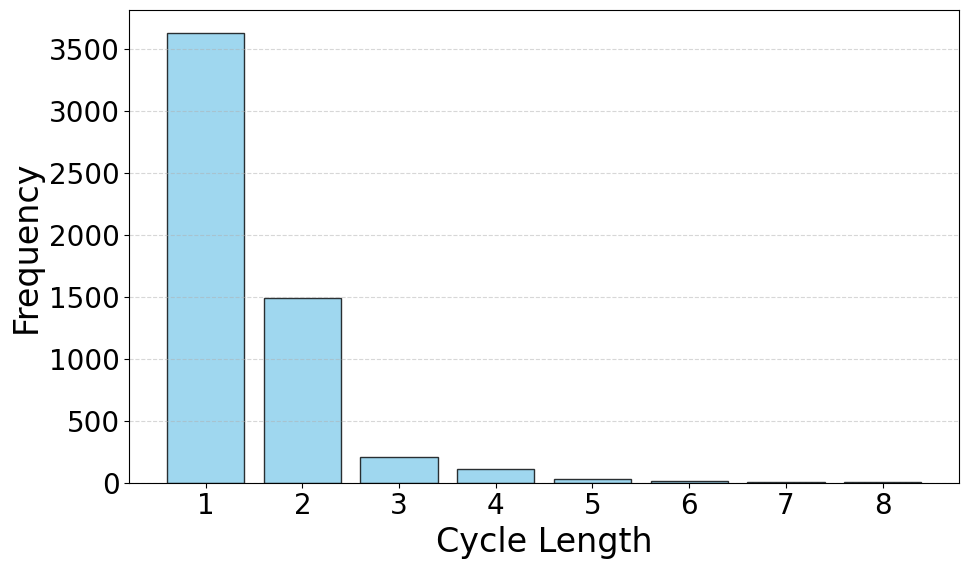

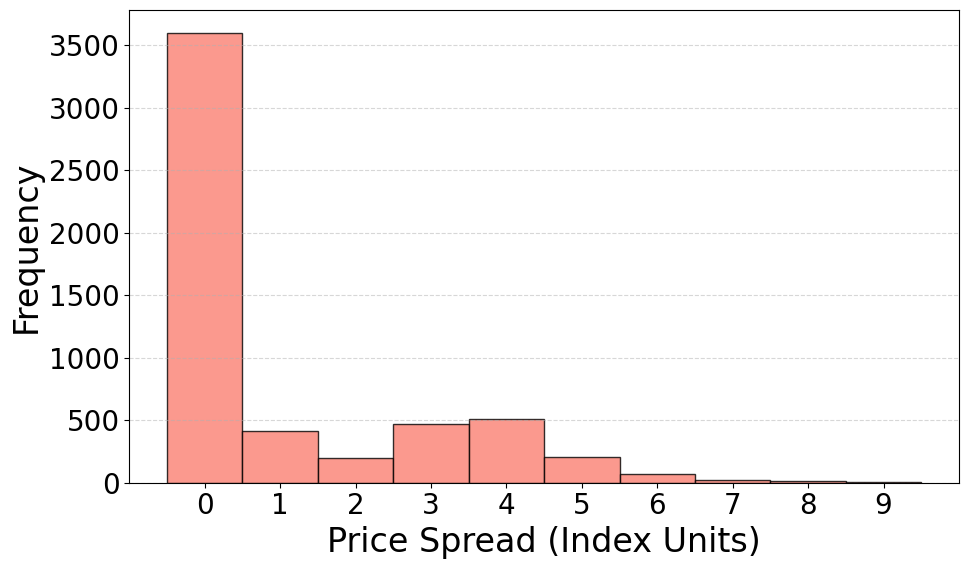

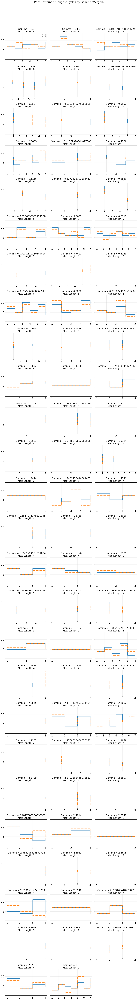

In [2]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# ==========================================
# 1. Configuration and Helpers
# ==========================================

# Define your list of folder paths here
BASE_DIRS = [
    "../Results/experiments/recreating_results_code2/gamma_only_reference_True",
    "../Results/experiments/recreating_results_code2/gamma_nloss_only_reference_True",
    "../Results/experiments/recreating_results_code2/gamma_nloss_only_reference_Truec_0",
    "../Results/experiments/final_gamma_only_no_loss_aversion/gamma_only_reference_True", 
    "../Results_sockeye/experiments/recreating_results"
    # Add as many paths as you need
]

def set_plot_style():
    plt.rcParams.update({
        'font.size': 17,
        'axes.titlesize': 18,
        'axes.labelsize': 18,
        'xtick.labelsize': 20,
        'ytick.labelsize': 20,
        'axes.labelsize': 24,    # Axis labels
        'legend.fontsize': 18,
        'figure.titlesize': 18,
        #'font.family': 'serif',
        'lines.linewidth': 2
    })

def parse_cycle_list(val):
    """
    Parses CSV string entries like "8,7" or "7" into a list of floats/ints.
    Returns an empty list if NaN or malformed.
    """
    if pd.isna(val) or val == "":
        return []
    
    # If it's already a number (e.g., 7 from the CSV reader), wrap it
    if isinstance(val, (int, float)):
        return [float(val)]
    
    # If it's a string, split by comma
    if isinstance(val, str):
        try:
            # Remove potential quotes or brackets if present
            val = val.replace('"', '').replace("'", "").replace("[", "").replace("]", "")
            return [float(x) for x in val.split(',') if x.strip()]
        except ValueError:
            return []
    return []

# ==========================================
# 2. Data Loading Logic
# ==========================================

def load_all_session_data(base_dirs_list):
    """
    Iterates through a list of base directories, finds gamma folders in each, 
    loads session_summaries.csv, and merges all data.
    """
    all_data = []
    
    for base_dir in base_dirs_list:
        if not os.path.exists(base_dir):
            print(f"Warning: Directory not found, skipping: {base_dir}")
            continue
            
        print(f"Processing directory: {base_dir}")
        
        # Find all subdirectories (e.g., gamma_0.0, gamma_0.1)
        subdirs = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]
        
        # Filter for those starting with "gamma"
        gamma_dirs = [d for d in subdirs if "gamma" in d.lower()]
        
        print(f"  > Found {len(gamma_dirs)} gamma subfolders.")

        for g_dir in gamma_dirs:
            dir_path = os.path.join(base_dir, g_dir)
            csv_path = os.path.join(dir_path, "session_summaries.csv")
            
            # Extract gamma value from folder name
            try:
                # Assumes folder format like "gamma_1.5" or similar
                gamma_val = float(g_dir.split('_')[-1])
            except:
                gamma_val = 0.0 # Default or handle error
                
            if not os.path.exists(csv_path):
                # print(f"  > Skipping {g_dir}: session_summaries.csv not found.")
                continue
                
            try:
                df = pd.read_csv(csv_path)
                
                # Optional: Filter for converged sessions
                # df = df[df['converged'] == True] 

                for _, row in df.iterrows():
                    # Parse the price lists
                    p1_prices = parse_cycle_list(row.get('cycle_prices_p1', ''))
                    p2_prices = parse_cycle_list(row.get('cycle_prices_p2', ''))
                    
                    # Combine to find market high/low for this session
                    all_prices = p1_prices + p2_prices
                    
                    if all_prices:
                        price_spread = max(all_prices) - min(all_prices)
                    else:
                        price_spread = 0
                    
                    # Store Data
                    all_data.append({
                        'source_dir': base_dir, # Track source if needed
                        'gamma': gamma_val,
                        'session_id': row.get('session_id'),
                        'cycle_length': float(row.get('cycle_length', 0)),
                        'price_spread': price_spread,
                        'p1_pattern': p1_prices,
                        'p2_pattern': p2_prices
                    })
                    
            except Exception as e:
                print(f"  > Error reading {csv_path}: {e}")

    return pd.DataFrame(all_data)

# ==========================================
# 3. Visualization Functions
# ==========================================

def plot_histogram_cycle_length(df):
    """Plots histogram of cycle lengths across all merged data."""
    if df.empty: return

    plt.figure(figsize=(10, 6))
    
    # Get counts of each cycle length
    counts = df['cycle_length'].value_counts().sort_index()
    
    # Bar plot is cleaner for discrete cycle lengths
    plt.bar(counts.index, counts.values, color='skyblue', edgecolor='black', alpha=0.8)
    
    # plt.title("Distribution of Cycle Lengths")
    plt.xlabel("Cycle Length")
    plt.ylabel("Frequency")
    plt.xticks(counts.index)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

def plot_histogram_price_spread(df):
    """Plots histogram of (Max Price - Min Price) spread within cycles."""
    if df.empty: return

    plt.figure(figsize=(10, 6))
    
    max_spread = int(df['price_spread'].max()) if not df.empty else 0
    # Create bins centered on integers
    bins = np.arange(-0.5, max_spread + 1.5, 1)
    
    plt.hist(df['price_spread'], bins=bins, color='salmon', edgecolor='black', alpha=0.8)
    
    # plt.title("Distribution of Price Spreads (Max - Min in Cycle)")
    plt.xlabel("Price Spread (Index Units)")
    plt.ylabel("Frequency")
    if max_spread < 20: # Only show all ticks if range is reasonable
        plt.xticks(np.arange(0, max_spread + 1, 1))
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

def plot_highest_cycle_patterns(df):
    """
    For each unique gamma, finds the session with the longest cycle length
    (across all loaded directories) and plots the price pattern.
    """
    if df.empty: return

    unique_gammas = sorted(df['gamma'].unique())
    n_gammas = len(unique_gammas)
    
    # Determine grid size
    cols = 3
    rows = (n_gammas // cols) + (1 if n_gammas % cols > 0 else 0)
    
    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 4 * rows), sharey=True)
    
    # Handle single subplot case
    if n_gammas == 1: axes = np.array([axes])
    axes = axes.flatten()
    
    for i, gamma in enumerate(unique_gammas):
        ax = axes[i]
        
        # Filter for this gamma
        gamma_df = df[df['gamma'] == gamma]
        
        # Find row with max cycle length
        # Tie-breaker: highest spread, then first occurrence
        best_row = gamma_df.sort_values(by=['cycle_length', 'price_spread'], ascending=False).iloc[0]
        
        p1 = best_row['p1_pattern']
        p2 = best_row['p2_pattern']
        cycle_len = best_row['cycle_length']
        
        # Create X axis (Periods)
        periods = np.arange(1, len(p1) + 1)
        
        # Plot steps
        ax.step(periods, p1, where='post', label='Firm 1', color='tab:blue', linewidth=2)
        ax.step(periods, p2, where='post', label='Firm 2', color='tab:orange', linewidth=2, linestyle='--')
        
        ax.set_title(f"Gamma = {gamma}\nMax Length: {int(cycle_len)}")
        ax.grid(True, alpha=0.3)
        ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

        if i == 0: 
            ax.legend(loc='best', fontsize=10)

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
        
    plt.suptitle("Price Patterns of Longest Cycles by Gamma (Merged)", y=1.02, fontsize=20)
    plt.tight_layout()
    plt.show()

# ==========================================
# 4. Main Execution
# ==========================================

if __name__ == "__main__":
    set_plot_style()
    
    # 1. Load Data from Multiple Directories
    print("Starting data load...")
    df_results = load_all_session_data(BASE_DIRS)
    
    if not df_results.empty:
        print(f"Successfully loaded {len(df_results)} sessions total.")
        print("-" * 30)
        print("Data Sample:")
        print(df_results.head(3))
        print("-" * 30)

        # 2. Histogram of Cycle Length
        plot_histogram_cycle_length(df_results)
        
        # 3. Histogram of Price Spread
        plot_histogram_price_spread(df_results)
        
        # 4. Patterns for Highest Cycles
        plot_highest_cycle_patterns(df_results)
        
    else:
        print("No data found. Check your BASE_DIRS paths.")

In [30]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as mticker
import numpy as np
import pandas as pd
import os
from glob import glob

# ============================================================
# 1) Data loader (unchanged, except you must have "price_gain" in cycle_statistics.csv)
# ============================================================
def extract_metric_data(experiment_dir_parent, metric_name):
    pattern_sub_dirs = "alpha_*_beta_*"
    run_dirs = glob(os.path.join(experiment_dir_parent, pattern_sub_dirs))
    alpha_values_all, beta_values_all, metric_values_all = [], [], []

    if not run_dirs:
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)

    for run_dir_path in run_dirs:
        dir_name = os.path.basename(run_dir_path)
        try:
            alpha_str = dir_name.split('alpha_')[1].split('_beta_')[0]
            beta_str_full = dir_name.split('beta_')[1]
            beta_str = beta_str_full.split('_')[0]
            alpha_val, beta_val = float(alpha_str), float(beta_str)
        except (IndexError, ValueError):
            continue

        stats_file = os.path.join(run_dir_path, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            continue

        metric_val = np.nan
        try:
            df_stats = pd.read_csv(stats_file, on_bad_lines='skip')
            if df_stats.empty:
                continue

            # ---- NEW METRICS WE CARE ABOUT ----
            # Price, Profit, Price Gain, Profit Gain
            key = metric_name.lower().replace(" ", "_")  # e.g., "price_gain"
            cols = [c for c in df_stats.columns if c.startswith(f"mean_{key}_p")]

            if cols:
                numeric_data = df_stats[cols].apply(pd.to_numeric, errors="coerce")
                if not numeric_data.empty and not numeric_data.isnull().all().all():
                    metric_val = numeric_data.mean(axis=1).iloc[0]

        except Exception:
            metric_val = np.nan

        if pd.notna(metric_val) and isinstance(metric_val, (int, float, np.number)):
            alpha_values_all.append(alpha_val)
            beta_values_all.append(beta_val)
            metric_values_all.append(float(metric_val))

    if not alpha_values_all:
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)

    return (
        np.array(alpha_values_all, dtype=float),
        np.array(beta_values_all, dtype=float),
        np.array(metric_values_all, dtype=float),
    )

# ============================================================
# 2) Heatmap helper (adds alpha-range plotting restriction)
# ============================================================
def plot_ab_heatmap_on_ax(
    ax,
    alpha_coords,
    beta_coords,
    data_grid,
    title,
    cmap,
    norm,
    show_contours=True,
    alpha_min=0.05,
    alpha_max=0.25,
):
    # Local styling
    plt.rcParams.update({
        "axes.titlesize": 18,
        "axes.labelsize": 16,
        "xtick.labelsize": 13,
        "ytick.labelsize": 13,
    })

    if (
        data_grid is None
        or data_grid.size == 0
        or alpha_coords.size == 0
        or beta_coords.size == 0
    ):
        ax.text(0.5, 0.5, "No Data", ha="center", va="center", fontsize=10)
        ax.set_title(title)
        ax.set_xlabel(r"$\beta$ (Exploration Rate)")
        ax.set_ylabel(r"$\alpha$ (Learning Rate)")
        return None

    # Determine extent from coords
    beta_step = (beta_coords[1] - beta_coords[0]) / 2.0 if len(beta_coords) > 1 else (beta_coords[0] * 0.1 or 1e-7)
    alpha_step = (alpha_coords[1] - alpha_coords[0]) / 2.0 if len(alpha_coords) > 1 else 0.01

    extent = [
        beta_coords.min() - beta_step,
        beta_coords.max() + beta_step,
        alpha_coords.min() - alpha_step,
        alpha_coords.max() + alpha_step,
    ]

    im = ax.imshow(
        data_grid,
        aspect="auto",
        origin="lower",
        extent=extent,
        cmap=cmap,
        norm=norm,
    )

    ax.set_title(title)
    ax.set_xlabel(r"$\beta$ (Exploration Rate)")
    ax.set_ylabel(r"$\alpha$ (Learning Rate)")

    ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=5, prune="both"))
    ax.xaxis.set_major_formatter(mticker.FormatStrFormatter("%.1e"))
    if len(beta_coords) <= 10 and len(beta_coords) > 0:
        ax.set_xticks(beta_coords)

    ax.yaxis.set_major_locator(mticker.MaxNLocator(nbins=5, prune="both"))
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter("%.2f"))
    if len(alpha_coords) <= 10 and len(alpha_coords) > 0:
        ax.set_yticks(alpha_coords)

    # ---- NEW: enforce alpha axis range ----
    ax.set_ylim(alpha_min, alpha_max)

    # Optional contours (only if enough data)
    if show_contours and np.any(np.isfinite(data_grid)):
        grid_for_contour = np.nan_to_num(
            data_grid,
            nan=np.nanmedian(data_grid[np.isfinite(data_grid)]) if np.any(np.isfinite(data_grid)) else 0.0,
        )
        if grid_for_contour.shape[0] > 1 and grid_for_contour.shape[1] > 1:
            X_beta, Y_alpha = np.meshgrid(beta_coords, alpha_coords)
            ax.contour(
                X_beta, Y_alpha, grid_for_contour,
                levels=6, colors="black", linewidths=0.5, alpha=0.6
            )

    return im

# ============================================================
# 3) Save ONLY difference panels, and restrict alpha to [0.05, 0.25]
# ============================================================
def save_alpha_beta_diff_panels_only(
    experiment_dirs_map,
    metrics_to_plot_list,
    out_dir="Images/Separated_Panels_AlphaBeta_DiffOnly",
    figsize=(6.5, 4.5),
    exclude_smallest_beta=True,
    alpha_min=0.05,
    alpha_max=0.25,
):
    os.makedirs(out_dir, exist_ok=True)

    diff_cmap = "BrBG"

    print("\nSaving ONLY difference alpha–beta panels...\n")

    for metric_name_disp in metrics_to_plot_list:
        print(f"  Metric: {metric_name_disp}")

        # load data for NoRef and RefAware
        a_nr, b_nr, m_nr = extract_metric_data(experiment_dirs_map["noref"], metric_name_disp)
        a_r,  b_r,  m_r  = extract_metric_data(experiment_dirs_map["ref"],  metric_name_disp)

        alpha_all_raw = [a for a in [a_nr, a_r] if a is not None and a.size > 0]
        beta_all_raw  = [b for b in [b_nr, b_r] if b is not None and b.size > 0]

        if not alpha_all_raw or not beta_all_raw:
            print(f"    Skipping {metric_name_disp}: no coordinate data.")
            continue

        unique_alpha_full = np.sort(np.unique(np.concatenate(alpha_all_raw).astype(float)))
        unique_beta_full  = np.sort(np.unique(np.concatenate(beta_all_raw).astype(float)))

        # ---- NEW: restrict alpha coords to [0.05, 0.25] ----
        unique_alpha = unique_alpha_full[(unique_alpha_full >= alpha_min) & (unique_alpha_full <= alpha_max)]
        if unique_alpha.size == 0:
            print(f"    Skipping {metric_name_disp}: no alpha in [{alpha_min},{alpha_max}].")
            continue

        # Optionally drop smallest beta
        unique_beta = unique_beta_full
        smallest_beta_value = None
        if exclude_smallest_beta and len(unique_beta_full) > 1:
            smallest_beta_value = unique_beta_full[0]
            unique_beta = unique_beta_full[1:]
            if unique_beta.size == 0:
                unique_beta = unique_beta_full
                smallest_beta_value = None

        if unique_beta.size == 0:
            print(f"    Skipping {metric_name_disp}: empty beta coords.")
            continue

        # grids
        grid_noref = np.full((len(unique_alpha), len(unique_beta)), np.nan)
        grid_ref   = np.full((len(unique_alpha), len(unique_beta)), np.nan)

        # Fill NoRef grid
        if m_nr is not None and m_nr.size > 0:
            for alpha, beta, val in zip(a_nr, b_nr, m_nr):
                if alpha < alpha_min or alpha > alpha_max:
                    continue
                if exclude_smallest_beta and smallest_beta_value is not None and np.isclose(beta, smallest_beta_value):
                    continue
                try:
                    ia = np.where(unique_alpha == alpha)[0][0]
                    ib = np.where(unique_beta == beta)[0][0]
                    grid_noref[ia, ib] = val
                except Exception:
                    pass

        # Fill RefAware grid
        if m_r is not None and m_r.size > 0:
            for alpha, beta, val in zip(a_r, b_r, m_r):
                if alpha < alpha_min or alpha > alpha_max:
                    continue
                if exclude_smallest_beta and smallest_beta_value is not None and np.isclose(beta, smallest_beta_value):
                    continue
                try:
                    ia = np.where(unique_alpha == alpha)[0][0]
                    ib = np.where(unique_beta == beta)[0][0]
                    grid_ref[ia, ib] = val
                except Exception:
                    pass

        # Difference grid
        grid_diff = grid_ref - grid_noref
        vals_diff = grid_diff[np.isfinite(grid_diff)]

        if vals_diff.size > 0:
            maxabs = float(np.max(np.abs(vals_diff)))
            if maxabs == 0:
                maxabs = 1e-12
            norm_diff = mcolors.TwoSlopeNorm(vcenter=0, vmin=-maxabs, vmax=maxabs)
        else:
            norm_diff = None

        # Save ONLY the diff figure
        fig, ax = plt.subplots(figsize=figsize)
        im = plot_ab_heatmap_on_ax(
            ax,
            unique_alpha,
            unique_beta,
            grid_diff,
            f"{metric_name_disp}\nDiff. (Ref-Aware - No Refrence)",
            diff_cmap,
            norm_diff,
            alpha_min=alpha_min,
            alpha_max=alpha_max,
        )
        if im is not None:
            fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

        metric_short = metric_name_disp.lower().replace(" ", "_")
        fpath_diff = os.path.join(out_dir, f"{metric_short}_diff.png")
        fig.savefig(fpath_diff, dpi=300, bbox_inches="tight")
        plt.close(fig)

        print(f"    Saved: {os.path.basename(fpath_diff)}")

    print("\nDone saving DIFF alpha–beta panels only.\n")

# ============================================================
# 4) Main
# ============================================================
if __name__ == "__main__":
    base_results_dir = "../Results_sockeye/experiments"

    alpha_beta_exp_dirs = {
        "noref": os.path.join(base_results_dir, "final_results/alpha_beta_noreference_True"),
        "ref":   os.path.join(base_results_dir, "final_results/alpha_beta_reference_True"),
    }

    for key, path in alpha_beta_exp_dirs.items():
        if not os.path.isdir(path):
            raise FileNotFoundError(f"Dir for '{key}' not found: {path}")

    # ---- NEW metric set & ordering (Price Gain replaces Cycle Length) ----
    ab_metrics_to_plot = ["Price", "Profit", "Price Gain", "Profit Gain"]

    out_dir = "Images/Separated_Panels_AlphaBeta_DiffOnly"
    save_alpha_beta_diff_panels_only(
        experiment_dirs_map=alpha_beta_exp_dirs,
        metrics_to_plot_list=ab_metrics_to_plot,
        out_dir=out_dir,
        figsize=(6.5, 4.5),
        exclude_smallest_beta=True,
        alpha_min=0.05,
        alpha_max=0.25,
    )

    print(f"Saved diff-only panels to: {out_dir}")



Saving ONLY difference alpha–beta panels...

  Metric: Price
    Saved: price_diff.png
  Metric: Profit
    Saved: profit_diff.png
  Metric: Price Gain
    Saved: price_gain_diff.png
  Metric: Profit Gain
    Saved: profit_gain_diff.png

Done saving DIFF alpha–beta panels only.

Saved diff-only panels to: Images/Separated_Panels_AlphaBeta_DiffOnly


In [4]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as mticker
import numpy as np
import pandas as pd
import os
from glob import glob

# ============================================================
# 1) Data loader
# ============================================================
def extract_metric_data(experiment_dir_parent, metric_name):
    pattern_sub_dirs = "alpha_*_beta_*"
    run_dirs = glob(os.path.join(experiment_dir_parent, pattern_sub_dirs))
    alpha_values_all, beta_values_all, metric_values_all = [], [], []

    if not run_dirs:
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=float)

    for run_dir_path in run_dirs:
        dir_name = os.path.basename(run_dir_path)
        try:
            alpha_str = dir_name.split('alpha_')[1].split('_beta_')[0]
            beta_str_full = dir_name.split('beta_')[1]
            beta_str = beta_str_full.split('_')[0]
            alpha_val, beta_val = float(alpha_str), float(beta_str)
        except (IndexError, ValueError):
            continue

        stats_file = os.path.join(run_dir_path, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            continue

        metric_val = np.nan
        try:
            df_stats = pd.read_csv(stats_file, on_bad_lines='skip')
            if df_stats.empty:
                continue

            # Map display name to CSV column
            key = metric_name.lower().replace(" ", "_")
            cols = [c for c in df_stats.columns if c.startswith(f"mean_{key}_p")]

            if cols:
                numeric_data = df_stats[cols].apply(pd.to_numeric, errors="coerce")
                if not numeric_data.empty and not numeric_data.isnull().all().all():
                    metric_val = numeric_data.mean(axis=1).iloc[0]

        except Exception:
            metric_val = np.nan

        if pd.notna(metric_val) and isinstance(metric_val, (int, float, np.number)):
            alpha_values_all.append(alpha_val)
            beta_values_all.append(beta_val)
            metric_values_all.append(float(metric_val))

    return (
        np.array(alpha_values_all, dtype=float),
        np.array(beta_values_all, dtype=float),
        np.array(metric_values_all, dtype=float),
    )

# ============================================================
# 2) Heatmap helper
# ============================================================
def plot_ab_heatmap_on_ax(
    ax,
    alpha_coords,
    beta_coords,
    data_grid,
    title,
    cmap,
    norm,
    show_contours=True,
    alpha_min=0.05,
    alpha_max=0.25,
):
    plt.rcParams.update({
        "axes.titlesize": 18,
        "axes.labelsize": 16,
        "xtick.labelsize": 13,
        "ytick.labelsize": 13,
    })

    if data_grid is None or np.all(np.isnan(data_grid)):
        ax.text(0.5, 0.5, "No Data", ha="center", va="center", fontsize=10)
        ax.set_title(title)
        return None

    # Determine extent for fixed pixels
    if len(beta_coords) > 1:
        beta_step = (beta_coords[1] - beta_coords[0]) / 2.0
    else:
        beta_step = beta_coords[0] * 0.1 if len(beta_coords) > 0 else 1e-7

    if len(alpha_coords) > 1:
        alpha_step = (alpha_coords[1] - alpha_coords[0]) / 2.0
    else:
        alpha_step = 0.01

    extent = [
        beta_coords.min() - beta_step,
        beta_coords.max() + beta_step,
        alpha_coords.min() - alpha_step,
        alpha_coords.max() + alpha_step,
    ]

    im = ax.imshow(
        data_grid,
        aspect="auto",
        origin="lower",
        extent=extent,
        cmap=cmap,
        norm=norm,
    )

    ax.set_title(title)
    ax.set_xlabel(r"$\beta$ (Exploration Rate)")
    ax.set_ylabel(r"$\alpha$ (Learning Rate)")

    # Formatting axes
    ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=5, prune="both"))
    ax.xaxis.set_major_formatter(mticker.FormatStrFormatter("%.1e"))
    if len(beta_coords) <= 10 and len(beta_coords) > 0:
        ax.set_xticks(beta_coords)

    ax.yaxis.set_major_locator(mticker.MaxNLocator(nbins=5, prune="both"))
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter("%.2f"))
    if len(alpha_coords) <= 10 and len(alpha_coords) > 0:
        ax.set_yticks(alpha_coords)

    ax.set_ylim(alpha_min, alpha_max)
    ax.set_xlim(extent[0], extent[1])

    if show_contours and np.any(np.isfinite(data_grid)):
        grid_for_contour = data_grid.copy()
        valid_mask = np.isfinite(grid_for_contour)
        if np.any(valid_mask):
            grid_for_contour[~valid_mask] = np.nanmedian(grid_for_contour[valid_mask])
            if grid_for_contour.shape[0] > 1 and grid_for_contour.shape[1] > 1:
                X_beta, Y_alpha = np.meshgrid(beta_coords, alpha_coords)
                try:
                    ax.contour(
                        X_beta, Y_alpha, grid_for_contour,
                        levels=6, colors="black", linewidths=0.5, alpha=0.6
                    )
                except Exception:
                    pass

    return im

# ============================================================
# 3) Main Logic: PRE-CALCULATE DATA & PLOT WITH METRIC-SPECIFIC RANGES
# ============================================================
def save_alpha_beta_diff_panels_only(
    experiment_dirs_map,
    metrics_to_plot_list,
    out_dir="Images/Separated_Panels_AlphaBeta_DiffOnly",
    figsize=(6.5, 4.5),
    exclude_smallest_beta=True,
    alpha_min=0.05,
    alpha_max=0.25,
):
    os.makedirs(out_dir, exist_ok=True)
    diff_cmap = "BrBG"

    # Metric-specific color ranges (symmetric around 0)
    metric_vmax_map = {
        "Price": 0.15,
        "Profit": 0.15,
        "Price Gain": 0.33,
        "Profit Gain": 0.33,
    }

    # --- Step 1: Establish Global Axis Grid ---
    print("\nStep 1: Establishing Global Grid from 'Price' data...")
    a_setup, b_setup, _ = extract_metric_data(experiment_dirs_map["noref"], "Price")

    if a_setup.size == 0:
        print("Error: No data found to establish grid.")
        return

    unique_alpha_full = np.sort(np.unique(a_setup))
    unique_beta_full  = np.sort(np.unique(b_setup))

    global_alphas = unique_alpha_full[(unique_alpha_full >= alpha_min) & (unique_alpha_full <= alpha_max)]
    if exclude_smallest_beta and len(unique_beta_full) > 1:
        global_betas = unique_beta_full[1:]
    else:
        global_betas = unique_beta_full

    print(f"  Grid: {len(global_alphas)} alphas x {len(global_betas)} betas")

    # --- Step 2: Load ALL Data into Memory (per metric) ---
    print("\nStep 2: Loading all metrics and computing diff grids...")

    processed_grids = {}

    for metric_name in metrics_to_plot_list:
        a_nr, b_nr, m_nr = extract_metric_data(experiment_dirs_map["noref"], metric_name)
        a_r,  b_r,  m_r  = extract_metric_data(experiment_dirs_map["ref"],  metric_name)

        # Initialize Grids
        grid_noref = np.full((len(global_alphas), len(global_betas)), np.nan)
        grid_ref   = np.full((len(global_alphas), len(global_betas)), np.nan)

        def fill_grid(target_grid, src_a, src_b, src_m):
            if src_m is None or len(src_m) == 0:
                return
            for alpha, beta, val in zip(src_a, src_b, src_m):
                idx_a = np.where(np.isclose(global_alphas, alpha, atol=1e-9))[0]
                idx_b = np.where(np.isclose(global_betas, beta, atol=1e-9))[0]
                if idx_a.size > 0 and idx_b.size > 0:
                    target_grid[idx_a[0], idx_b[0]] = val

        fill_grid(grid_noref, a_nr, b_nr, m_nr)
        fill_grid(grid_ref,   a_r,  b_r,  m_r)

        grid_diff = grid_ref - grid_noref
        processed_grids[metric_name] = grid_diff

        finite_vals = grid_diff[np.isfinite(grid_diff)]
        if finite_vals.size > 0:
            print(f"  {metric_name}: diff min={finite_vals.min():.4f}, max={finite_vals.max():.4f}")
        else:
            print(f"  {metric_name}: no finite diff values found.")

    # --- Step 3: Plot with Metric-Specific Norm ---
    print("\nStep 3: Plotting...")

    for metric_name, grid_data in processed_grids.items():
        fig, ax = plt.subplots(figsize=figsize)

        vmax = metric_vmax_map.get(metric_name, 0.15)  # default fallback
        norm = mcolors.TwoSlopeNorm(vcenter=0, vmin=-vmax, vmax=vmax)

        im = plot_ab_heatmap_on_ax(
            ax,
            global_alphas,
            global_betas,
            grid_data,
            f"{metric_name}\n Reference($\\gamma$ = 1) - No Reference($\\gamma$ = 0)",
            diff_cmap,
            norm,
            alpha_min=alpha_min,
            alpha_max=alpha_max,
        )

        if im is not None:
            cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
            cbar.locator = mticker.MaxNLocator(nbins=5)
            cbar.update_ticks()

        metric_short = metric_name.lower().replace(" ", "_")
        fpath_diff = os.path.join(out_dir, f"{metric_short}_diff.png")
        fig.savefig(fpath_diff, dpi=300, bbox_inches="tight")
        plt.close(fig)
        print(f"  Saved: {metric_short}_diff.png (range ±{vmax})")

    print("\nAll figures saved with metric-specific color scales.")

# ============================================================
# 4) Run
# ============================================================
if __name__ == "__main__":
    base_results_dir = "../Results_sockeye/experiments"

    alpha_beta_exp_dirs = {
        "noref": os.path.join(base_results_dir, "final_results/alpha_beta_noreference_True"),
        "ref":   os.path.join(base_results_dir, "final_results/alpha_beta_reference_True"),
    }

    ab_metrics_to_plot = ["Price", "Profit", "Price Gain", "Profit Gain"]

    save_alpha_beta_diff_panels_only(
        experiment_dirs_map=alpha_beta_exp_dirs,
        metrics_to_plot_list=ab_metrics_to_plot,
        out_dir="Images/Separated_Panels_AlphaBeta_DiffOnly",
        figsize=(6.5, 4.5),
        exclude_smallest_beta=True,
        alpha_min=0.05,
        alpha_max=0.25,
    )



Step 1: Establishing Global Grid from 'Price' data...
  Grid: 16 alphas x 19 betas

Step 2: Loading all metrics and computing diff grids...
  Price: diff min=-0.1476, max=-0.0586
  Profit: diff min=-0.0458, max=-0.0246
  Price Gain: diff min=0.1277, max=0.3321
  Profit Gain: diff min=0.0172, max=0.2282

Step 3: Plotting...
  Saved: price_diff.png (range ±0.15)
  Saved: profit_diff.png (range ±0.15)
  Saved: price_gain_diff.png (range ±0.33)
  Saved: profit_gain_diff.png (range ±0.33)

All figures saved with metric-specific color scales.


In [10]:
import matplotlib.pyplot as plt
import os
import numpy as np

# ------------------------------
# Output directory
# ------------------------------
out_dir = "Images/qqlearning"
os.makedirs(out_dir, exist_ok=True)

# ------------------------------
# Matplotlib settings
# ------------------------------
plt.rcParams.update({
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 14,
})

# ------------------------------
# Metric definitions
# ------------------------------
metric_specs = [
    ("Price",       "figure1_gamma_only_q_price.png"),
    ("Profit",      "figure1_gamma_only_q_profit.png"),
    ("Price Gain",  "figure1_gamma_only_q_price_gain.png"),
    ("Profit Gain", "figure1_gamma_only_q_profit_gain.png"),
]

# ------------------------------
# Colors
# ------------------------------
ref_color      = 'tab:blue'
mis_color      = 'tab:orange'
qlr_color      = 'tab:purple'
qlr_miss_color = 'tab:red'

# ------------------------------
# Variables to capture shared legend (once)
# ------------------------------
shared_handles = None
shared_labels  = None

# ============================================================
# MAIN LOOP – Creates 4 figures AND extracts the legend once
# ============================================================
for metric_index, (metric_name, fname) in enumerate(metric_specs):

    fig, ax = plt.subplots(figsize=(6, 4))

    # =====================================================
    # GRID-SEARCH CURVES (if needed)
    # =====================================================
    for demand, cr in [
        #('reference', True),
        #('reference', False),
        #('misspecification', True),
    ]:
        γ, μ, σ, n_eff = load_gamma_metric_n(exp_dirs[(demand, cr)], metric_name)

        color     = ref_color if (demand in {'reference','reference_high'}) else mis_color
        linestyle = '-' if cr else '--'
        # label     = f"Reference-{'Aware' if 'reference' in demand else 'Naive'} Firms Exp Smoothing"
        label     = f"Reference-{'Aware' if 'reference' in demand else 'Naive'} Firms Exp Smoothing(CR={cr})"
        #label  = "Exp Smoothing Refrence Pred"

        m = np.isfinite(γ) & np.isfinite(μ) & np.isfinite(σ) & np.isfinite(n_eff) & (n_eff > 0)
        se     = σ[m] / np.sqrt(n_eff[m])
        lower  = μ[m] - 1.8 * se
        upper  = μ[m] + 1.8 * se

        ax.plot(γ[m], μ[m], color=color, linestyle=linestyle,
                marker=' ', linewidth=2, label=label)
        ax.fill_between(γ[m], lower, upper, color=color, alpha=0.15)

    # =====================================================
    # Q-LEARNING CURVES (your main curves)
    # =====================================================

    # dash patterns: (offset, (on, off, on, off, ...))
    # STYLE_MAP = {
    #     ('qlr_reference_nloss', True): dict(ls='-',              lw=3.0, band_alpha=0.18),        # solid, thicker (MAIN)
    #     ('qlr_reference_c0',    True): dict(ls=(0, (6, 3)),      lw=2.2, band_alpha=0.12),        # dashed  —–– ––– –––
    #     ('qlr_reference_mu0',   True): dict(ls=(0, (1, 2)),      lw=2.2, band_alpha=0.12),        # dotted  ·· ·· ··
    # }

    # LABEL_MAP = {
    #     ('qlr_reference_nloss', True): "baseline(c = 1, μ = 0.25)",
    #     ('qlr_reference_c0',    True): "(c ↓, μ = 0.25)",
    #     ('qlr_reference_mu0',   True): "(c = 1, μ ↓)",
    # }

    for demand, cr in [
        ('qlr_reference', True),
        #('qlr_reference_pre', True)
        ('qlr_reference_exm', True)
        #('qlr_misspecification_nloss', True),
        #('qlr_reference_c0',    True),
        #('qlr_reference_mu0',    True)
    ]:
        γ, μ, σ = load_gamma_only_metric(exp_dirs[(demand, cr)], metric_name)

        color     = qlr_color if (demand in {'qlr_reference','qlr_reference_nloss','qlr_reference_k25'}) else qlr_miss_color
        linestyle = '-' if cr else '--'
        #label     = f"Reference-{'Aware' if 'reference' in demand else 'Naive'} Firms"
        #label     = f"Reference-{'Aware' if 'reference' in demand else 'Naive'} Firms (CR={cr})"
        label     = "QLearning Refrence Pred"


        # st = STYLE_MAP[(demand, cr)]
        # ln, = ax.plot(
        #     γ, μ,
        #     color=qlr_base_color,
        #     linestyle=st['ls'],
        #     linewidth=st['lw'],
        #     marker=None,
        #     label=LABEL_MAP[(demand, cr)],
        # )
        # ax.fill_between(γ, μ - 0.8*σ, μ + 0.8*σ,
        #                 color=qlr_base_color, alpha=st['band_alpha'])


        ax.plot(γ, μ, color=color, linestyle=linestyle,
                marker=' ', linewidth=2, label=label)
        ax.fill_between(γ, μ - 0.8 * σ, μ + 0.8 * σ,
                        color=color, alpha=0.15)

    # =====================================================
    # AXES setup
    # =====================================================
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_xlabel(r"$\gamma$")
    ax.set_ylabel(metric_name)

    # =====================================================
    # CAPTURE LEGEND ONLY ON FIRST FIGURE
    # =====================================================
    handles, labels = ax.get_legend_handles_labels()

    if metric_index == 0:      # ← only first figure stores the legend
        shared_handles = handles
        shared_labels  = labels

    # REMOVE legend from the panel figure
    if ax.get_legend():
        ax.get_legend().remove()

    # Save the panel
    fig.tight_layout()
    fig.savefig(os.path.join(out_dir, fname), dpi=300, bbox_inches="tight")
    plt.close(fig)

# ============================================================
# SAVE SEPARATE LEGEND-ONLY FIGURE
# ============================================================
print("Saving shared legend…")

fig_leg = plt.figure(figsize=(8, 0.7))   # adjust height if needed
fig_leg.legend(shared_handles, shared_labels,
               loc="center",
               ncol=2,
               frameon=False)

fig_leg.tight_layout()
legend_path = os.path.join(out_dir, "legend_reference_naive.png")
fig_leg.savefig(legend_path, dpi=300, bbox_inches="tight")
plt.close(fig_leg)

print("DONE. All four panels + shared legend saved.")


Saving shared legend…
DONE. All four panels + shared legend saved.


In [3]:
import os
import numpy as np
import pandas as pd
from glob import glob

def _pick_metric_from_df(df: pd.DataFrame, metric_name: str):
    """Return (mean_value, std_value, count_value or None)."""
    if metric_name == "Cycle Length":
        mval = float(df["mean_cycle_length"].iloc[0])
        sval = float(df["std_cycle_length"].iloc[0]) if "std_cycle_length" in df.columns else np.nan
        nval = int(df["n_cycle_length"].iloc[0]) if "n_cycle_length" in df.columns else None
        return mval, sval, nval

    if metric_name == "Surplus":
        mval = float(df["mean_consumer_surplus"].iloc[0])
        sval = float(df["std_consumer_surplus"].iloc[0]) if "std_consumer_surplus" in df.columns else np.nan
        nval = int(df["n_consumer_surplus"].iloc[0]) if "n_consumer_surplus" in df.columns else None
        return mval, sval, nval

    key = metric_name.lower().replace(" ", "_")

    # Aggregate across product-specific columns (p1, p2, …) the same way you do now
    mean_cols = [c for c in df.columns if c.startswith(f"mean_{key}_p")]
    std_cols  = [c for c in df.columns if c.startswith(f"std_{key}_p")]
    # Optional counts per product if present (e.g., count_price_p1)
    cnt_cols  = [c for c in df.columns if c.startswith(f"count_{key}_p") or c.startswith(f"n_{key}_p")]

    if not mean_cols:
        return np.nan, np.nan, None

    # Per-run mean over products (same as your old behavior)
    mval = df[mean_cols].mean(axis=1).iloc[0]

    # Per-run std: average the stds across products if available, otherwise NaN
    sval = df[std_cols].mean(axis=1).iloc[0] if std_cols else np.nan

    # Per-run effective count: sum counts across products if present
    if cnt_cols:
        nval = int(df[cnt_cols].sum(axis=1).iloc[0])
    else:
        # If there's a single row summarizing many observations but no explicit counts,
        # leave as None — we’ll fall back to a weighted-variance approximation.
        nval = None

    return float(mval), float(sval) if np.isfinite(sval) else np.nan, nval


def load_gamma_metric_n(experiment_dir, metric_name):
    """
    Pool all runs (all lambdas) at each gamma when computing the std.
    Mean stays the same as averaging run means; std becomes the pooled std across runs.
    """
    pattern = "gamma_*_lambda_*"
    run_dirs = glob(os.path.join(experiment_dir, pattern))

    rows = []  # list of dicts: {"gamma": γ, "m": m_i, "s": s_i, "n": n_i}
    for run in run_dirs:
        base = os.path.basename(run)
        try:
            γ = float(base.split('gamma_')[1].split('_lambda_')[0])
        except Exception:
            continue

        stats_file = os.path.join(run, "cycle_statistics.csv")
        if not os.path.exists(stats_file):
            continue

        df = pd.read_csv(stats_file)
        mval, sval, nval = _pick_metric_from_df(df, metric_name)
        if not np.isfinite(mval):
            continue

        rows.append({"gamma": γ, "m": float(mval),
                     "s": float(sval) if np.isfinite(sval) else np.nan,
                     "n": int(nval) if (nval is not None and nval > 0) else None})

    if not rows:
        raise ValueError(f"No data in {experiment_dir} for '{metric_name}'")

    df_all = pd.DataFrame(rows)

    out = []
    for γ, gdf in df_all.groupby("gamma"):
        ms = gdf["m"].values
        ss = gdf["s"].values
        ns = gdf["n"].values  # may contain None

        # Unweighted mean to preserve your old curve
        mbar = float(np.mean(ms))

        # Counts where present; else weight=1
        has_any_counts = np.any(pd.notna(ns))
        w = np.array([n if (n is not None and n > 0) else 1 for n in ns], dtype=float)

        if has_any_counts and np.all(np.isfinite(ss)):
            # unbiased pooled variance around UNWEIGHTED mean mbar
            num_within  = np.sum([(n-1)*(s**2) for n, s in zip(w, ss)])
            num_between = np.sum([n*((m - mbar)**2) for n, m in zip(w, ms)])
            denom = np.sum(w) - 1
            svar = (num_within + num_between) / denom if denom > 0 else 0.0
            sbar = float(np.sqrt(max(svar, 0.0)))
            n_eff = int(np.sum(w))  # effective N when counts exist
        else:
            # fallback: total variance ≈ mean(within) + var(means)
            within  = float(np.nanmean(ss**2)) if np.any(np.isfinite(ss)) else 0.0
            between = float(np.var(ms, ddof=1)) if len(ms) > 1 else 0.0
            sbar = float(np.sqrt(max(within + between, 0.0)))
            n_eff = int(len(ms))  # fall back to number of runs

        out.append((γ, mbar, sbar, n_eff))

    out.sort(key=lambda x: x[0])
    gammas = np.array([t[0] for t in out])
    means  = np.array([t[1] for t in out])
    stds   = np.array([t[2] for t in out])
    n_eff  = np.array([t[3] for t in out])
    return gammas, means, stds, n_eff




In [5]:
folder_location = "../Results/experiments"
base_exp_name = "final_gamma_only_no_loss_aversion/gamma_lambda"
# IMPORTANT: Define the base name for your QLR experiment directories
base_qlr_exp_name = "fixing_qlearning2/gamma" # EXAMPLE - CHANGE THIS

exp_dirs = {
    ('reference', True): os.path.join(folder_location, f"{base_exp_name}_reference_True"),
    ('reference', False): os.path.join(folder_location, f"{base_exp_name}_reference_False"),
    ('misspecification', True): os.path.join(folder_location, f"{base_exp_name}_misspecification_True"),
    ('misspecification', False): os.path.join(folder_location, f"{base_exp_name}_misspecification_False"),
    # QLR paths - these parent directories should contain "gamma_X" subfolders
    ('qlr_reference', True): os.path.join(folder_location, f"{base_qlr_exp_name}_only_referenceTrue"),
    ('qlr_reference_pre', True): os.path.join(folder_location, "fixing_qlearning/gamma_only_referenceTrue"),
    ('qlr_reference_exm', True): os.path.join(folder_location, "fixing_qlearning_exm/gamma_only_referenceTrue"),
    ('qlr_reference', False): os.path.join(folder_location, f"{base_qlr_exp_name}_only_reference_False"), # If you have CR=False for QLR
}


In [ ]:
import numpy as np
import pandas as pd
from scipy.optimize import fsolve
import warnings

# Suppress runtime warnings from fsolve if it encounters difficult points
warnings.filterwarnings('ignore', 'The iteration is not making good progress')

# ==============================================================================
# STEP 1: REPLICATE THE LOGIC FROM YOUR `model` CLASS TO CALCULATE game.A
# We will use the parameters from your code as defaults.
# ==============================================================================

def demand(p, params, demand_type):
    """
    Logit demand with or without reference dependence.
    """
    a = params['a']
    mu = params['mu']
    a0 = params['a0']
    gamma = params['gamma']
    phi = params.get('lossaversion', 1.0)

    if demand_type == 'noreference':
        e = np.exp((a - p) / mu)
        d = e / (np.sum(e) + np.exp(a0 / mu))
    elif demand_type == 'reference':
        r = p  # assume reference = price (stationary point)
        price_below_r = (p < r).astype(float)
        price_above_r = (p >= r).astype(float)
        p_eff = (
            p + gamma * (p - r) * price_below_r
              + gamma * phi * (p - r) * price_above_r
        )
        e = np.exp((a - p_eff) / mu)
        d = e / (np.sum(e) + np.exp(a0 / mu))
    return d

def foc(p, params, demand_type):
    """First-order condition for competition."""
    c = params['c']
    mu = params['mu']
    gamma = params['gamma']
    phi = params.get('lossaversion', 1.0)
    d = demand(p, params, demand_type)

    if demand_type == 'noreference':
        zero = 1 - (p - c) * (1 - d) / mu
    elif demand_type == 'reference':
        r = p
        # Compute smooth price indicators
        zero = 1 - (1 + gamma) * (p - c) * (1 - d) / mu
    return np.squeeze(zero)

def foc_monopoly(p, params, demand_type):
    """First-order condition for monopoly."""
    c = params['c']
    mu = params['mu']
    gamma = params['gamma']
    phi = params.get('lossaversion', 1.0)
    d = demand(p, params, demand_type)

    total_contribution = np.sum((p - c) * d)
    own_contribution = (p - c) * d

    if demand_type == 'noreference':
        zero = 1 - ((p - c) * (1 - d) / mu) + ((total_contribution - own_contribution) / mu)
    elif demand_type == 'reference':
        r = p
        # Compute smooth price indicators
        zero = 1 - (1 + gamma) * ((p - c) * (1 - d) / mu) + (1 + gamma) * ((total_contribution - own_contribution) / mu)
    return np.squeeze(zero)

def compute_price_grid(params, k=15, extend=0.1):
    # Step 1: p_nash under reference dependence
    ref_params = params.copy()
    ref_params['gamma'] = 1
    ref_params['lossaversion'] = 1.0
    demand_type_ref = 'reference'
    p0 = np.ones((params['n'],)) * 3 * params['c']
    p_nash = fsolve(foc, p0, args=(ref_params, demand_type_ref))

    # Step 2: p_coop under no-reference
    noreference_params = params.copy()
    noreference_params['gamma'] = 0
    demand_type_nr = 'noreference'
    p_coop = fsolve(foc_monopoly, p0, args=(noreference_params, demand_type_nr))

    # Step 3: Compute bounds
    p_nash = np.min(p_nash)
    p_coop = np.max(p_coop)
    lower_bound = max(0, p_nash - extend * (p_coop - p_nash))
    upper_bound = p_coop + extend * (p_coop - p_nash)

    # Step 4: Return grid
    return np.linspace(lower_bound, upper_bound, k)


def calculate_average_expected_utility_dual(filepath, A, gamma_decide=0, phi_decide=1.0, gamma_welfare=0, phi_welfare=1.0, a=2, mu=0.25, a0=0):
    import ast
    df = pd.read_csv(filepath)
    session_utilities = []

    for _, row in df.iterrows():
        try:
            p1_idx = ast.literal_eval(row['cycle_prices_p1'])
            p2_idx = ast.literal_eval(row['cycle_prices_p2'])
            ref_idx = ast.literal_eval(row['cycle_reference_prices'])


            p1 = np.atleast_1d(A[np.array(p1_idx, dtype=int)])
            p2 = np.atleast_1d(A[np.array(p2_idx, dtype=int)])
            r = np.atleast_1d(A[np.array(ref_idx, dtype=int)])
            print("P1 prices:", p1)

            EU_list = []
            for i in range(len(p1)):
                # ----- Step 1: Decision utility (u) -----
                if gamma_decide == 0:
                    u1 = a - p1[i]
                    u2 = a - p2[i]
                else:
                    u1 = a - p1[i]
                    u1 += gamma_decide * (r[i] - p1[i]) if p1[i] < r[i] else -gamma_decide * phi_decide * (p1[i] - r[i])
                    u2 = a - p2[i]
                    u2 += gamma_decide * (r[i] - p2[i]) if p2[i] < r[i] else -gamma_decide * phi_decide * (p2[i] - r[i])

                # ----- Step 2: Welfare utility (v) -----
                if gamma_welfare == 0:
                    v1 = a - p1[i]
                    v2 = a - p2[i]
                else:
                    v1 = a - p1[i]
                    v1 += gamma_welfare * (r[i] - p1[i]) if p1[i] < r[i] else -gamma_welfare * phi_welfare * (p1[i] - r[i])
                    v2 = a - p2[i]
                    v2 += gamma_welfare * (r[i] - p2[i]) if p2[i] < r[i] else -gamma_welfare * phi_welfare * (p2[i] - r[i])

                # ----- Step 3: Experienced Utility -----
                exp_u1 = np.exp(u1 / mu)
                exp_u2 = np.exp(u2 / mu)
                exp_u0 = np.exp(a0 / mu)

                denom = exp_u0 + exp_u1 + exp_u2
                P1 = exp_u1 / denom
                P2 = exp_u2 / denom

                gamma_const = 0.5772  # Euler-Mascheroni constant

                EU = (
                    P1 * (v1 - mu * np.log(P1)) +
                    P2 * (v2 - mu * np.log(P2)) +
                    (1 - P1 - P2) * (a0 - mu * np.log(1 - P1 - P2))
                )
                EU_list.append(EU)

            session_utilities.append(np.mean(EU_list))
        except Exception as e:
            continue  # skip malformed row

    return np.mean(session_utilities)

# File paths
rational_world_file = '/Users/neda/Desktop/UBC/PHD/research_term_4/Results/experiments/2*2_testing/gamma_only_referenceTrue/gamma_0.0/session_summaries.csv'
irrational_world_file = '/Users/neda/Desktop/UBC/PHD/research_term_4/Results/experiments/2*2_testing/gamma_only_referenceTrue/gamma_1.0/session_summaries.csv'
# Model parameters
model_params = {
    'n': 2,
    'gamma': 1,
    'c': 1,
    'a': 2,
    'a0': 0,
    'mu': 0.25,
    'extend': 0.1,
    'k': 15
}

print("--- Calculating Price Grid (game.A) ---")
game_A = compute_price_grid(model_params, k=model_params['k'], extend=model_params['extend'])
print("Calculated game.A price grid:")
print(np.round(game_A, 8))
print("-" * 35)


# Generate all 8 cases
results = {}
for gamma_choice in [0, 1]:
    for gamma_welfare in [0, 1]:
        for world, path in [('rational', rational_world_file), ('irrational', irrational_world_file)]:
            key = (gamma_choice, gamma_welfare, world)
            results[key] = calculate_average_expected_utility_dual(
                filepath=path,
                A=game_A,
                gamma_decide=gamma_choice,              # FIXED
                phi_decide=1.0 if gamma_choice else 0,  # FIXED
                gamma_welfare=gamma_welfare,
                phi_welfare=1.0 if gamma_welfare else 0
            )

import pandas as pd

# Create and display two 2x2 tables
table1 = pd.DataFrame({
    "Everyone Else Rational": [
        results[(0, 0, 'rational')],
        results[(1, 0, 'rational')]
    ],
    "Everyone Else Irrational": [
        results[(0, 0, 'irrational')],
        results[(1, 0, 'irrational')]
    ]
}, index=["You Act Rationally", "You Act Irrationally"])

table2 = pd.DataFrame({
    "Everyone Else Rational": [
        results[(0, 1, 'rational')],
        results[(1, 1, 'rational')]
    ],
    "Everyone Else Irrational": [
        results[(0, 1, 'irrational')],
        results[(1, 1, 'irrational')]
    ]
}, index=["You Act Rationally", "You Act Irrationally"])


print("\n--- Welfare Table: Rational vs Irrational Utility ---")
print(table1)

print("\n--- Welfare Table: Reference-Dependent Utility ---")
print(table2)


--- Calculating Price Grid (game.A) ---
Calculated game.A price grid:
[1.17612343 1.23447596 1.29282849 1.35118102 1.40953355 1.46788609
 1.52623862 1.58459115 1.64294368 1.70129621 1.75964875 1.81800128
 1.87635381 1.93470634 1.99305887]
-----------------------------------
P1 value idx: (1.5262, 1.7013, 1.5846)
P1 prices: [1.52623862 1.70129621 1.58459115]
P1 value idx: (1.5846, 1.7013)
P1 prices: [1.58459115 1.70129621]
P1 value idx: (1.5846, 1.6429)
P1 prices: [1.58459115 1.64294368]
P1 value idx: (1.5262, 1.5846, 1.4679, 1.7596)
P1 prices: [1.52623862 1.58459115 1.46788609 1.75964875]
P1 value idx: (1.5846, 1.5846, 1.7013)
P1 prices: [1.58459115 1.58459115 1.70129621]
P1 value idx: (1.818, 1.5262)
P1 prices: [1.81800128 1.52623862]
P1 value idx: 1.6429
P1 prices: [1.64294368]
P1 value idx: (1.5846, 1.7596)
P1 prices: [1.58459115 1.75964875]
P1 value idx: (1.5262, 1.7013)
P1 prices: [1.52623862 1.70129621]
P1 value idx: (1.6429, 1.6429, 1.5846)
P1 prices: [1.64294368 1.64294368 1.58

In [24]:
import numpy as np
import pandas as pd

GAMMA_EULER = 0.5772156649015329  # Euler–Mascheroni constant

def parse_num_list(x):
    if pd.isna(x):
        return np.array([], dtype=float)
    if isinstance(x, (int, float, np.integer, np.floating)):
        return np.array([float(x)], dtype=float)
    s = str(x).strip()
    if not s:
        return np.array([], dtype=float)
    return np.array([float(t) for t in s.split(",") if t.strip() != ""], dtype=float)

def expected_utility_path(p1, p2, r, *, gamma_decide=0, phi_decide=1.0,
                          gamma_welfare=0, phi_welfare=1.0, a=2, mu=0.25, a0=0):
    """Compute mean experienced utility over a time path of prices."""
    T = min(len(p1), len(p2), len(r))
    if T == 0:
        return np.nan

    EU = np.empty(T, dtype=float)

    for t in range(T):
        p1t, p2t, rt = float(p1[t]), float(p2[t]), float(r[t])

        # ---- decision utility u ----
        def u(p):
            base = a - p
            if gamma_decide == 0:
                return base
            # reference-dependent component
            if p < rt:
                return base + gamma_decide * (rt - p)
            else:
                return base - gamma_decide * phi_decide * (p - rt)

        u1, u2 = u(p1t), u(p2t)

        # ---- welfare utility v ----
        def v(p):
            base = a - p
            if gamma_welfare == 0:
                return base
            if p < rt:
                return base + gamma_welfare * (rt - p)
            else:
                return base - gamma_welfare * phi_welfare * (p - rt)

        v1, v2 = v(p1t), v(p2t)

        # ---- logit choice probs from u ----
        exp_u0 = np.exp(a0 / mu)
        exp_u1 = np.exp(u1 / mu)
        exp_u2 = np.exp(u2 / mu)
        denom = exp_u0 + exp_u1 + exp_u2

        P1 = exp_u1 / denom
        P2 = exp_u2 / denom
        P0 = exp_u0 / denom

        # ---- experienced utility (key result) ----
        EU[t] = (
            P1 * (v1 - mu * np.log(P1)) +
            P2 * (v2 - mu * np.log(P2)) +
            P0 * (a0 - mu * np.log(P0))
        ) + mu * GAMMA_EULER

    return float(np.mean(EU))

def average_expected_utility_from_file(filepath, *, gamma_decide, phi_decide,
                                       gamma_welfare, phi_welfare, a=2, mu=0.25, a0=0):
    df = pd.read_csv(filepath)

    # adjust these column names if yours differ
    df["p1"] = df["cycle_prices_value_p1"].apply(parse_num_list)
    df["p2"] = df["cycle_prices_value_p2"].apply(parse_num_list)
    df["r"]  = df["cycle_reference_prices_value"].apply(parse_num_list)

    eus = []
    for _, row in df.iterrows():
        eu = expected_utility_path(
            row["p1"], row["p2"], row["r"],
            gamma_decide=gamma_decide, phi_decide=phi_decide,
            gamma_welfare=gamma_welfare, phi_welfare=phi_welfare,
            a=a, mu=mu, a0=a0
        )
        if np.isfinite(eu):
            eus.append(eu)

    return float(np.mean(eus)) if eus else np.nan

# -------------------------------------------------------------------
# Build the two 2×2 tables
# -------------------------------------------------------------------

rational_world_file   = '/Users/neda/Desktop/UBC/PHD/research_term_4/Results/experiments/2*2_2/gamma_only_referenceTrue/gamma_0.0/session_summaries.csv'
irrational_world_file = '/Users/neda/Desktop/UBC/PHD/research_term_4/Results/experiments/2*2_2/gamma_only_referenceTrue/gamma_3.0/session_summaries.csv'
gamma_ch = 3.0
results = {}
for gamma_choice in [0, gamma_ch]:
    for gamma_welfare in [0, gamma_ch]:
        for world, path in [("rational", rational_world_file), ("irrational", irrational_world_file)]:
            results[(gamma_choice, gamma_welfare, world)] = average_expected_utility_from_file(
                path,
                gamma_decide=gamma_choice,
                phi_decide=1.0,   # phi irrelevant when gamma=0
                gamma_welfare=gamma_welfare,
                phi_welfare=1.0, # your phi_welfare=1.5 case
                a=2, mu=0.25, a0=0
            )

# ---------------------------
# Build 2×2 tables properly
# ---------------------------

table1 = pd.DataFrame(
    [[results[(0, 0, "rational")],   results[(0, 0, "irrational")]],
     [results[(gamma_ch, 0, "rational")],   results[(gamma_ch, 0, "irrational")]]],
    index=["You Act Rationally", "You Act Irrationally"],
    columns=["Everyone Else Acts Rationally", "Everyone Else Acts Irrationally"]
)

table2 = pd.DataFrame(
    [[results[(0, gamma_ch, "rational")],   results[(0, gamma_ch, "irrational")]],
     [results[(gamma_ch, gamma_ch, "rational")],   results[(gamma_ch, gamma_ch, "irrational")]]],
    index=["You Act Rationally", "You Act Irrationally"],
    columns=["Everyone Else Acts Rationally", "Everyone Else Acts Irrationally"]
)

print("\n=== Table 1: Welfare is Rational Utility (gamma_welfare = 0) ===")
print(table1.to_string(float_format="{:.6f}".format))

print("\n=== Table 2: Welfare is Reference-Dependent Utility ===")
print(table2.to_string(float_format="{:.6f}".format))




=== Table 1: Welfare is Rational Utility (gamma_welfare = 0) ===
                      Everyone Else Acts Rationally  Everyone Else Acts Irrationally
You Act Rationally                         0.721826                         0.821252
You Act Irrationally                       0.708469                         0.819969

=== Table 2: Welfare is Reference-Dependent Utility ===
                      Everyone Else Acts Rationally  Everyone Else Acts Irrationally
You Act Rationally                         0.681319                         0.863087
You Act Irrationally                       0.694745                         0.864484


In [1]:
from PIL import Image

img = Image.open("model-overview.png")
img = img.convert("RGB")
img.save("model-overview.png", format="PNG", optimize=True)